# CNN Networks for Cambridge UK Weather Time Series

CNN models for time series analysis of Cambridge UK temperature measurements taken at the [University computer lab weather station](https://www.cl.cam.ac.uk/research/dtg/weather/).

This notebook is being developed on [Google Colab](https://colab.research.google.com), primarily using [keras/tensorflow](https://www.tensorflow.org/guide/keras/sequential_model).  Initially I was most interested in short term temperature forecasts (less than 2 hours) but now mostly produce results up to 48 hours in the future for comparison with earlier [baselines](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/cammet_baselines_2021.ipynb).

See my previous notebooks, web apps etc:
 * [Cambridge UK temperature forecast python notebooks](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks)
 * [Cambridge UK temperature forecast R models](https://github.com/makeyourownmaker/CambridgeTemperatureModel)
 * [Bayesian optimisation of prophet temperature model](https://github.com/makeyourownmaker/BayesianProphet)
 * [Cambridge University Computer Laboratory weather station R shiny web app](https://github.com/makeyourownmaker/ComLabWeatherShiny)

for further details including:
 * data description
 * data cleaning and preparation
 * data exploration
 * baseline models

In particular, see the [keras_mlp_fcn_resnet_time_series notebook](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/keras_mlp_fcn_resnet_time_series.ipynb), which uses a streamlined version of data preparation from [Tensorflow time series forecasting tutorial](https://www.tensorflow.org/tutorials/structured_data/time_series).

Most of the above repositories, notebooks, web apps etc were built on both less data and less thoroughly cleaned data.

In [1]:
import sys
import math
import datetime
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product
from sklearn.preprocessing import StandardScaler

import tensorflow as tf

# How to enable Colab GPUs https://colab.research.google.com/notebooks/gpu.ipynb
# Select the Runtime > "Change runtime type" menu to enable a GPU accelerator,
# and then re-execute this cell.
if 'google.colab' in str(get_ipython()):
    device_name = tf.test.gpu_device_name()
    if device_name != '/device:GPU:0':
        raise SystemError('GPU device not found')
    print('Found GPU at: {}'.format(device_name))
    gpu_info = !nvidia-smi
    gpu_info = '\n'.join(gpu_info)
    print(gpu_info)

#try:
#  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
#  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
#except ValueError:
#  raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')

#tf.config.experimental_connect_to_cluster(tpu)
#tf.tpu.experimental.initialize_tpu_system(tpu)
#tpu_strategy = tf.distribute.experimental.TPUStrategy(tpu)

import tensorflow.keras as keras
from keras.models import Sequential, Model, Input
from keras.layers import InputLayer, Dense, Dropout, Activation, \
                         Flatten, Reshape, LSTM, RepeatVector, Conv1D, \
                         TimeDistributed, Bidirectional, Dropout, \
                         MaxPooling1D, MaxPooling2D, Conv2D  # TODO Remove unused elements
from keras.layers.merge import concatenate
from keras.constraints import maxnorm
from keras import regularizers
from tensorflow.keras.optimizers import Adam # - Works
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Reduces variance in results but won't eliminate it :-(
%env PYTHONHASHSEED=0
import random
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

%matplotlib inline

Found GPU at: /device:GPU:0
Sat Jun 18 14:04:53 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    34W / 250W |    375MiB / 16280MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                            



## Import Data

The measurements are relatively noisy and there are usually several hundred missing values every year; often across multiple variables.
Observations have been extensively cleaned but may still have issues.  Interpolation and missing value imputation have been used to fill all missing values.  See the [cleaning section](https://github.com/makeyourownmaker/CambridgeTemperatureModel#Cleaning) in the [Cambridge Temperature Model repository](https://github.com/makeyourownmaker/CambridgeTemperatureModel) for details.  Observations start in August 2008 and end in April 2021 and occur every 30 mins.

Shape:
(223250, 13)

Info:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 223250 entries, 2008-08-01 00:30:00 to 2021-04-26 01:00:00
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ds                 223250 non-null  datetime64[ns]
 1   y                  223250 non-null  float64       
 2   humidity           223250 non-null  float64       
 3   dew.point          223250 non-null  float64       
 4   pressure           223250 non-null  float64       
 5   wind.speed.mean    223250 non-null  float64       
 6   wind.bearing.mean  223250 non-null  float64       
 7   wind.x             223250 non-null  float64       
 8   wind.y             223250 non-null  float64       
 9   day.sin            223250 non-null  float64       
 10  day.cos            223250 non-null  float64       
 11  year.sin           223250 non-null  float64       
 12  year.cos           223250 non-null  flo

,y,humidity,dew.point,pressure,wind.speed.mean,wind.bearing.mean,wind.x,wind.y,day.sin,day.cos,year.sin,year.cos
count,223250.000000,223250.000000,223250.000000,223250.000000,223250.000000,223250.000000,2.232500e+05,223250.000000,2.232500e+05,2.232500e+05,223250.000000,223250.000000
mean,10.000512,78.689959,58.880634,1014.336135,4.432390,195.051399,-1.744626e+00,-1.260534,-5.846638e-07,8.920246e-06,-0.005555,0.017571
std,6.496255,17.274417,51.630120,11.935364,4.013553,82.881764,4.094410e+00,3.789181,7.071053e-01,7.071115e-01,0.710635,0.703322
min,-7.000000,20.000000,-100.000000,963.000000,0.000000,0.000000,-2.880000e+01,-29.200000,-1.000000e+00,-1.000000e+00,-1.000000,-1.000000
25%,5.200000,68.000000,20.000000,1008.000000,1.200000,135.000000,-3.889087e+00,-3.323402,-7.071068e-01,-7.071068e-01,-0.718114,-0.681606
50%,9.600000,83.000000,60.000000,1016.000000,3.500000,225.000000,-2.828427e-01,0.000000,-3.485338e-15,2.489527e-15,-0.012303,0.032088
75%,14.500000,92.000000,97.000000,1022.000000,6.600000,270.000000,1.592041e-16,0.070711,7.071068e-01,7.071068e-01,0.708805,0.718372
max,36.100000,100.000000,209.000000,1051.000000,29.200000,360.000000,2.050610e+01,21.800000,1.000000e+00,1.000000e+00,1.000000,1.000000



Raw data:


,ds,y,humidity,dew.point,pressure,wind.speed.mean,wind.bearing.mean,wind.x,wind.y,day.sin,day.cos,year.sin,year.cos
ds,,,,,,,,,,,,,
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,65.75000,119.150000,1014.416667,1.150000,225.0,-0.813173,-0.813173,-1.305262e-01,0.991445,-0.495614,-0.868543
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,49.75000,79.200000,1014.384615,1.461538,225.0,-1.033464,-1.033464,-4.616835e-12,1.000000,-0.495925,-0.868365
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,66.17875,106.600000,1014.500000,1.508333,225.0,-1.066553,-1.066553,1.305262e-01,0.991445,-0.496237,-0.868187
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,58.50000,99.250000,1014.076923,1.430769,225.0,-1.011707,-1.011707,2.588190e-01,0.965926,-0.496548,-0.868009
2008-08-01 02:30:00,2008-08-01 02:30:00,19.1,66.95000,121.883333,1014.416667,1.133333,225.0,-0.801388,-0.801388,3.826834e-01,0.923880,-0.496859,-0.867831
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-25 23:00:00,2021-04-25 23:00:00,3.6,61.00000,-32.000000,1028.000000,1.400000,45.0,0.989949,0.989949,-5.000000e-01,0.866025,0.914320,-0.404992
2021-04-25 23:30:00,2021-04-25 23:30:00,3.6,64.00000,-26.000000,1028.000000,2.600000,45.0,1.838478,1.838478,-3.826834e-01,0.923880,0.914175,-0.405320
2021-04-26 00:00:00,2021-04-26 00:00:00,3.6,58.00000,-39.000000,1028.000000,4.300000,45.0,3.040559,3.040559,-2.588190e-01,0.965926,0.914030,-0.405647


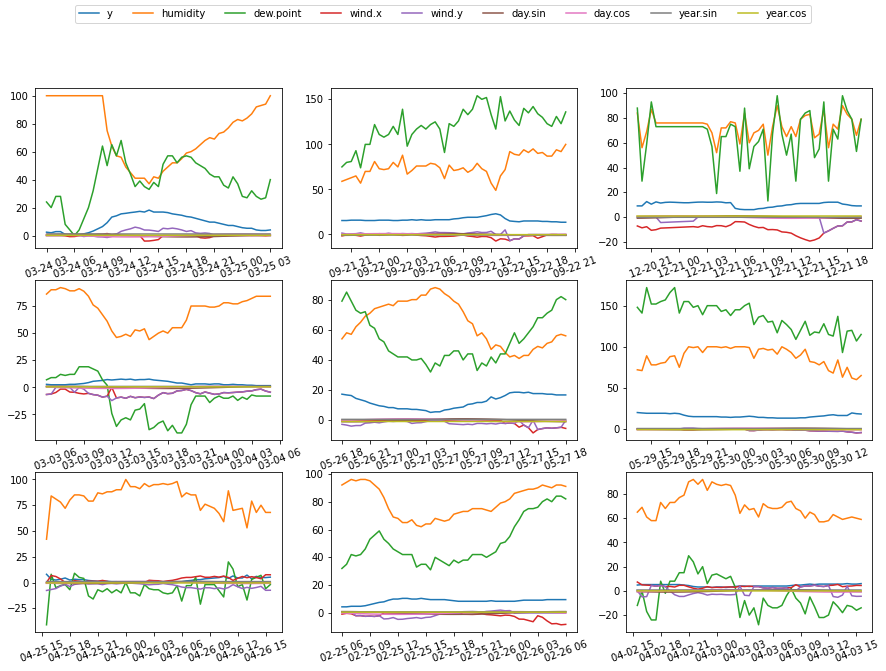

In [2]:
if 'google.colab' in str(get_ipython()):
    data_loc = "https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/data/CamMetPrepped2021.04.26.csv?raw=true"
else:
    data_loc = "../data/CamMetPrepped2021.04.26.csv"

df = pd.read_csv(data_loc, index_col=['ds'], parse_dates=['ds', 'ds.1'])
df.rename(columns={'ds.1': 'ds'}, inplace = True)
df_orig = df

print("Shape:")
print(df.shape)
print("\nInfo:")
print(df.info())
print("\nSummary stats:")
display(df.describe())
print("\nRaw data:")
display(df)
print("\n")


def plot_examples(data, x_var):
    """Plot 9 sets of observations in 3 * 3 matrix ..."""

    assert len(data) == 9

    cols = [col for col in data[0].columns if col != x_var]

    fig, axs = plt.subplots(3, 3, figsize = (15, 10))
    axs = axs.ravel()  # apl for the win :-)

    for i in range(9):
        for col in cols:
            axs[i].plot(data[i][x_var], data[i][col])
            axs[i].xaxis.set_tick_params(rotation = 20, labelsize = 10)
    
    fig.legend(cols, loc = 'upper center',  ncol = len(cols))
    
    return None


cols = ['ds', 'y', 'humidity', 'dew.point', #'pressure', 
        'wind.x', 'wind.y', 'day.sin', 'day.cos', 'year.sin', 'year.cos']
ex_plots = 9
hour_window = 24
starts = df.sample(n = ex_plots).index
p_data = [df.loc[starts[i]:starts[i] + datetime.timedelta(hours = hour_window), cols] 
          for i in range(ex_plots)]
plot_examples(p_data, 'ds')


### Data augmentation with mixup

Wind velocity vectors were clustered around the 45 degree increments. Data augmentation with the [mixup method](https://arxiv.org/abs/1710.09412) is carried out to counter this clustering.

From the [mixup paper](https://arxiv.org/abs/1710.09412): "mixup trains a neural network on convex combinations of pairs of examples and their labels".

Further details on how I apply the standard mixup technique to time series are included in the Window data section of my [keras_mlp_fcn_resnet_time_series notebook](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/keras_mlp_fcn_resnet_time_series.ipynb).

Here is a comparison of the improvement in wind velocity sparsity with standard mixup augmentation and a time series specific mixup.

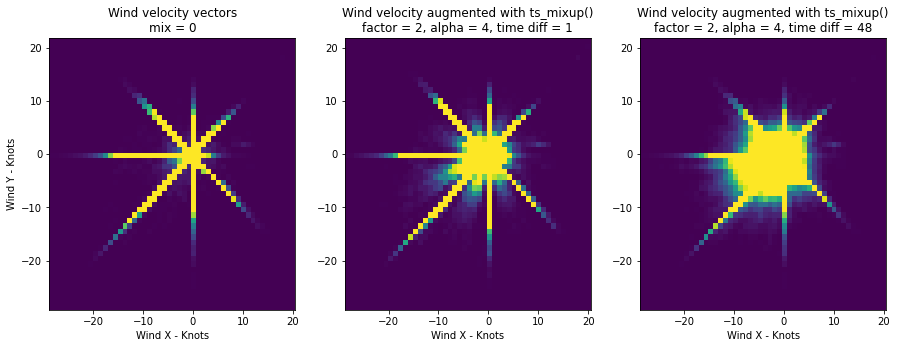

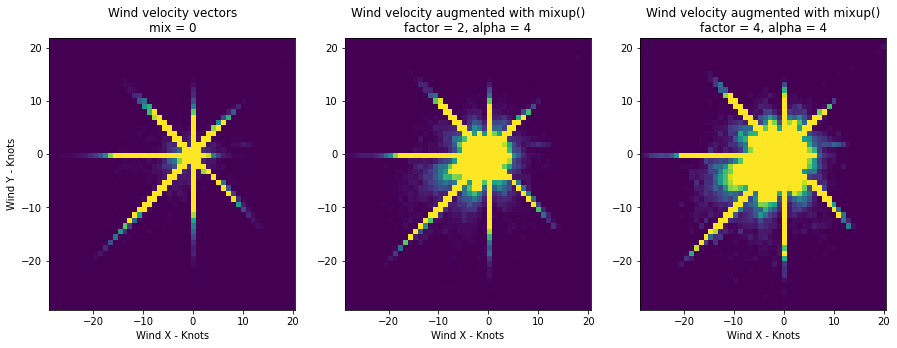

In [5]:
def mixup(data, alpha = 4.0, factor = 1):
    """Augment data with mixup method.

    Standard mixup is applied between randomly chosen observations

    Args:
      data      (pd.DataFrame):    data to run mixup on
      alpha     (float, optional): beta distribution parameter
      factor    (int, optional):   size of mixup dataset to return

    Returns:
      df (pd.DataFrame)

    Notes:
      Duplicates will be removed
      https://arxiv.org/abs/1710.09412
    """
    batch_size = len(data) - 1
    
    data['epoch'] = data.index.view(np.int64) // 10**9
    
    # random sample lambda value from beta distribution
    l   = np.random.beta(alpha, alpha, batch_size * factor)
    X_l = l.reshape(batch_size * factor, 1)
    
    # Get a pair of inputs and outputs
    y1  = data['y'].shift(-1).dropna()
    y1_ = pd.concat([y1] * factor)
    
    y2  = data['y'][0:batch_size]
    y2_ = pd.concat([y2] * factor)

    X1  = data.drop(columns='y', axis=1).shift(-1).dropna()
    X1_ = pd.concat([X1] * factor)
    
    X2  = data.drop(columns='y', axis=1)
    X2  = X2[0:batch_size]
    X2_ = pd.concat([X2] * factor)

    # Perform mixup
    X = X1_ * X_l + X2_ * (1 - X_l)
    y = y1_ * l   + y2_ * (1 - l)    
    
    df = pd.DataFrame(y).join(X)    
    df = data.append(df).sort_values('epoch', ascending = True)
    df = df.drop(columns='epoch', axis=1)
    
    df = df.drop_duplicates(keep = False)
    
    return df


def ts_mixup(data, alpha = 4.0, factor = 1, time_diff = 1):
    """Augment data with time series mixup method.

    Applies mixup technique to two time series separated by time_diff period.

    Args:
      data      (pd.DataFrame):    data to run mixup on
      alpha     (float, optional): beta distribution parameter
      factor    (int, optional):   size of mixup dataset to return
      time_diff (int, optional):   period between data subsets to run mixup on

    Returns:
      df (pd.DataFrame)

    Notes:
      Duplicates will be removed
      https://arxiv.org/abs/1710.09412
      Standard mixup is applied between randomly chosen observations
    """

    batch_size = len(data) - time_diff
    
    # Get a pair of inputs and outputs
    y1 = data['y'].shift(-time_diff).dropna()    
    y2 = data['y'][0:batch_size]

    X1 = data.drop(columns='y', axis=1).shift(-time_diff).dropna()    
    X2 = data.drop(columns='y', axis=1)
    X2 = X2[0:batch_size]

    df = data
    
    for i in range(factor):
      # random sample lambda value from beta distribution
      l   = np.random.beta(alpha, alpha, 1)
      X_l = np.repeat(l, batch_size).reshape(batch_size, 1)

      # Perform mixup  
      X = X1 * X_l + X2 * (1 - X_l)
      y = y1 * l   + y2 * (1 - l)  
    
      df_new = pd.DataFrame(y).join(X)
      idx_len = np.ceil((df.index[-1] - df.index[0]).days / 365.25)
      df_new.index = df_new.index + pd.offsets.DateOffset(years = idx_len)

      df = df.append(df_new).sort_index(ascending = True)
    
    df = df.drop_duplicates(keep = False)
    
    return df


def plot_wind_no_mixup(data, ax):
    """Plot wind vectors without mixup

    Args:
      data      (pd.DataFrame):    wind vector data to plot
      ax        (axes object):     matplotlib axes object for plot    
    """

    plt1 = ax.hist2d(data['wind.x'], data['wind.y'], bins = (50, 50), vmax = 400)
    ax.set_xlabel('Wind X - Knots')
    ax.set_ylabel('Wind Y - Knots')
    ax.set_title('Wind velocity vectors\nmix = 0');


def plot_wind_with_mixup(data, ax, mix_func, mix_factor, mix_alpha = 4, mix_td = 1):
    """Plot wind vectors with mixup

    Args:
      data       (pd.DataFrame):    wind vector data to plot
      ax         (axes object):     matplotlib axes object for plot
      mix_func   (function)         standard or time series mixup function
      mix_factor (int)              size of mixup dataset to return
      mix_alpha  (int, optional)    beta distribution parameter
      mix_td     (int, optional)    period between data subsets to run mixup on
    """
    title = 'Wind velocity augmented with {0:s}()\n'.format(mix_func)

    if mix_func == 'ts_mixup':
        df_mix = ts_mixup(data.loc[:, ['y', 'wind.x', 'wind.y']], 
                          factor = mix_factor,
                          alpha  = mix_alpha, 
                          time_diff = mix_td)
        title += 'factor = {0:d}, alpha = {1:d}, time diff = {2:d}'.format(mix_factor, mix_alpha, mix_td)
    elif mix_func == 'mixup':
        df_mix = mixup(data.loc[:, ['y', 'wind.x', 'wind.y']], 
                       factor = mix_factor,
                       alpha  = mix_alpha)
        title += 'factor = {0:d}, alpha = {1:d}'.format(mix_factor, mix_alpha)

    plt2 = ax.hist2d(df_mix['wind.x'], df_mix['wind.y'], bins = (50, 50), vmax = 400)
    ax.set_xlabel('Wind X - Knots')
    ax.set_title(title);
    # plt.colorbar(plt1, ax = ax3)  # TODO fixme


fig1, (ax11, ax12, ax13) = plt.subplots(1, 3, figsize = (15, 5))
plot_wind_no_mixup(df, ax11)
plot_wind_with_mixup(df, ax12, 'ts_mixup', 2, 4, 1)
plot_wind_with_mixup(df, ax13, 'ts_mixup', 2, 4, 48)

fig2, (ax21, ax22, ax23) = plt.subplots(1, 3, figsize = (15, 5))
plot_wind_no_mixup(df, ax21)
plot_wind_with_mixup(df, ax22, 'mixup', 2)
plot_wind_with_mixup(df, ax23, 'mixup', 4)

Mixup improves the categorical legacy of the wind velocity data. Unfortunately, if outliers are present their influence may be reinforced.  A priori it's difficult to say which mixup variant is preferable.

---

### Split data¶

I use data from 2018 for validation, 2019 for testing and the remaining data for training. These are entirely arbitrary choices. This results in an approximate 84%, 8%, 8% split for the training, validation, and test sets respectively.

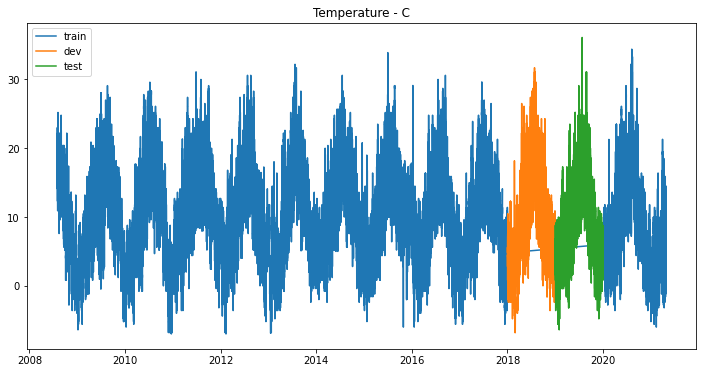

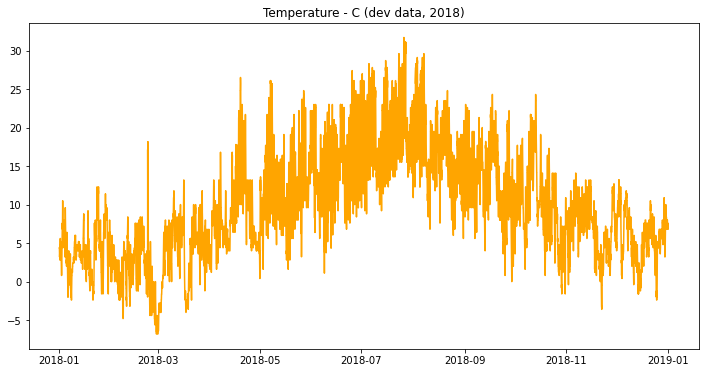

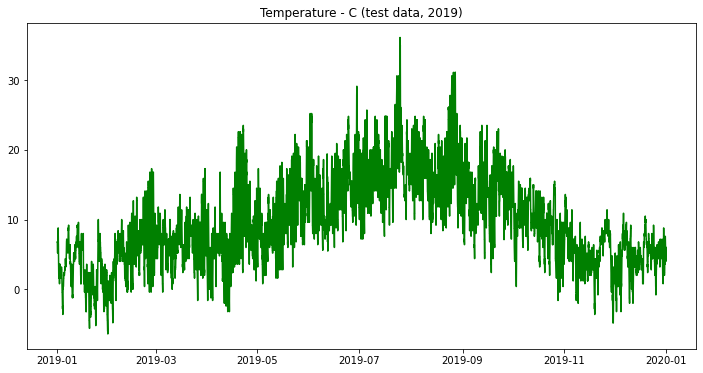

df.drop shape:  (223250, 10)
train shape:    (188210, 10)
valid shape:    (17520, 10)
test shape:     (17520, 10)


In [6]:
# keep_cols = ['y', 'humidity', 'dew.point', 'pressure', 'wind.x', 'wind.y',
#              'day.sin', 'day.cos', 'year.sin', 'year.cos', 'level', 'season1', 
#              'season2']

df['year'] = df['ds'].dt.year
train_df = df.loc[(df['year'] != 2018) & (df['year'] != 2019)]
valid_df = df.loc[df['year'] == 2018]
test_df  = df.loc[df['year'] == 2019]


plt.figure(figsize = (12, 6))
plt.plot(train_df.ds, train_df.y)
plt.plot(valid_df.ds, valid_df.y)
plt.plot(test_df.ds,  test_df.y)
plt.title('Temperature - C')
plt.legend(['train', 'dev', 'test'])
plt.show()

plt.figure(figsize = (12, 6))
plt.plot(valid_df.ds, valid_df.y, color='orange')
plt.title('Temperature - C (dev data, 2018)')
plt.show()

plt.figure(figsize = (12, 6))
plt.plot(test_df.ds, test_df.y, color='green')
plt.title('Temperature - C (test data, 2019)')
plt.show()


del_cols = ['ds', 'year', 'wind.speed.mean', 'wind.bearing.mean']
train_df = train_df.drop(del_cols, axis = 1)
valid_df = valid_df.drop(del_cols, axis = 1)
test_df  = test_df.drop(del_cols,  axis = 1)
df = df.drop(del_cols, axis = 1)

# ds = {}
models = {}
models['datasets'] = {}
models['datasets']['train'] = train_df
models['datasets']['valid'] = valid_df
models['datasets']['test']  = test_df

print("df.drop shape: ", df.shape)
print("train shape:   ", train_df.shape)
print("valid shape:   ", valid_df.shape)
print("test shape:    ", test_df.shape)


---

### Normalise data

Features should be scaled before neural network training. Arguably, scaling should be done using moving averages to avoid accessing future values.
Instead, simple [standard score](https://en.wikipedia.org/wiki/Standard_score) normalisation will be used.

Create [violin plot](https://en.wikipedia.org/wiki/Violin_plot) to see distribution of features.

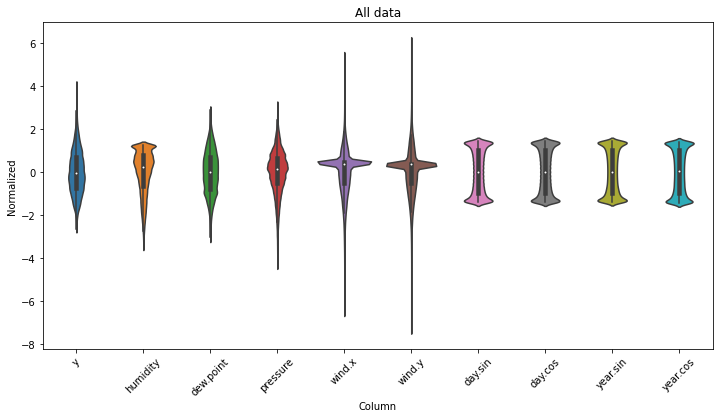

In [7]:

# For later use
def inv_transform(scaler, data, colName, colNames):
    """An inverse scaler for use in model validation section
    
    See https://stackoverflow.com/a/62170887/100129"""

    dummy = pd.DataFrame(np.zeros((len(data), len(colNames))), columns=colNames)
    dummy[colName] = data
    dummy = pd.DataFrame(scaler.inverse_transform(dummy), columns=colNames)
    
    return dummy[colName].values


scaler = StandardScaler()
scaler.fit(train_df)

train_df[train_df.columns] = scaler.transform(train_df[train_df.columns] )
valid_df[valid_df.columns] = scaler.transform(valid_df[valid_df.columns] )
test_df[test_df.columns]   = scaler.transform(test_df[test_df.columns] )

df_std = scaler.transform(df)
df_std = pd.DataFrame(df_std)
df_std = df_std.melt(var_name = 'Column', value_name = 'Normalized')

plt.figure(figsize=(12, 6))
ax = sns.violinplot(x = 'Column', y = 'Normalized', data = df_std)
ax.set_xticklabels(df.keys(), rotation = 45)
ax.set_title('All data');

Some features have long tails but there are no glaring errors.

---

### Window data

Models are trained using sliding windows of samples from the data.

Window parameters to consider for the 
[tf.keras.preprocessing.timeseries_dataset_from_array](https://keras.io/api/preprocessing/timeseries/#timeseries-data-preprocessing) 
function:
 * sequence_length:
   * Length of the output sequences (in number of timesteps), or number of **lag** observations to use
 * sequence_stride:
   * Period between successive output sequences
   * For stride s, output samples start at index data[i], data[i + s], data[i + 2 * s] etc
   * s can include an **offset** and/or 1 or more **steps ahead** to forecast
 * batch_size:
   * Number of samples in each batch
 * shuffle:
   * Shuffle output samples, or use chronological order

Initial values used:
 * sequence_length (aka lags): 24 (corresponds to 12 hours)
 * steps ahead (what to forecast): 
   *  1 - 30 mins
   *  4 - 30 mins, 60 mins, 90 mins and 120 mins
   * 48 - 30 mins, 60 mins ... 1,410 mins and 1,440 mins
 * offset (space between lags and steps ahead): 0
 * batch_size: 32
 * shuffle: True for training data

The `make_dataset` function below generates [tensorflow datasets](https://www.tensorflow.org/api_docs/python/tf/data/Dataset) for:
 * Lags, steps-ahead, offset, batch size and shuffle
 * Optionally multiple y columns (Not extensively tested)
 
Stride is used to specify offset + steps-ahead. Offset will be 0 throughout this notebook.

**TODO** Insert figure illustrating lags, offsets and steps-ahead.

`shuffle = True` is used with train data. `shuffle = False` is used with validation and test data so the residuals can be checked for heteroscadicity.

Throughout this notebook I use a shorthand notation to describe lags and strides. For example:
 * 24l_1s_2m is 24 lags, 1 step ahead, 2 times mixup
 * 24l_4s_2m is 24 lags, 4 steps ahead, 2 times mixup

#### Mixup data augmentation

Data augmentation with 
[mixup: Beyond Empirical Risk Minimization](https://arxiv.org/abs/1710.09412)
by Zhang _et al_ is used to help counter the categorical legacy from the wind bearing variable. Simple 'input mixup' is used as opposed to the batch-based mixup Zhang _et al_ focus on. Input mixup has the advantage that it can be used with non-neural network methods. With current settings these datasets are approximately 3 times larger but this can be varied. Three times more training data is manageable on Colab in terms of both training time and memory usage. Test and validation data is left unmodified.

I apply mixup between consecutive observations in the time series instead of the usual random observations. This is a fairly conservative starting point. I'd be surprised if applying mixup between consecutive days of measurements didn't give better results. Applying mixup between inputs with equal temperature values will not improve performance and will increase run time.

I don't show it in this notebook, but adding this data augmentation makes a significant difference to loss values (for all model architectures considered). For example, here are results for a multi-layer perceptron (MLP) with 24 largs, 1 step ahead, 20 epochs on both less data and less thoroughly cleaned data.

|Augmentation    |	Train rmse |	Train mae |	Valid rmse |	Valid mae |
|----------------|-------------|------------|------------|------------|
|No augmentation |	0.0058     |	0.053     |	0.0054     |	0.052     |
|Input mixup     |	0.0016     |	0.025     |	0.0015     |	0.025     |

See this [commit](https://github.com/makeyourownmaker/CambridgeTemperatureModel/blob/93c754d4b1b02e1bd8f827a6f6edc145824f6d23/notebooks/keras_mlp_fcn_resnet_time_series.ipynb) 
for results from other architectures with and without 'input mixup'.

---

Setup functions for creating windowed datasets.

In [8]:
def make_dataset(dataset_params, data):  
    assert dataset_params['stride'] >= dataset_params['steps_ahead']
    y_cols = dataset_params['ycols']

    total_window_size = dataset_params['lags'] + dataset_params['stride']

    data = data.drop(columns='epoch', axis = 1, errors = 'ignore')

    if dataset_params['mix_factor'] != 0:
      if dataset_params['mix_type'] == 'ts':
        data_mix = ts_mixup(data,
                            alpha     = dataset_params['mix_alpha'],
                            factor    = dataset_params['mix_factor'],
                            time_diff = dataset_params['mix_diff'])
      else:
        data_mix = mixup(data,
                         alpha  = dataset_params['mix_alpha'],
                         factor = dataset_params['mix_factor'])
    else:
      data_mix = data

    data_mix = data_mix.drop(columns='epoch', axis = 1, errors = 'ignore')
    data_np  = np.array(data_mix, dtype = np.float32)
        
    ds = tf.keras.preprocessing.timeseries_dataset_from_array(
               data    = data_np,
               targets = None,
               sequence_length = total_window_size,
               sequence_stride = 1,
               shuffle    = dataset_params['shuffle'],
               batch_size = dataset_params['bs'])
      
    col_indices = {name: i for i, name in enumerate(data.columns)}
    X_slice = slice(0, dataset_params['lags'])
    y_start = total_window_size - dataset_params['steps_ahead']
    y_slice = slice(y_start, None)


    def split_window(features):
      X = features[:, X_slice, :]
      y = features[:, y_slice, :]

      # X = tf.stack([X[:, :, col_indices[name]] for name in data.columns],
      #              axis = -1)    
      y = tf.stack([y[:, :, col_indices[name]] for name in y_cols], 
                   axis = -1)

      # Slicing doesn't preserve static shape info, so set the shapes manually.
      # This way the `tf.data.Datasets` are easier to inspect.
      X.set_shape([None, dataset_params['lags'],        None])
      y.set_shape([None, dataset_params['steps_ahead'], None])

      return X, y


    ds = ds.map(split_window)

    return ds   


def get_model_name(models, ds_name_params):      
    cols = models['datasets']['train'].loc[:, ds_name_params['xcols']].columns

    suffix = "_{0:d}l_{1:d}s".format(ds_name_params['lags'], 
                                     ds_name_params['steps_ahead'])
    
    suffix += "_{0:d}bs".format(ds_name_params['bs'])
    suffix += "_{0:d}fm".format(ds_name_params['feat_maps'])

    if ds_name_params['filters'] != 0:
      suffix += "_{0:d}f".format(ds_name_params['filters'])

    if ds_name_params['kern_size'] != 0:
      suffix += "_{0:d}ks".format(ds_name_params['kern_size'])

    if ds_name_params['mix_factor'] > 0:
      suffix += "_{0:d}m".format(ds_name_params['mix_factor'])
      suffix += "_{0:d}a".format(ds_name_params['mix_alpha'])
      if ds_name_params['mix_type'] == 'ts':
        suffix += "_{0:d}td".format(ds_name_params['mix_diff'])
      if ds_name_params['mix_type'] == 'input':
        suffix += '_im'

    if 'level' in  cols and 'season1' in cols and 'season2' in cols:
      suffix += '_tbats'

    if ds_name_params['drop_out'] != 0.0:
      suffix += "_{0:.2E}do".format(ds_name_params['drop_out'])

    if ds_name_params['kern_reg'] != 0.0:
      suffix += "_{0:.2E}kr".format(ds_name_params['kern_reg'])

    if ds_name_params['recu_reg'] != 0.0:
      suffix += "_{0:.2E}rr".format(ds_name_params['recu_reg'])

    if len(ds_name_params['ycols']) > 1:
      suffix += "_{0:d}y".format(len(ds_name_params['ycols']))

    return ds_name_params['model_type'] + suffix


def make_datasets(models, datasets_params):

    train_data = models['datasets']['train'].loc[:, datasets_params['xcols']]
    valid_data = models['datasets']['valid'].loc[:, datasets_params['xcols']]
    test_data  = models['datasets']['test'].loc[:,  datasets_params['xcols']]

    orig_mix = datasets_params['mix_factor']
    ds_train   = make_dataset(datasets_params, train_data)

    datasets_params['shuffle']    = False
    datasets_params['mix_factor'] = 0
    ds_valid   = make_dataset(datasets_params, valid_data)

    ds_test   = make_dataset(datasets_params, test_data)
    datasets_params['mix_factor'] = orig_mix
    
    return [ds_train, ds_valid, ds_test]


def dataset_sanity_checks(data, name):    
    print(name, "batches: ", data.cardinality().numpy())
    for batch in data.take(1):
        print("\tX (batch_size, time, features): ", batch[0].shape)
        print("\ty (batch_size, time, features): ", batch[1].shape)
        print("\tX[0][0]: ", batch[0][0])
        print("\ty[0][0]: ", batch[1][0])


def plot_dataset_examples(dataset):
    fig, axs = plt.subplots(3, 3, figsize = (15, 10))
    axs = axs.ravel()
    cols = 0

    for batch in dataset.take(1):
        for i in range(9):
          x = batch[0][i].numpy()
          cols = x.shape[1]
          axs[i].plot(x)

    fig.legend(range(1, cols+1), loc = 'upper center',  ncol = cols+1);


def_cols = ['y', 'humidity', 'dew.point', 'pressure', 'wind.x', 'wind.y', \
            'day.sin', 'day.cos', 'year.sin', 'year.cos']  # def for default


---

## CNN Model Building

Convolutional Neural Networks, or [CNNs](https://en.wikipedia.org/wiki/Convolutional_neural_network), use [convolution](https://en.wikipedia.org/wiki/Convolution) kernels or filters that slide along input features to provide responses known as feature maps.  CNNs assemble hierarchical patterns of increasing complexity starting with smaller and simpler patterns from their filters.

CNNs are frequently applied to analyse visual imagery.  A [spatial convolution](https://keras.io/api/layers/convolution_layers/convolution2d/) can be performed over multi-variate time series observations, and a 1-dimensional [temporal convolution](https://keras.io/api/layers/convolution_layers/convolution1d/) can be applied to vector data.

**TODO** Include basic CNN diagram

The following are a few points I consider when building these CNN models.

Forecast horizons:
  * next 30 mins - 1 step ahead
  * next 24 hours - 48 steps ahead
  * horizon is abbreviated to `h` in the interrim results tables **TODO** Check me

Metrics:
 * mse - mean squared error
   * mse used for loss function to avoid potential problems with infinite values from the square root function
   * rmse - root mean squared error is used for comparison with baselines
   * Huber loss may be worth exploring in the future if outliers remain an issue
 * mae - median absolute error
 * mape - mean absolute percentage error 
   * Not used - mape fails when values, like temperature, become zero

Model enhancements:
 * mixup?
   * input mixup
   * time series mixup
 * test time augmentation?
   * uses data augmentation at the inference stage to improve forecasts
     * 5 forecasts were produced using mixup and then averaged
   * there was a marginal improvement
   * this may be worth trying again
   * as this notebook is getting quite long I've removed the test time augmentation work
     * still available in [this commit](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/commit/8266ad70034fa6e5864ab26b488284da557d996c)   


Parameters to consider optimising:
 * Learning rate - use LRFinder :-)
 * Optimiser - stick with Adam
 * Shuffle - true for training
 * batch size - 16, 32, 64 ...
 * Number of feature maps
   * 8, 16, 32 ...
 * mixup
   * factor - 1, 2, 3, 4, 5
   * alpha - 4
   * time series mixup:
     * time diff - 1, ..., 48
       * period between 2 data subsets to run mixup on
 * dropout
   * ...
 * epochs
   * training shows quite fast convergence so epochs is initially kept quite low (5 or 10)


Model architectures to consider:
 * Conv1D
   * ...
 * Conv2D
   * ...
 * Multi-head
   * ...
 * Inception-style?
   * ...


---


### Learning rate finder

Leslie Smith was one of the first people to work on finding optimal learning rates for deep learning networks in [Cyclical Learning Rates for Training Neural Networks](https://arxiv.org/abs/1506.01186). Jeremy Howard from [fast.ai](https://www.fast.ai/) popularised the learning rate finder used here.

Before building any models, I use a modified version of [Pavel Surmenok's Keras learning rate finder](https://github.com/surmenok/keras_lr_finder) to get reasonably close to the optimal learning rate. It's a single small class which I add support for tensorflow datasets to, customise the graphics and add a simple summary function to.

The learning rate finder parameters may benefit from some per-architecture tuning.  It's advisable to find a reasonable start_lr value by trying several values which differ by order of magnitude, i.e. 1e-3, 1e-4, 1e-5 etc.  It's then worthwhile to use the learning rate finder for fine tuning.

Setup learning rate finder class for later usage:

In [9]:
from keras.callbacks import LambdaCallback
import keras.backend as K


class LRFinder:
    """
    Plots the change of the loss function of a Keras model when the learning rate is exponentially increasing.
    See for details:
    https://towardsdatascience.com/estimating-optimal-learning-rate-for-a-deep-neural-network-ce32f2556ce0
    """

    def __init__(self, model):
        self.model  = model
        self.losses = []
        self.lrs    = []
        self.best_lr   = 0.001
        self.best_loss = 1e9


    def on_batch_end(self, batch, logs):
        # Log the learning rate
        lr = K.get_value(self.model.optimizer.lr)
        self.lrs.append(lr)

        # Log the loss
        loss = logs['loss']
        self.losses.append(loss)

        # Check whether the loss got too large or NaN
        if batch > 5 and (math.isnan(loss) or loss > self.best_loss * 4):
            self.model.stop_training = True
            return

        if loss < self.best_loss:
            self.best_loss = loss

        # Increase the learning rate for the next batch
        lr *= self.lr_mult
        K.set_value(self.model.optimizer.lr, lr)


    def find_ds(self, train_ds, start_lr, end_lr, batch_size=64, epochs=1, **kw_fit):
        # If x_train contains data for multiple inputs, use length of the first input.
        # Assumption: the first element in the list is single input; NOT a list of inputs.
        # N = x_train[0].shape[0] if isinstance(x_train, list) else x_train.shape[0]
        N = train_ds.cardinality().numpy()

        # Compute number of batches and LR multiplier
        num_batches = epochs * N / batch_size
        self.lr_mult = (float(end_lr) / float(start_lr)) ** (float(1) / float(num_batches))
        # Save weights into a file
        initial_weights = self.model.get_weights()

        # Remember the original learning rate
        original_lr = K.get_value(self.model.optimizer.lr)

        # Set the initial learning rate
        K.set_value(self.model.optimizer.lr, start_lr)

        callback = LambdaCallback(on_batch_end=lambda batch, logs: self.on_batch_end(batch, logs))

        self.model.fit(train_ds,
                       batch_size=batch_size, epochs=epochs,
                       callbacks=[callback],
                       **kw_fit)

        # Restore the weights to the state before model fitting
        self.model.set_weights(initial_weights)

        # Restore the original learning rate
        K.set_value(self.model.optimizer.lr, original_lr)


    def plot_loss(self, axs, sma, n_skip_beginning, n_skip_end, x_scale='log'):
        """
        Plot the loss.

        Parameters:
            n_skip_beginning - number of batches to skip on the left
            n_skip_end - number of batches to skip on the right
        """
        lrs = self.lrs[n_skip_beginning:-n_skip_end]
        losses = self.losses[n_skip_beginning:-n_skip_end]
        best_lr = self.get_best_lr(sma, n_skip_beginning, n_skip_end)

        axs[0].set_ylabel("loss")
        axs[0].set_xlabel("learning rate (log scale)")
        axs[0].plot(lrs, losses)
        axs[0].vlines(best_lr, np.min(losses), np.max(losses), linestyles='dashed')
        axs[0].set_xscale(x_scale)


    def plot_loss_change(self, axs, sma, n_skip_beginning, n_skip_end, y_lim=None):
        """
        Plot rate of change of the loss function.

        Parameters:
            axs - subplot axes
            sma - number of batches for simple moving average to smooth out the curve
            n_skip_beginning - number of batches to skip on the left
            n_skip_end - number of batches to skip on the right
            y_lim - limits for the y axis
        """
        derivatives = self.get_derivatives(sma)[n_skip_beginning:-n_skip_end]
        lrs = self.lrs[n_skip_beginning:-n_skip_end]
        best_lr = self.get_best_lr(sma, n_skip_beginning, n_skip_end)
        y_min, y_max = np.min(derivatives), np.max(derivatives)
        x_min, x_max = np.min(lrs), np.max(lrs)

        axs[1].set_ylabel("rate of loss change")
        axs[1].set_xlabel("learning rate (log scale)")
        axs[1].plot(lrs, derivatives)
        axs[1].vlines(best_lr, y_min, y_max, linestyles='dashed')
        axs[1].hlines(0, x_min, x_max, linestyles='dashed')
        axs[1].set_xscale('log')
        if y_lim == None:
            axs[1].set_ylim([y_min, y_max])
        else:
            axs[1].set_ylim(y_lim)


    def get_derivatives(self, sma):
        assert sma >= 1
        derivatives = [0] * sma
        for i in range(sma, len(self.lrs)):
            derivatives.append((self.losses[i] - self.losses[i - sma]) / sma)
            
        return derivatives


    def get_best_lr(self, sma, n_skip_beginning, n_skip_end):
        derivatives = self.get_derivatives(sma)
        best_der_idx = np.argmin(derivatives[n_skip_beginning:-n_skip_end])
        #print("sma:", sma)
        #print("n_skip_beginning:", n_skip_beginning)
        #print("n_skip_end:", n_skip_end)
        #print("best_der_idx:", best_der_idx)
        #print("len(derivatives):", len(derivatives))
        #print("derivatives:", derivatives)
        return self.lrs[n_skip_beginning:-n_skip_end][best_der_idx]


    def summarise_lr(self, train_ds, start_lr, end_lr, batch_size=32, epochs=1, sma=1, n_skip_beginning=200, **kw_fit):
        self.find_ds(train_ds, start_lr, end_lr, batch_size, epochs)
        #print("sma:", sma)
        #print("n_skip_beginning:", n_skip_beginning)
        fig, axs = plt.subplots(1, 2, figsize = (9, 6), tight_layout = True)
        axs = axs.ravel()
        self.plot_loss(axs, sma, n_skip_beginning=n_skip_beginning, n_skip_end=5)
        self.plot_loss_change(axs, sma=sma, n_skip_beginning=n_skip_beginning, n_skip_end=5)
        plt.show()

        best_lr = self.get_best_lr(sma=sma, n_skip_beginning=n_skip_beginning, n_skip_end=5)
        print("best lr:", best_lr, "\n")

        self.best_lr = best_lr


def run_lrf(models, params):
    model_name = get_model_name(models, params)

    train_data = models[model_name]['train']
    model = models[model_name]['model']
    model.compile(loss = 'mse', metrics = ['mae'])
    lrf_inner = LRFinder(model)
    lrf_inner.summarise_lr(train_data, *params['lrf_params'])

    return lrf_inner


# lrf_params = [0.0003, 10, 32, 5, 100, 25]  # 0.0003 too high
lrf_params = [0.000001, 10, 32, 5, 100, 25]



---

Next, define CNN and other network architectures:  

 * `build_conv1d_dense_model`
 * `build_multihead_conv1d_lstm_model`
 * `build_multihead_conv1d_dense_model`
 * `build_conv2d_dense_model`
 * ...


In [10]:
def get_io_shapes(data):
    for batch in data.take(1):
        in_shape  = batch[0][0].shape
        out_shape = batch[1][0].shape
        
    return in_shape, out_shape


def build_vanilla_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    lstm = Sequential(name = model_name)
    lstm.add(InputLayer(input_shape = in_shape))

    if drop_out != 0.0:
      lstm.add(Dropout(drop_out))

    # Shape [batch, time, features] => [batch, feat_maps]
    lstm.add(LSTM(feat_maps, 
                  return_sequences = False,
                  kernel_regularizer = regularizers.l2(kern_reg),
                  recurrent_regularizer = regularizers.l2(recu_reg)))

    if drop_out != 0.0:
      lstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      lstm.add(Dense(out_steps * out_feats,
                     kernel_constraint = maxnorm(3)))
    else:
      # Shape => [batch, out_steps * out_feats]
      lstm.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      lstm.add(Reshape([out_steps, out_feats]))

    return lstm


def build_stacked_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    lstm = Sequential(name = model_name)
    lstm.add(InputLayer(input_shape = in_shape))

    #if drop_out != 0.0:
    #  lstm.add(Dropout(drop_out))

    # Shape [batch, time, features] => [batch, feat_maps]
    lstm.add(LSTM(feat_maps, 
                  return_sequences = True,
                  kernel_regularizer = regularizers.l2(kern_reg),
                  recurrent_regularizer = regularizers.l2(recu_reg)))

    lstm.add(LSTM(feat_maps, 
                  return_sequences = False,
                  kernel_regularizer = regularizers.l2(kern_reg),
                  recurrent_regularizer = regularizers.l2(recu_reg)))
    
    #lstm.add(Flatten())
    if drop_out != 0.0:
      lstm.add(Dropout(drop_out))

    lstm.add(Dense(feat_maps,
                   activation = 'relu',
                   kernel_regularizer = regularizers.l2(kern_reg)))
    
    #if drop_out != 0.0:
    #  lstm.add(Dropout(drop_out))

    lstm.add(Dense(int(feat_maps / 2),
                   activation = 'relu',
                   kernel_regularizer = regularizers.l2(kern_reg)))

    if drop_out != 0.0:
      #lstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      lstm.add(Dense(out_steps * out_feats,
                     kernel_constraint = maxnorm(3),
                     kernel_regularizer = regularizers.l2(kern_reg)))
    else:
      # Shape => [batch, out_steps * out_feats]
      lstm.add(Dense(out_steps * out_feats,
                     kernel_regularizer = regularizers.l2(kern_reg)))
    
    #if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      #lstm.add(Reshape([out_steps, out_feats]))

    return lstm


def build_bidirectional_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    lstm = Sequential(name = model_name)
    lstm.add(InputLayer(input_shape = in_shape))

    #if drop_out != 0.0:
    #  lstm.add(Dropout(drop_out))

    # Shape [batch, time, features] => [batch, feat_maps]
    lstm.add(Bidirectional(LSTM(feat_maps, 
                                return_sequences = True,
                                kernel_regularizer = regularizers.l2(kern_reg),
                                recurrent_regularizer = regularizers.l2(recu_reg))))
    
    lstm.add(Bidirectional(LSTM(feat_maps, 
                                return_sequences = False,
                                kernel_regularizer = regularizers.l2(kern_reg),
                                recurrent_regularizer = regularizers.l2(recu_reg))))

    #if drop_out != 0.0:
    #  lstm.add(Dropout(drop_out))

    lstm.add(Dense(feat_maps,
                   activation = 'relu',
                   kernel_regularizer = regularizers.l2(kern_reg)))

    lstm.add(Dense(int(feat_maps / 2),
                   activation = 'relu',
                   kernel_regularizer = regularizers.l2(kern_reg)))

    # Shape => [batch, out_steps]
    lstm.add(Dense(out_steps))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      lstm.add(Reshape([out_steps, out_feats]))

    return lstm


def build_conv1d_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']
    filters   = params['filters']
    kern_size = params['kern_size']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    cnnlstm = Sequential(name = model_name)
    cnnlstm.add(InputLayer(input_shape = in_shape))

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))

    cnnlstm.add(Conv1D(filters = filters, 
                       activation = 'relu',
                       kernel_size = int(kern_size)))  #, input_shape=(n_timesteps,n_features)))
    cnnlstm.add(MaxPooling1D(pool_size = 2))

    # Shape [batch, time, features] => [batch, feat_maps]
    cnnlstm.add(LSTM(feat_maps, 
                     return_sequences = False,
                     kernel_regularizer = regularizers.l2(kern_reg),
                     recurrent_regularizer = regularizers.l2(recu_reg)))
    
    cnnlstm.add(Dense(feat_maps,
                      activation = 'relu',
                      kernel_regularizer = regularizers.l2(kern_reg)))

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      cnnlstm.add(Dense(out_steps * out_feats,
                        kernel_constraint = maxnorm(3)))
    else:
      cnnlstm.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      cnnlstm.add(Reshape([out_steps, out_feats]))

    return cnnlstm


def build_conv1d_dense_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    filters   = params['filters']
    kern_size = params['kern_size']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    cnnlstm = Sequential(name = model_name)
    cnnlstm.add(InputLayer(input_shape = in_shape))

 #   if drop_out != 0.0:
 #     cnnlstm.add(Dropout(drop_out))

    cnnlstm.add(Conv1D(filters = filters, 
                       activation = 'relu',
                       kernel_size = int(kern_size)))  #, input_shape=(n_timesteps,n_features)))
    cnnlstm.add(MaxPooling1D(pool_size = 2))

    cnnlstm.add(Flatten())

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))

    # Shape [batch, time, features] => [batch, feat_maps]
    cnnlstm.add(Dense(feat_maps, 
                      activation = 'relu',
                      kernel_regularizer = regularizers.l2(kern_reg)))
    
    cnnlstm.add(Dense(int(feat_maps / 2), 
                      activation = 'relu',
                      kernel_regularizer = regularizers.l2(kern_reg)))

    #cnnlstm.add(Dense(int(feat_maps / 2), 
    #                  activation = 'relu',
    #                  kernel_regularizer = regularizers.l2(kern_reg)))

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      cnnlstm.add(Dense(out_steps * out_feats,
                        kernel_constraint = maxnorm(3)))
    else:
      cnnlstm.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      cnnlstm.add(Reshape([out_steps, out_feats]))

    return cnnlstm


def build_stacked_conv1d_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']
    filters   = params['filters']
    kern_size = params['kern_size']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    cnnlstm = Sequential(name = model_name)
    cnnlstm.add(InputLayer(input_shape = in_shape))

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))

    cnnlstm.add(Conv1D(filters = filters, 
                       kernel_size = kern_size, 
                       activation = 'relu'))  #, input_shape=(n_timesteps,n_features)))
    cnnlstm.add(MaxPooling1D(pool_size = 2))

    cnnlstm.add(Conv1D(filters = filters, 
                       kernel_size = kern_size + 2, 
                       activation = 'relu'))
    cnnlstm.add(MaxPooling1D(pool_size = 2))

    # Shape [batch, time, features] => [batch, feat_maps]
    cnnlstm.add(LSTM(feat_maps, 
                     return_sequences = True,
                     kernel_regularizer = regularizers.l2(kern_reg),
                     recurrent_regularizer = regularizers.l2(recu_reg)))

    cnnlstm.add(LSTM(int(feat_maps / 2), 
                     return_sequences = False,
                     kernel_regularizer = regularizers.l2(kern_reg),
                     recurrent_regularizer = regularizers.l2(recu_reg)))

    if drop_out != 0.0:
      cnnlstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      cnnlstm.add(Dense(out_steps * out_feats,
                        kernel_constraint = maxnorm(3)))
    else:
      cnnlstm.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      cnnlstm.add(Reshape([out_steps, out_feats]))

    return cnnlstm


def build_multihead_conv1d_lstm_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    recu_reg  = params['recu_reg']
    filters   = params['filters']
    kern_size = params['kern_size']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    # inputs
    inputs1 = Input(shape = in_shape)

    # head 1    
    conv1 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 2 + 1, 
                   activation = 'relu')(inputs1)
    drop1 = Dropout(drop_out)(conv1)
    pool1 = MaxPooling1D(pool_size = 2)(drop1)
    flat1 = Flatten()(pool1)
   
	  # head 2
    conv2 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 3 + 1, 
                   activation = 'relu')(inputs1)
    drop2 = Dropout(drop_out)(conv2)
    pool2 = MaxPooling1D(pool_size = 2)(drop2)
    flat2 = Flatten()(pool2)
   
	  # head 3
    conv3 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 4 + 1, 
                   activation = 'relu')(inputs1)
    drop3 = Dropout(drop_out)(conv3)
    pool3 = MaxPooling1D(pool_size = 2)(drop3)
    flat3 = Flatten()(pool3)
   
	  # merge
    merged = concatenate([flat1, flat2, flat3])
    merged_r = Reshape((-1, 1))(merged)
   
	  # interpretation
    lstm1 = LSTM(feat_maps, 
                 return_sequences = False,
                 kernel_regularizer = regularizers.l2(kern_reg),
                 recurrent_regularizer = regularizers.l2(recu_reg))(merged_r)
    outputs = Dense(out_steps * out_feats)(lstm1)

    model = Model(inputs = inputs1, outputs = outputs, name = model_name)

    return model


def build_multihead_conv1d_dense_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    filters   = params['filters']
    kern_size = int(params['kern_size'])  # skopt tuple conversion probs

    #print("kern_size:", kern_size)

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    # inputs
    inputs1 = Input(shape = in_shape)

    # head 1    
    conv1 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 2 + 1, 
                   activation = 'relu')(inputs1)
    drop1 = Dropout(drop_out)(conv1)
    pool1 = MaxPooling1D(pool_size = 2)(drop1)
    flat1 = Flatten()(pool1)
   
	  # head 2
    conv2 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 3 + 1, 
                   activation = 'relu')(inputs1)
    drop2 = Dropout(drop_out)(conv2)
    pool2 = MaxPooling1D(pool_size = 2)(drop2)
    flat2 = Flatten()(pool2)
   
	  # head 3
    conv3 = Conv1D(filters = filters, 
                   kernel_size = kern_size * 4 + 1, 
                   activation = 'relu')(inputs1)
    drop3 = Dropout(drop_out)(conv3)
    pool3 = MaxPooling1D(pool_size = 2)(drop3)
    flat3 = Flatten()(pool3)
   
	  # merge
    merged = concatenate([flat1, flat2, flat3])
   
	  # interpretation
    if drop_out != 0.0:
      dense1  = Dense(feat_maps, 
                      activation = 'relu',
                      kernel_constraint = maxnorm(3))(merged)
      dense2  = Dense(int(feat_maps / 2), 
                      activation = 'relu',
                      kernel_constraint = maxnorm(3))(dense1)
      outputs = Dense(out_steps * out_feats,
                      kernel_constraint = maxnorm(3))(dense2)
    else:
      dense1  = Dense(feat_maps, activation = 'relu')(merged)
      dense2  = Dense(int(feat_maps / 2), activation = 'relu')(dense1)
      outputs = Dense(out_steps * out_feats)(dense2)

    model = Model(inputs = inputs1, outputs = outputs, name = model_name)

    return model


def build_conv2d_dense_model(models, params):
    model_name = get_model_name(models, params)
    data = models[model_name]['train']
    in_shape, out_shape = get_io_shapes(data)
    out_steps = out_shape[0]

    feat_maps = params['feat_maps']
    drop_out  = params['drop_out']
    kern_reg  = params['kern_reg']
    filters   = params['filters']
    kern_size = params['kern_size']

    if len(out_shape) == 2:
      out_feats = out_shape[1]
    else:
      out_feats = 1

    conv2dlstm = Sequential(name = model_name)
    conv2dlstm.add(InputLayer(input_shape = in_shape))

    if drop_out != 0.0:
      conv2dlstm.add(Dropout(drop_out))

    conv2dlstm.add(Reshape((in_shape[0], in_shape[1], 1)))
    #conv2dlstm.add(Reshape((in_shape, 1)))
    #conv2dlstm.add(Reshape((-1, 1)))

    conv2dlstm.add(Conv2D(filters = filters, 
                          kernel_size = (1, kern_size),
                          padding = 'same', 
                          activation = 'relu'))  #, input_shape=(n_timesteps,n_features)))
    conv2dlstm.add(Flatten())
    #conv2dlstm.add(MaxPooling2D(pool_size = (2, 2)))

    if drop_out != 0.0:
      conv2dlstm.add(Dropout(drop_out))

    conv2dlstm.add(Dense(feat_maps, 
                         activation = 'relu',
                         kernel_regularizer = regularizers.l2(kern_reg)))
    conv2dlstm.add(Dense(int(feat_maps / 2), 
                         activation = 'relu',
                         kernel_regularizer = regularizers.l2(kern_reg)))

    # Shape [batch, time, features] => [batch, feat_maps]
    #conv2dlstm.add(LSTM(feat_maps, 
    #                 return_sequences = True,
    #                 kernel_regularizer = regularizers.l2(kern_reg),
    #                 recurrent_regularizer = regularizers.l2(recu_reg)))

    if drop_out != 0.0:
      conv2dlstm.add(Dropout(drop_out))
      # Shape => [batch, out_steps * out_feats]
      conv2dlstm.add(Dense(out_steps * out_feats,
                           kernel_constraint = maxnorm(3)))
    else:
      conv2dlstm.add(Dense(out_steps * out_feats))
    
    if len(out_shape) == 2:
      # Shape => [batch, out_steps, features].
      conv2dlstm.add(Reshape([out_steps, out_feats]))

    return conv2dlstm


def get_model(models, params):
    if params['model_type'] == 'lstm':
      model = build_vanilla_lstm_model(models, params)
    elif params['model_type'] == 's_lstm':
      model = build_stacked_lstm_model(models, params)
    elif params['model_type'] == 'b_lstm': 
      model = build_bidirectional_lstm_model(models, params)
    elif params['model_type'] == 'conv1d_lstm':
      model = build_conv1d_lstm_model(models, params)
    elif params['model_type'] == 'conv1d_dense':
      model = build_conv1d_dense_model(models, params)
    elif params['model_type'] == 'conv2d_dense':
      model = build_conv2d_dense_model(models, params)
    elif params['model_type'] == 'mh_conv1d_lstm':
      model = build_multihead_conv1d_lstm_model(models, params)
    elif params['model_type'] == 'mh_conv1d_dense':
      model = build_multihead_conv1d_dense_model(models, params)

    return model


def get_default_params(model_type, steps = 48):
    params = {'xcols':        def_cols,
              'ycols':             'y',
              'lags':               48, 
              'steps_ahead':     steps,
              'stride':          steps,
              'shuffle':          True,
              'bs':                 16,
              'model_type': model_type,
              'mix_type':         'ts',
              'mix_alpha':           4,
              'mix_factor':          0,
              'mix_diff':            1,
              'feat_maps':          32,
              'filters':             0,
              'kern_size':           0,
              'drop_out':          0.0,
              'kern_reg':          0.0,
              'recu_reg':          0.0,
              'epochs':              5,
              'lrf_params': [0.00001, 10, 32, 5, 100, 25]}

    if params['model_type'] == 'lstm':
      pass
    elif params['model_type'] == 's_lstm':
      pass
    elif params['model_type'] == 'b_lstm':
      pass
    elif params['model_type'] == 'conv1d_lstm':
      params.update({'lags': 144,
                     'bs':    32})
    elif params['model_type'] == 'conv1d_dense':
      params.update({'lags': 144,
                     'bs':    32})
    elif params['model_type'] == 'mh_conv1d_lstm':
      params.update({'lags': 144})
    elif params['model_type'] == 'mh_conv1d_dense':
      params.update({'lags': 144})
    elif params['model_type'] == 'conv2d_dense':
      params.update({'lags': 144})

    return params


def run_model(models, params):
    model_name = get_model_name(models, params)

    h = compile_fit_validate(models, model_name, params)
    plot_history(h, model_name, params['epochs']) 
    print_min_loss(h, model_name)
    
    return h

Specify some utility functions for running, plotting and summarising results:

 * `plot_history`
 * `plot_forecasts`
 * `plot_horizon_metrics`
 * `check_residuals`
 * ...
 
For running multiple models with specified parameters:
  * `random_search_params` - multiple parameters eg. lags and feature_maps
  * `sweep_param` - single parameter eg. lags

and summarising performance of multiple models:
  * `rank_models`
  * `get_best_models`

Note that I don't use the `random_search_params` function all that much in this notebook because I prefer the scikit-optimize approach outlined in the code cell following this one.

In [11]:
def compile_fit_validate(models, model_name, params, verbose = 2):
    # Reduces variance in results but won't eliminate it :-(
    random.seed(42)
    np.random.seed(42)
    tf.random.set_seed(42)

    model = models[model_name]['model']
    train_data = models[model_name]['train']
    valid_data = models[model_name]['valid']
    
    model.summary()

    # opt = Adam(learning_rate = 0.001)
    opt = Adam(models[model_name]['lrf'].best_lr)

    model.compile(optimizer = opt, loss = 'mse', metrics = ['mae']) 
    #model.compile(optimizer = opt, 
    #              loss = keras.losses.Huber(), 
    #              metrics = ['mse', 'mae'])
       
    es = EarlyStopping(monitor = 'val_loss', 
                       mode = 'min', 
                       verbose = 1, 
                       patience = 10,
                       restore_best_weights = True)  # return best model, not last model
    lr = ReduceLROnPlateau(monitor = 'val_loss', 
                           factor = 0.2, 
                           patience = 5, 
                           min_lr = 0.00001)
   
    h = model.fit(train_data, validation_data = valid_data,
                  epochs = params['epochs'], verbose = verbose, callbacks = [es, lr])
    
    return h

    
def plot_history(h, name, epochs = 10):
    fig, axs = plt.subplots(1, 2, figsize = (9, 6), tight_layout = True)
    axs = axs.ravel()

    if 'fm_' in name:
      name = name.replace('fm_', 'fm\n')

    axs[0].plot(h.history['loss'])
    axs[0].plot(h.history['val_loss'])
    axs[0].set_title(name + '\nloss')
    axs[0].set_xticklabels(range(1, epochs + 1))
    axs[0].set_xticks(range(0, epochs))
    axs[0].set_ylabel('loss')
    axs[0].set_xlabel('epoch')
    axs[0].legend(['train', 'valid'], loc = 'upper right')

    axs[1].plot(h.history['mae'])
    axs[1].plot(h.history['val_mae'])
    axs[1].set_title(name + '\nmae')
    axs[1].set_xticks(range(0, epochs))
    axs[1].set_xticklabels(range(1, epochs + 1))
    axs[1].set_ylabel('mae')
    axs[1].set_xlabel('epoch')
    axs[1].legend(['train', 'valid'], loc = 'upper right')
    plt.show()

    return None

    
def print_min_loss(h, name):
    argmin_loss     = np.argmin(np.array(h.history['loss']))
    argmin_val_loss = np.argmin(np.array(h.history['val_loss']))
    min_loss        = h.history['loss'][argmin_loss]
    min_val_loss    = h.history['val_loss'][argmin_val_loss]
    mae             = h.history['mae'][argmin_loss]
    val_mae         = h.history['val_mae'][argmin_val_loss]
    
    txt = "{0:s} {1:s} min loss: {2:f}\tmae: {3:f}\tepoch: {4:d}"
    print(txt.format(name, "train", min_loss,     mae,     argmin_loss + 1))
    print(txt.format(name, "valid", min_val_loss, val_mae, argmin_val_loss + 1))
    print()

    return None


def plot_forecasts(models, model_name, dataset = 'valid', subplots = 3):
    """Plot example forecasts with observations and lagged temperatures.

       First row shows near zero rmse forecasts.
       Second row shows most positive rmse forecasts.
       Third row shows most negative rmse forecasts.
    """

    # get model etc
    model   = models[model_name]['model']
    params  = models[model_name]['params']
    horizon = params['steps_ahead']
    lags    = params['lags']

    assert horizon >= 12
    assert subplots in [3, 4, 5]

    # get data
    if dataset == 'test':
      data = models[model_name]['test']
    elif dataset == 'train':
      data = models[model_name]['train']
    elif dataset == 'valid':
      data = models[model_name]['valid']
    else:
      print("Unknown dataset:", dataset)
      return None

    # make forecast
    preds = model.predict(data)
    preds = preds.reshape((preds.shape[0], preds.shape[1]))
    preds = preds[::horizon]

    obs   = np.concatenate([y for _, y in data], axis = 0)
    long_obs = obs.reshape((obs.shape[0], obs.shape[1]))
    long_obs = long_obs[::horizon]

    res = long_obs - preds  # res for residual
    res_sign = np.sign(-res.mean(axis = 1))

    err = (long_obs - preds) ** 2  # err for error
    err_row_means = err.mean(axis = 1)
    rmse_rows = res_sign * np.sqrt(err_row_means)

    # choose forecasts
    neg_rmse = np.argsort(rmse_rows)[:subplots]
    pos_rmse = np.argsort(-rmse_rows)[:subplots]
    nz_rmse  = np.argsort(np.abs(rmse_rows))[:subplots]  # nz near zero

    plot_idx = np.concatenate((nz_rmse, pos_rmse, neg_rmse))

    # plot forecasts
    fig, axs = plt.subplots(3, subplots, sharex = True, sharey = True, figsize = (15, 10))
    axs = axs.ravel()

    for i in range(3 * subplots):
      lagged_obs = get_lagged_obs(long_obs, plot_idx[i] - 1, lags)
      axs[i].plot(range(-lags + 1, 1),
                  inv_transform(scaler, lagged_obs, 'y', models['datasets']['train'].columns),
                  'blue',
                  label='lagged observations')
      axs[i].plot(range(1, horizon + 1), 
                  inv_transform(scaler, preds[plot_idx[i]],    'y', models['datasets']['train'].columns),
                  'orange',
                  label='forecast')
      axs[i].plot(range(0, horizon), 
                  inv_transform(scaler, long_obs[plot_idx[i]], 'y', models['datasets']['train'].columns),
                  'green',
                  label='observations')
      sub_title = "{0:d} {1:.4f}".format(plot_idx[i], rmse_rows[plot_idx[i]])
      axs[i].title.set_text(sub_title)
    
    fig.suptitle(model_name + " " + dataset + "\nperiod idx, signed rmse")
    fig.text(0.5, 0.04, 'forecast horizon - half hour steps', ha='center')
    fig.text(0.04, 0.5, 'Temperature - $^\circ$C', va='center', rotation='vertical')
    plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)
    plt.show();


def get_lagged_obs(long_obs, plot_idx, lags):
    if long_obs[plot_idx].size < lags:
      lagged_obs = np.flip(long_obs[plot_idx])
    else:
      lagged_obs = long_obs[plot_idx]

    while lagged_obs.size < lags:
      plot_idx -= 1
      lagged_obs = np.concatenate([lagged_obs, np.flip(long_obs[plot_idx])])

    if long_obs[plot_idx].size < lags:
      lagged_obs = np.flip(lagged_obs)

    return lagged_obs[-lags:]


def rmse(obs, preds):
    return np.sqrt(np.mean((obs - preds) ** 2))


def mae(obs, preds):
    return np.median(np.abs(obs - preds))


def plot_horizon_metrics(models, model_name, dataset = 'valid'):

    # get model etc
    model   = models[model_name]['model']
    params  = models[model_name]['params']
    horizon = params['steps_ahead']

    assert horizon >= 12

    # get data
    if dataset == 'test':
      data = models[model_name]['test']
    elif dataset == 'train':
      data = models[model_name]['train']
    elif dataset == 'valid':
      data = models[model_name]['valid']
    else:
      print("Unknown dataset:", dataset)
      return None

    # make forecast
    preds = model.predict(data)
    obs = np.concatenate([y for _, y in data], axis = 0)

    if len(obs.shape) == 3 and len(preds.shape) == 3:
      # multi-step, multi-feature output
      preds = preds[:, :, 0:1]
      preds = preds.reshape((preds.shape[0], preds.shape[1]))
      obs = obs[:, :, 0:1]
      obs = obs.reshape((obs.shape[0], obs.shape[1]))
    elif len(obs.shape) == 3 and len(preds.shape) == 2:
      obs = obs.reshape((obs.shape[0], obs.shape[1]))

    assert preds.shape == obs.shape

    # calculate metrics
    rmse_h, mae_h = np.zeros(horizon), np.zeros(horizon)

    for i in range(horizon):
      t_obs   = inv_transform(scaler, obs[:, i],   'y', models['datasets']['train'].columns)
      t_preds = inv_transform(scaler, preds[:, i], 'y', models['datasets']['train'].columns)
      rmse_h[i] = rmse(t_obs, t_preds)
      mae_h[i]  = mae(t_obs,  t_preds)

    # plot metrics for horizons
    fig, axs = plt.subplots(1, 2, figsize = (14, 7))
    fig.suptitle(model_name + " " + dataset)
    axs = axs.ravel()

    axs[0].plot(range(1, horizon+1), rmse_h)
    axs[0].hlines(np.mean(rmse_h), xmin=1, xmax=horizon, color='yellow', linestyles='dotted', label='mean value')
    axs[0].set_xlabel("horizon - half hour steps")
    axs[0].set_ylabel("rmse")

    axs[1].plot(range(1, horizon+1), mae_h)
    axs[1].hlines(np.mean(mae_h), xmin=1, xmax=horizon, color='yellow', linestyles='dotted', label='mean value')
    axs[1].set_xlabel("horizon - half hour steps")
    axs[1].set_ylabel("mae")
    plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)
    plt.show()


def plot_obs_preds(obs, preds, title):
    plt.figure(figsize = (12, 8))
    plt.subplot(3, 1, 1)
    plt.scatter(x = obs, y = preds)
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'grey')
    plt.xlabel('Observations')
    plt.ylabel('Predictions')
    plt.title(title)


def plot_residuals(obs, preds, title):
    plt.subplot(3, 1, 2)
    plt.scatter(x = range(len(obs)), y = (obs - preds))
    plt.axhline(y = 0, color = 'grey')
    plt.xlabel('Position')
    plt.ylabel('Residuals')
    plt.title(title)


def plot_residuals_dist(obs, preds, title):
    data = obs - preds
    plt.subplot(3, 1, 3)
    pd.Series(data).plot(kind = 'density')
    plt.axvline(x = 0, color = 'grey')
    plt.title(title)
    plt.tight_layout()
    plt.show()


def check_residuals(models, model_name, dataset='valid'):
    """Plot observations vs predictions, residuals and residual distribution
    
    Warning: The full training set will take approx. 5 mins to plot"""

    assert dataset in ['test', 'valid']

    model = models[model_name]
    data  = model[dataset]
    preds = model['model'].predict(data)
    obs   = np.concatenate([y for _, y in data], axis = 0)

    # reshape obs & preds
    label_len = obs.shape[0]
    preds_len = len(preds)
    # print("labels:", label_len)
    # print("preds:",  preds_len)
    # print("preds:",  preds.shape)
    # print("obs:",    obs.shape)
    assert label_len == preds_len

    # print("obs[0]:", obs.shape[0])
    # print("obs[1]:", obs.shape[1])
    preds_long = preds.reshape((obs.shape[0] * obs.shape[1]))
    test_long  = obs.reshape((obs.shape[0] * obs.shape[1]))

    # inverse transform using train mean & sd
    t_preds = inv_transform(scaler, preds_long, 'y', train_df.columns)
    t_obs   = inv_transform(scaler, test_long,  'y', train_df.columns)

    t_rmse = rmse(t_obs, t_preds)  # Need to treat 4 step ahead rmse & mae properly
    t_mae  =  mae(t_obs, t_preds)
    print("t rmse ", model_name, ": ",  t_rmse, sep = '')
    print("t mae ",  model_name, ":  ", t_mae,  sep = '')

    title = 'Inverse transformed data\n' + model_name
    plot_obs_preds(t_obs, t_preds, title)
    plot_residuals(t_obs, t_preds, title)
    plot_residuals_dist(t_obs, t_preds, title)
    print("\n\n")


def expand_grid(dictionary):
   return pd.DataFrame([row for row in product(*dictionary.values())], 
                       columns = dictionary.keys())


def random_search_params(models, params, sweep_values, limit = 5):
    sweep_params = list(sweep_values.keys())
    assert len(sweep_params) > 1

    i = 0
    model_names = []
    sweep_df   = expand_grid(sweep_values)
    sweep_rows = sweep_df.sample(n = limit)

    for sweep_row in sweep_rows.itertuples():
      i += 1
      print("%d of %d" %(i, limit))
      print(sweep_row)
      for idx in sweep_params:
        params[idx] = getattr(sweep_row, idx)

      model_name = get_model_name(models, params)
      model_names.append(model_name)
      models[model_name] = {}
      models[model_name]['params'] = params

      ds_train, ds_valid, ds_test = make_datasets(models, params)
      models[model_name]['train'] = ds_train
      models[model_name]['valid'] = ds_valid
      models[model_name]['test']  = ds_test

      models[model_name]['model'] = get_model(models, params)
      models[model_name]['lrf']   = run_lrf(models, params)
      models[model_name]['history'] = run_model(models, params)

    summarise_history(models, model_names)

    return [models, model_names]


def sweep_param(models, params, sweep_values, verbose=False):
    sweep_params = list(sweep_values.keys())
    sweep_param  = sweep_params[0]
    assert len(sweep_params) == 1
    assert len(sweep_values[sweep_param]) >= 1

    model_names = []

    for sweep_value in sweep_values[sweep_param]:
      # params_copy = {key: value[:] for key, value in params.items()}
      params_copy = {key: value for key, value in params.items()}
      params_copy[sweep_param] = sweep_value

      if verbose == True:
        print(sweep_param, ":", sweep_value)

      model_name = get_model_name(models, params_copy)
      model_names.append(model_name)
      models[model_name] = {}
      models[model_name]['params'] = params_copy

      ds_train, ds_valid, ds_test = make_datasets(models, params_copy)
      models[model_name]['train'] = ds_train
      models[model_name]['valid'] = ds_valid
      models[model_name]['test']  = ds_test

      models[model_name]['model']   = get_model(models, params_copy)
      models[model_name]['lrf']     = run_lrf(models,   params_copy)
      models[model_name]['history'] = run_model(models, params_copy)

    summarise_history(models, model_names)

    return [models, model_names]


def check_fit(h, metric, fit_type, ignore = 1):
    badfit = 0

    h_train = h.history[metric]
    h_valid = h.history['val_' + metric]
    h_len = len(np.array(h_train))

    for i in range(ignore, h_len):
      # Disabling underfitting check for now
      #if ( fit_type == 'over'  and h_valid[i] < h_train[i] ) or \
      #   ( fit_type == 'under' and h_valid[i] > h_train[ignore] ):
      if ( fit_type == 'over'  and h_valid[i] < h_train[i] ):
        badfit += 1

    return round(badfit * 100 / (h_len - ignore), 2)


def get_history_stats(h, metric, ignore = 0):
    stats = {}
    
    stats['mean'] = np.mean(np.array(h.history[metric]))
    stats['std']  = np.std(np.array(h.history[metric]))

    h_argmin = np.argmin(np.array(h.history[metric]))
    h_argmax = np.argmax(np.array(h.history[metric]))
    stats['min'] = h.history[metric][h_argmin]
    stats['max'] = h.history[metric][h_argmax]
    stats['argmin'] = h_argmin

    h_len = len(np.array(h.history[metric]))
    stats['first'] = np.array(h.history[metric])[0]
    stats['last']  = np.array(h.history[metric])[h_len - 1]

    # monotonically decreasing
    stats['monod'] = np.all(np.diff(h.history[metric]) < 0)

    stats['max_eq_first'] = stats['max'] == stats['first']
    stats['min_eq_last']  = stats['min'] == stats['last']

    return stats


def summarise_history(models, model_names):

    for model_name in model_names:
      if model_name == '':
        continue

      model = models[model_name]
      model['perf'] = {}
      mod_perf = model['perf']
      mod_perf['val_loss'] = get_history_stats(model['history'], 'val_loss')
      mod_perf['val_mae']  = get_history_stats(model['history'], 'val_mae')

      mod_perf['loss'], mod_perf['mae'] = {}, {}
      mod_perf['loss']['overfit_pc']  = check_fit(model['history'], 'loss', 'over',  1)
      mod_perf['loss']['underfit_pc'] = check_fit(model['history'], 'loss', 'under', 0)
      mod_perf['mae']['overfit_pc']   = check_fit(model['history'], 'mae',  'over',  1)
      mod_perf['mae']['underfit_pc']  = check_fit(model['history'], 'mae',  'under', 0)

    return None


def get_all_model_names(models):
    names = []

    for name in models.keys():
      if not name in ['datasets']:
        names.append(name)

    return names


def reject_model(mod_perf, strict):
    fit_pc_lim = 0.0
    reject = False

    if mod_perf['loss']['overfit_pc']  > fit_pc_lim or \
       mod_perf['loss']['underfit_pc'] > fit_pc_lim or \
       (strict == True and mod_perf['mae']['overfit_pc']   > fit_pc_lim) or \
       (strict == True and mod_perf['mae']['underfit_pc']  > fit_pc_lim):
      reject = True

    if (strict == True and mod_perf['val_loss']['monod'] == False) or \
       (strict == True and mod_perf['val_mae']['monod']  == False):
      reject = True

    return reject


def get_best_models(models, model_names = None, strict = False):
    best_mse_mod, best_mae_mod = None, None
    low_mse, low_mae = sys.maxsize, sys.maxsize
    
    if model_names == None:
      model_names = get_all_model_names(models)
    
    for model_name in model_names:
      model = models[model_name]

      try:
        mod_perf = model['perf']
      except:
        continue
     
      if reject_model(mod_perf, strict):
        continue

      if mod_perf['val_loss']['min'] < low_mse:
        low_mse = mod_perf['val_loss']['min']
        best_mse_mod = model_name

      if mod_perf['val_mae']['min'] < low_mae:
        low_mae = mod_perf['val_mae']['min']
        best_mae_mod = model_name
    
    return ['low mse ' + str(best_mse_mod), round(low_mse, 5), 
            'low mae ' + str(best_mae_mod), round(low_mae, 5)]


def plot_perf_boxplot(models, metric, model_names = None, strict = False):
    stats = []

    assert metric in ['val_loss', 'val_mae']

    if model_names == None:
      model_names = get_all_model_names(models)
      title = 'All models'
    else:
      #title = [k for k, v in locals().items() if v == 'model_names']
      title = str(len(model_names)) + ' models'
    
    title += ' - strict=' + str(strict)
    
    for model_name in model_names:
      try:
        mod_perf = models[model_name]['perf']
      except:
        continue
     
      if reject_model(mod_perf, strict):
        continue

      stats.append(mod_perf[metric]['min'])

    assert len(stats) > 2

    fig1, ax1 = plt.subplots()
    ax1.set_title(title + ' ' + metric)
    ax1.boxplot(stats, labels=['']);


def rank_models(models, metric, model_names = None, strict = False, limit = 5):
    stats = {}

    assert metric in ['val_loss', 'val_mae']

    if model_names == None:
      model_names = get_all_model_names(models)
    
    for model_name in model_names:
      try:
        mod_perf = models[model_name]['perf']
      except:
        continue
     
      if reject_model(mod_perf, strict):
        continue

      stats[model_name] = round(mod_perf[metric]['min'], 5)

    return sorted(stats.items(), key=lambda item: item[1])[:limit]
    # return [dict(sorted(stats.items(), key=lambda item: item[1]))][:limit]


def keep_key(d, k):
  """ models = keep_key(models, 'datasets') """
  return {k: d[k]}

### Bayesian hyperparameter optimization

I've used the [BayesianOptimization](https://github.com/fmfn/BayesianOptimization) package in the past to optimise [time series forecasts](https://github.com/makeyourownmaker/BayesianProphet).  It works well  but doesn't have any plotting functions.  It should be possible to spot irrelevant hyperparameters with the [scikit-optimize plot_objective](https://scikit-optimize.github.io/stable/modules/generated/skopt.plots.plot_objective.html) function even if the underlying gaussian processes are approximations.

The main function here is `model_fitness_1s` which is passed to `gp_minimize` from [scikit-optimize](https://scikit-optimize.github.io/stable/).  The `model_fitness_1s` function should be seen as an implementation example which will be customised later for particular network architectures and parameters to optimise.

In [12]:
# !pip freeze

!pip install scikit-optimize

import skopt
from skopt import gp_minimize
from skopt.space import Real, Categorical, Integer
from skopt.plots import plot_convergence, plot_objective, plot_evaluations, \
                        plot_gaussian_process
from skopt.utils import use_named_args

print("\nskopt version:", skopt.__version__)


dim_lags = Integer(low = 4,  high = 48, name = 'lags')
dim_bs   = Integer(low = 16, high = 32, name = 'bs')
dim_fm   = Integer(low = 16, high = 32, name = 'feat_maps')
dim_drop_out = Real(low = 1e-3, high = 5e-1, prior = 'log-uniform', name = 'drop_out')

bo_dims_1s = [dim_lags,
              dim_bs,
              dim_fm,
              dim_drop_out]


def create_model(params):

    model_name = get_model_name(models, params)
    models[model_name] = {}
    models[model_name]['params'] = params

    ds_train, ds_valid, ds_test = make_datasets(models, params)
    models[model_name]['train'] = ds_train
    models[model_name]['valid'] = ds_valid
    models[model_name]['test']  = ds_test

    models[model_name]['model'] = get_model(models, params)
    models[model_name]['lrf']   = run_lrf(models, params)

    return models[model_name]['model']


def get_bo_mse(params, **dims):

    params.update(**dims)

    for k, v in dims.items():
        print(k, v)
    
    model_names = ['']
    model_name = get_model_name(models, params)
    model_names.append(model_name)

    # skopt will re-evaluate the same point, even when gp_minimize(..., noise = 1e-10) is set
    # Some problems are noisy but regardless is bad default behaviour!
    # DO NOT rebuild the model 
    if not model_name in models:
      model = create_model(params)
      models[model_name]['history'] = run_model(models, params)
      summarise_history(models, model_names)

    print(model_name)
    bo_mse = models[model_name]['perf']['val_loss']['min']
     
    if reject_model(models[model_name]['perf'], strict = False):
      print("WARN: bad model", model_name)
      BAD_MODEL_PENALTY = 1
      bo_mse *= BAD_MODEL_PENALTY  # bad models get (arbitrarly) "higher" values

    return bo_mse


@use_named_args(dimensions = bo_dims_1s)
def model_fitness_1s(**dims):
    """This function is for illustrative purposes.
       The params values must be adapted for each optimisation task.
       Here default parameters for a single step-ahead stacked LSTM are used.
    """

    params = get_default_params('s_lstm', 1)

    return get_bo_mse(params, **dims)


def run_bo_search(bayes_opt, bo_id):

    # noise, limit but unfortunately not prevent re-evaluating the same point
    noise_level = 1e-10

    bo_search_results = gp_minimize(func = bayes_opt[bo_id]['fitness_func'],
                                    dimensions = bayes_opt[bo_id]['dims'],
                                    x0 = bayes_opt[bo_id]['init_dims'],
                                    n_calls = bayes_opt[bo_id]['calls'],
                                    acq_func = 'EI',
                                    noise = noise_level, 
                                    verbose = True,
                                    random_state = 42)

    print()
    print(bo_search_results.x)
    print(bo_search_results.fun)
    print()

    plot_convergence(bo_search_results)

    plot_objective(result   = bo_search_results)
    plot_evaluations(result = bo_search_results)

    plot_bo_func_vals_dist(bo_search_results.func_vals, bo_id)

    return bo_search_results


def plot_bo_func_vals_dist(data, bo_results_id):
    """Plot skopt function values distribution using swarmplot and boxplot"""

    title = bo_results_id + ' gp_minimize function values - mse'

    fig1, ax1 = plt.subplots()
    ax1 = sns.swarmplot(y = data)
    ax1 = sns.boxplot(y = data,
                      showcaps = False, 
                      boxprops = {'facecolor':'None', 'linewidth':1},
                      showfliers = False).set_title(title)
    plt.show()


hpo = {}  # hyperparameter optimisation

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 100 kB 7.3 MB/s 

skopt version: 0.9.0


...

---

### Conv1D-LSTM

A one-dimensional Convolutional Neural Network (CNN) is a model that has a convolutional hidden layer that operates over a 1D sequence.  The CNN layers are commonly followed by a pooling layer which distills the output of the CNN layer to the most important parts.

Code for this architecture is in the `build_conv1d_lstm_model` function.

Briefly, the architecture is (omitting dropout and regularisation):
 * Conv1D()
 * LSTM(return_sequences=False)
 * Dense(activation='relu')
 * Dense()

I've somewhat arbitrarily chosen to use 144 lags and 32 batch size.

Optimise:

 * feat_maps - LSTM feature maps
 * Conv1D() filters
 * Conv1D() kern_size

...

Iteration No: 1 started. Evaluating function at provided point.
feat_maps 32
filters 16
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 34s 6ms/step - loss: 6.6062 - mae: 0.5779


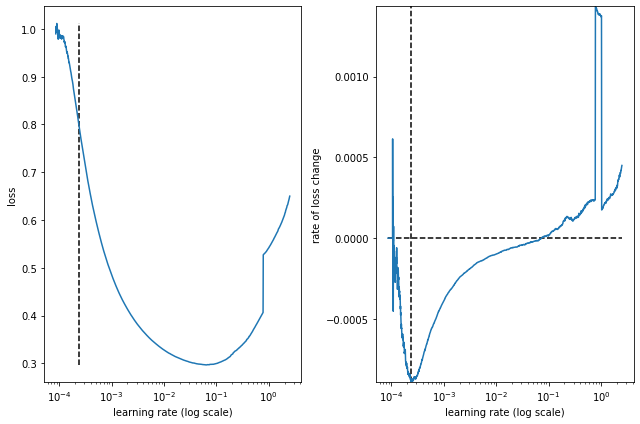

best lr: 0.00023976533 

Model: "conv1d_lstm_144l_48s_32bs_32fm_16f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8 (Conv1D)           (None, 142, 16)           496       
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 71, 16)           0         
 1D)                                                             
                                                                 
 lstm_8 (LSTM)               (None, 32)                6272      
                                                                 
 dense_16 (Dense)            (None, 32)                1056      
                                                                 
 dense_17 (Dense)            (None, 48)                1584      
                                                                 
 reshape_8 (Reshape)         (None, 48, 1)             0         
   

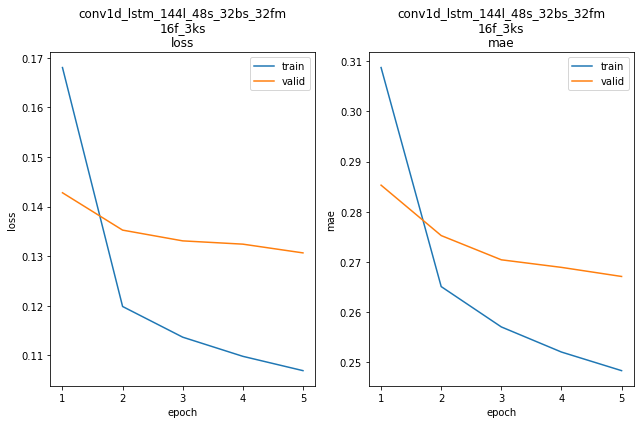

conv1d_lstm_144l_48s_32bs_32fm_16f_3ks train min loss: 0.106906	mae: 0.248376	epoch: 5
conv1d_lstm_144l_48s_32bs_32fm_16f_3ks valid min loss: 0.130648	mae: 0.267123	epoch: 5

conv1d_lstm_144l_48s_32bs_32fm_16f_3ks
Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 248.3212
Function value obtained: 0.1306
Current minimum: 0.1306
Iteration No: 2 started. Evaluating function at random point.
feat_maps 53
filters 15
kern_size 6
Epoch 1/5
5876/5876 [==============================] - 41s 7ms/step - loss: 1.0660 - mae: 0.6425


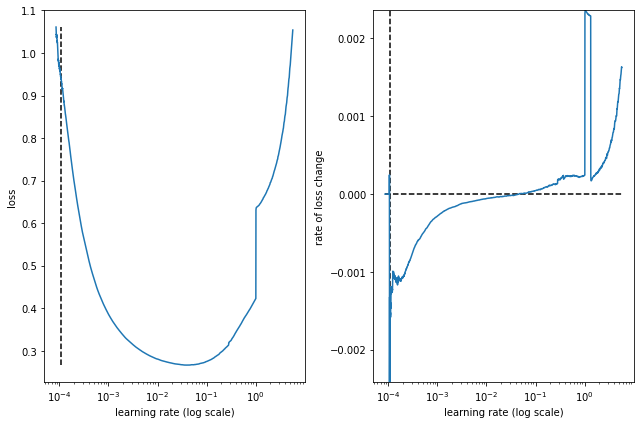

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_53fm_15f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_9 (Conv1D)           (None, 139, 15)           915       
                                                                 
 max_pooling1d_9 (MaxPooling  (None, 69, 15)           0         
 1D)                                                             
                                                                 
 lstm_9 (LSTM)               (None, 53)                14628     
                                                                 
 dense_18 (Dense)            (None, 53)                2862      
                                                                 
 dense_19 (Dense)            (None, 48)                2592      
                                                                 
 reshape_9 (Reshape)         (None, 48, 1)             0         
   

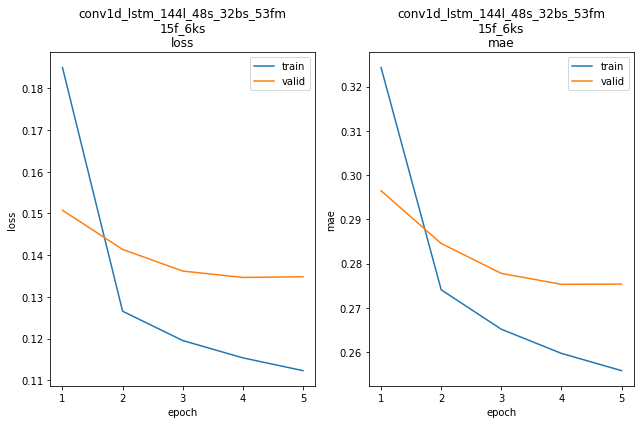

conv1d_lstm_144l_48s_32bs_53fm_15f_6ks train min loss: 0.112301	mae: 0.255826	epoch: 5
conv1d_lstm_144l_48s_32bs_53fm_15f_6ks valid min loss: 0.134661	mae: 0.275325	epoch: 4

conv1d_lstm_144l_48s_32bs_53fm_15f_6ks
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 246.5601
Function value obtained: 0.1347
Current minimum: 0.1306
Iteration No: 3 started. Evaluating function at random point.
feat_maps 41
filters 31
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 43s 7ms/step - loss: 1.0916 - mae: 0.6797


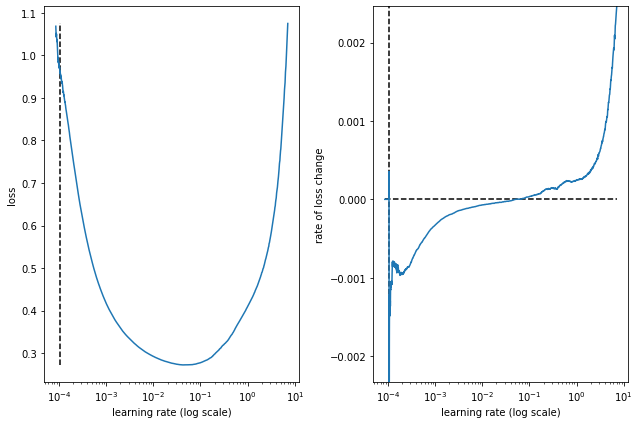

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_41fm_31f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_10 (Conv1D)          (None, 142, 31)           961       
                                                                 
 max_pooling1d_10 (MaxPoolin  (None, 71, 31)           0         
 g1D)                                                            
                                                                 
 lstm_10 (LSTM)              (None, 41)                11972     
                                                                 
 dense_20 (Dense)            (None, 41)                1722      
                                                                 
 dense_21 (Dense)            (None, 48)                2016      
                                                                 
 reshape_10 (Reshape)        (None, 48, 1)             0         
  

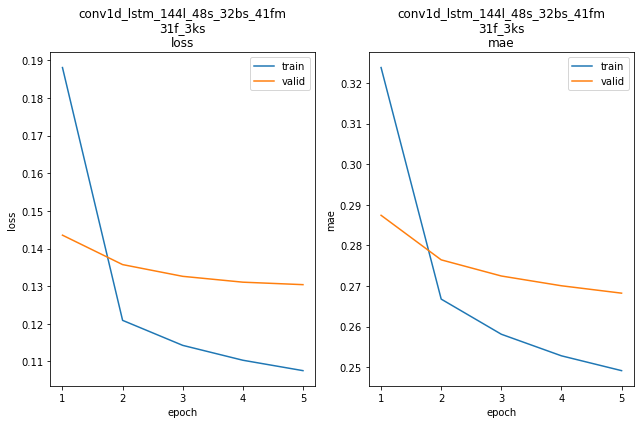

conv1d_lstm_144l_48s_32bs_41fm_31f_3ks train min loss: 0.107527	mae: 0.249183	epoch: 5
conv1d_lstm_144l_48s_32bs_41fm_31f_3ks valid min loss: 0.130390	mae: 0.268251	epoch: 5

conv1d_lstm_144l_48s_32bs_41fm_31f_3ks
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 331.7928
Function value obtained: 0.1304
Current minimum: 0.1304
Iteration No: 4 started. Evaluating function at random point.
feat_maps 34
filters 24
kern_size 4
Epoch 1/5
5876/5876 [==============================] - 42s 7ms/step - loss: 1.1505 - mae: 0.7012


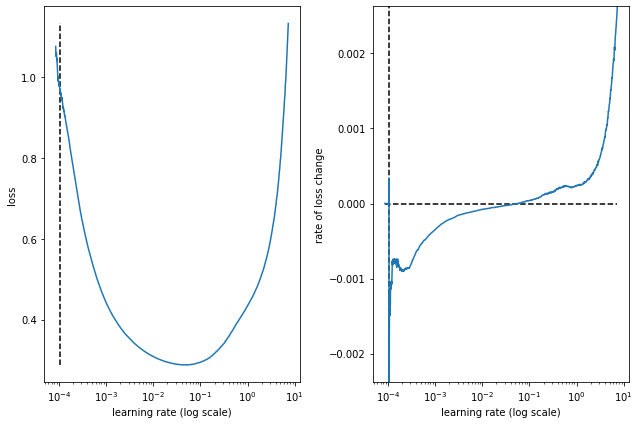

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_34fm_24f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_11 (Conv1D)          (None, 141, 24)           984       
                                                                 
 max_pooling1d_11 (MaxPoolin  (None, 70, 24)           0         
 g1D)                                                            
                                                                 
 lstm_11 (LSTM)              (None, 34)                8024      
                                                                 
 dense_22 (Dense)            (None, 34)                1190      
                                                                 
 dense_23 (Dense)            (None, 48)                1680      
                                                                 
 reshape_11 (Reshape)        (None, 48, 1)             0         
   

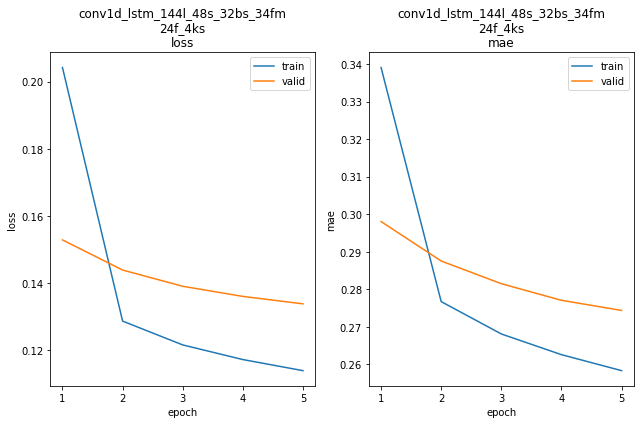

conv1d_lstm_144l_48s_32bs_34fm_24f_4ks train min loss: 0.113952	mae: 0.258321	epoch: 5
conv1d_lstm_144l_48s_32bs_34fm_24f_4ks valid min loss: 0.133832	mae: 0.274361	epoch: 5

conv1d_lstm_144l_48s_32bs_34fm_24f_4ks
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 248.4734
Function value obtained: 0.1338
Current minimum: 0.1304
Iteration No: 5 started. Evaluating function at random point.
feat_maps 44
filters 7
kern_size 6
Epoch 1/5
5876/5876 [==============================] - 42s 7ms/step - loss: 1.1818 - mae: 0.7078


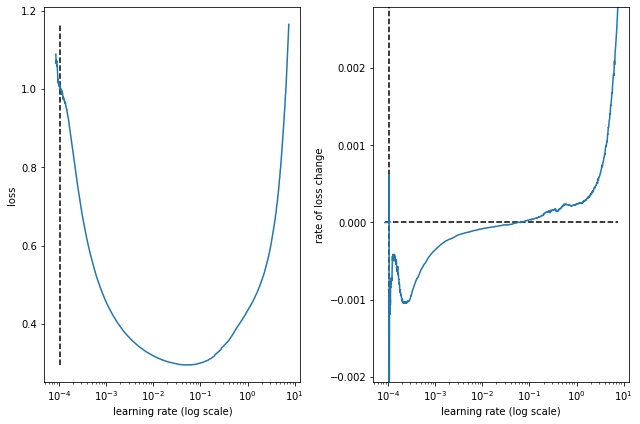

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_44fm_7f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_12 (Conv1D)          (None, 139, 7)            427       
                                                                 
 max_pooling1d_12 (MaxPoolin  (None, 69, 7)            0         
 g1D)                                                            
                                                                 
 lstm_12 (LSTM)              (None, 44)                9152      
                                                                 
 dense_24 (Dense)            (None, 44)                1980      
                                                                 
 dense_25 (Dense)            (None, 48)                2160      
                                                                 
 reshape_12 (Reshape)        (None, 48, 1)             0         
   

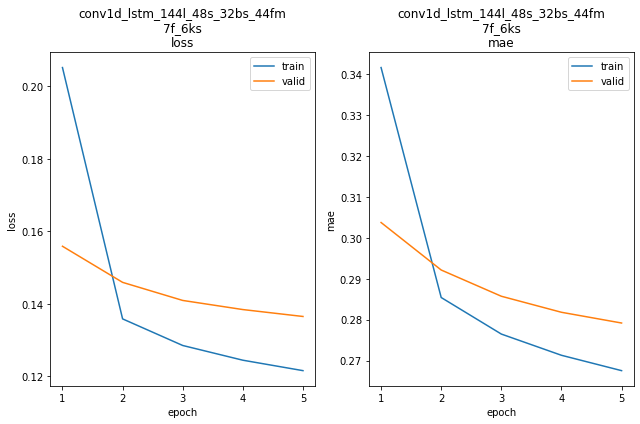

conv1d_lstm_144l_48s_32bs_44fm_7f_6ks train min loss: 0.121531	mae: 0.267534	epoch: 5
conv1d_lstm_144l_48s_32bs_44fm_7f_6ks valid min loss: 0.136490	mae: 0.279177	epoch: 5

conv1d_lstm_144l_48s_32bs_44fm_7f_6ks
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 244.9816
Function value obtained: 0.1365
Current minimum: 0.1304
Iteration No: 6 started. Evaluating function at random point.
feat_maps 61
filters 4
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 37s 6ms/step - loss: 1.3267 - mae: 0.5106


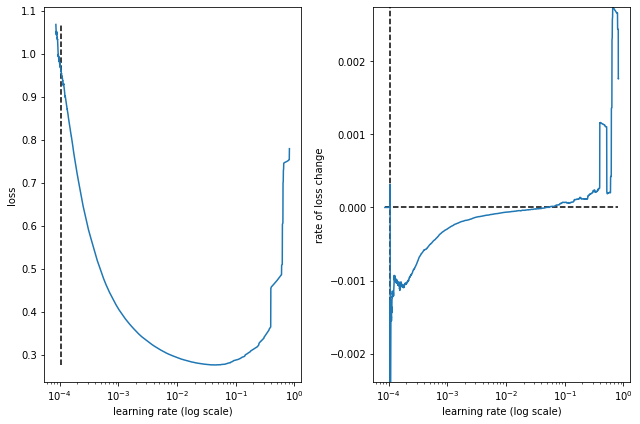

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_61fm_4f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_13 (Conv1D)          (None, 138, 4)            284       
                                                                 
 max_pooling1d_13 (MaxPoolin  (None, 69, 4)            0         
 g1D)                                                            
                                                                 
 lstm_13 (LSTM)              (None, 61)                16104     
                                                                 
 dense_26 (Dense)            (None, 61)                3782      
                                                                 
 dense_27 (Dense)            (None, 48)                2976      
                                                                 
 reshape_13 (Reshape)        (None, 48, 1)             0         
   

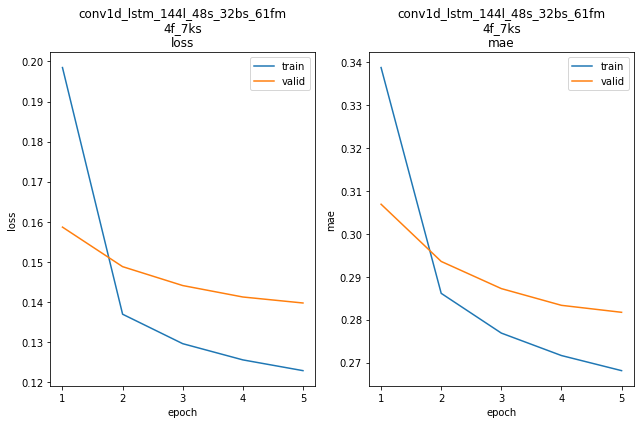

conv1d_lstm_144l_48s_32bs_61fm_4f_7ks train min loss: 0.122815	mae: 0.268134	epoch: 5
conv1d_lstm_144l_48s_32bs_61fm_4f_7ks valid min loss: 0.139705	mae: 0.281719	epoch: 5

conv1d_lstm_144l_48s_32bs_61fm_4f_7ks
Iteration No: 6 ended. Evaluation done at random point.
Time taken: 368.4438
Function value obtained: 0.1397
Current minimum: 0.1304
Iteration No: 7 started. Evaluating function at random point.
feat_maps 43
filters 41
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 44s 7ms/step - loss: 1.0570 - mae: 0.6714


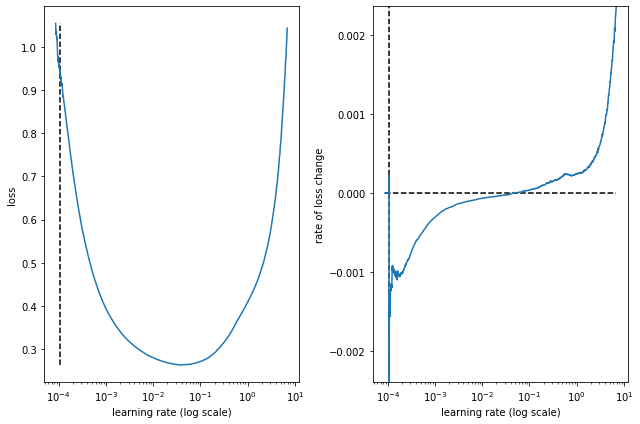

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_43fm_41f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_14 (Conv1D)          (None, 142, 41)           1271      
                                                                 
 max_pooling1d_14 (MaxPoolin  (None, 71, 41)           0         
 g1D)                                                            
                                                                 
 lstm_14 (LSTM)              (None, 43)                14620     
                                                                 
 dense_28 (Dense)            (None, 43)                1892      
                                                                 
 dense_29 (Dense)            (None, 48)                2112      
                                                                 
 reshape_14 (Reshape)        (None, 48, 1)             0         
   

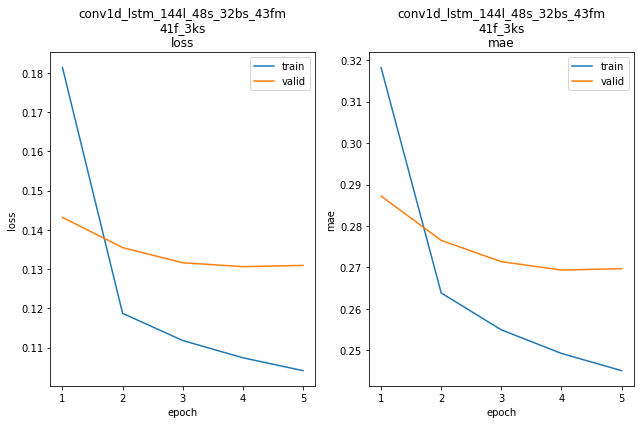

conv1d_lstm_144l_48s_32bs_43fm_41f_3ks train min loss: 0.104126	mae: 0.245061	epoch: 5
conv1d_lstm_144l_48s_32bs_43fm_41f_3ks valid min loss: 0.130633	mae: 0.269352	epoch: 4

conv1d_lstm_144l_48s_32bs_43fm_41f_3ks
Iteration No: 7 ended. Evaluation done at random point.
Time taken: 249.6182
Function value obtained: 0.1306
Current minimum: 0.1304
Iteration No: 8 started. Evaluating function at random point.
feat_maps 9
filters 35
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 43s 7ms/step - loss: 1.4142 - mae: 0.7669


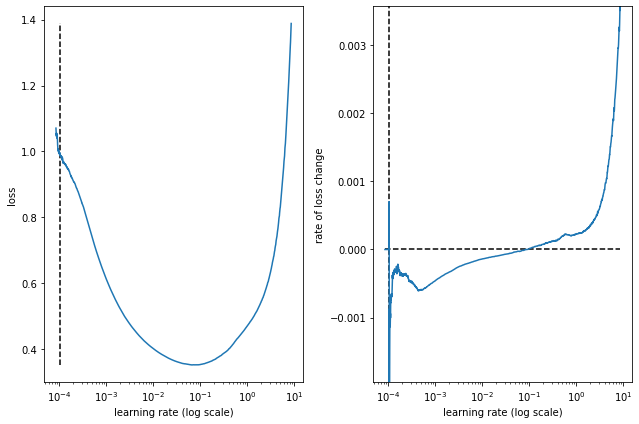

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_9fm_35f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_15 (Conv1D)          (None, 140, 35)           1785      
                                                                 
 max_pooling1d_15 (MaxPoolin  (None, 70, 35)           0         
 g1D)                                                            
                                                                 
 lstm_15 (LSTM)              (None, 9)                 1620      
                                                                 
 dense_30 (Dense)            (None, 9)                 90        
                                                                 
 dense_31 (Dense)            (None, 48)                480       
                                                                 
 reshape_15 (Reshape)        (None, 48, 1)             0         
    

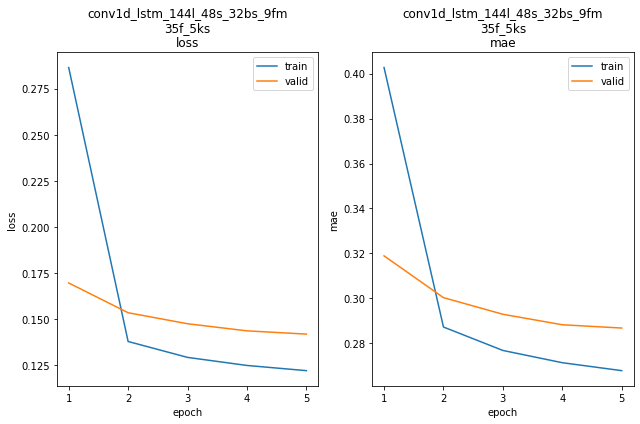

conv1d_lstm_144l_48s_32bs_9fm_35f_5ks train min loss: 0.121981	mae: 0.267855	epoch: 5
conv1d_lstm_144l_48s_32bs_9fm_35f_5ks valid min loss: 0.141810	mae: 0.286806	epoch: 5

conv1d_lstm_144l_48s_32bs_9fm_35f_5ks
Iteration No: 8 ended. Evaluation done at random point.
Time taken: 289.4414
Function value obtained: 0.1418
Current minimum: 0.1304
Iteration No: 9 started. Evaluating function at random point.
feat_maps 11
filters 62
kern_size 4
Epoch 1/5
5876/5876 [==============================] - 43s 7ms/step - loss: 1.4680 - mae: 0.7799


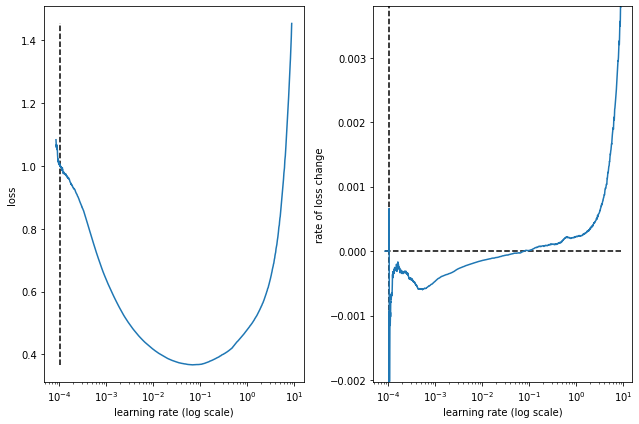

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_11fm_62f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_16 (Conv1D)          (None, 141, 62)           2542      
                                                                 
 max_pooling1d_16 (MaxPoolin  (None, 70, 62)           0         
 g1D)                                                            
                                                                 
 lstm_16 (LSTM)              (None, 11)                3256      
                                                                 
 dense_32 (Dense)            (None, 11)                132       
                                                                 
 dense_33 (Dense)            (None, 48)                576       
                                                                 
 reshape_16 (Reshape)        (None, 48, 1)             0         
  

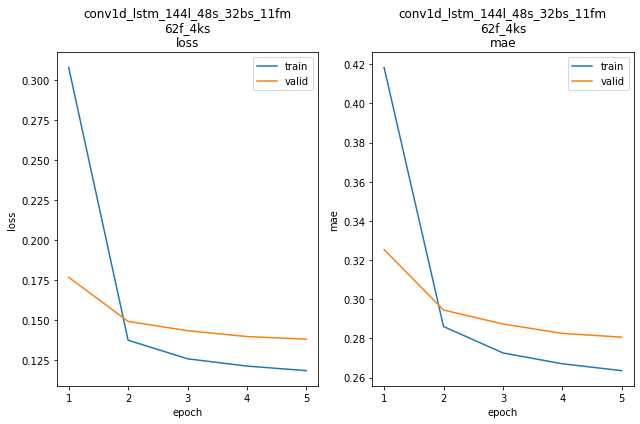

conv1d_lstm_144l_48s_32bs_11fm_62f_4ks train min loss: 0.118376	mae: 0.263557	epoch: 5
conv1d_lstm_144l_48s_32bs_11fm_62f_4ks valid min loss: 0.138042	mae: 0.280661	epoch: 5

conv1d_lstm_144l_48s_32bs_11fm_62f_4ks
Iteration No: 9 ended. Evaluation done at random point.
Time taken: 250.3295
Function value obtained: 0.1380
Current minimum: 0.1304
Iteration No: 10 started. Evaluating function at random point.
feat_maps 13
filters 41
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 41s 7ms/step - loss: 32.7879 - mae: 0.6784


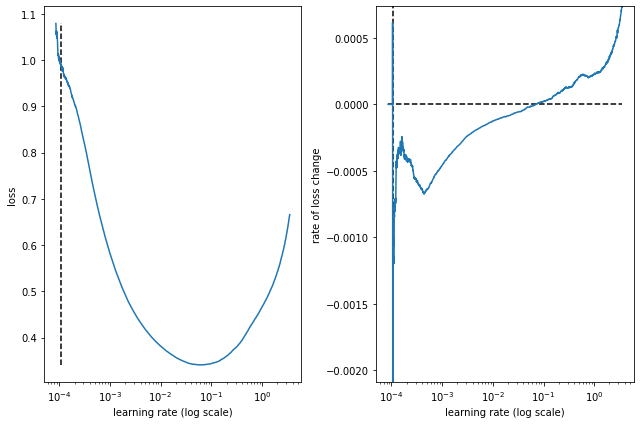

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_13fm_41f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_17 (Conv1D)          (None, 140, 41)           2091      
                                                                 
 max_pooling1d_17 (MaxPoolin  (None, 70, 41)           0         
 g1D)                                                            
                                                                 
 lstm_17 (LSTM)              (None, 13)                2860      
                                                                 
 dense_34 (Dense)            (None, 13)                182       
                                                                 
 dense_35 (Dense)            (None, 48)                672       
                                                                 
 reshape_17 (Reshape)        (None, 48, 1)             0         
  

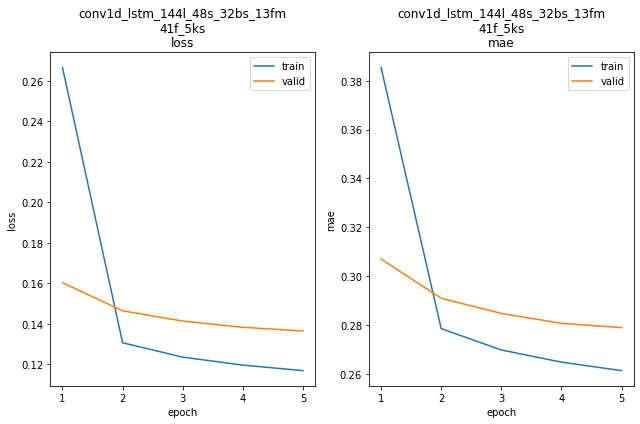

conv1d_lstm_144l_48s_32bs_13fm_41f_5ks train min loss: 0.116912	mae: 0.261261	epoch: 5
conv1d_lstm_144l_48s_32bs_13fm_41f_5ks valid min loss: 0.136473	mae: 0.278898	epoch: 5

conv1d_lstm_144l_48s_32bs_13fm_41f_5ks
Iteration No: 10 ended. Evaluation done at random point.
Time taken: 248.8539
Function value obtained: 0.1365
Current minimum: 0.1304
Iteration No: 11 started. Evaluating function at random point.
feat_maps 63
filters 32
kern_size 6
Epoch 1/5
5876/5876 [==============================] - 46s 8ms/step - loss: 0.9960 - mae: 0.6597


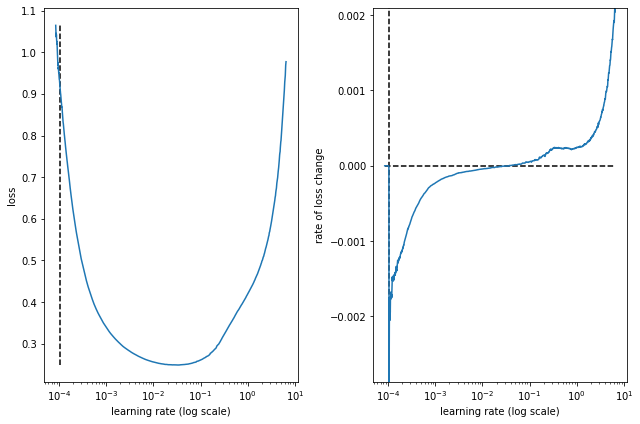

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_63fm_32f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_18 (Conv1D)          (None, 139, 32)           1952      
                                                                 
 max_pooling1d_18 (MaxPoolin  (None, 69, 32)           0         
 g1D)                                                            
                                                                 
 lstm_18 (LSTM)              (None, 63)                24192     
                                                                 
 dense_36 (Dense)            (None, 63)                4032      
                                                                 
 dense_37 (Dense)            (None, 48)                3072      
                                                                 
 reshape_18 (Reshape)        (None, 48, 1)             0         
  

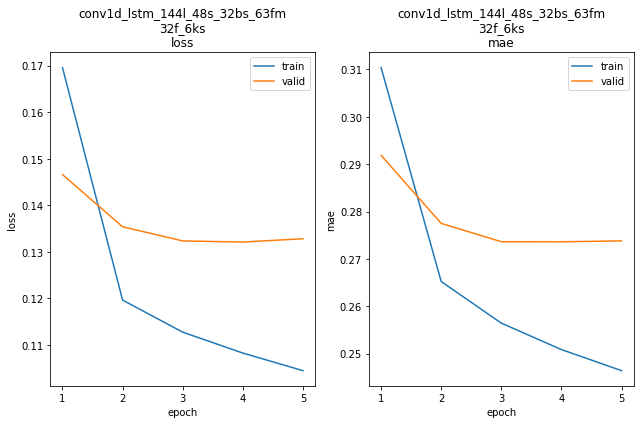

conv1d_lstm_144l_48s_32bs_63fm_32f_6ks train min loss: 0.104479	mae: 0.246401	epoch: 5
conv1d_lstm_144l_48s_32bs_63fm_32f_6ks valid min loss: 0.132102	mae: 0.273613	epoch: 4

conv1d_lstm_144l_48s_32bs_63fm_32f_6ks
Iteration No: 11 ended. Evaluation done at random point.
Time taken: 291.5646
Function value obtained: 0.1321
Current minimum: 0.1304
Iteration No: 12 started. Evaluating function at random point.
feat_maps 46
filters 29
kern_size 4
Epoch 1/5
5876/5876 [==============================] - 45s 7ms/step - loss: 1.0796 - mae: 0.6787


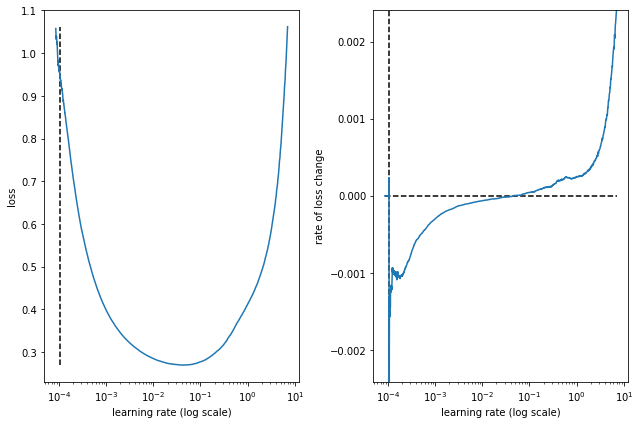

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_46fm_29f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_19 (Conv1D)          (None, 141, 29)           1189      
                                                                 
 max_pooling1d_19 (MaxPoolin  (None, 70, 29)           0         
 g1D)                                                            
                                                                 
 lstm_19 (LSTM)              (None, 46)                13984     
                                                                 
 dense_38 (Dense)            (None, 46)                2162      
                                                                 
 dense_39 (Dense)            (None, 48)                2256      
                                                                 
 reshape_19 (Reshape)        (None, 48, 1)             0         
   

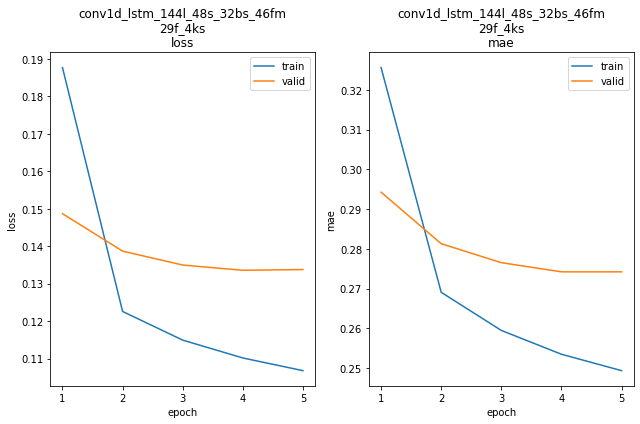

conv1d_lstm_144l_48s_32bs_46fm_29f_4ks train min loss: 0.106801	mae: 0.249379	epoch: 5
conv1d_lstm_144l_48s_32bs_46fm_29f_4ks valid min loss: 0.133579	mae: 0.274227	epoch: 4

conv1d_lstm_144l_48s_32bs_46fm_29f_4ks
Iteration No: 12 ended. Evaluation done at random point.
Time taken: 296.3174
Function value obtained: 0.1336
Current minimum: 0.1304
Iteration No: 13 started. Searching for the next optimal point.
feat_maps 64
filters 44
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 47s 8ms/step - loss: 0.9703 - mae: 0.6454


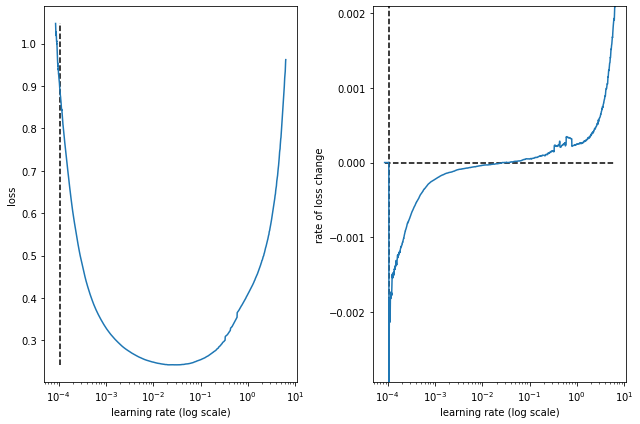

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_64fm_44f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_20 (Conv1D)          (None, 140, 44)           2244      
                                                                 
 max_pooling1d_20 (MaxPoolin  (None, 70, 44)           0         
 g1D)                                                            
                                                                 
 lstm_20 (LSTM)              (None, 64)                27904     
                                                                 
 dense_40 (Dense)            (None, 64)                4160      
                                                                 
 dense_41 (Dense)            (None, 48)                3120      
                                                                 
 reshape_20 (Reshape)        (None, 48, 1)             0         
   

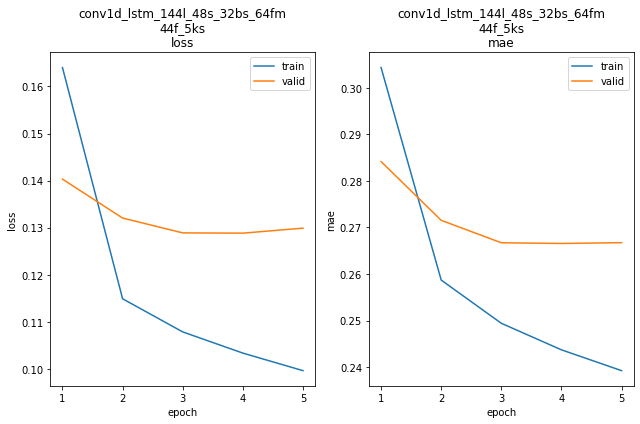

conv1d_lstm_144l_48s_32bs_64fm_44f_5ks train min loss: 0.099630	mae: 0.239222	epoch: 5
conv1d_lstm_144l_48s_32bs_64fm_44f_5ks valid min loss: 0.128835	mae: 0.266564	epoch: 4

conv1d_lstm_144l_48s_32bs_64fm_44f_5ks
Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 251.6348
Function value obtained: 0.1288
Current minimum: 0.1288
Iteration No: 14 started. Searching for the next optimal point.
feat_maps 62
filters 50
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 42s 7ms/step - loss: 1.4326 - mae: 0.4992


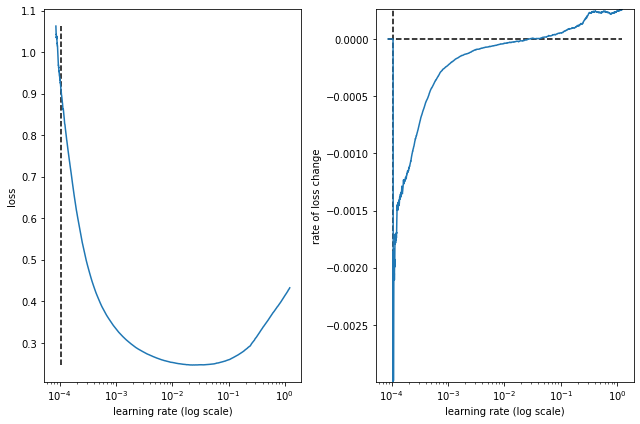

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_62fm_50f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_21 (Conv1D)          (None, 138, 50)           3550      
                                                                 
 max_pooling1d_21 (MaxPoolin  (None, 69, 50)           0         
 g1D)                                                            
                                                                 
 lstm_21 (LSTM)              (None, 62)                28024     
                                                                 
 dense_42 (Dense)            (None, 62)                3906      
                                                                 
 dense_43 (Dense)            (None, 48)                3024      
                                                                 
 reshape_21 (Reshape)        (None, 48, 1)             0         
  

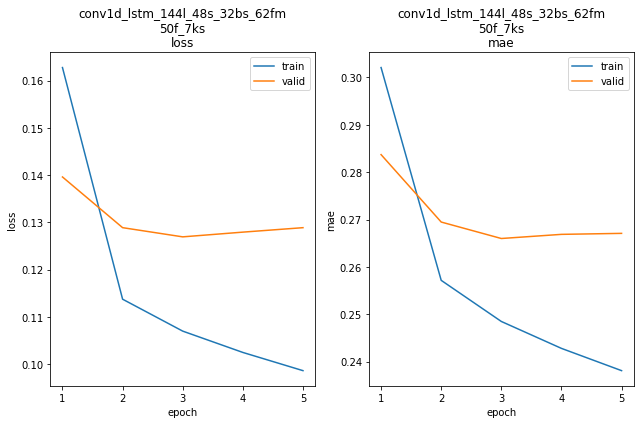

conv1d_lstm_144l_48s_32bs_62fm_50f_7ks train min loss: 0.098582	mae: 0.238097	epoch: 5
conv1d_lstm_144l_48s_32bs_62fm_50f_7ks valid min loss: 0.126919	mae: 0.265995	epoch: 3

conv1d_lstm_144l_48s_32bs_62fm_50f_7ks
Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 291.9469
Function value obtained: 0.1269
Current minimum: 0.1269
Iteration No: 15 started. Searching for the next optimal point.
feat_maps 62
filters 63
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 49s 8ms/step - loss: 0.9640 - mae: 0.6495


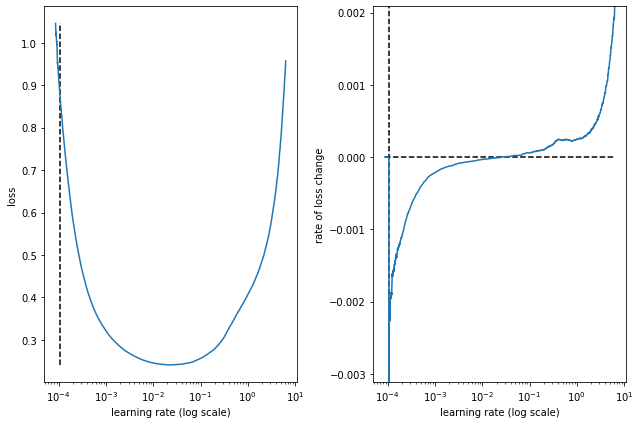

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_62fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_22 (Conv1D)          (None, 138, 63)           4473      
                                                                 
 max_pooling1d_22 (MaxPoolin  (None, 69, 63)           0         
 g1D)                                                            
                                                                 
 lstm_22 (LSTM)              (None, 62)                31248     
                                                                 
 dense_44 (Dense)            (None, 62)                3906      
                                                                 
 dense_45 (Dense)            (None, 48)                3024      
                                                                 
 reshape_22 (Reshape)        (None, 48, 1)             0         
  

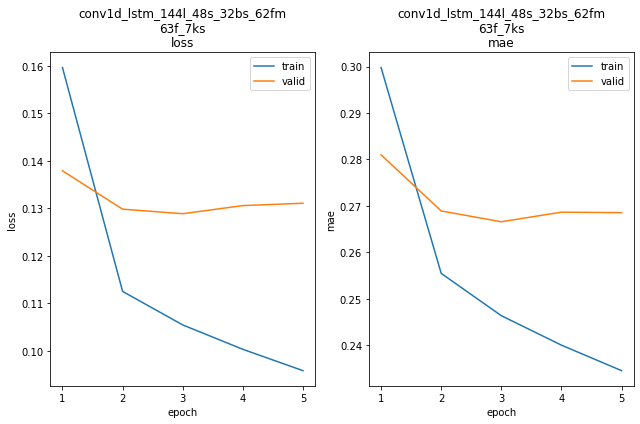

conv1d_lstm_144l_48s_32bs_62fm_63f_7ks train min loss: 0.095866	mae: 0.234570	epoch: 5
conv1d_lstm_144l_48s_32bs_62fm_63f_7ks valid min loss: 0.128887	mae: 0.266600	epoch: 3

conv1d_lstm_144l_48s_32bs_62fm_63f_7ks
Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 258.2265
Function value obtained: 0.1289
Current minimum: 0.1269
Iteration No: 16 started. Searching for the next optimal point.
feat_maps 25
filters 4
kern_size 4
Epoch 1/5
5876/5876 [==============================] - 46s 8ms/step - loss: 1.4187 - mae: 0.7709


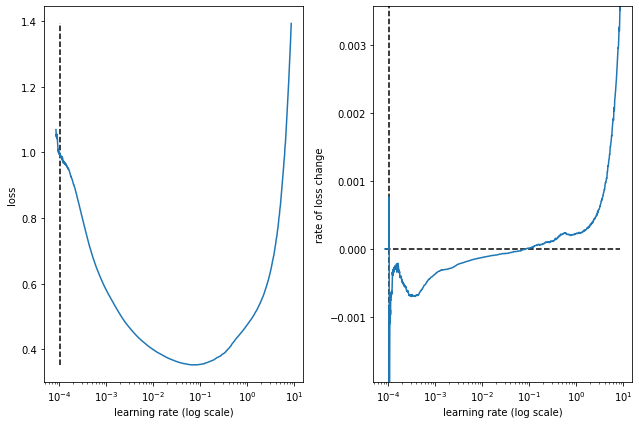

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_25fm_4f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_23 (Conv1D)          (None, 141, 4)            164       
                                                                 
 max_pooling1d_23 (MaxPoolin  (None, 70, 4)            0         
 g1D)                                                            
                                                                 
 lstm_23 (LSTM)              (None, 25)                3000      
                                                                 
 dense_46 (Dense)            (None, 25)                650       
                                                                 
 dense_47 (Dense)            (None, 48)                1248      
                                                                 
 reshape_23 (Reshape)        (None, 48, 1)             0         
    

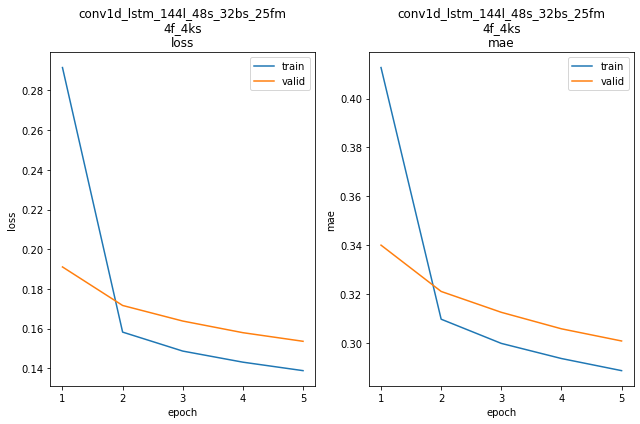

conv1d_lstm_144l_48s_32bs_25fm_4f_4ks train min loss: 0.138860	mae: 0.288744	epoch: 5
conv1d_lstm_144l_48s_32bs_25fm_4f_4ks valid min loss: 0.153645	mae: 0.300876	epoch: 5

conv1d_lstm_144l_48s_32bs_25fm_4f_4ks
Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 248.7805
Function value obtained: 0.1536
Current minimum: 0.1269
Iteration No: 17 started. Searching for the next optimal point.
feat_maps 56
filters 63
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 47s 8ms/step - loss: 1.0011 - mae: 0.6537


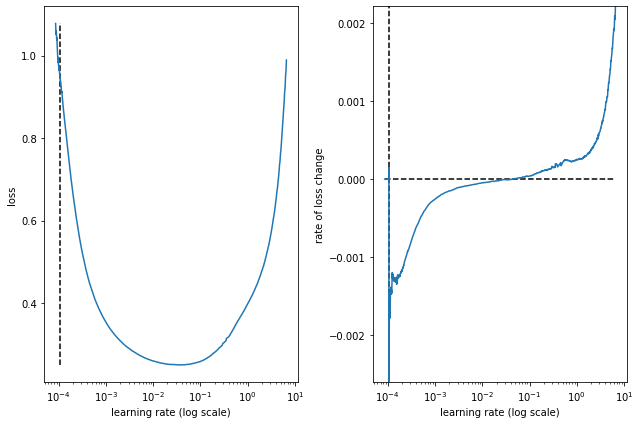

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_56fm_63f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_24 (Conv1D)          (None, 142, 63)           1953      
                                                                 
 max_pooling1d_24 (MaxPoolin  (None, 71, 63)           0         
 g1D)                                                            
                                                                 
 lstm_24 (LSTM)              (None, 56)                26880     
                                                                 
 dense_48 (Dense)            (None, 56)                3192      
                                                                 
 dense_49 (Dense)            (None, 48)                2736      
                                                                 
 reshape_24 (Reshape)        (None, 48, 1)             0         
   

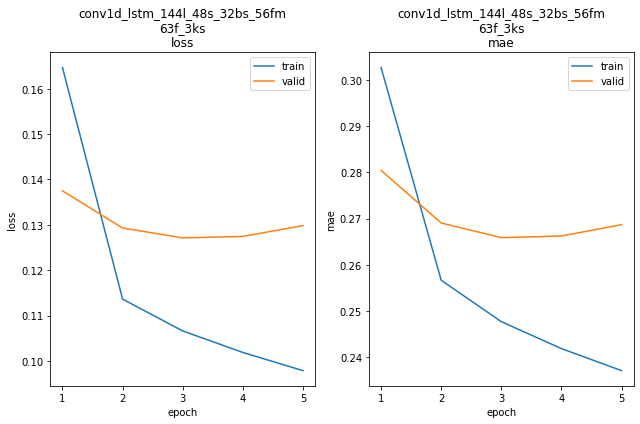

conv1d_lstm_144l_48s_32bs_56fm_63f_3ks train min loss: 0.097857	mae: 0.237121	epoch: 5
conv1d_lstm_144l_48s_32bs_56fm_63f_3ks valid min loss: 0.127123	mae: 0.265877	epoch: 3

conv1d_lstm_144l_48s_32bs_56fm_63f_3ks
Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 331.8650
Function value obtained: 0.1271
Current minimum: 0.1269
Iteration No: 18 started. Searching for the next optimal point.
feat_maps 64
filters 62
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 48s 8ms/step - loss: 0.9489 - mae: 0.6383


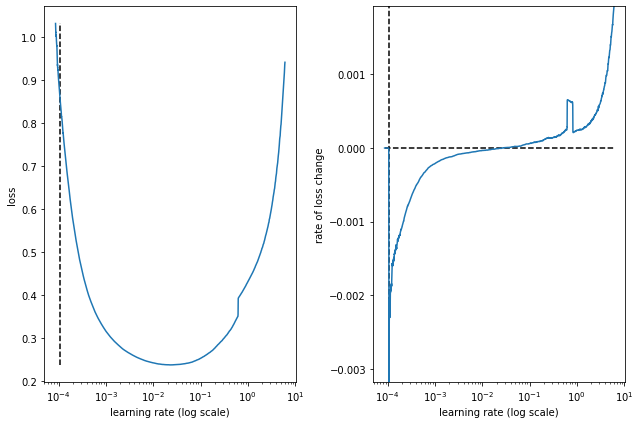

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_64fm_62f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_25 (Conv1D)          (None, 140, 62)           3162      
                                                                 
 max_pooling1d_25 (MaxPoolin  (None, 70, 62)           0         
 g1D)                                                            
                                                                 
 lstm_25 (LSTM)              (None, 64)                32512     
                                                                 
 dense_50 (Dense)            (None, 64)                4160      
                                                                 
 dense_51 (Dense)            (None, 48)                3120      
                                                                 
 reshape_25 (Reshape)        (None, 48, 1)             0         
  

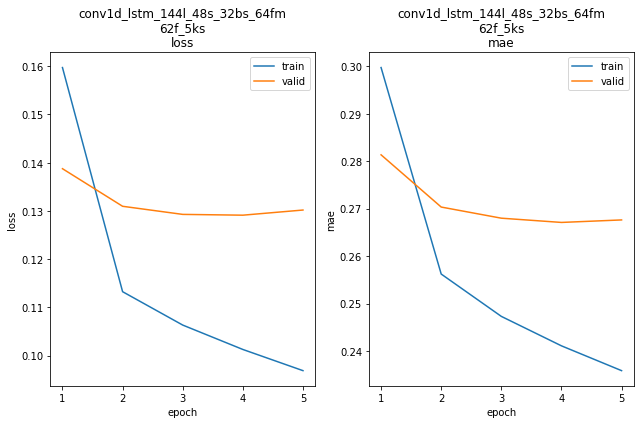

conv1d_lstm_144l_48s_32bs_64fm_62f_5ks train min loss: 0.096898	mae: 0.235853	epoch: 5
conv1d_lstm_144l_48s_32bs_64fm_62f_5ks valid min loss: 0.129125	mae: 0.267103	epoch: 4

conv1d_lstm_144l_48s_32bs_64fm_62f_5ks
Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 253.5729
Function value obtained: 0.1291
Current minimum: 0.1269
Iteration No: 19 started. Searching for the next optimal point.
feat_maps 51
filters 64
kern_size 6
Epoch 1/5
5876/5876 [==============================] - 48s 8ms/step - loss: 0.9972 - mae: 0.6600


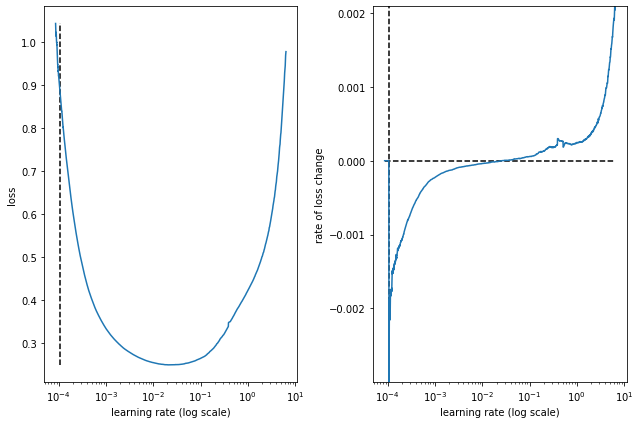

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_51fm_64f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_26 (Conv1D)          (None, 139, 64)           3904      
                                                                 
 max_pooling1d_26 (MaxPoolin  (None, 69, 64)           0         
 g1D)                                                            
                                                                 
 lstm_26 (LSTM)              (None, 51)                23664     
                                                                 
 dense_52 (Dense)            (None, 51)                2652      
                                                                 
 dense_53 (Dense)            (None, 48)                2496      
                                                                 
 reshape_26 (Reshape)        (None, 48, 1)             0         
  

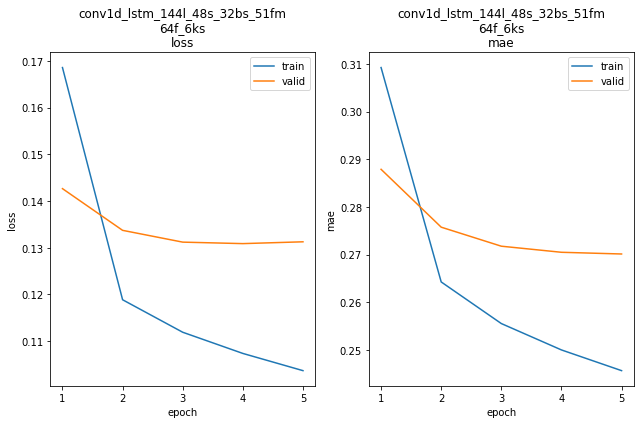

conv1d_lstm_144l_48s_32bs_51fm_64f_6ks train min loss: 0.103685	mae: 0.245681	epoch: 5
conv1d_lstm_144l_48s_32bs_51fm_64f_6ks valid min loss: 0.130884	mae: 0.270504	epoch: 4

conv1d_lstm_144l_48s_32bs_51fm_64f_6ks
Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 332.4608
Function value obtained: 0.1309
Current minimum: 0.1269
Iteration No: 20 started. Searching for the next optimal point.
feat_maps 39
filters 64
kern_size 4
Epoch 1/5
5876/5876 [==============================] - 49s 8ms/step - loss: 1.0849 - mae: 0.6862


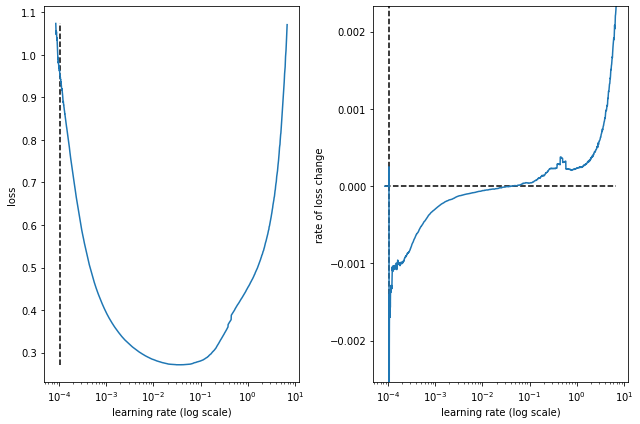

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_39fm_64f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_27 (Conv1D)          (None, 141, 64)           2624      
                                                                 
 max_pooling1d_27 (MaxPoolin  (None, 70, 64)           0         
 g1D)                                                            
                                                                 
 lstm_27 (LSTM)              (None, 39)                16224     
                                                                 
 dense_54 (Dense)            (None, 39)                1560      
                                                                 
 dense_55 (Dense)            (None, 48)                1920      
                                                                 
 reshape_27 (Reshape)        (None, 48, 1)             0         
   

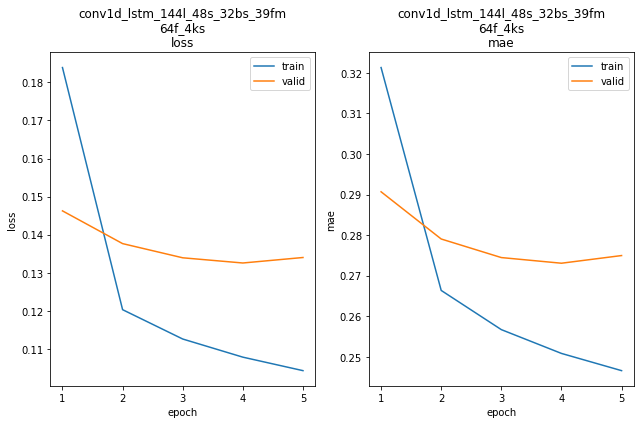

conv1d_lstm_144l_48s_32bs_39fm_64f_4ks train min loss: 0.104316	mae: 0.246589	epoch: 5
conv1d_lstm_144l_48s_32bs_39fm_64f_4ks valid min loss: 0.132573	mae: 0.273074	epoch: 4

conv1d_lstm_144l_48s_32bs_39fm_64f_4ks
Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 253.4297
Function value obtained: 0.1326
Current minimum: 0.1269
Iteration No: 21 started. Searching for the next optimal point.
feat_maps 30
filters 64
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 47s 8ms/step - loss: 1.1159 - mae: 0.6883


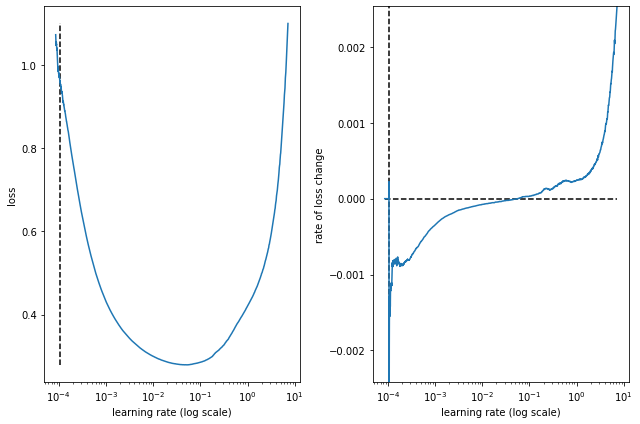

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_30fm_64f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_28 (Conv1D)          (None, 142, 64)           1984      
                                                                 
 max_pooling1d_28 (MaxPoolin  (None, 71, 64)           0         
 g1D)                                                            
                                                                 
 lstm_28 (LSTM)              (None, 30)                11400     
                                                                 
 dense_56 (Dense)            (None, 30)                930       
                                                                 
 dense_57 (Dense)            (None, 48)                1488      
                                                                 
 reshape_28 (Reshape)        (None, 48, 1)             0         
   

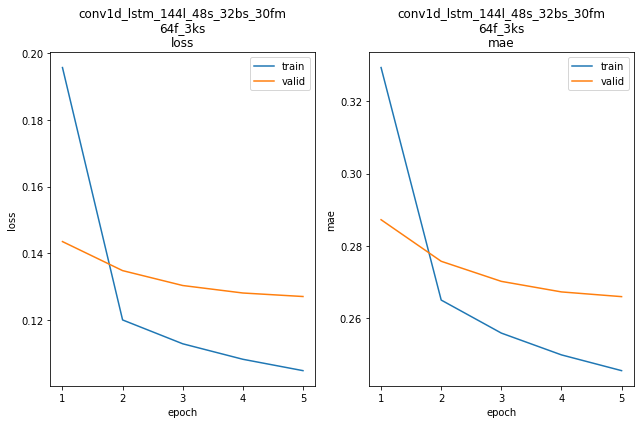

conv1d_lstm_144l_48s_32bs_30fm_64f_3ks train min loss: 0.104791	mae: 0.245489	epoch: 5
conv1d_lstm_144l_48s_32bs_30fm_64f_3ks valid min loss: 0.127035	mae: 0.265956	epoch: 5

conv1d_lstm_144l_48s_32bs_30fm_64f_3ks
Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 287.3134
Function value obtained: 0.1270
Current minimum: 0.1269
Iteration No: 22 started. Searching for the next optimal point.
feat_maps 9
filters 52
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 46s 7ms/step - loss: 20.4156 - mae: 0.6874


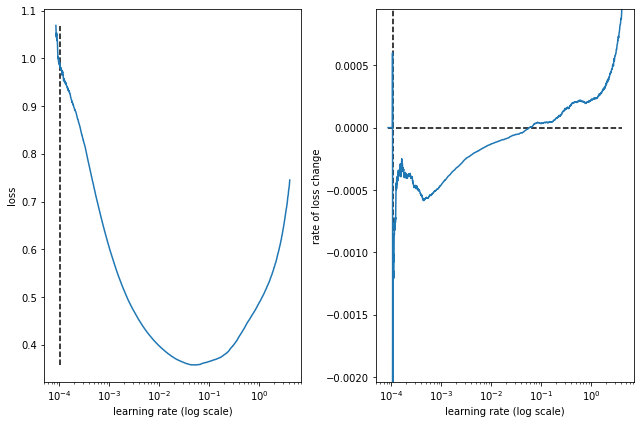

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_9fm_52f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_29 (Conv1D)          (None, 138, 52)           3692      
                                                                 
 max_pooling1d_29 (MaxPoolin  (None, 69, 52)           0         
 g1D)                                                            
                                                                 
 lstm_29 (LSTM)              (None, 9)                 2232      
                                                                 
 dense_58 (Dense)            (None, 9)                 90        
                                                                 
 dense_59 (Dense)            (None, 48)                480       
                                                                 
 reshape_29 (Reshape)        (None, 48, 1)             0         
   

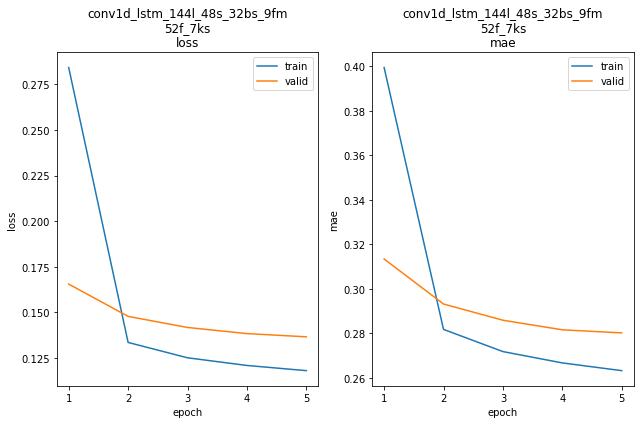

conv1d_lstm_144l_48s_32bs_9fm_52f_7ks train min loss: 0.118051	mae: 0.263231	epoch: 5
conv1d_lstm_144l_48s_32bs_9fm_52f_7ks valid min loss: 0.136590	mae: 0.280204	epoch: 5

conv1d_lstm_144l_48s_32bs_9fm_52f_7ks
Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 249.2877
Function value obtained: 0.1366
Current minimum: 0.1269
Iteration No: 23 started. Searching for the next optimal point.
feat_maps 63
filters 51
kern_size 6
Epoch 1/5
5876/5876 [==============================] - 50s 8ms/step - loss: 0.9966 - mae: 0.6586


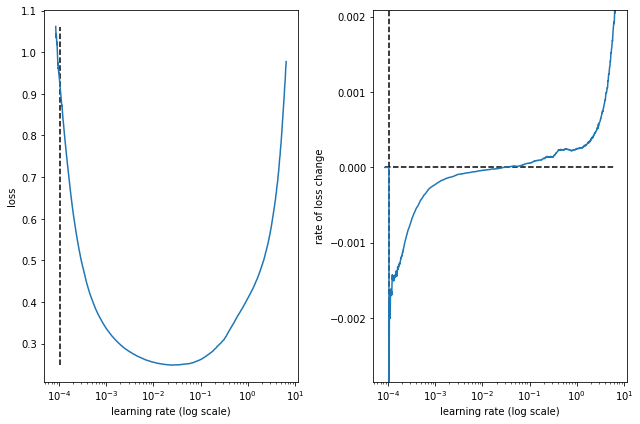

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_63fm_51f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_30 (Conv1D)          (None, 139, 51)           3111      
                                                                 
 max_pooling1d_30 (MaxPoolin  (None, 69, 51)           0         
 g1D)                                                            
                                                                 
 lstm_30 (LSTM)              (None, 63)                28980     
                                                                 
 dense_60 (Dense)            (None, 63)                4032      
                                                                 
 dense_61 (Dense)            (None, 48)                3072      
                                                                 
 reshape_30 (Reshape)        (None, 48, 1)             0         
   

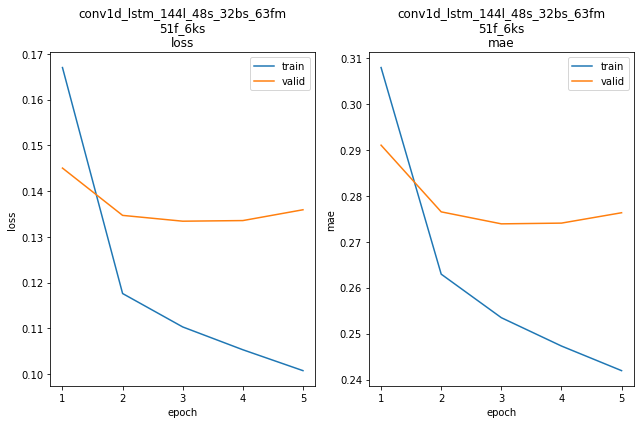

conv1d_lstm_144l_48s_32bs_63fm_51f_6ks train min loss: 0.100748	mae: 0.241934	epoch: 5
conv1d_lstm_144l_48s_32bs_63fm_51f_6ks valid min loss: 0.133411	mae: 0.273892	epoch: 3

conv1d_lstm_144l_48s_32bs_63fm_51f_6ks
Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 332.6846
Function value obtained: 0.1334
Current minimum: 0.1269
Iteration No: 24 started. Searching for the next optimal point.
feat_maps 55
filters 15
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 52s 9ms/step - loss: 1.0924 - mae: 0.6815


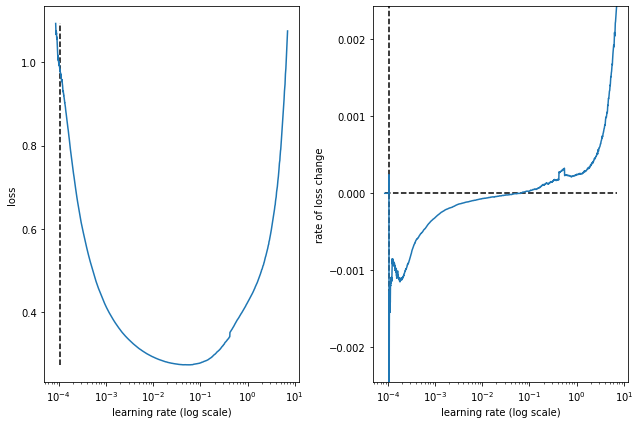

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_55fm_15f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_31 (Conv1D)          (None, 142, 15)           465       
                                                                 
 max_pooling1d_31 (MaxPoolin  (None, 71, 15)           0         
 g1D)                                                            
                                                                 
 lstm_31 (LSTM)              (None, 55)                15620     
                                                                 
 dense_62 (Dense)            (None, 55)                3080      
                                                                 
 dense_63 (Dense)            (None, 48)                2688      
                                                                 
 reshape_31 (Reshape)        (None, 48, 1)             0         
  

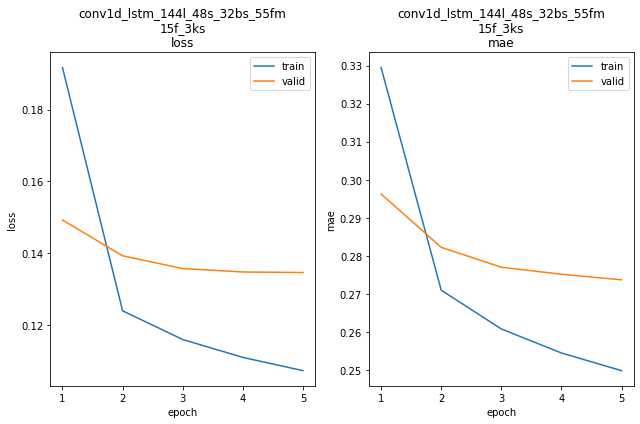

conv1d_lstm_144l_48s_32bs_55fm_15f_3ks train min loss: 0.107239	mae: 0.249901	epoch: 5
conv1d_lstm_144l_48s_32bs_55fm_15f_3ks valid min loss: 0.134589	mae: 0.273739	epoch: 5

conv1d_lstm_144l_48s_32bs_55fm_15f_3ks
Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 301.8861
Function value obtained: 0.1346
Current minimum: 0.1269
Iteration No: 25 started. Searching for the next optimal point.
feat_maps 64
filters 32
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 49s 8ms/step - loss: 0.9823 - mae: 0.6518


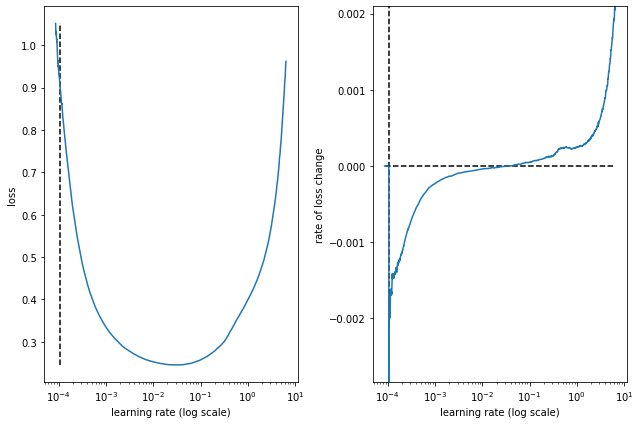

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_64fm_32f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_32 (Conv1D)          (None, 138, 32)           2272      
                                                                 
 max_pooling1d_32 (MaxPoolin  (None, 69, 32)           0         
 g1D)                                                            
                                                                 
 lstm_32 (LSTM)              (None, 64)                24832     
                                                                 
 dense_64 (Dense)            (None, 64)                4160      
                                                                 
 dense_65 (Dense)            (None, 48)                3120      
                                                                 
 reshape_32 (Reshape)        (None, 48, 1)             0         
  

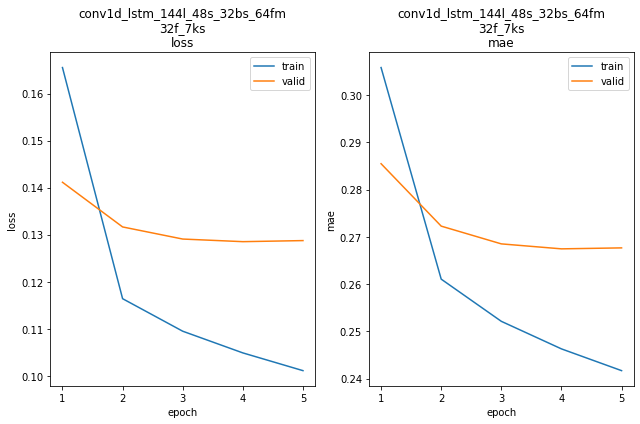

conv1d_lstm_144l_48s_32bs_64fm_32f_7ks train min loss: 0.101078	mae: 0.241671	epoch: 5
conv1d_lstm_144l_48s_32bs_64fm_32f_7ks valid min loss: 0.128518	mae: 0.267447	epoch: 4

conv1d_lstm_144l_48s_32bs_64fm_32f_7ks
Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 255.1711
Function value obtained: 0.1285
Current minimum: 0.1269
Iteration No: 26 started. Searching for the next optimal point.
feat_maps 21
filters 61
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 49s 8ms/step - loss: 1.1763 - mae: 0.6990


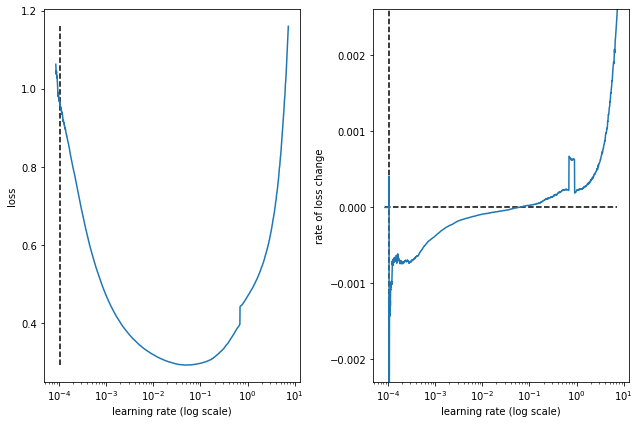

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_21fm_61f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_33 (Conv1D)          (None, 142, 61)           1891      
                                                                 
 max_pooling1d_33 (MaxPoolin  (None, 71, 61)           0         
 g1D)                                                            
                                                                 
 lstm_33 (LSTM)              (None, 21)                6972      
                                                                 
 dense_66 (Dense)            (None, 21)                462       
                                                                 
 dense_67 (Dense)            (None, 48)                1056      
                                                                 
 reshape_33 (Reshape)        (None, 48, 1)             0         
   

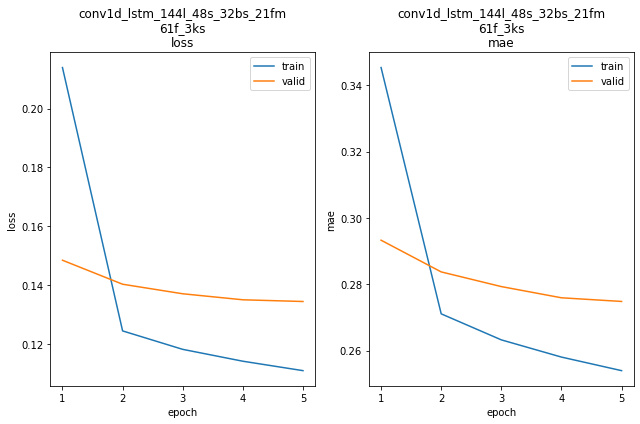

conv1d_lstm_144l_48s_32bs_21fm_61f_3ks train min loss: 0.110883	mae: 0.253944	epoch: 5
conv1d_lstm_144l_48s_32bs_21fm_61f_3ks valid min loss: 0.134390	mae: 0.274806	epoch: 5

conv1d_lstm_144l_48s_32bs_21fm_61f_3ks
Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 288.4466
Function value obtained: 0.1344
Current minimum: 0.1269
Iteration No: 27 started. Searching for the next optimal point.
feat_maps 59
filters 64
kern_size 4
Epoch 1/5
5876/5876 [==============================] - 51s 8ms/step - loss: 0.9780 - mae: 0.6534


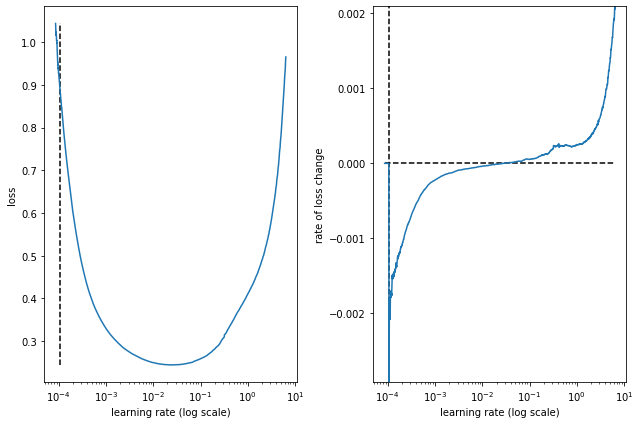

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_59fm_64f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_34 (Conv1D)          (None, 141, 64)           2624      
                                                                 
 max_pooling1d_34 (MaxPoolin  (None, 70, 64)           0         
 g1D)                                                            
                                                                 
 lstm_34 (LSTM)              (None, 59)                29264     
                                                                 
 dense_68 (Dense)            (None, 59)                3540      
                                                                 
 dense_69 (Dense)            (None, 48)                2880      
                                                                 
 reshape_34 (Reshape)        (None, 48, 1)             0         
   

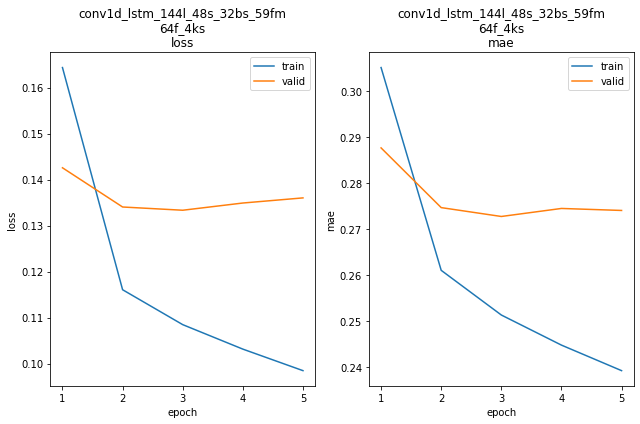

conv1d_lstm_144l_48s_32bs_59fm_64f_4ks train min loss: 0.098461	mae: 0.239216	epoch: 5
conv1d_lstm_144l_48s_32bs_59fm_64f_4ks valid min loss: 0.133337	mae: 0.272695	epoch: 3

conv1d_lstm_144l_48s_32bs_59fm_64f_4ks
Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 300.2039
Function value obtained: 0.1333
Current minimum: 0.1269
Iteration No: 28 started. Searching for the next optimal point.
feat_maps 64
filters 61
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 50s 8ms/step - loss: 0.9562 - mae: 0.6448


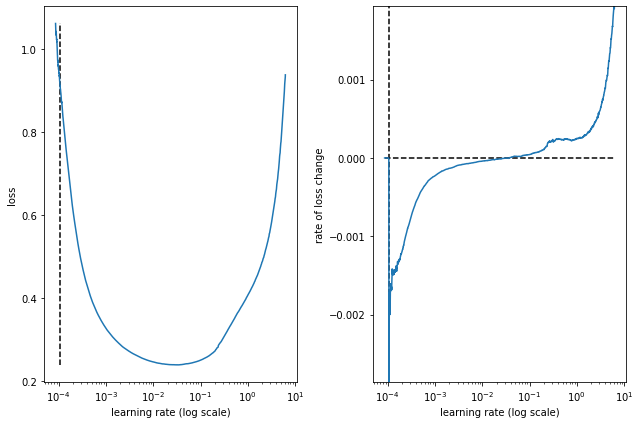

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_64fm_61f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_35 (Conv1D)          (None, 142, 61)           1891      
                                                                 
 max_pooling1d_35 (MaxPoolin  (None, 71, 61)           0         
 g1D)                                                            
                                                                 
 lstm_35 (LSTM)              (None, 64)                32256     
                                                                 
 dense_70 (Dense)            (None, 64)                4160      
                                                                 
 dense_71 (Dense)            (None, 48)                3120      
                                                                 
 reshape_35 (Reshape)        (None, 48, 1)             0         
   

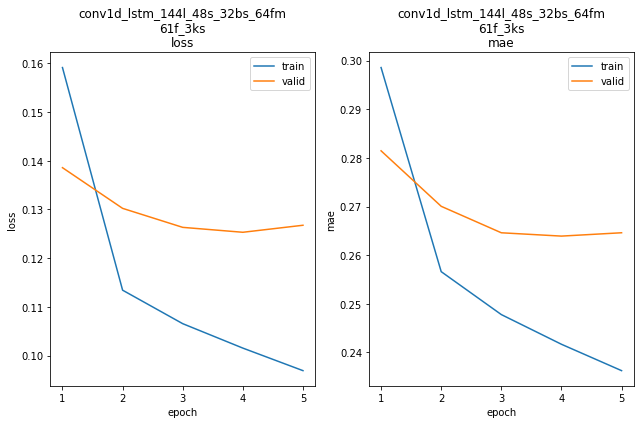

conv1d_lstm_144l_48s_32bs_64fm_61f_3ks train min loss: 0.096895	mae: 0.236246	epoch: 5
conv1d_lstm_144l_48s_32bs_64fm_61f_3ks valid min loss: 0.125320	mae: 0.263915	epoch: 4

conv1d_lstm_144l_48s_32bs_64fm_61f_3ks
Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 255.8163
Function value obtained: 0.1253
Current minimum: 0.1253
Iteration No: 29 started. Searching for the next optimal point.
feat_maps 52
filters 63
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 53s 9ms/step - loss: 0.9936 - mae: 0.6591


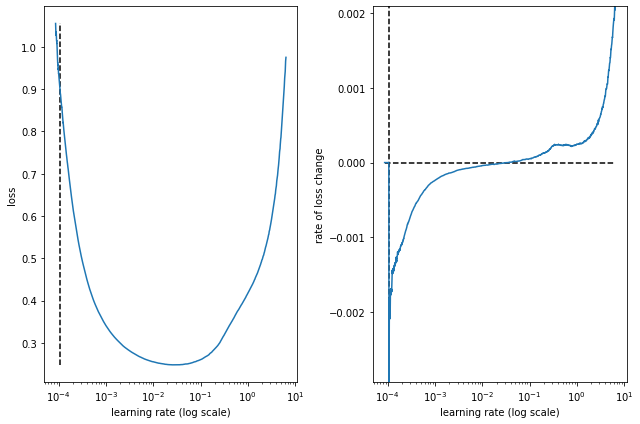

best lr: 0.000105913714 

Model: "conv1d_lstm_144l_48s_32bs_52fm_63f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_36 (Conv1D)          (None, 140, 63)           3213      
                                                                 
 max_pooling1d_36 (MaxPoolin  (None, 70, 63)           0         
 g1D)                                                            
                                                                 
 lstm_36 (LSTM)              (None, 52)                24128     
                                                                 
 dense_72 (Dense)            (None, 52)                2756      
                                                                 
 dense_73 (Dense)            (None, 48)                2544      
                                                                 
 reshape_36 (Reshape)        (None, 48, 1)             0         
  

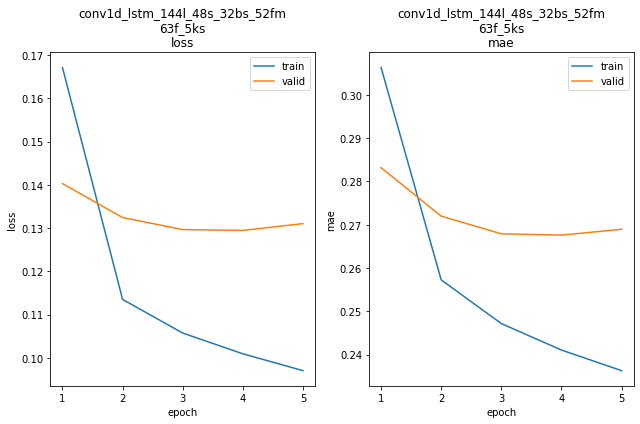

conv1d_lstm_144l_48s_32bs_52fm_63f_5ks train min loss: 0.097057	mae: 0.236303	epoch: 5
conv1d_lstm_144l_48s_32bs_52fm_63f_5ks valid min loss: 0.129472	mae: 0.267597	epoch: 4

conv1d_lstm_144l_48s_32bs_52fm_63f_5ks
Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 260.0250
Function value obtained: 0.1295
Current minimum: 0.1253
Iteration No: 30 started. Searching for the next optimal point.
feat_maps 36
filters 64
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 50s 8ms/step - loss: 1.1200 - mae: 0.6937


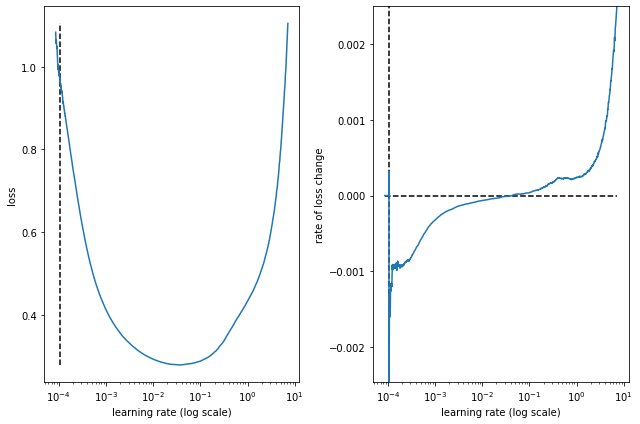

best lr: 0.00010679142 

Model: "conv1d_lstm_144l_48s_32bs_36fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_37 (Conv1D)          (None, 138, 64)           4544      
                                                                 
 max_pooling1d_37 (MaxPoolin  (None, 69, 64)           0         
 g1D)                                                            
                                                                 
 lstm_37 (LSTM)              (None, 36)                14544     
                                                                 
 dense_74 (Dense)            (None, 36)                1332      
                                                                 
 dense_75 (Dense)            (None, 48)                1776      
                                                                 
 reshape_37 (Reshape)        (None, 48, 1)             0         
   

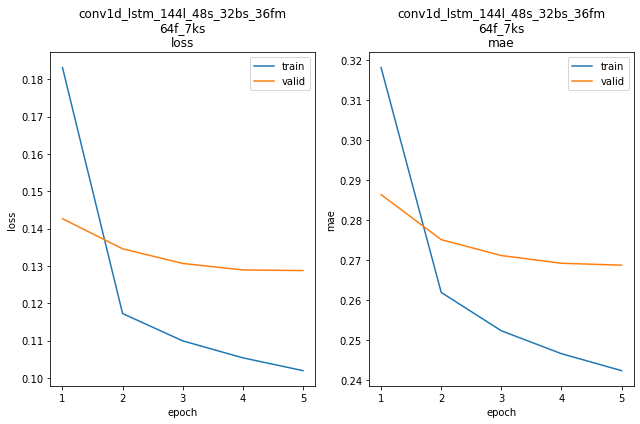

conv1d_lstm_144l_48s_32bs_36fm_64f_7ks train min loss: 0.101971	mae: 0.242372	epoch: 5
conv1d_lstm_144l_48s_32bs_36fm_64f_7ks valid min loss: 0.128774	mae: 0.268750	epoch: 5

conv1d_lstm_144l_48s_32bs_36fm_64f_7ks
Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 284.7273
Function value obtained: 0.1288
Current minimum: 0.1253

[64, 61, 3]
0.12531957030296326



NameError: ignored

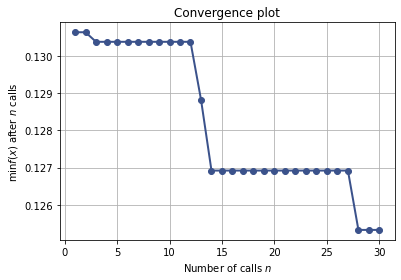

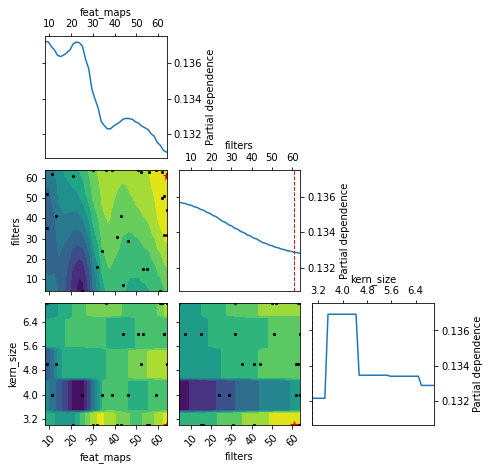

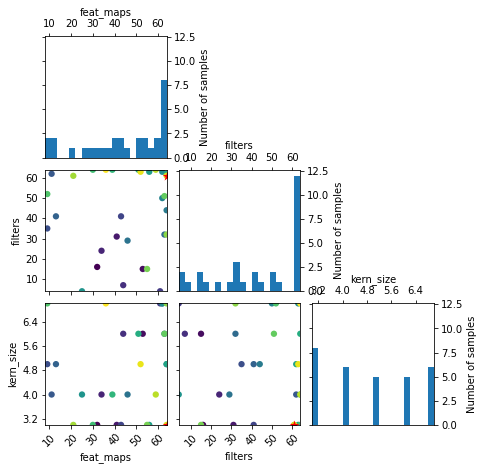

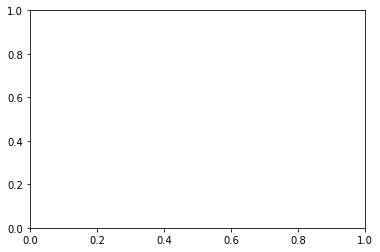

In [ ]:
%%time


results_id = 'cnn1d_lstm_48s'
hpo[results_id] = {}

dim_feat_maps = Integer(low = 8, high = 64, name = 'feat_maps')
dim_filters   = Integer(low = 4, high = 64, name = 'filters')
dim_kern_size = Integer(low = 3, high =  7, name = 'kern_size')

hpo[results_id]['dims'] = [dim_feat_maps,
                           dim_filters,
                           dim_kern_size]
hpo[results_id]['init_dims'] = [32, 16, 3]
hpo[results_id]['calls']     = 30


@use_named_args(dimensions = hpo[results_id]['dims'])
def model_fitness(**dims):
    params = get_default_params('conv1d_lstm')
    params.update({'lrf_params': [0.00008,  0.001, 32, 5, 100, 25]})
#   params.update({'lrf_params': [0.00005,  0.001, 32, 5, 100, 25]})
#   params.update({'lrf_params': [0.00001,  0.001, 32, 5, 100, 25]})
#   params.update({'lrf_params': [0.00001, 10,     32, 5, 100, 25]})
#             'lrf_params': [0.00009, 10, 32, 5, 100, 25]}  # 1st
#             'lrf_params': [0.00001, 10, 32, 5, 100, 25]}  # 2nd final
#             'lrf_params': [0.00001, 10, 32, 5, 100, 25]} 
#              lrf_params = [0.0003,   10, 32, 5, 100, 25]  # 0.0003 too high
#             'lrf_params': [0.000005, 10, 32, 5, 100, 25]}
#             'lrf_params': [0.000001, 10, 32, 5, 100, 25]}

    return get_bo_mse(params, **dims)


hpo[results_id]['fitness_func'] = model_fitness
hpo[results_id]['results']      = run_bo_search(hpo, results_id)

The optimal parameters found for the 0.1296 minimum value were:

 * feat_maps - 64
 * filters - 63
 * kern_size - 5

This minimal value is greater than the single layer LSTM minimal mse value of 0.1225.  I haven't checked if the difference is significant.  Anecdotally, some of the learning rate values may be a bit low.

It's clear from some of the learning rate finder curves that start_lr and/or end_lr could be further refined.  

As with all of the skopt runs, it would benefit from running for more iterations and probably more learning rate tuning.


---


### Conv1D-Dense

...

Code for this architecture is in the `build_conv1d_dense_model` function.

Briefly, the architecture is (omitting dropout and regularisation):
 * Conv1D()
 * MaxPooling1D()
 * Flatten()
 * Dense(activation='relu')
 * Dense(activation='relu')
 * Dense()


Iteration No: 1 started. Evaluating function at provided point.
feat_maps 64
filters 64
kern_size 7
Epoch 1/5
5876/5876 [==============================] - 24s 4ms/step - loss: 1.2438 - mae: 0.7644


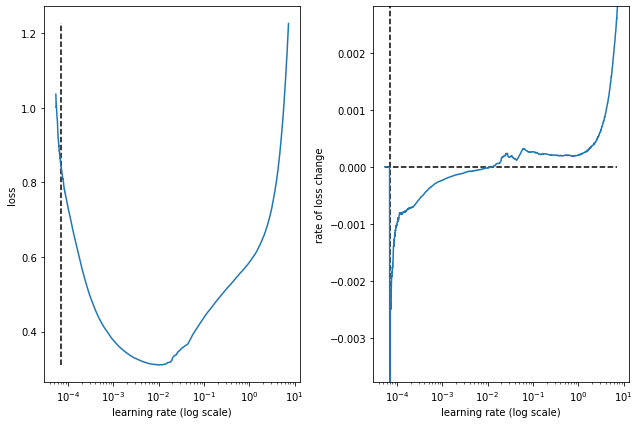

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_64fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_52 (Conv1D)          (None, 138, 64)           4544      
                                                                 
 max_pooling1d_52 (MaxPoolin  (None, 69, 64)           0         
 g1D)                                                            
                                                                 
 flatten_14 (Flatten)        (None, 4416)              0         
                                                                 
 dense_118 (Dense)           (None, 64)                282688    
                                                                 
 dense_119 (Dense)           (None, 32)                2080      
                                                                 
 dense_120 (Dense)           (None, 48)                1584      
   

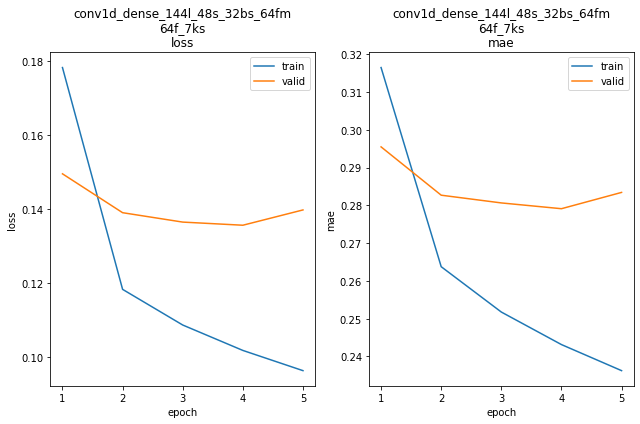

conv1d_dense_144l_48s_32bs_64fm_64f_7ks train min loss: 0.096279	mae: 0.236250	epoch: 5
conv1d_dense_144l_48s_32bs_64fm_64f_7ks valid min loss: 0.135654	mae: 0.279129	epoch: 4

conv1d_dense_144l_48s_32bs_64fm_64f_7ks
Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 205.9135
Function value obtained: 0.1357
Current minimum: 0.1357
Iteration No: 2 started. Evaluating function at random point.
feat_maps 57
filters 18
kern_size 19
Epoch 1/5
5876/5876 [==============================] - 23s 4ms/step - loss: 1.3471 - mae: 0.7026


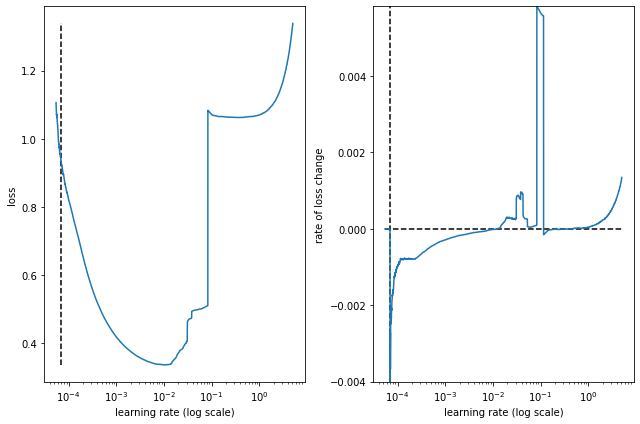

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_57fm_18f_19ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_53 (Conv1D)          (None, 126, 18)           3438      
                                                                 
 max_pooling1d_53 (MaxPoolin  (None, 63, 18)           0         
 g1D)                                                            
                                                                 
 flatten_15 (Flatten)        (None, 1134)              0         
                                                                 
 dense_121 (Dense)           (None, 57)                64695     
                                                                 
 dense_122 (Dense)           (None, 28)                1624      
                                                                 
 dense_123 (Dense)           (None, 48)                1392      
  

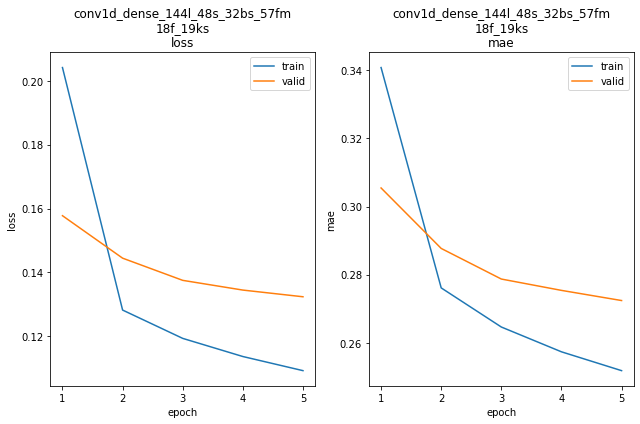

conv1d_dense_144l_48s_32bs_57fm_18f_19ks train min loss: 0.109276	mae: 0.251794	epoch: 5
conv1d_dense_144l_48s_32bs_57fm_18f_19ks valid min loss: 0.132394	mae: 0.272390	epoch: 5

conv1d_dense_144l_48s_32bs_57fm_18f_19ks
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 200.8666
Function value obtained: 0.1324
Current minimum: 0.1324
Iteration No: 3 started. Evaluating function at random point.
feat_maps 51
filters 33
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 24s 4ms/step - loss: 1.3468 - mae: 0.7860


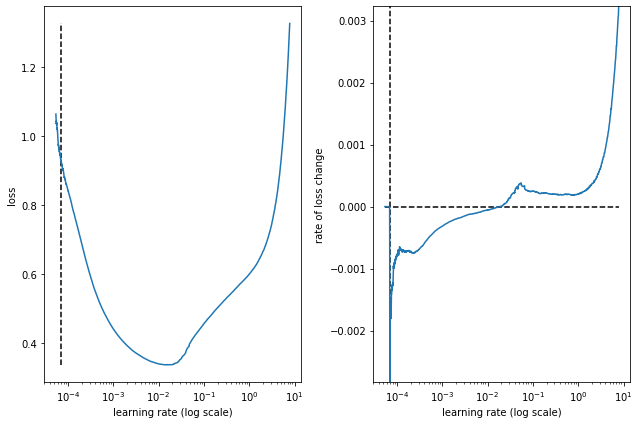

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_51fm_33f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_54 (Conv1D)          (None, 140, 33)           1683      
                                                                 
 max_pooling1d_54 (MaxPoolin  (None, 70, 33)           0         
 g1D)                                                            
                                                                 
 flatten_16 (Flatten)        (None, 2310)              0         
                                                                 
 dense_124 (Dense)           (None, 51)                117861    
                                                                 
 dense_125 (Dense)           (None, 25)                1300      
                                                                 
 dense_126 (Dense)           (None, 48)                1248      
   

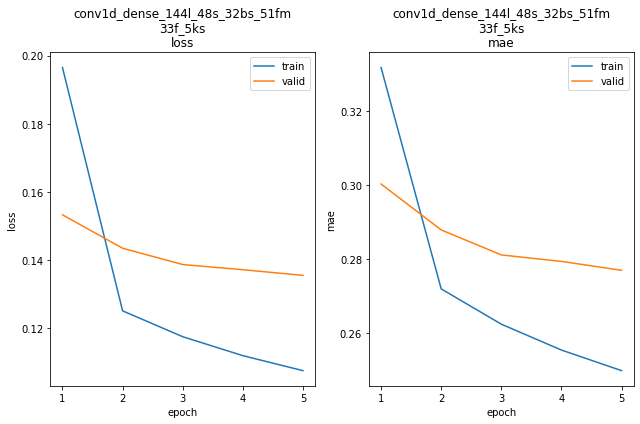

conv1d_dense_144l_48s_32bs_51fm_33f_5ks train min loss: 0.107621	mae: 0.249908	epoch: 5
conv1d_dense_144l_48s_32bs_51fm_33f_5ks valid min loss: 0.135565	mae: 0.277001	epoch: 5

conv1d_dense_144l_48s_32bs_51fm_33f_5ks
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 216.4399
Function value obtained: 0.1356
Current minimum: 0.1324
Iteration No: 4 started. Evaluating function at random point.
feat_maps 47
filters 27
kern_size 6
Epoch 1/5
5876/5876 [==============================] - 17s 3ms/step - loss: 75.8297 - mae: 0.6516


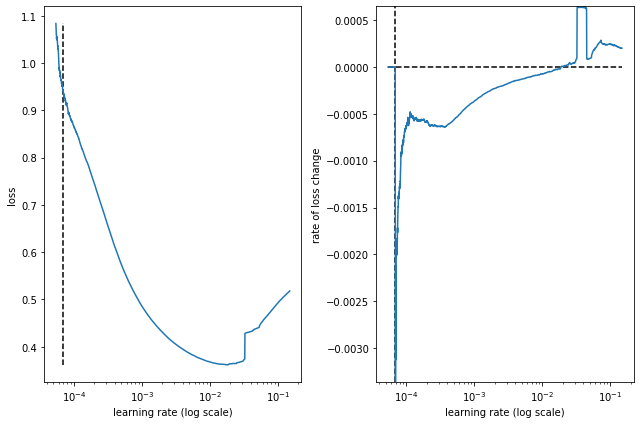

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_47fm_27f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_55 (Conv1D)          (None, 139, 27)           1647      
                                                                 
 max_pooling1d_55 (MaxPoolin  (None, 69, 27)           0         
 g1D)                                                            
                                                                 
 flatten_17 (Flatten)        (None, 1863)              0         
                                                                 
 dense_127 (Dense)           (None, 47)                87608     
                                                                 
 dense_128 (Dense)           (None, 23)                1104      
                                                                 
 dense_129 (Dense)           (None, 48)                1152      
   

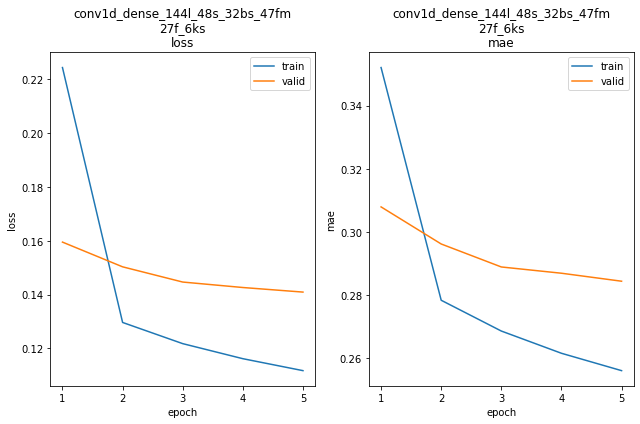

conv1d_dense_144l_48s_32bs_47fm_27f_6ks train min loss: 0.111719	mae: 0.256150	epoch: 5
conv1d_dense_144l_48s_32bs_47fm_27f_6ks valid min loss: 0.140917	mae: 0.284434	epoch: 5

conv1d_dense_144l_48s_32bs_47fm_27f_6ks
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 185.7950
Function value obtained: 0.1409
Current minimum: 0.1324
Iteration No: 5 started. Evaluating function at random point.
feat_maps 53
filters 11
kern_size 18
Epoch 1/5
5876/5876 [==============================] - 25s 4ms/step - loss: 1.4544 - mae: 0.7922


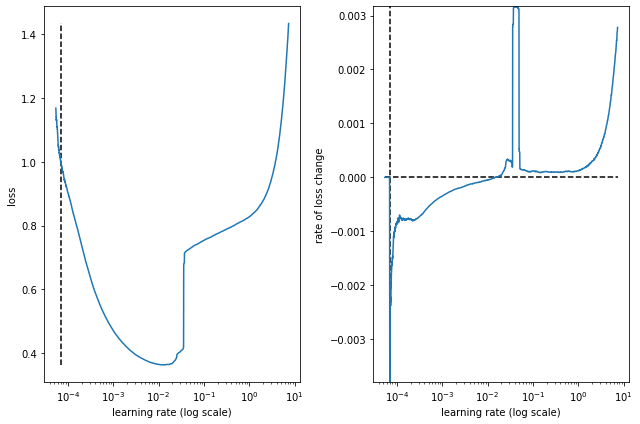

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_53fm_11f_18ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_56 (Conv1D)          (None, 127, 11)           1991      
                                                                 
 max_pooling1d_56 (MaxPoolin  (None, 63, 11)           0         
 g1D)                                                            
                                                                 
 flatten_18 (Flatten)        (None, 693)               0         
                                                                 
 dense_130 (Dense)           (None, 53)                36782     
                                                                 
 dense_131 (Dense)           (None, 26)                1404      
                                                                 
 dense_132 (Dense)           (None, 48)                1296      
  

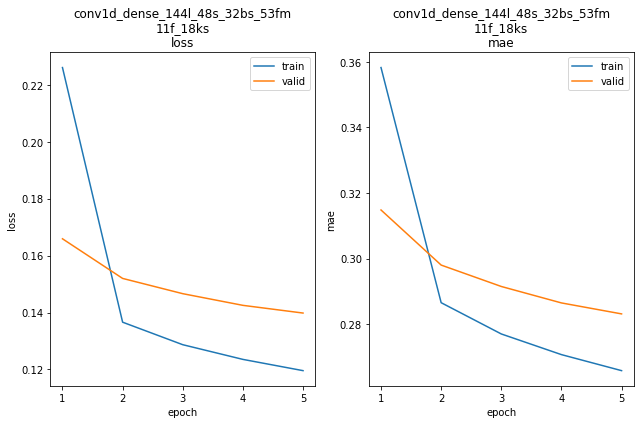

conv1d_dense_144l_48s_32bs_53fm_11f_18ks train min loss: 0.119571	mae: 0.265833	epoch: 5
conv1d_dense_144l_48s_32bs_53fm_11f_18ks valid min loss: 0.139806	mae: 0.283134	epoch: 5

conv1d_dense_144l_48s_32bs_53fm_11f_18ks
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 220.3709
Function value obtained: 0.1398
Current minimum: 0.1324
Iteration No: 6 started. Evaluating function at random point.
feat_maps 62
filters 8
kern_size 24
Epoch 1/5
5876/5876 [==============================] - 16s 3ms/step - loss: 2.0070 - mae: 0.5415


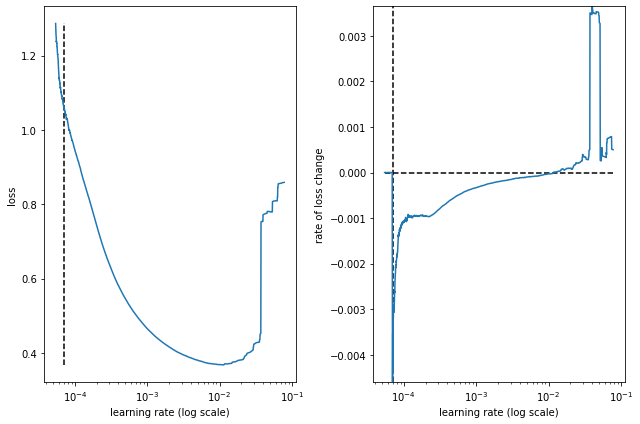

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_62fm_8f_24ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_57 (Conv1D)          (None, 121, 8)            1928      
                                                                 
 max_pooling1d_57 (MaxPoolin  (None, 60, 8)            0         
 g1D)                                                            
                                                                 
 flatten_19 (Flatten)        (None, 480)               0         
                                                                 
 dense_133 (Dense)           (None, 62)                29822     
                                                                 
 dense_134 (Dense)           (None, 31)                1953      
                                                                 
 dense_135 (Dense)           (None, 48)                1536      
   

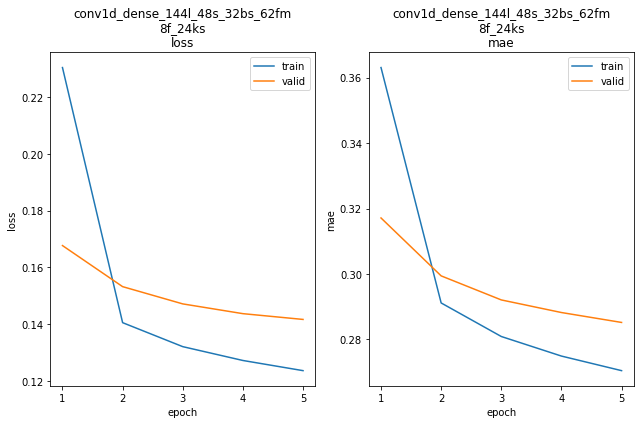

conv1d_dense_144l_48s_32bs_62fm_8f_24ks train min loss: 0.123586	mae: 0.270459	epoch: 5
conv1d_dense_144l_48s_32bs_62fm_8f_24ks valid min loss: 0.141645	mae: 0.285188	epoch: 5

conv1d_dense_144l_48s_32bs_62fm_8f_24ks
Iteration No: 6 ended. Evaluation done at random point.
Time taken: 193.5047
Function value obtained: 0.1416
Current minimum: 0.1324
Iteration No: 7 started. Evaluating function at random point.
feat_maps 52
filters 42
kern_size 3
Epoch 1/5
5876/5876 [==============================] - 26s 4ms/step - loss: 1.2642 - mae: 0.7104


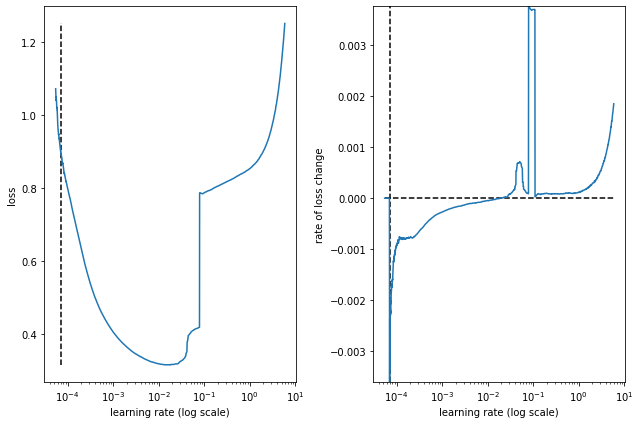

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_52fm_42f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_58 (Conv1D)          (None, 142, 42)           1302      
                                                                 
 max_pooling1d_58 (MaxPoolin  (None, 71, 42)           0         
 g1D)                                                            
                                                                 
 flatten_20 (Flatten)        (None, 2982)              0         
                                                                 
 dense_136 (Dense)           (None, 52)                155116    
                                                                 
 dense_137 (Dense)           (None, 26)                1378      
                                                                 
 dense_138 (Dense)           (None, 48)                1296      
   

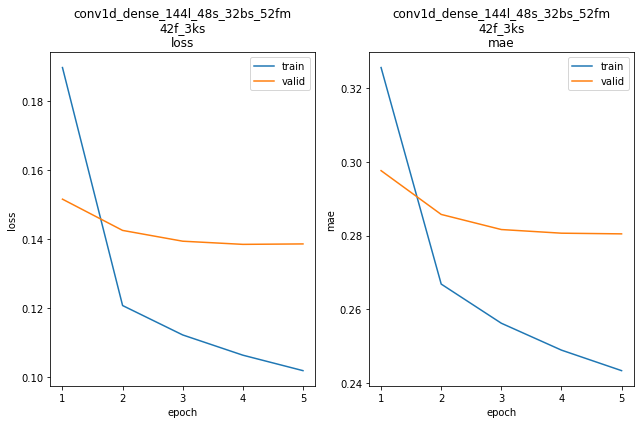

conv1d_dense_144l_48s_32bs_52fm_42f_3ks train min loss: 0.101980	mae: 0.243353	epoch: 5
conv1d_dense_144l_48s_32bs_52fm_42f_3ks valid min loss: 0.138577	mae: 0.280682	epoch: 4

conv1d_dense_144l_48s_32bs_52fm_42f_3ks
Iteration No: 7 ended. Evaluation done at random point.
Time taken: 176.7031
Function value obtained: 0.1386
Current minimum: 0.1324
Iteration No: 8 started. Evaluating function at random point.
feat_maps 33
filters 37
kern_size 11
Epoch 1/5
5876/5876 [==============================] - 26s 4ms/step - loss: 1.4692 - mae: 0.8023


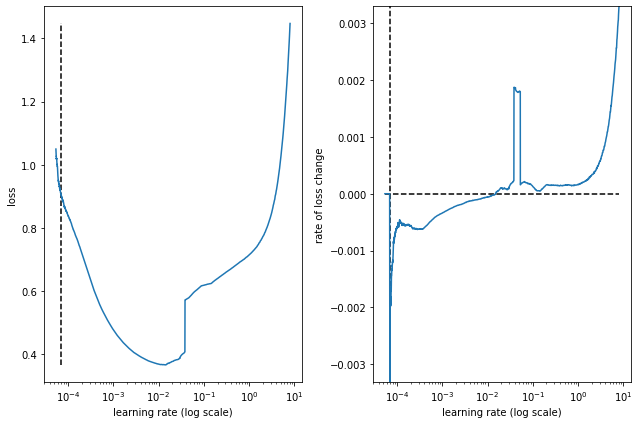

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_33fm_37f_11ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_59 (Conv1D)          (None, 134, 37)           4107      
                                                                 
 max_pooling1d_59 (MaxPoolin  (None, 67, 37)           0         
 g1D)                                                            
                                                                 
 flatten_21 (Flatten)        (None, 2479)              0         
                                                                 
 dense_139 (Dense)           (None, 33)                81840     
                                                                 
 dense_140 (Dense)           (None, 16)                544       
                                                                 
 dense_141 (Dense)           (None, 48)                816       
  

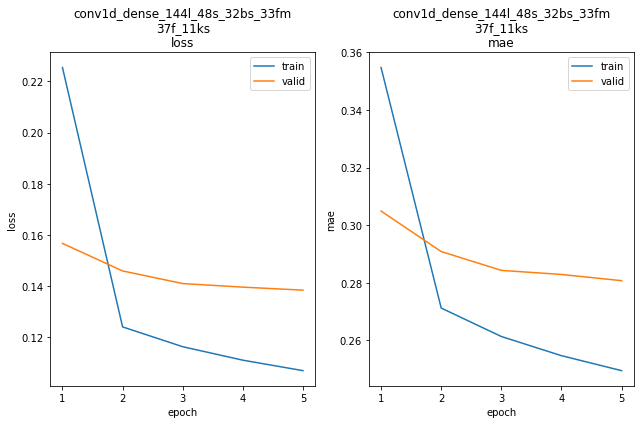

conv1d_dense_144l_48s_32bs_33fm_37f_11ks train min loss: 0.107039	mae: 0.249461	epoch: 5
conv1d_dense_144l_48s_32bs_33fm_37f_11ks valid min loss: 0.138479	mae: 0.280720	epoch: 5

conv1d_dense_144l_48s_32bs_33fm_37f_11ks
Iteration No: 8 ended. Evaluation done at random point.
Time taken: 220.2919
Function value obtained: 0.1385
Current minimum: 0.1324
Iteration No: 9 started. Evaluating function at random point.
feat_maps 33
filters 63
kern_size 8
Epoch 1/5
5876/5876 [==============================] - 27s 4ms/step - loss: 1.4704 - mae: 0.8208


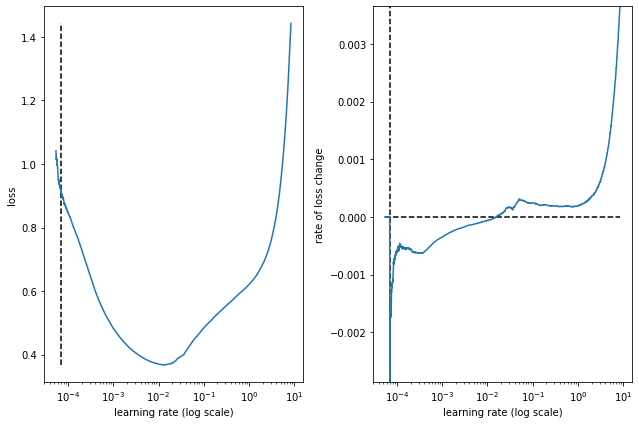

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_33fm_63f_8ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_60 (Conv1D)          (None, 137, 63)           5103      
                                                                 
 max_pooling1d_60 (MaxPoolin  (None, 68, 63)           0         
 g1D)                                                            
                                                                 
 flatten_22 (Flatten)        (None, 4284)              0         
                                                                 
 dense_142 (Dense)           (None, 33)                141405    
                                                                 
 dense_143 (Dense)           (None, 16)                544       
                                                                 
 dense_144 (Dense)           (None, 48)                816       
   

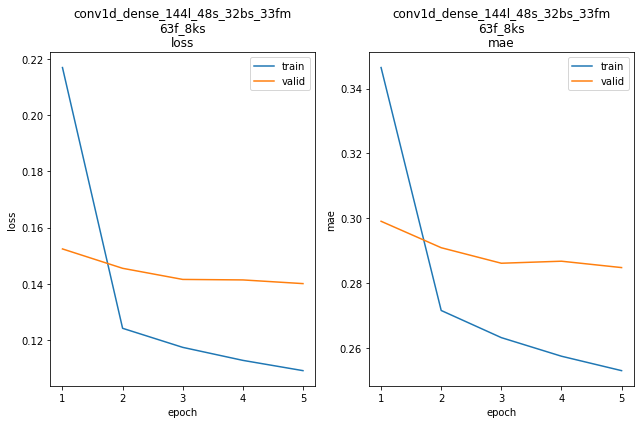

conv1d_dense_144l_48s_32bs_33fm_63f_8ks train min loss: 0.109157	mae: 0.253076	epoch: 5
conv1d_dense_144l_48s_32bs_33fm_63f_8ks valid min loss: 0.140096	mae: 0.284837	epoch: 5

conv1d_dense_144l_48s_32bs_33fm_63f_8ks
Iteration No: 9 ended. Evaluation done at random point.
Time taken: 211.1621
Function value obtained: 0.1401
Current minimum: 0.1324
Iteration No: 10 started. Evaluating function at random point.
feat_maps 35
filters 43
kern_size 11
Epoch 1/5
5876/5876 [==============================] - 27s 4ms/step - loss: 1.5654 - mae: 0.8281


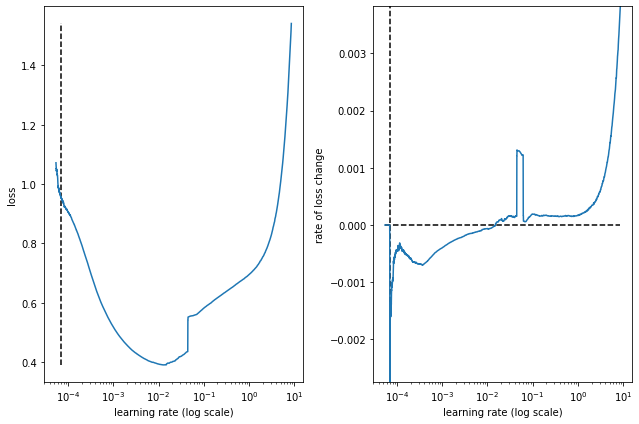

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_35fm_43f_11ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_61 (Conv1D)          (None, 134, 43)           4773      
                                                                 
 max_pooling1d_61 (MaxPoolin  (None, 67, 43)           0         
 g1D)                                                            
                                                                 
 flatten_23 (Flatten)        (None, 2881)              0         
                                                                 
 dense_145 (Dense)           (None, 35)                100870    
                                                                 
 dense_146 (Dense)           (None, 17)                612       
                                                                 
 dense_147 (Dense)           (None, 48)                864       
  

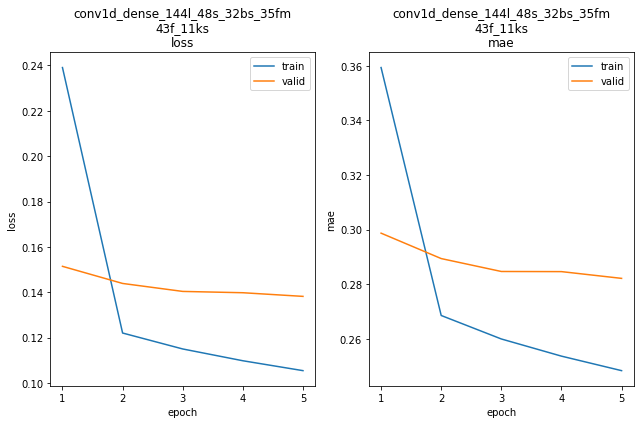

conv1d_dense_144l_48s_32bs_35fm_43f_11ks train min loss: 0.105472	mae: 0.248376	epoch: 5
conv1d_dense_144l_48s_32bs_35fm_43f_11ks valid min loss: 0.138211	mae: 0.282164	epoch: 5

conv1d_dense_144l_48s_32bs_35fm_43f_11ks
Iteration No: 10 ended. Evaluation done at random point.
Time taken: 177.1981
Function value obtained: 0.1382
Current minimum: 0.1324
Iteration No: 11 started. Evaluating function at random point.
feat_maps 63
filters 34
kern_size 21
Epoch 1/5
5876/5876 [==============================] - 26s 4ms/step - loss: 1.2709 - mae: 0.7701


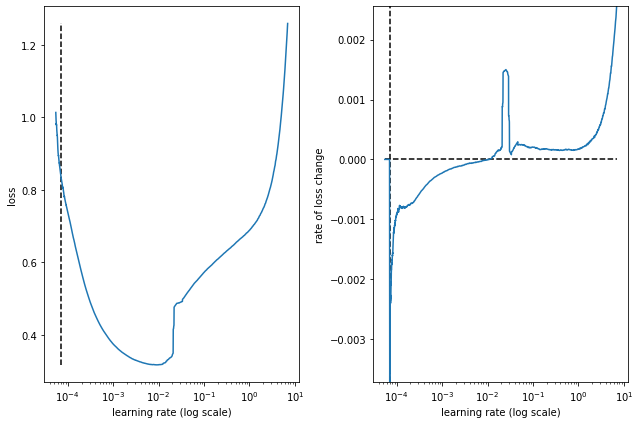

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_63fm_34f_21ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_62 (Conv1D)          (None, 124, 34)           7174      
                                                                 
 max_pooling1d_62 (MaxPoolin  (None, 62, 34)           0         
 g1D)                                                            
                                                                 
 flatten_24 (Flatten)        (None, 2108)              0         
                                                                 
 dense_148 (Dense)           (None, 63)                132867    
                                                                 
 dense_149 (Dense)           (None, 31)                1984      
                                                                 
 dense_150 (Dense)           (None, 48)                1536      
  

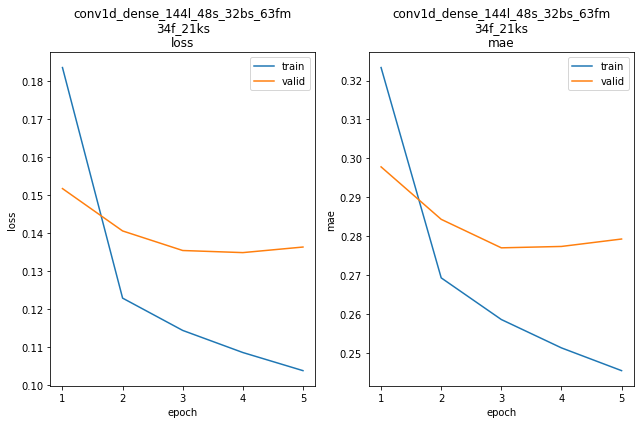

conv1d_dense_144l_48s_32bs_63fm_34f_21ks train min loss: 0.103882	mae: 0.245450	epoch: 5
conv1d_dense_144l_48s_32bs_63fm_34f_21ks valid min loss: 0.134895	mae: 0.277363	epoch: 4

conv1d_dense_144l_48s_32bs_63fm_34f_21ks
Iteration No: 11 ended. Evaluation done at random point.
Time taken: 220.3631
Function value obtained: 0.1349
Current minimum: 0.1324
Iteration No: 12 started. Evaluating function at random point.
feat_maps 32
filters 20
kern_size 10
Epoch 1/5
5876/5876 [==============================] - 28s 5ms/step - loss: 1.4918 - mae: 0.8119


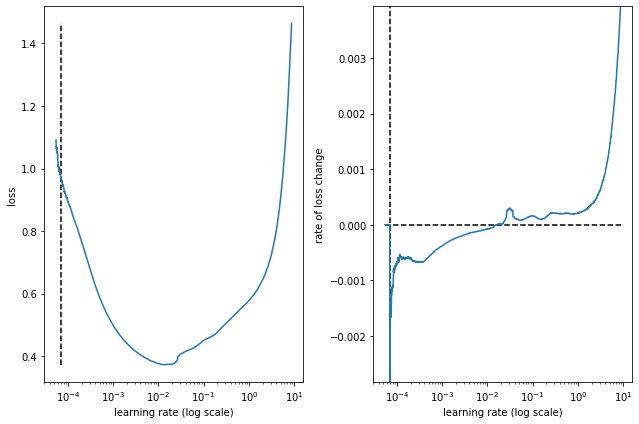

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_32fm_20f_10ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_63 (Conv1D)          (None, 135, 20)           2020      
                                                                 
 max_pooling1d_63 (MaxPoolin  (None, 67, 20)           0         
 g1D)                                                            
                                                                 
 flatten_25 (Flatten)        (None, 1340)              0         
                                                                 
 dense_151 (Dense)           (None, 32)                42912     
                                                                 
 dense_152 (Dense)           (None, 16)                528       
                                                                 
 dense_153 (Dense)           (None, 48)                816       
  

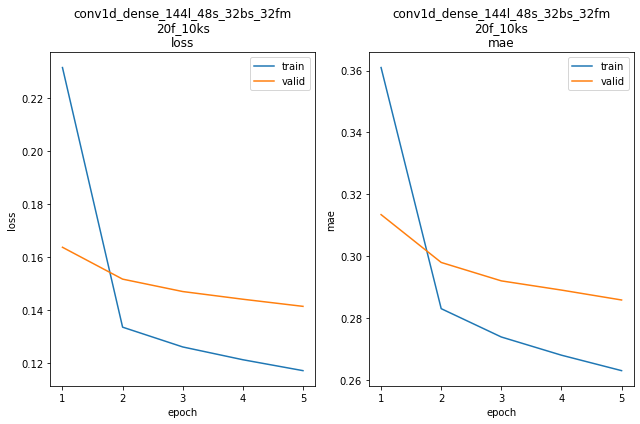

conv1d_dense_144l_48s_32bs_32fm_20f_10ks train min loss: 0.117258	mae: 0.263006	epoch: 5
conv1d_dense_144l_48s_32bs_32fm_20f_10ks valid min loss: 0.141500	mae: 0.285843	epoch: 5

conv1d_dense_144l_48s_32bs_32fm_20f_10ks
Iteration No: 12 ended. Evaluation done at random point.
Time taken: 178.0966
Function value obtained: 0.1415
Current minimum: 0.1324
Iteration No: 13 started. Searching for the next optimal point.
feat_maps 51
filters 35
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 27s 5ms/step - loss: 1.3220 - mae: 0.7626


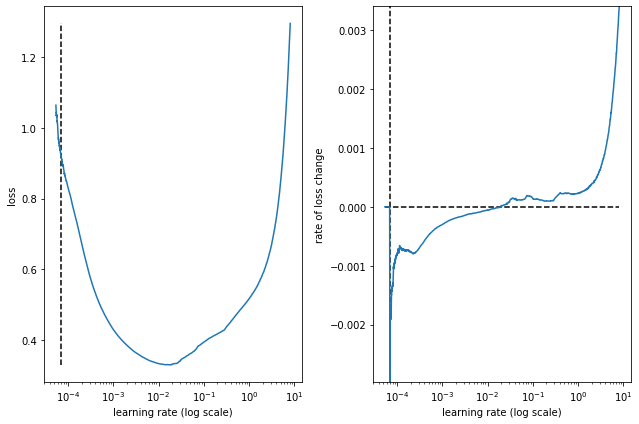

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_51fm_35f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_64 (Conv1D)          (None, 140, 35)           1785      
                                                                 
 max_pooling1d_64 (MaxPoolin  (None, 70, 35)           0         
 g1D)                                                            
                                                                 
 flatten_26 (Flatten)        (None, 2450)              0         
                                                                 
 dense_154 (Dense)           (None, 51)                125001    
                                                                 
 dense_155 (Dense)           (None, 25)                1300      
                                                                 
 dense_156 (Dense)           (None, 48)                1248      
   

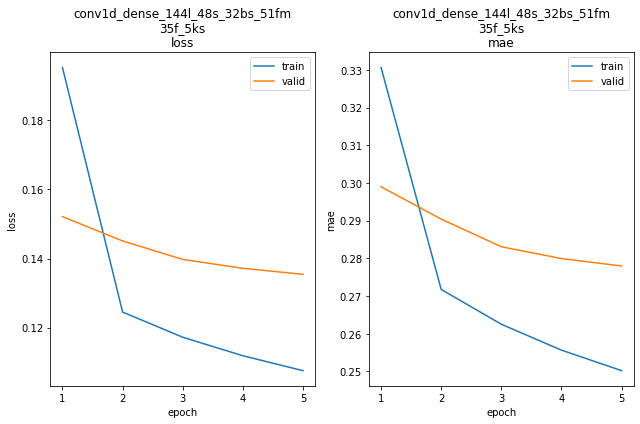

conv1d_dense_144l_48s_32bs_51fm_35f_5ks train min loss: 0.107569	mae: 0.250222	epoch: 5
conv1d_dense_144l_48s_32bs_51fm_35f_5ks valid min loss: 0.135446	mae: 0.277983	epoch: 5

conv1d_dense_144l_48s_32bs_51fm_35f_5ks
Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 206.7753
Function value obtained: 0.1354
Current minimum: 0.1324
Iteration No: 14 started. Searching for the next optimal point.
feat_maps 60
filters 24
kern_size 20
Epoch 1/5
5876/5876 [==============================] - 15s 2ms/step - loss: 1.5569 - mae: 0.4760


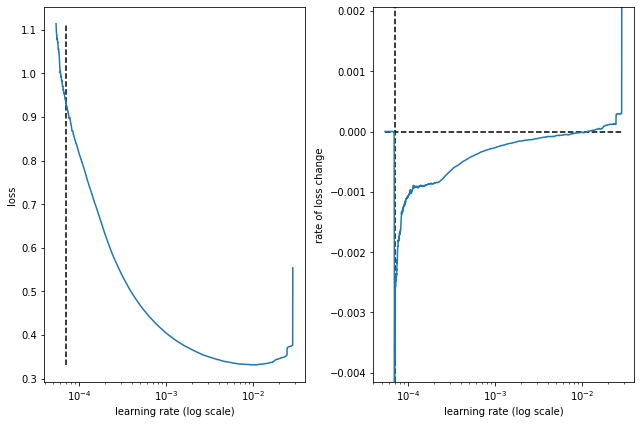

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_60fm_24f_20ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_65 (Conv1D)          (None, 125, 24)           4824      
                                                                 
 max_pooling1d_65 (MaxPoolin  (None, 62, 24)           0         
 g1D)                                                            
                                                                 
 flatten_27 (Flatten)        (None, 1488)              0         
                                                                 
 dense_157 (Dense)           (None, 60)                89340     
                                                                 
 dense_158 (Dense)           (None, 30)                1830      
                                                                 
 dense_159 (Dense)           (None, 48)                1488      
  

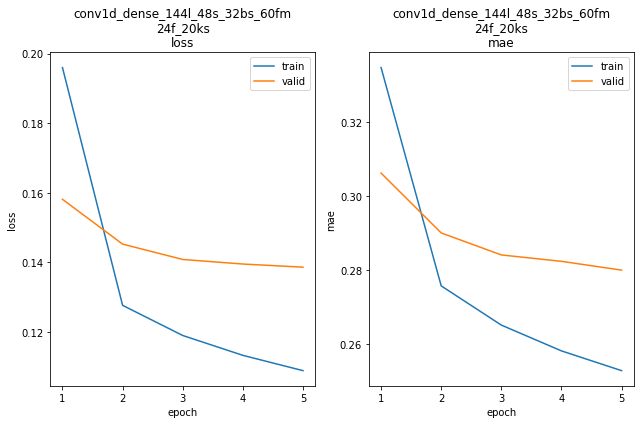

conv1d_dense_144l_48s_32bs_60fm_24f_20ks train min loss: 0.108899	mae: 0.252908	epoch: 5
conv1d_dense_144l_48s_32bs_60fm_24f_20ks valid min loss: 0.138639	mae: 0.280066	epoch: 5

conv1d_dense_144l_48s_32bs_60fm_24f_20ks
Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 214.2742
Function value obtained: 0.1386
Current minimum: 0.1324
Iteration No: 15 started. Searching for the next optimal point.
feat_maps 61
filters 34
kern_size 22
Epoch 1/5
5876/5876 [==============================] - 28s 5ms/step - loss: 1.3067 - mae: 0.7814


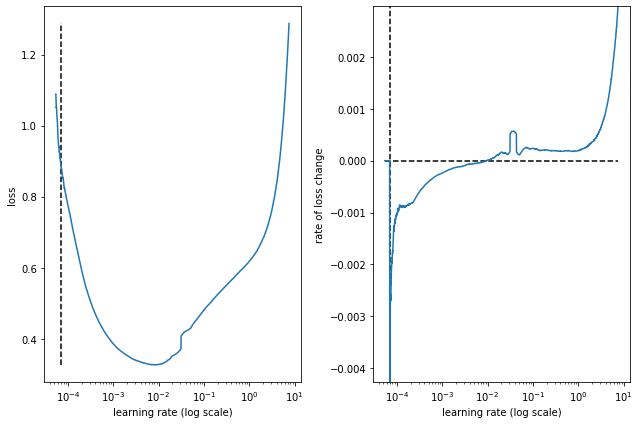

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_61fm_34f_22ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_66 (Conv1D)          (None, 123, 34)           7514      
                                                                 
 max_pooling1d_66 (MaxPoolin  (None, 61, 34)           0         
 g1D)                                                            
                                                                 
 flatten_28 (Flatten)        (None, 2074)              0         
                                                                 
 dense_160 (Dense)           (None, 61)                126575    
                                                                 
 dense_161 (Dense)           (None, 30)                1860      
                                                                 
 dense_162 (Dense)           (None, 48)                1488      
  

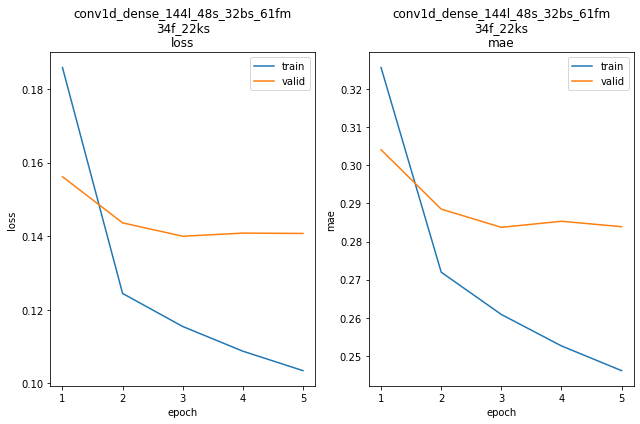

conv1d_dense_144l_48s_32bs_61fm_34f_22ks train min loss: 0.103441	mae: 0.246149	epoch: 5
conv1d_dense_144l_48s_32bs_61fm_34f_22ks valid min loss: 0.139972	mae: 0.283716	epoch: 3

conv1d_dense_144l_48s_32bs_61fm_34f_22ks
Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 178.8716
Function value obtained: 0.1400
Current minimum: 0.1324
Iteration No: 16 started. Searching for the next optimal point.
feat_maps 52
filters 64
kern_size 4
Epoch 1/5
5876/5876 [==============================] - 19s 3ms/step - loss: 1.6104 - mae: 0.5248


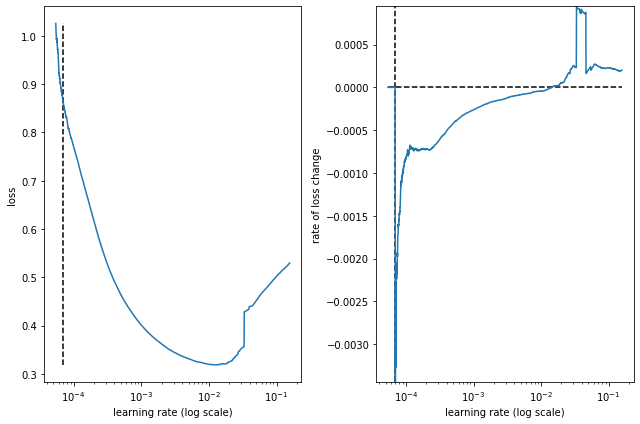

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_52fm_64f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_67 (Conv1D)          (None, 141, 64)           2624      
                                                                 
 max_pooling1d_67 (MaxPoolin  (None, 70, 64)           0         
 g1D)                                                            
                                                                 
 flatten_29 (Flatten)        (None, 4480)              0         
                                                                 
 dense_163 (Dense)           (None, 52)                233012    
                                                                 
 dense_164 (Dense)           (None, 26)                1378      
                                                                 
 dense_165 (Dense)           (None, 48)                1296      
   

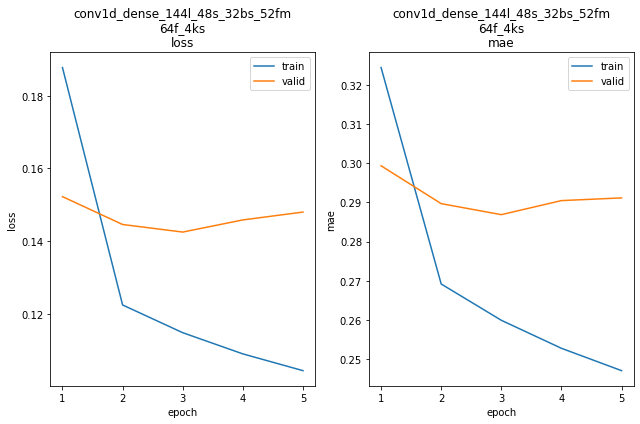

conv1d_dense_144l_48s_32bs_52fm_64f_4ks train min loss: 0.104318	mae: 0.247094	epoch: 5
conv1d_dense_144l_48s_32bs_52fm_64f_4ks valid min loss: 0.142480	mae: 0.286875	epoch: 3

conv1d_dense_144l_48s_32bs_52fm_64f_4ks
Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 199.5117
Function value obtained: 0.1425
Current minimum: 0.1324
Iteration No: 17 started. Searching for the next optimal point.
feat_maps 62
filters 64
kern_size 12
Epoch 1/5
5876/5876 [==============================] - 29s 5ms/step - loss: 1.3890 - mae: 0.7847


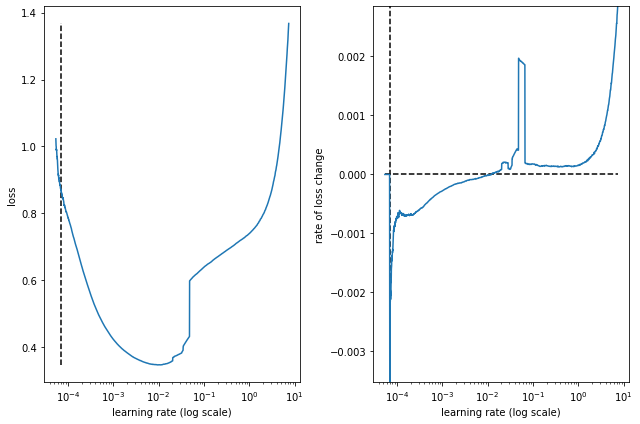

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_62fm_64f_12ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_68 (Conv1D)          (None, 133, 64)           7744      
                                                                 
 max_pooling1d_68 (MaxPoolin  (None, 66, 64)           0         
 g1D)                                                            
                                                                 
 flatten_30 (Flatten)        (None, 4224)              0         
                                                                 
 dense_166 (Dense)           (None, 62)                261950    
                                                                 
 dense_167 (Dense)           (None, 31)                1953      
                                                                 
 dense_168 (Dense)           (None, 48)                1536      
  

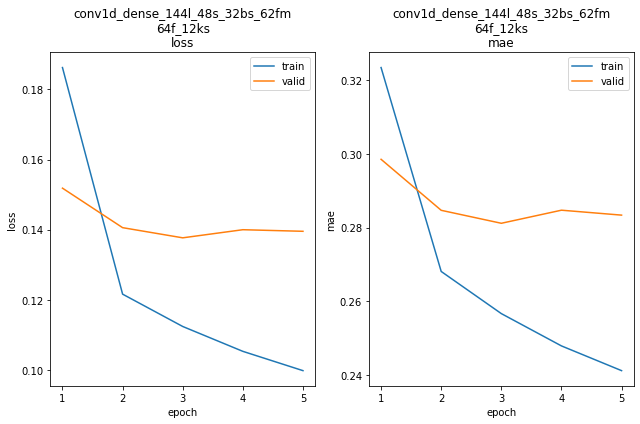

conv1d_dense_144l_48s_32bs_62fm_64f_12ks train min loss: 0.099775	mae: 0.241196	epoch: 5
conv1d_dense_144l_48s_32bs_62fm_64f_12ks valid min loss: 0.137664	mae: 0.281186	epoch: 3

conv1d_dense_144l_48s_32bs_62fm_64f_12ks
Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 220.1205
Function value obtained: 0.1377
Current minimum: 0.1324
Iteration No: 18 started. Searching for the next optimal point.
feat_maps 55
filters 64
kern_size 13
Epoch 1/5
5876/5876 [==============================] - 18s 3ms/step - loss: 6.8527 - mae: 0.5599


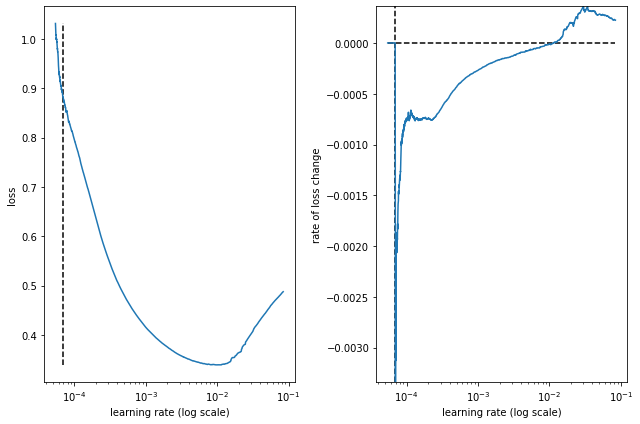

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_55fm_64f_13ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_69 (Conv1D)          (None, 132, 64)           8384      
                                                                 
 max_pooling1d_69 (MaxPoolin  (None, 66, 64)           0         
 g1D)                                                            
                                                                 
 flatten_31 (Flatten)        (None, 4224)              0         
                                                                 
 dense_169 (Dense)           (None, 55)                232375    
                                                                 
 dense_170 (Dense)           (None, 27)                1512      
                                                                 
 dense_171 (Dense)           (None, 48)                1344      
  

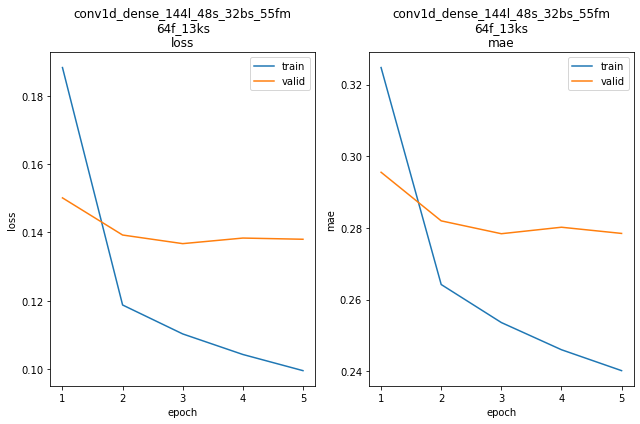

conv1d_dense_144l_48s_32bs_55fm_64f_13ks train min loss: 0.099588	mae: 0.240158	epoch: 5
conv1d_dense_144l_48s_32bs_55fm_64f_13ks valid min loss: 0.136737	mae: 0.278373	epoch: 3

conv1d_dense_144l_48s_32bs_55fm_64f_13ks
Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 185.5760
Function value obtained: 0.1367
Current minimum: 0.1324
Iteration No: 19 started. Searching for the next optimal point.
feat_maps 56
filters 64
kern_size 14
Epoch 1/5
5876/5876 [==============================] - 16s 3ms/step - loss: 2.9780 - mae: 0.4869


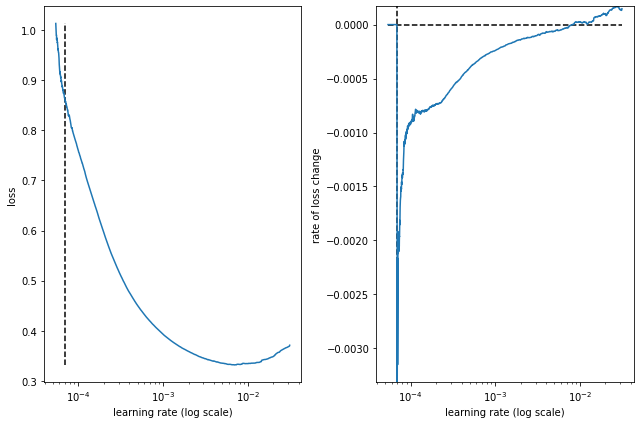

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_56fm_64f_14ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_70 (Conv1D)          (None, 131, 64)           9024      
                                                                 
 max_pooling1d_70 (MaxPoolin  (None, 65, 64)           0         
 g1D)                                                            
                                                                 
 flatten_32 (Flatten)        (None, 4160)              0         
                                                                 
 dense_172 (Dense)           (None, 56)                233016    
                                                                 
 dense_173 (Dense)           (None, 28)                1596      
                                                                 
 dense_174 (Dense)           (None, 48)                1392      
  

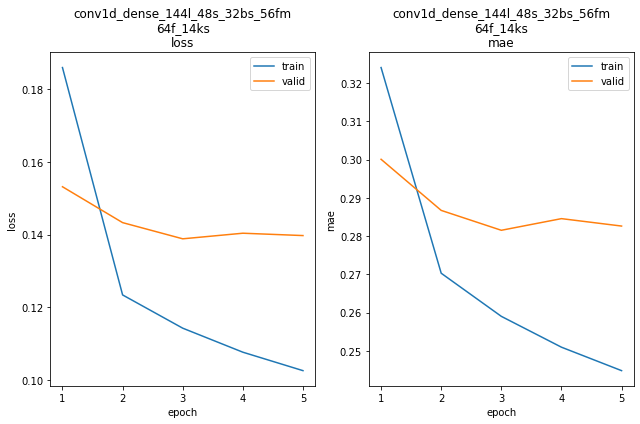

conv1d_dense_144l_48s_32bs_56fm_64f_14ks train min loss: 0.102552	mae: 0.244785	epoch: 5
conv1d_dense_144l_48s_32bs_56fm_64f_14ks valid min loss: 0.138858	mae: 0.281524	epoch: 3

conv1d_dense_144l_48s_32bs_56fm_64f_14ks
Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 184.9204
Function value obtained: 0.1389
Current minimum: 0.1324
Iteration No: 20 started. Searching for the next optimal point.
feat_maps 43
filters 64
kern_size 16
Epoch 1/5
5876/5876 [==============================] - 30s 5ms/step - loss: 1.5673 - mae: 0.8397


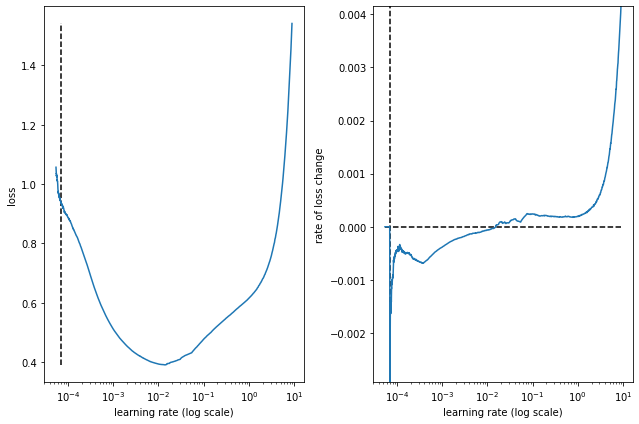

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_43fm_64f_16ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_71 (Conv1D)          (None, 129, 64)           10304     
                                                                 
 max_pooling1d_71 (MaxPoolin  (None, 64, 64)           0         
 g1D)                                                            
                                                                 
 flatten_33 (Flatten)        (None, 4096)              0         
                                                                 
 dense_175 (Dense)           (None, 43)                176171    
                                                                 
 dense_176 (Dense)           (None, 21)                924       
                                                                 
 dense_177 (Dense)           (None, 48)                1056      
  

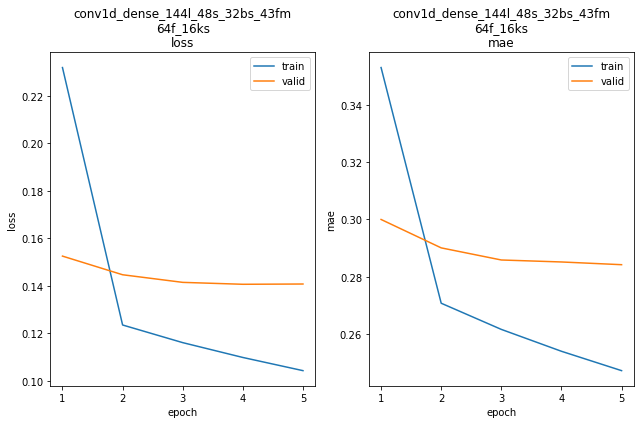

conv1d_dense_144l_48s_32bs_43fm_64f_16ks train min loss: 0.104239	mae: 0.247193	epoch: 5
conv1d_dense_144l_48s_32bs_43fm_64f_16ks valid min loss: 0.140619	mae: 0.285149	epoch: 4

conv1d_dense_144l_48s_32bs_43fm_64f_16ks
Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 165.0921
Function value obtained: 0.1406
Current minimum: 0.1324
Iteration No: 21 started. Searching for the next optimal point.
feat_maps 57
filters 8
kern_size 15
Epoch 1/5
5876/5876 [==============================] - 30s 5ms/step - loss: 1.4154 - mae: 0.8048


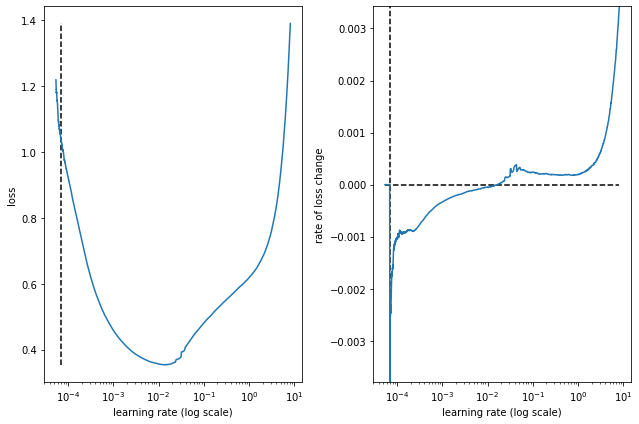

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_57fm_8f_15ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_72 (Conv1D)          (None, 130, 8)            1208      
                                                                 
 max_pooling1d_72 (MaxPoolin  (None, 65, 8)            0         
 g1D)                                                            
                                                                 
 flatten_34 (Flatten)        (None, 520)               0         
                                                                 
 dense_178 (Dense)           (None, 57)                29697     
                                                                 
 dense_179 (Dense)           (None, 28)                1624      
                                                                 
 dense_180 (Dense)           (None, 48)                1392      
   

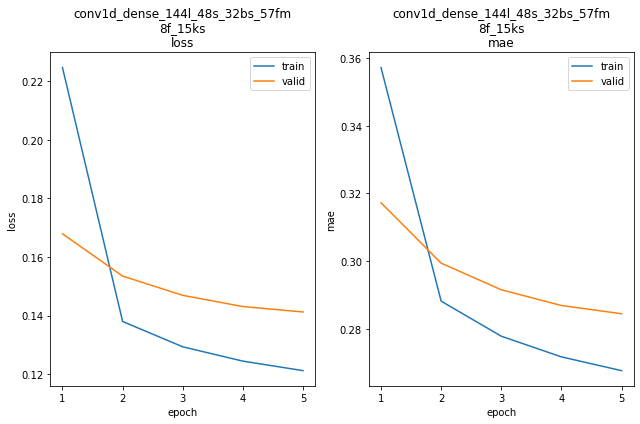

conv1d_dense_144l_48s_32bs_57fm_8f_15ks train min loss: 0.121253	mae: 0.267611	epoch: 5
conv1d_dense_144l_48s_32bs_57fm_8f_15ks valid min loss: 0.141265	mae: 0.284437	epoch: 5

conv1d_dense_144l_48s_32bs_57fm_8f_15ks
Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 234.6795
Function value obtained: 0.1413
Current minimum: 0.1324
Iteration No: 22 started. Searching for the next optimal point.
feat_maps 64
filters 8
kern_size 17
Epoch 1/5
5876/5876 [==============================] - 30s 5ms/step - loss: 1.4534 - mae: 0.8084


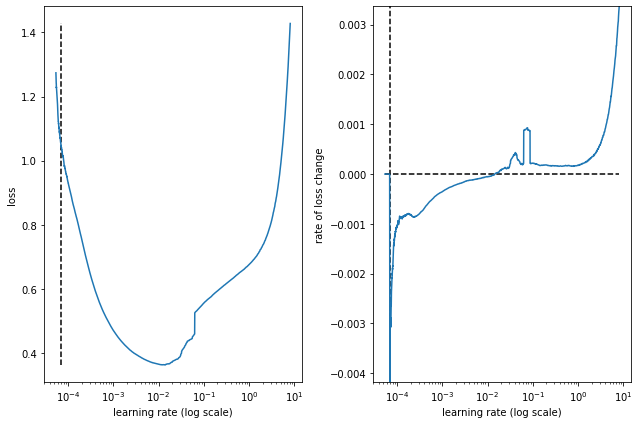

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_64fm_8f_17ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_73 (Conv1D)          (None, 128, 8)            1368      
                                                                 
 max_pooling1d_73 (MaxPoolin  (None, 64, 8)            0         
 g1D)                                                            
                                                                 
 flatten_35 (Flatten)        (None, 512)               0         
                                                                 
 dense_181 (Dense)           (None, 64)                32832     
                                                                 
 dense_182 (Dense)           (None, 32)                2080      
                                                                 
 dense_183 (Dense)           (None, 48)                1584      
   

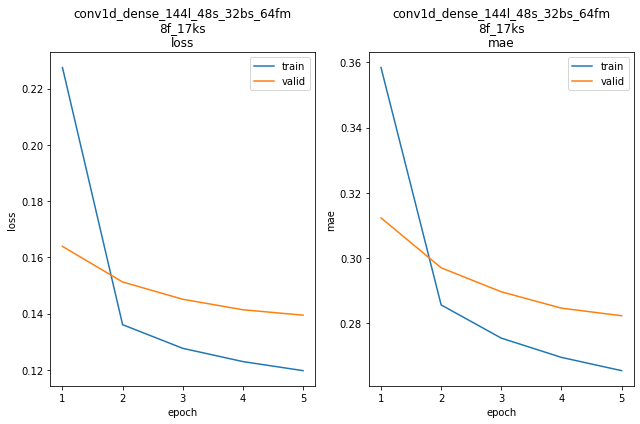

conv1d_dense_144l_48s_32bs_64fm_8f_17ks train min loss: 0.119746	mae: 0.265467	epoch: 5
conv1d_dense_144l_48s_32bs_64fm_8f_17ks valid min loss: 0.139466	mae: 0.282311	epoch: 5

conv1d_dense_144l_48s_32bs_64fm_8f_17ks
Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 192.7014
Function value obtained: 0.1395
Current minimum: 0.1324
Iteration No: 23 started. Searching for the next optimal point.
feat_maps 35
filters 64
kern_size 23
Epoch 1/5
5876/5876 [==============================] - 30s 5ms/step - loss: 1.6133 - mae: 0.8042


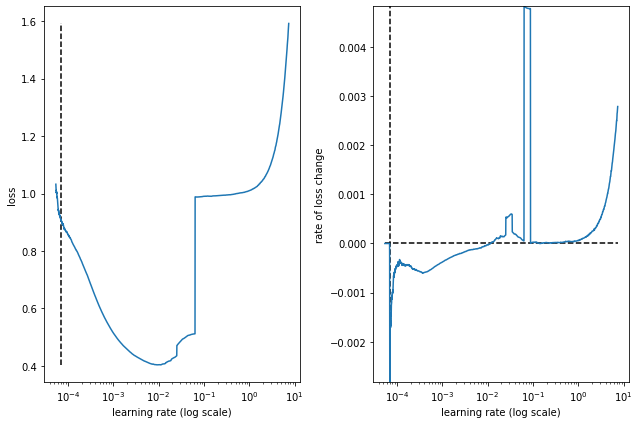

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_35fm_64f_23ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_74 (Conv1D)          (None, 122, 64)           14784     
                                                                 
 max_pooling1d_74 (MaxPoolin  (None, 61, 64)           0         
 g1D)                                                            
                                                                 
 flatten_36 (Flatten)        (None, 3904)              0         
                                                                 
 dense_184 (Dense)           (None, 35)                136675    
                                                                 
 dense_185 (Dense)           (None, 17)                612       
                                                                 
 dense_186 (Dense)           (None, 48)                864       
  

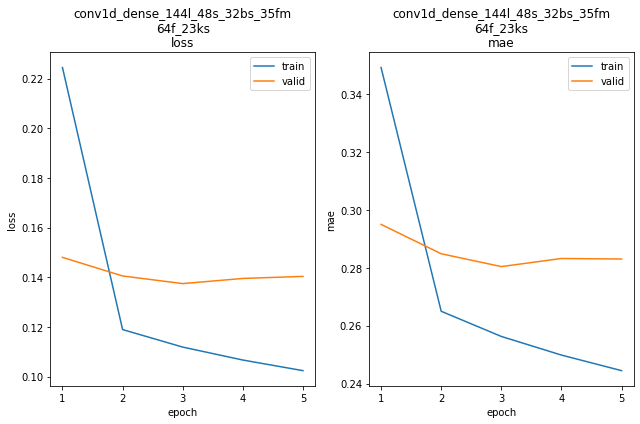

conv1d_dense_144l_48s_32bs_35fm_64f_23ks train min loss: 0.102385	mae: 0.244477	epoch: 5
conv1d_dense_144l_48s_32bs_35fm_64f_23ks valid min loss: 0.137432	mae: 0.280412	epoch: 3

conv1d_dense_144l_48s_32bs_35fm_64f_23ks
Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 208.8802
Function value obtained: 0.1374
Current minimum: 0.1324
Iteration No: 24 started. Searching for the next optimal point.
feat_maps 62
filters 64
kern_size 9
Epoch 1/5
5876/5876 [==============================] - 29s 5ms/step - loss: 1.2975 - mae: 0.7819


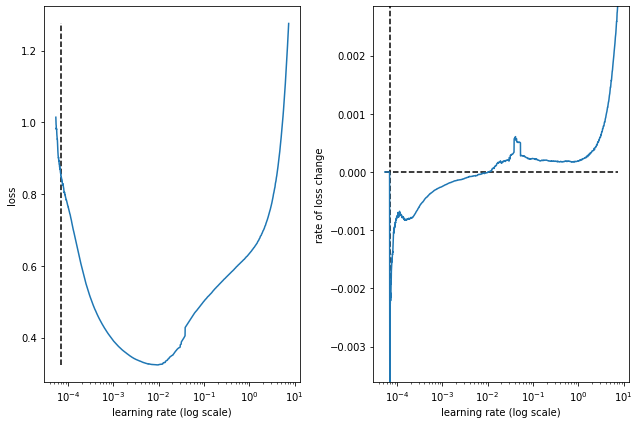

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_62fm_64f_9ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_75 (Conv1D)          (None, 136, 64)           5824      
                                                                 
 max_pooling1d_75 (MaxPoolin  (None, 68, 64)           0         
 g1D)                                                            
                                                                 
 flatten_37 (Flatten)        (None, 4352)              0         
                                                                 
 dense_187 (Dense)           (None, 62)                269886    
                                                                 
 dense_188 (Dense)           (None, 31)                1953      
                                                                 
 dense_189 (Dense)           (None, 48)                1536      
   

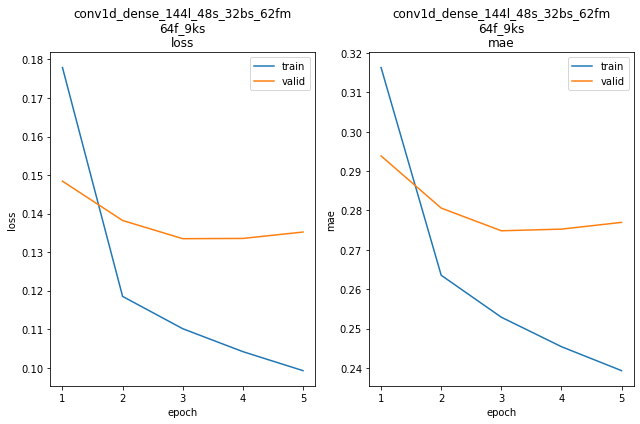

conv1d_dense_144l_48s_32bs_62fm_64f_9ks train min loss: 0.099241	mae: 0.239330	epoch: 5
conv1d_dense_144l_48s_32bs_62fm_64f_9ks valid min loss: 0.133489	mae: 0.274849	epoch: 3

conv1d_dense_144l_48s_32bs_62fm_64f_9ks
Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 221.5215
Function value obtained: 0.1335
Current minimum: 0.1324
Iteration No: 25 started. Searching for the next optimal point.
feat_maps 42
filters 8
kern_size 9
Epoch 1/5
5876/5876 [==============================] - 32s 5ms/step - loss: 1.5294 - mae: 0.8291


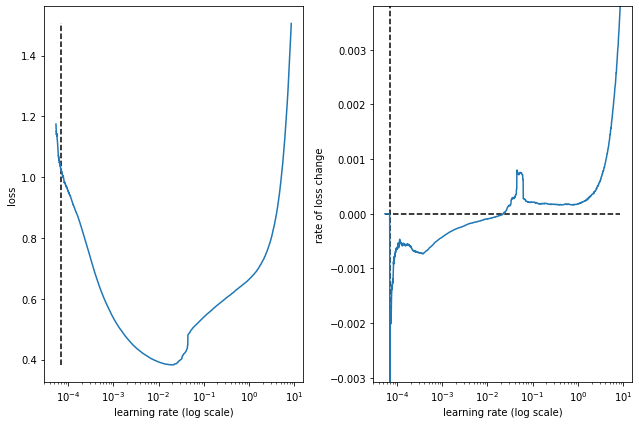

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_42fm_8f_9ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_76 (Conv1D)          (None, 136, 8)            728       
                                                                 
 max_pooling1d_76 (MaxPoolin  (None, 68, 8)            0         
 g1D)                                                            
                                                                 
 flatten_38 (Flatten)        (None, 544)               0         
                                                                 
 dense_190 (Dense)           (None, 42)                22890     
                                                                 
 dense_191 (Dense)           (None, 21)                903       
                                                                 
 dense_192 (Dense)           (None, 48)                1056      
    

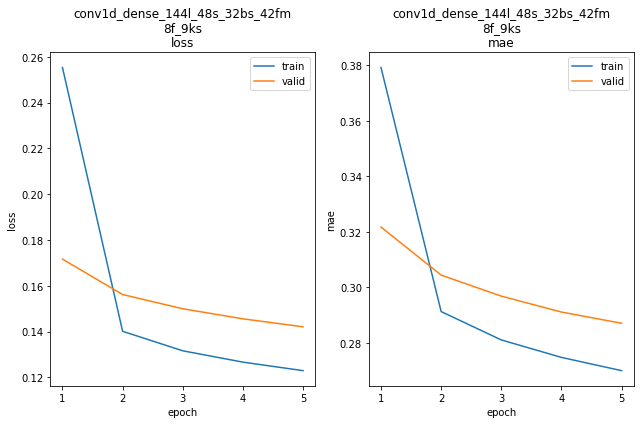

conv1d_dense_144l_48s_32bs_42fm_8f_9ks train min loss: 0.122970	mae: 0.269953	epoch: 5
conv1d_dense_144l_48s_32bs_42fm_8f_9ks valid min loss: 0.142109	mae: 0.287033	epoch: 5

conv1d_dense_144l_48s_32bs_42fm_8f_9ks
Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 221.8874
Function value obtained: 0.1421
Current minimum: 0.1324
Iteration No: 26 started. Searching for the next optimal point.
feat_maps 46
filters 46
kern_size 19
Epoch 1/5
5876/5876 [==============================] - 31s 5ms/step - loss: 1.4487 - mae: 0.8081


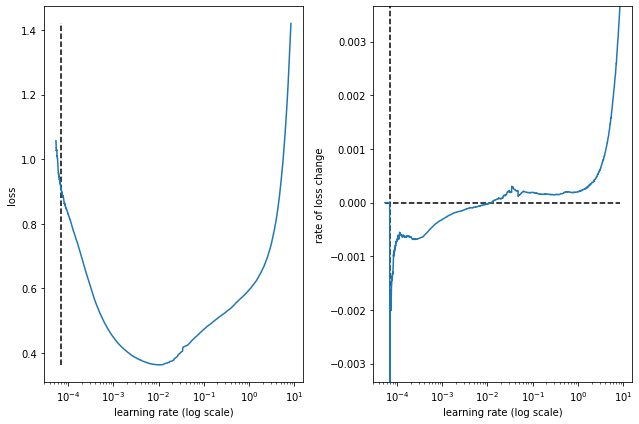

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_46fm_46f_19ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_77 (Conv1D)          (None, 126, 46)           8786      
                                                                 
 max_pooling1d_77 (MaxPoolin  (None, 63, 46)           0         
 g1D)                                                            
                                                                 
 flatten_39 (Flatten)        (None, 2898)              0         
                                                                 
 dense_193 (Dense)           (None, 46)                133354    
                                                                 
 dense_194 (Dense)           (None, 23)                1081      
                                                                 
 dense_195 (Dense)           (None, 48)                1152      
  

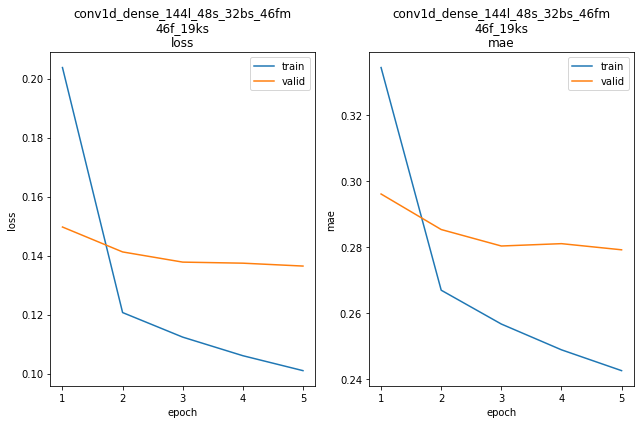

conv1d_dense_144l_48s_32bs_46fm_46f_19ks train min loss: 0.100998	mae: 0.242477	epoch: 5
conv1d_dense_144l_48s_32bs_46fm_46f_19ks valid min loss: 0.136442	mae: 0.279188	epoch: 5

conv1d_dense_144l_48s_32bs_46fm_46f_19ks
Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 210.1346
Function value obtained: 0.1364
Current minimum: 0.1324
Iteration No: 27 started. Searching for the next optimal point.
feat_maps 64
filters 63
kern_size 19
Epoch 1/5
5876/5876 [==============================] - 31s 5ms/step - loss: 1.3227 - mae: 0.7927


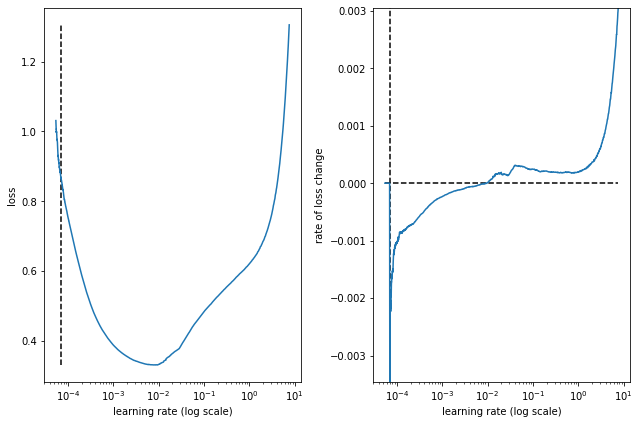

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_64fm_63f_19ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_78 (Conv1D)          (None, 126, 63)           12033     
                                                                 
 max_pooling1d_78 (MaxPoolin  (None, 63, 63)           0         
 g1D)                                                            
                                                                 
 flatten_40 (Flatten)        (None, 3969)              0         
                                                                 
 dense_196 (Dense)           (None, 64)                254080    
                                                                 
 dense_197 (Dense)           (None, 32)                2080      
                                                                 
 dense_198 (Dense)           (None, 48)                1584      
  

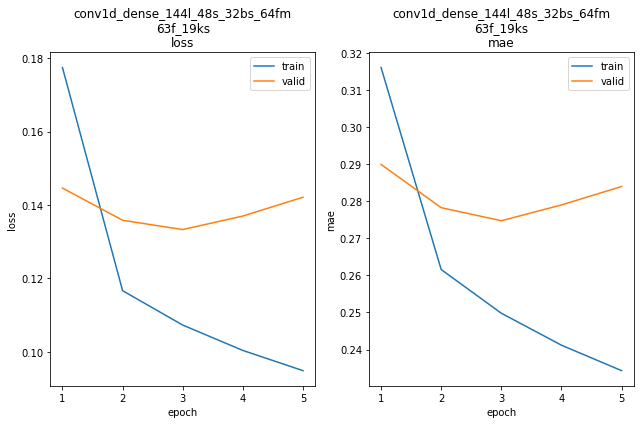

conv1d_dense_144l_48s_32bs_64fm_63f_19ks train min loss: 0.094839	mae: 0.234316	epoch: 5
conv1d_dense_144l_48s_32bs_64fm_63f_19ks valid min loss: 0.133312	mae: 0.274731	epoch: 3

conv1d_dense_144l_48s_32bs_64fm_63f_19ks
Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 196.1895
Function value obtained: 0.1333
Current minimum: 0.1324
Iteration No: 28 started. Searching for the next optimal point.
feat_maps 33
filters 64
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 20s 3ms/step - loss: 2.5148 - mae: 0.5103


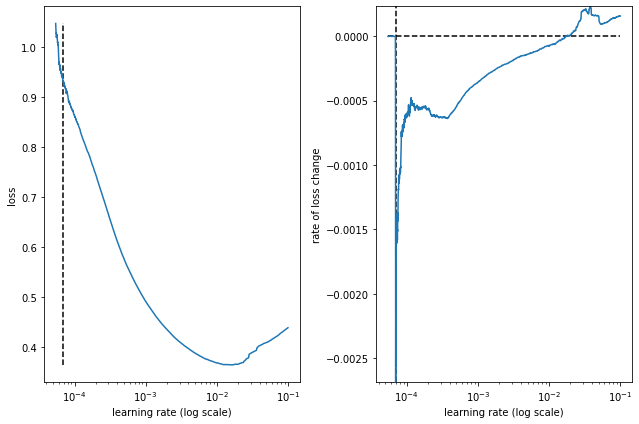

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_33fm_64f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_79 (Conv1D)          (None, 140, 64)           3264      
                                                                 
 max_pooling1d_79 (MaxPoolin  (None, 70, 64)           0         
 g1D)                                                            
                                                                 
 flatten_41 (Flatten)        (None, 4480)              0         
                                                                 
 dense_199 (Dense)           (None, 33)                147873    
                                                                 
 dense_200 (Dense)           (None, 16)                544       
                                                                 
 dense_201 (Dense)           (None, 48)                816       
   

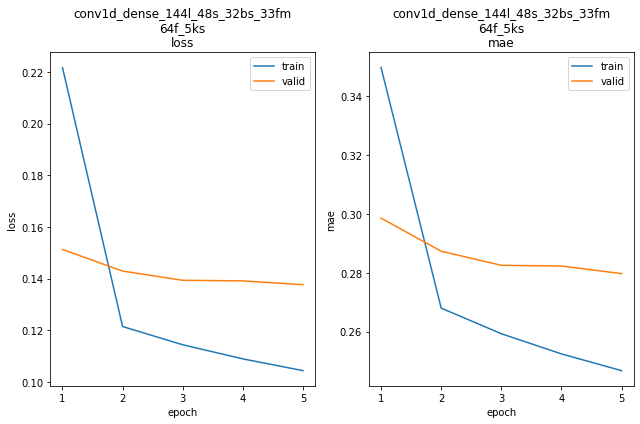

conv1d_dense_144l_48s_32bs_33fm_64f_5ks train min loss: 0.104406	mae: 0.246709	epoch: 5
conv1d_dense_144l_48s_32bs_33fm_64f_5ks valid min loss: 0.137651	mae: 0.279711	epoch: 5

conv1d_dense_144l_48s_32bs_33fm_64f_5ks
Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 185.0772
Function value obtained: 0.1377
Current minimum: 0.1324
Iteration No: 29 started. Searching for the next optimal point.
feat_maps 45
filters 9
kern_size 21
Epoch 1/5
5876/5876 [==============================] - 32s 5ms/step - loss: 1.5202 - mae: 0.8210


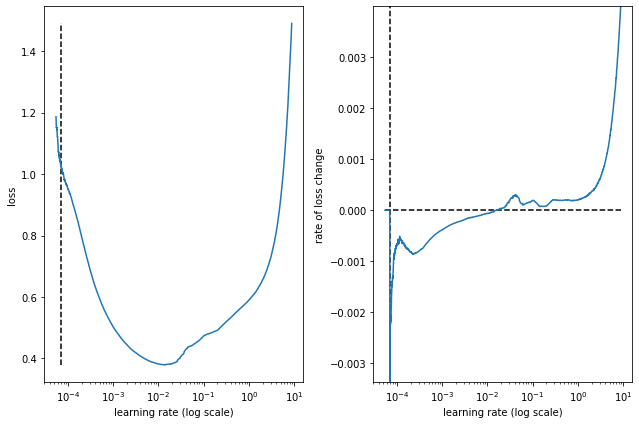

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_45fm_9f_21ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_80 (Conv1D)          (None, 124, 9)            1899      
                                                                 
 max_pooling1d_80 (MaxPoolin  (None, 62, 9)            0         
 g1D)                                                            
                                                                 
 flatten_42 (Flatten)        (None, 558)               0         
                                                                 
 dense_202 (Dense)           (None, 45)                25155     
                                                                 
 dense_203 (Dense)           (None, 22)                1012      
                                                                 
 dense_204 (Dense)           (None, 48)                1104      
   

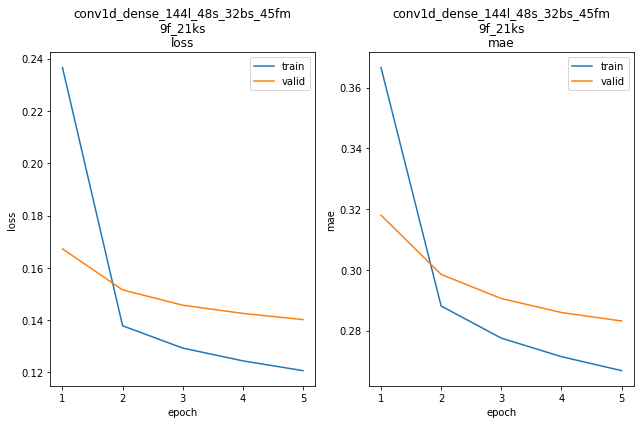

conv1d_dense_144l_48s_32bs_45fm_9f_21ks train min loss: 0.120686	mae: 0.266832	epoch: 5
conv1d_dense_144l_48s_32bs_45fm_9f_21ks valid min loss: 0.140206	mae: 0.283174	epoch: 5

conv1d_dense_144l_48s_32bs_45fm_9f_21ks
Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 224.3307
Function value obtained: 0.1402
Current minimum: 0.1324
Iteration No: 30 started. Searching for the next optimal point.
feat_maps 64
filters 61
kern_size 5
Epoch 1/5
5876/5876 [==============================] - 32s 5ms/step - loss: 1.2676 - mae: 0.7585


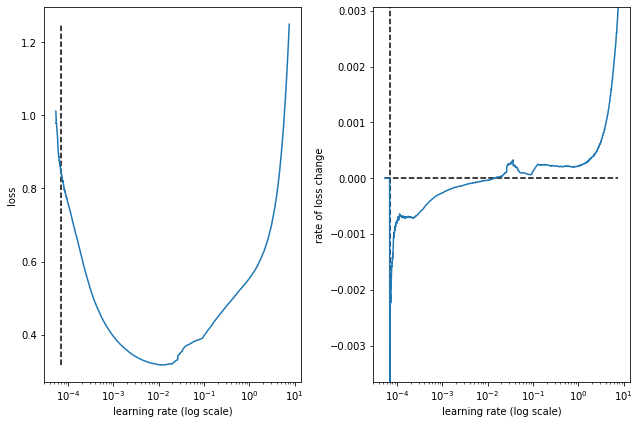

best lr: 6.974441e-05 

Model: "conv1d_dense_144l_48s_32bs_64fm_61f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_81 (Conv1D)          (None, 140, 61)           3111      
                                                                 
 max_pooling1d_81 (MaxPoolin  (None, 70, 61)           0         
 g1D)                                                            
                                                                 
 flatten_43 (Flatten)        (None, 4270)              0         
                                                                 
 dense_205 (Dense)           (None, 64)                273344    
                                                                 
 dense_206 (Dense)           (None, 32)                2080      
                                                                 
 dense_207 (Dense)           (None, 48)                1584      
   

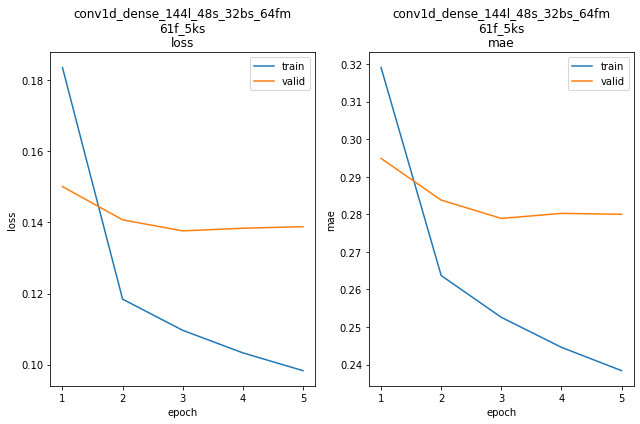

conv1d_dense_144l_48s_32bs_64fm_61f_5ks train min loss: 0.098312	mae: 0.238398	epoch: 5
conv1d_dense_144l_48s_32bs_64fm_61f_5ks valid min loss: 0.137638	mae: 0.278922	epoch: 3

conv1d_dense_144l_48s_32bs_64fm_61f_5ks
Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 212.4999
Function value obtained: 0.1376
Current minimum: 0.1324

[57, 18, 19]
0.13239392638206482



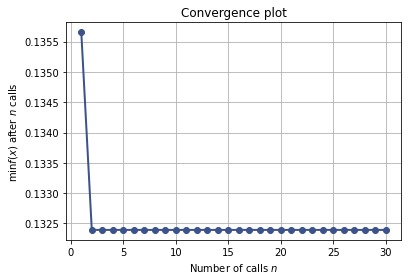

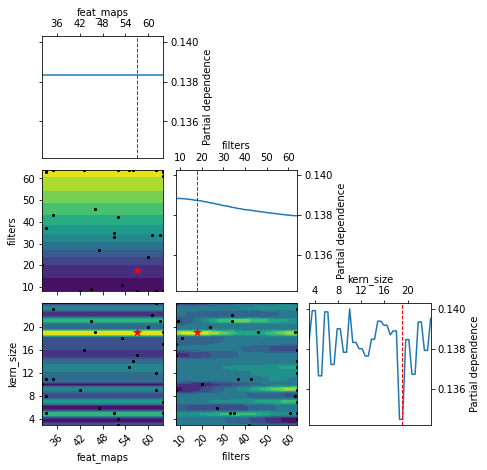

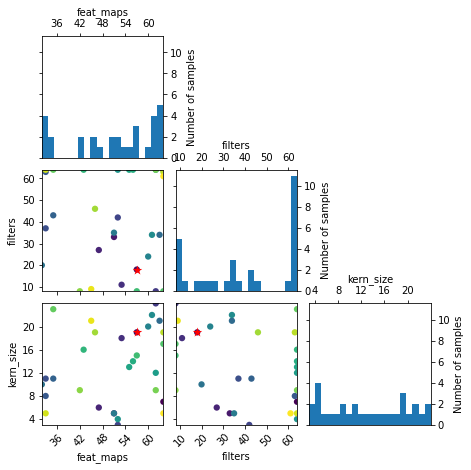

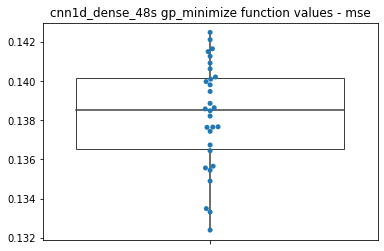

CPU times: user 1h 59min 9s, sys: 18min 54s, total: 2h 18min 4s
Wall time: 1h 41min 13s


In [ ]:
%%time


results_id = 'cnn1d_dense_48s'
hpo[results_id] = {}

dim_feat_maps = Integer(low = 32, high = 64, name = 'feat_maps')
dim_filters   = Integer(low =  8, high = 64, name = 'filters')
dim_kern_size = Integer(low =  3, high = 24, name = 'kern_size')

hpo[results_id]['dims'] = [dim_feat_maps,
                           dim_filters,
                           dim_kern_size]
hpo[results_id]['init_dims'] = [64, 64, 7]
hpo[results_id]['calls']     = 30


@use_named_args(dimensions = hpo[results_id]['dims'])
def model_fitness(**dims):
    params = get_default_params('conv1d_dense')
    params.update({'lrf_params': [0.00005,  0.001, 32, 5, 100, 25]})
#   params.update({'lrf_params': [0.00001,  0.001, 32, 5, 100, 25]}) # 2nd not underfitting but learning too slowly
#   params.update({'lrf_params': [0.00008,  0.001, 32, 5, 100, 25]}) # 1st some underfitting

#             'lrf_params': [0.00009,  10, 32, 5, 100, 25]}  # 1st
#             'lrf_params': [0.00001,  10, 32, 5, 100, 25]}
#             'lrf_params': [0.0003,   10, 32, 5, 100, 25]}  # 0.0003 too high
#             'lrf_params': [0.000005, 10, 32, 5, 100, 25]}
#             'lrf_params': [0.000001, 10, 32, 5, 100, 25]}  # 2nd
#             'lrf_params': [0.000009, 10, 32, 5, 100, 25]}  # 3rd

    return get_bo_mse(params, **dims)


hpo[results_id]['fitness_func'] = model_fitness
hpo[results_id]['results']      = run_bo_search(hpo, results_id)


The optimal parameters found for the 0.1349 minimum value were:

 * feat_maps - 64
 * filters - 48
 * kern_size - 7

This minimal value is greater than the Conv1D-LSTM minimal mse value of 0.1296.  An additional Dense(activation='relu') layer may improve the mse value but may not give transformative results.

It's clear from some of the learning rate finder curves that start_lr and/or end_lr could be further refined.  

As with all of the skopt runs, it would benefit from running for more iterations and probably more learning rate tuning.

---

Unfortunately `build_stacked_conv1d_lstm_model` was too slow to run more than once, so I've removed it.

---

### Multi-head Conv1D

The one-dimensional CNN models can be extended to have multiple separate sub-CNN "heads" with different filter and/or kernel sizes.  These CNN "heads" are then concatenated together to form a multiheaded model.

Code for this architecture is in the `build_multihead_conv1d_dense_model` function.


Briefly, the architecture is (omitting dropout and regularisation):
 * 3 independent Conv1D() "heads" with different kernel sizes:
   * Conv1D()
     * kernel sizes: init_ks * 2 + 1, init_ks \* 3 + 1, init_ks \* 4 + 1
   * MaxPooling1D()
   * Flatten()
 * concatenate()
 * Dense(activation='relu')
 * Dense(activation='relu')
 * Dense()

Again, optimise:

 * feat_maps - Dense(activation='relu') feature maps
 * Conv1D() filters
 * Conv1D() initial kernel size


Iteration No: 1 started. Evaluating function at provided point.
feat_maps 128
filters 64
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 26s 2ms/step - loss: 3.7246 - mae: 0.5455


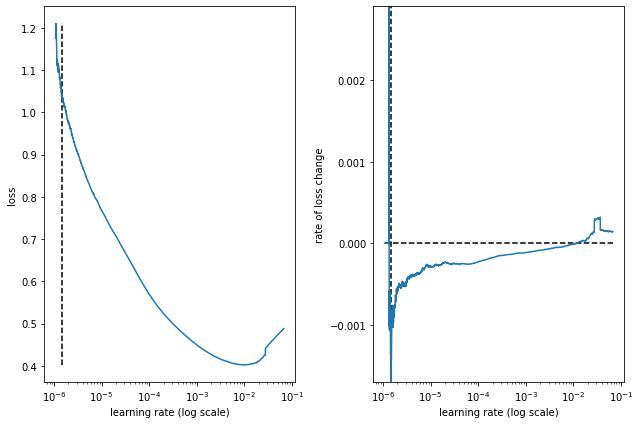

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_128fm_64f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_94 (InputLayer)          [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_115 (Conv1D)            (None, 140, 64)      3264        ['input_94[0][0]']               
                                                                                                  
 conv1d_116 (Conv1D)            (None, 138, 64)      4544        ['input_94[0][0]']               
                                                                                                  
 conv1d_117 (Conv1D)            (None, 136, 64)      5824        ['input_94[0][0]']               
                               

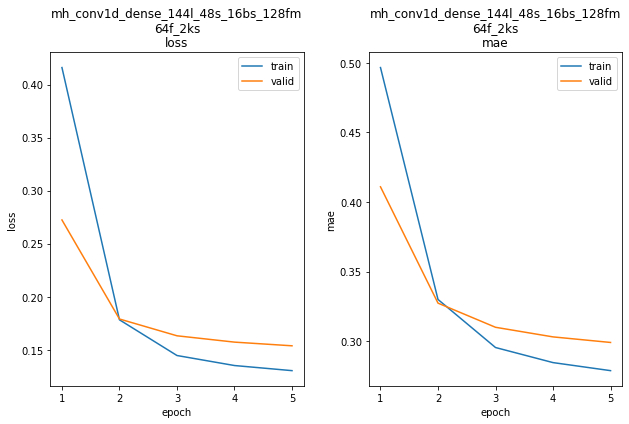

mh_conv1d_dense_144l_48s_16bs_128fm_64f_2ks train min loss: 0.130285	mae: 0.278948	epoch: 5
mh_conv1d_dense_144l_48s_16bs_128fm_64f_2ks valid min loss: 0.153712	mae: 0.299185	epoch: 5

mh_conv1d_dense_144l_48s_16bs_128fm_64f_2ks
Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 381.3277
Function value obtained: 0.1537
Current minimum: 0.1537
Iteration No: 2 started. Evaluating function at random point.
feat_maps 230
filters 38
kern_size 5
Epoch 1/5
11752/11752 [==============================] - 36s 3ms/step - loss: 1.4690 - mae: 0.7829


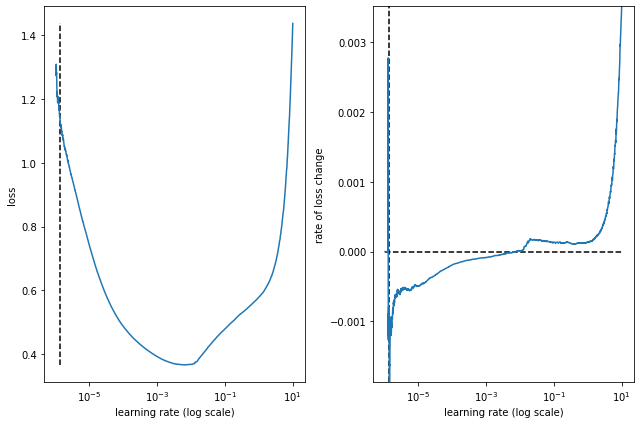

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_230fm_38f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_95 (InputLayer)          [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_118 (Conv1D)            (None, 134, 38)      4218        ['input_95[0][0]']               
                                                                                                  
 conv1d_119 (Conv1D)            (None, 129, 38)      6118        ['input_95[0][0]']               
                                                                                                  
 conv1d_120 (Conv1D)            (None, 124, 38)      8018        ['input_95[0][0]']               
                               

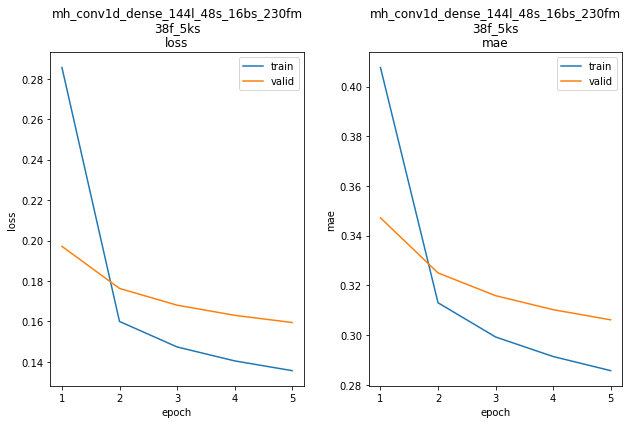

mh_conv1d_dense_144l_48s_16bs_230fm_38f_5ks train min loss: 0.135662	mae: 0.285664	epoch: 5
mh_conv1d_dense_144l_48s_16bs_230fm_38f_5ks valid min loss: 0.159467	mae: 0.306126	epoch: 5

mh_conv1d_dense_144l_48s_16bs_230fm_38f_5ks
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 389.0576
Function value obtained: 0.1595
Current minimum: 0.1537
Iteration No: 3 started. Evaluating function at random point.
feat_maps 204
filters 46
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 38s 3ms/step - loss: 1.4171 - mae: 0.7640


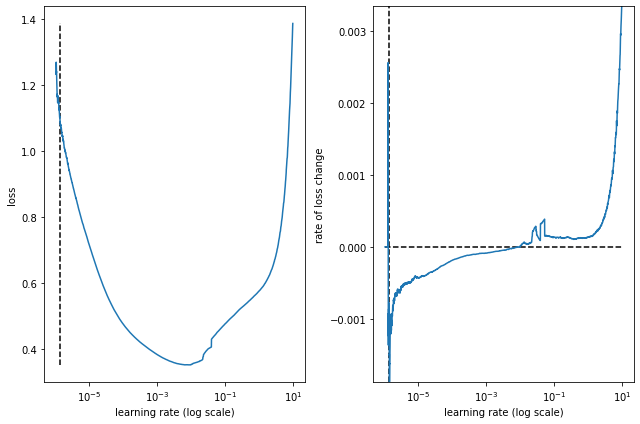

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_204fm_46f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_96 (InputLayer)          [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_121 (Conv1D)            (None, 140, 46)      2346        ['input_96[0][0]']               
                                                                                                  
 conv1d_122 (Conv1D)            (None, 138, 46)      3266        ['input_96[0][0]']               
                                                                                                  
 conv1d_123 (Conv1D)            (None, 136, 46)      4186        ['input_96[0][0]']               
                               

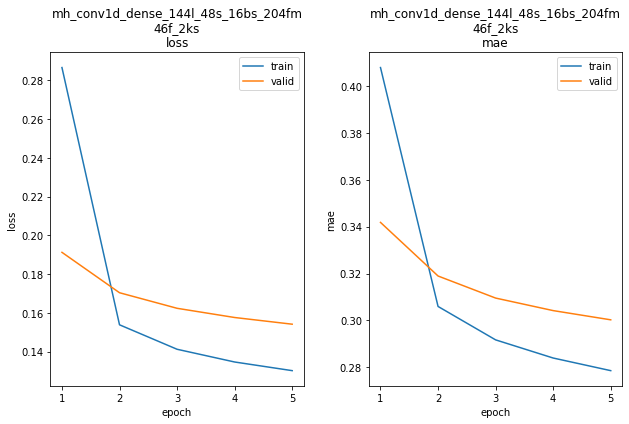

mh_conv1d_dense_144l_48s_16bs_204fm_46f_2ks train min loss: 0.130157	mae: 0.278606	epoch: 5
mh_conv1d_dense_144l_48s_16bs_204fm_46f_2ks valid min loss: 0.154138	mae: 0.300275	epoch: 5

mh_conv1d_dense_144l_48s_16bs_204fm_46f_2ks
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 397.3057
Function value obtained: 0.1541
Current minimum: 0.1537
Iteration No: 4 started. Evaluating function at random point.
feat_maps 187
filters 43
kern_size 3
Epoch 1/5
11752/11752 [==============================] - 27s 2ms/step - loss: 3.9627 - mae: 0.5239


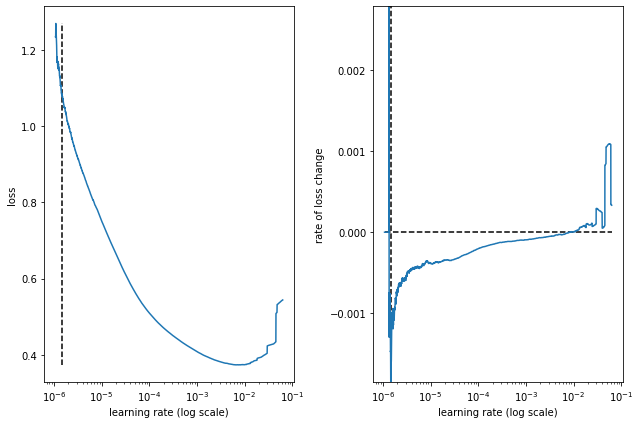

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_187fm_43f_3ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_97 (InputLayer)          [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_124 (Conv1D)            (None, 138, 43)      3053        ['input_97[0][0]']               
                                                                                                  
 conv1d_125 (Conv1D)            (None, 135, 43)      4343        ['input_97[0][0]']               
                                                                                                  
 conv1d_126 (Conv1D)            (None, 132, 43)      5633        ['input_97[0][0]']               
                               

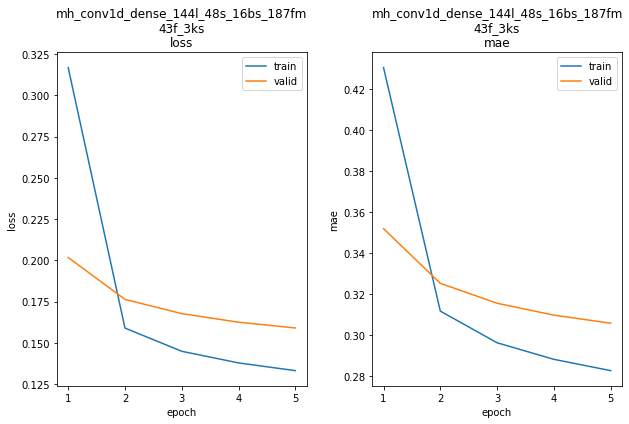

mh_conv1d_dense_144l_48s_16bs_187fm_43f_3ks train min loss: 0.133128	mae: 0.282590	epoch: 5
mh_conv1d_dense_144l_48s_16bs_187fm_43f_3ks valid min loss: 0.158992	mae: 0.305729	epoch: 5

mh_conv1d_dense_144l_48s_16bs_187fm_43f_3ks
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 423.2542
Function value obtained: 0.1590
Current minimum: 0.1537
Iteration No: 5 started. Evaluating function at random point.
feat_maps 211
filters 34
kern_size 5
Epoch 1/5
11752/11752 [==============================] - 38s 3ms/step - loss: 1.4920 - mae: 0.7867


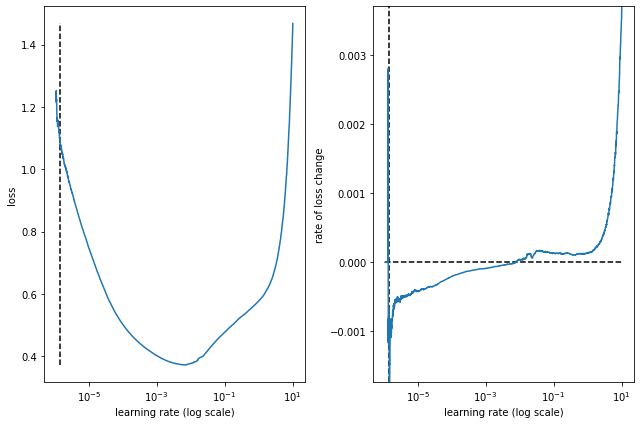

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_211fm_34f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_98 (InputLayer)          [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_127 (Conv1D)            (None, 134, 34)      3774        ['input_98[0][0]']               
                                                                                                  
 conv1d_128 (Conv1D)            (None, 129, 34)      5474        ['input_98[0][0]']               
                                                                                                  
 conv1d_129 (Conv1D)            (None, 124, 34)      7174        ['input_98[0][0]']               
                               

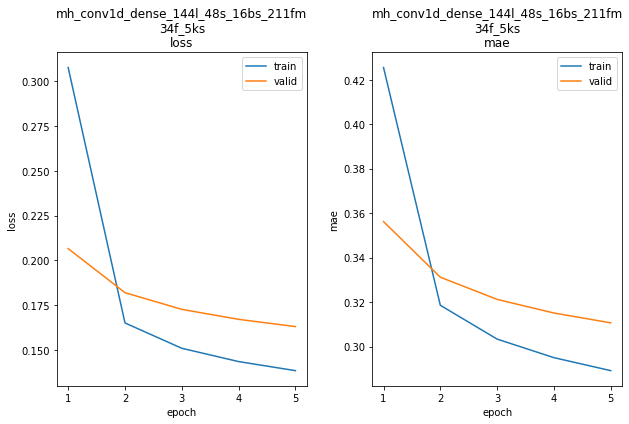

mh_conv1d_dense_144l_48s_16bs_211fm_34f_5ks train min loss: 0.138518	mae: 0.289177	epoch: 5
mh_conv1d_dense_144l_48s_16bs_211fm_34f_5ks valid min loss: 0.163092	mae: 0.310672	epoch: 5

mh_conv1d_dense_144l_48s_16bs_211fm_34f_5ks
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 359.6140
Function value obtained: 0.1631
Current minimum: 0.1537
Iteration No: 6 started. Evaluating function at random point.
feat_maps 248
filters 32
kern_size 6
Epoch 1/5
11752/11752 [==============================] - 40s 3ms/step - loss: 1.4225 - mae: 0.7533


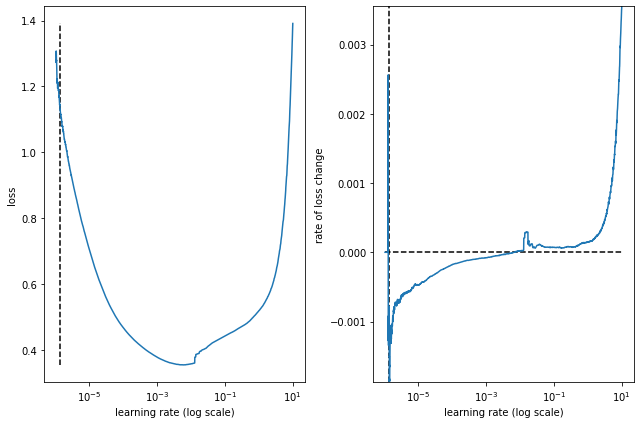

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_248fm_32f_6ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_99 (InputLayer)          [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_130 (Conv1D)            (None, 132, 32)      4192        ['input_99[0][0]']               
                                                                                                  
 conv1d_131 (Conv1D)            (None, 126, 32)      6112        ['input_99[0][0]']               
                                                                                                  
 conv1d_132 (Conv1D)            (None, 120, 32)      8032        ['input_99[0][0]']               
                               

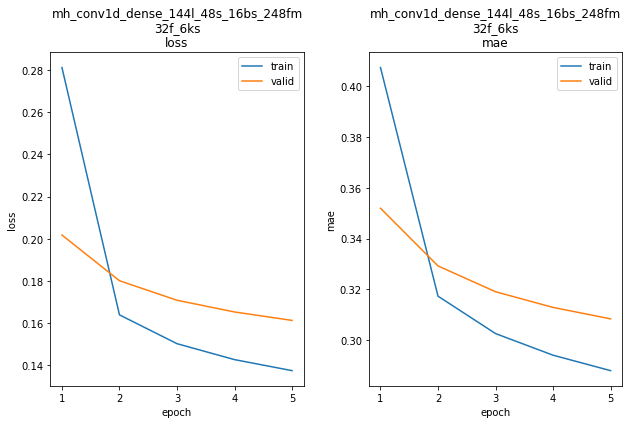

mh_conv1d_dense_144l_48s_16bs_248fm_32f_6ks train min loss: 0.137465	mae: 0.287970	epoch: 5
mh_conv1d_dense_144l_48s_16bs_248fm_32f_6ks valid min loss: 0.161295	mae: 0.308361	epoch: 5

mh_conv1d_dense_144l_48s_16bs_248fm_32f_6ks
Iteration No: 6 ended. Evaluation done at random point.
Time taken: 362.0406
Function value obtained: 0.1613
Current minimum: 0.1537
Iteration No: 7 started. Evaluating function at random point.
feat_maps 207
filters 52
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 39s 3ms/step - loss: 1.3842 - mae: 0.7513


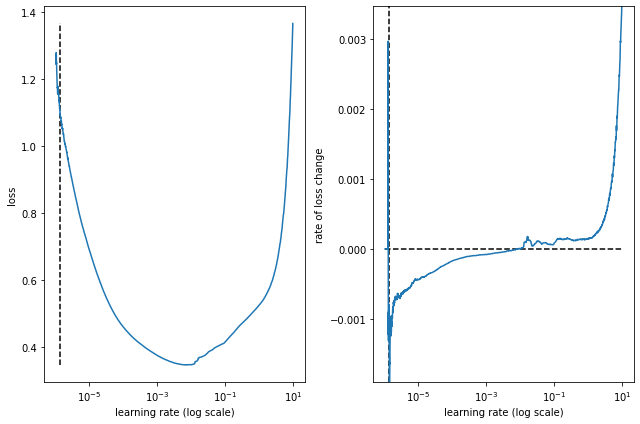

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_207fm_52f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_100 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_133 (Conv1D)            (None, 140, 52)      2652        ['input_100[0][0]']              
                                                                                                  
 conv1d_134 (Conv1D)            (None, 138, 52)      3692        ['input_100[0][0]']              
                                                                                                  
 conv1d_135 (Conv1D)            (None, 136, 52)      4732        ['input_100[0][0]']              
                               

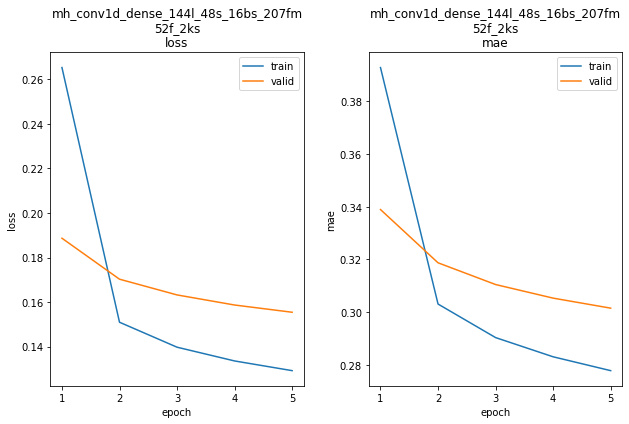

mh_conv1d_dense_144l_48s_16bs_207fm_52f_2ks train min loss: 0.129232	mae: 0.277759	epoch: 5
mh_conv1d_dense_144l_48s_16bs_207fm_52f_2ks valid min loss: 0.155445	mae: 0.301497	epoch: 5

mh_conv1d_dense_144l_48s_16bs_207fm_52f_2ks
Iteration No: 7 ended. Evaluation done at random point.
Time taken: 391.3489
Function value obtained: 0.1554
Current minimum: 0.1537
Iteration No: 8 started. Evaluating function at random point.
feat_maps 131
filters 49
kern_size 4
Epoch 1/5
11752/11752 [==============================] - 42s 3ms/step - loss: 1.6273 - mae: 0.8143


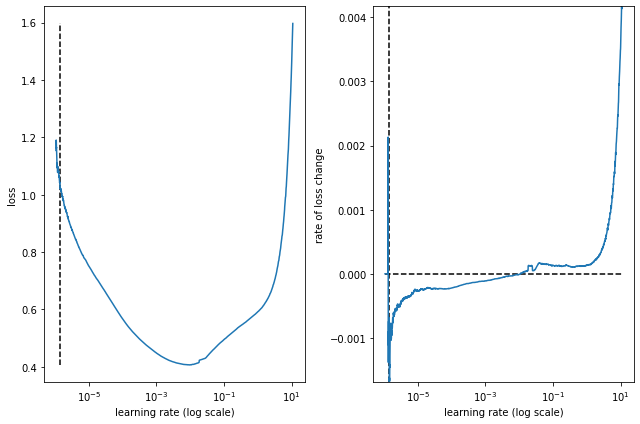

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_131fm_49f_4ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_101 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_136 (Conv1D)            (None, 136, 49)      4459        ['input_101[0][0]']              
                                                                                                  
 conv1d_137 (Conv1D)            (None, 132, 49)      6419        ['input_101[0][0]']              
                                                                                                  
 conv1d_138 (Conv1D)            (None, 128, 49)      8379        ['input_101[0][0]']              
                               

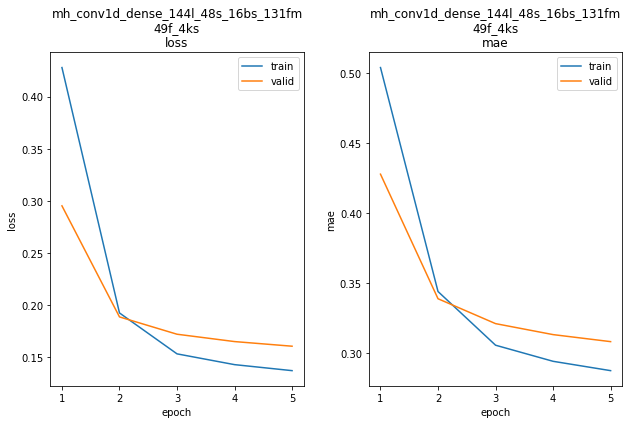

mh_conv1d_dense_144l_48s_16bs_131fm_49f_4ks train min loss: 0.137398	mae: 0.287725	epoch: 5
mh_conv1d_dense_144l_48s_16bs_131fm_49f_4ks valid min loss: 0.160820	mae: 0.308439	epoch: 5

mh_conv1d_dense_144l_48s_16bs_131fm_49f_4ks
WARN: bad model mh_conv1d_dense_144l_48s_16bs_131fm_49f_4ks
Iteration No: 8 ended. Evaluation done at random point.
Time taken: 427.1403
Function value obtained: 0.1608
Current minimum: 0.1537
Iteration No: 9 started. Evaluating function at random point.
feat_maps 134
filters 63
kern_size 3
Epoch 1/5
11752/11752 [==============================] - 42s 4ms/step - loss: 1.5718 - mae: 0.8035


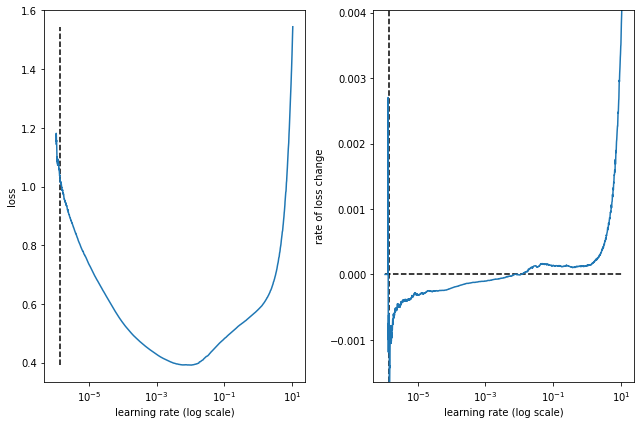

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_134fm_63f_3ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_102 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_139 (Conv1D)            (None, 138, 63)      4473        ['input_102[0][0]']              
                                                                                                  
 conv1d_140 (Conv1D)            (None, 135, 63)      6363        ['input_102[0][0]']              
                                                                                                  
 conv1d_141 (Conv1D)            (None, 132, 63)      8253        ['input_102[0][0]']              
                               

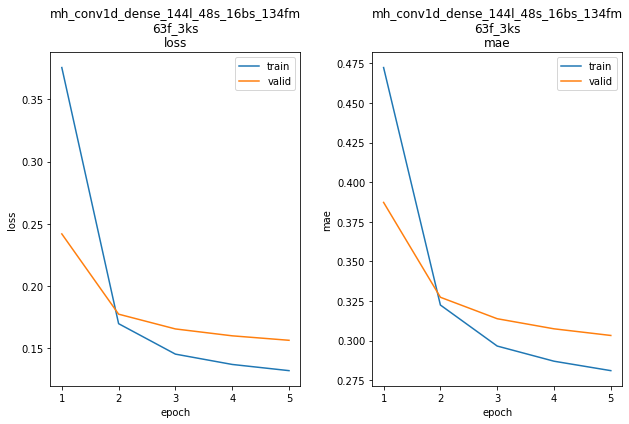

mh_conv1d_dense_144l_48s_16bs_134fm_63f_3ks train min loss: 0.131973	mae: 0.281083	epoch: 5
mh_conv1d_dense_144l_48s_16bs_134fm_63f_3ks valid min loss: 0.156360	mae: 0.303292	epoch: 5

mh_conv1d_dense_144l_48s_16bs_134fm_63f_3ks
Iteration No: 9 ended. Evaluation done at random point.
Time taken: 410.2469
Function value obtained: 0.1564
Current minimum: 0.1537
Iteration No: 10 started. Evaluating function at random point.
feat_maps 140
filters 52
kern_size 4
Epoch 1/5
11752/11752 [==============================] - 42s 3ms/step - loss: 1.5744 - mae: 0.7993


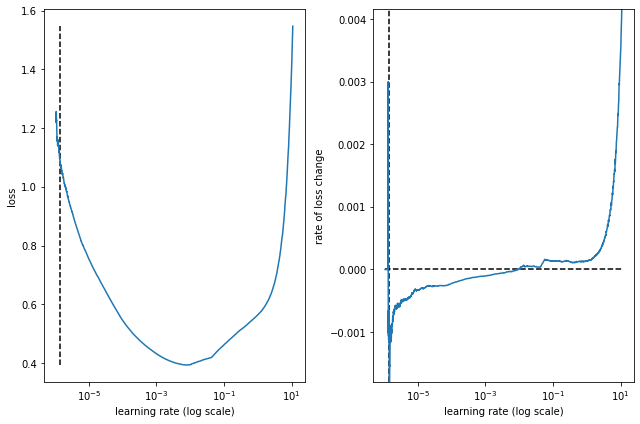

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_140fm_52f_4ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_103 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_142 (Conv1D)            (None, 136, 52)      4732        ['input_103[0][0]']              
                                                                                                  
 conv1d_143 (Conv1D)            (None, 132, 52)      6812        ['input_103[0][0]']              
                                                                                                  
 conv1d_144 (Conv1D)            (None, 128, 52)      8892        ['input_103[0][0]']              
                               

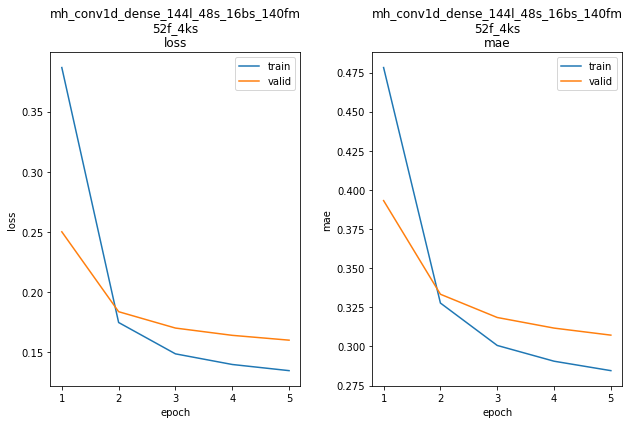

mh_conv1d_dense_144l_48s_16bs_140fm_52f_4ks train min loss: 0.134815	mae: 0.284521	epoch: 5
mh_conv1d_dense_144l_48s_16bs_140fm_52f_4ks valid min loss: 0.160139	mae: 0.307204	epoch: 5

mh_conv1d_dense_144l_48s_16bs_140fm_52f_4ks
Iteration No: 10 ended. Evaluation done at random point.
Time taken: 395.9478
Function value obtained: 0.1601
Current minimum: 0.1537
Iteration No: 11 started. Evaluating function at random point.
feat_maps 254
filters 47
kern_size 5
Epoch 1/5
11752/11752 [==============================] - 42s 3ms/step - loss: 1.4132 - mae: 0.7655


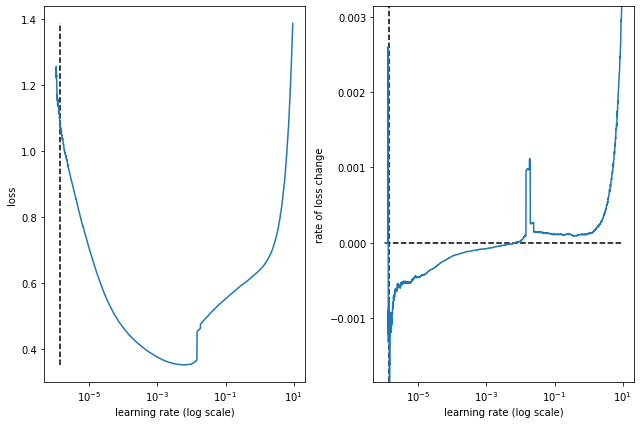

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_254fm_47f_5ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_104 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_145 (Conv1D)            (None, 134, 47)      5217        ['input_104[0][0]']              
                                                                                                  
 conv1d_146 (Conv1D)            (None, 129, 47)      7567        ['input_104[0][0]']              
                                                                                                  
 conv1d_147 (Conv1D)            (None, 124, 47)      9917        ['input_104[0][0]']              
                               

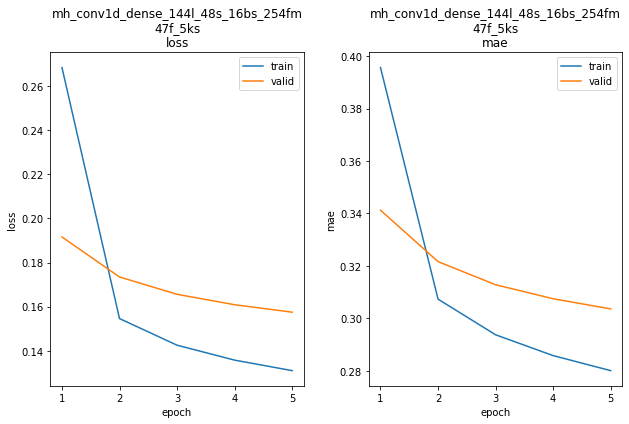

mh_conv1d_dense_144l_48s_16bs_254fm_47f_5ks train min loss: 0.130986	mae: 0.280046	epoch: 5
mh_conv1d_dense_144l_48s_16bs_254fm_47f_5ks valid min loss: 0.157498	mae: 0.303584	epoch: 5

mh_conv1d_dense_144l_48s_16bs_254fm_47f_5ks
Iteration No: 11 ended. Evaluation done at random point.
Time taken: 436.6477
Function value obtained: 0.1575
Current minimum: 0.1537
Iteration No: 12 started. Evaluating function at random point.
feat_maps 256
filters 34
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 42s 4ms/step - loss: 1.3837 - mae: 0.7371


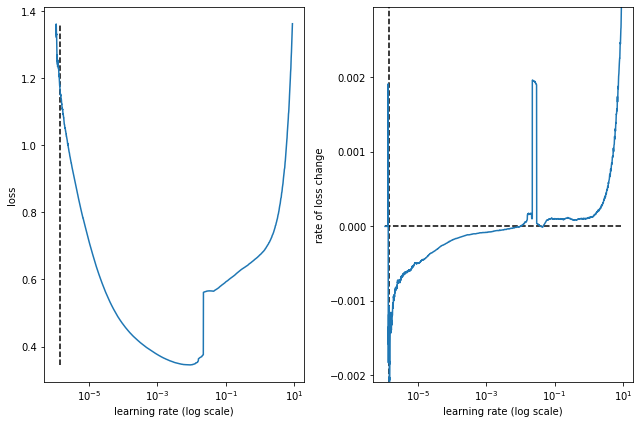

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_256fm_34f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_105 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_148 (Conv1D)            (None, 140, 34)      1734        ['input_105[0][0]']              
                                                                                                  
 conv1d_149 (Conv1D)            (None, 138, 34)      2414        ['input_105[0][0]']              
                                                                                                  
 conv1d_150 (Conv1D)            (None, 136, 34)      3094        ['input_105[0][0]']              
                               

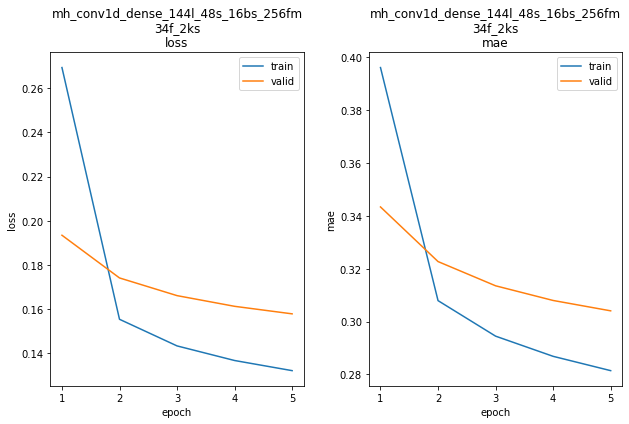

mh_conv1d_dense_144l_48s_16bs_256fm_34f_2ks train min loss: 0.132207	mae: 0.281400	epoch: 5
mh_conv1d_dense_144l_48s_16bs_256fm_34f_2ks valid min loss: 0.157903	mae: 0.304046	epoch: 5

mh_conv1d_dense_144l_48s_16bs_256fm_34f_2ks
Iteration No: 12 ended. Evaluation done at random point.
Time taken: 407.7336
Function value obtained: 0.1579
Current minimum: 0.1537
Iteration No: 13 started. Searching for the next optimal point.
feat_maps 131
filters 49
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 43s 4ms/step - loss: 1.5828 - mae: 0.7981


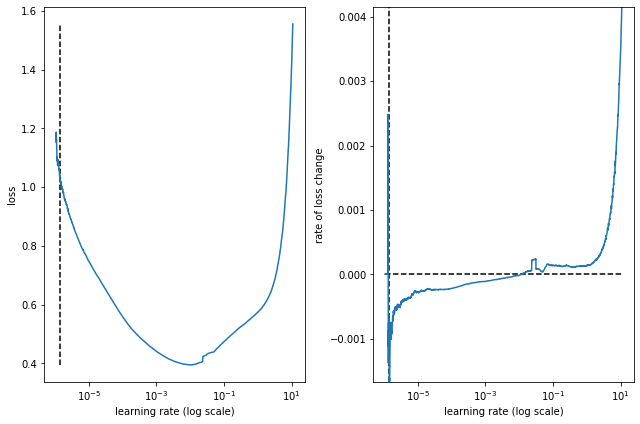

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_131fm_49f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_106 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_151 (Conv1D)            (None, 140, 49)      2499        ['input_106[0][0]']              
                                                                                                  
 conv1d_152 (Conv1D)            (None, 138, 49)      3479        ['input_106[0][0]']              
                                                                                                  
 conv1d_153 (Conv1D)            (None, 136, 49)      4459        ['input_106[0][0]']              
                               

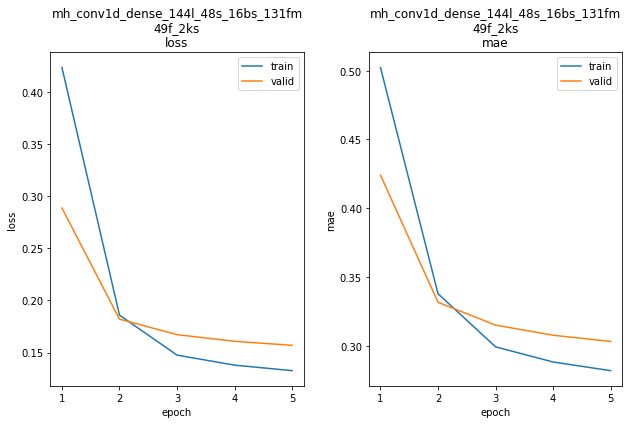

mh_conv1d_dense_144l_48s_16bs_131fm_49f_2ks train min loss: 0.132671	mae: 0.281907	epoch: 5
mh_conv1d_dense_144l_48s_16bs_131fm_49f_2ks valid min loss: 0.156946	mae: 0.303126	epoch: 5

mh_conv1d_dense_144l_48s_16bs_131fm_49f_2ks
WARN: bad model mh_conv1d_dense_144l_48s_16bs_131fm_49f_2ks
Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 367.2577
Function value obtained: 0.1569
Current minimum: 0.1537
Iteration No: 14 started. Searching for the next optimal point.
feat_maps 254
filters 64
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 44s 4ms/step - loss: 1.3467 - mae: 0.7372


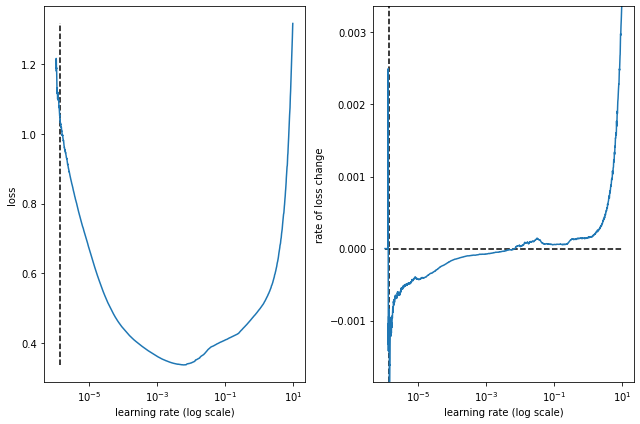

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_254fm_64f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_107 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_154 (Conv1D)            (None, 140, 64)      3264        ['input_107[0][0]']              
                                                                                                  
 conv1d_155 (Conv1D)            (None, 138, 64)      4544        ['input_107[0][0]']              
                                                                                                  
 conv1d_156 (Conv1D)            (None, 136, 64)      5824        ['input_107[0][0]']              
                               

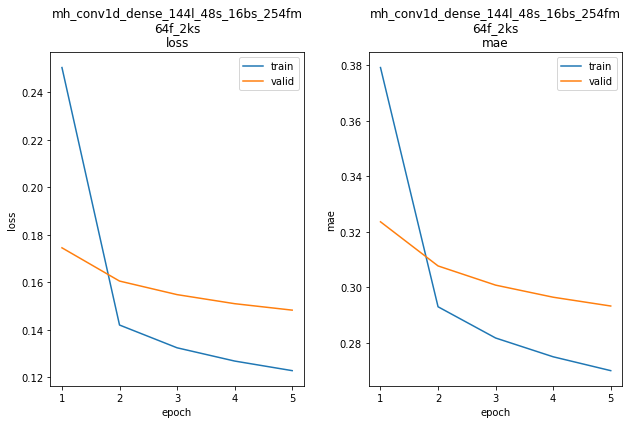

mh_conv1d_dense_144l_48s_16bs_254fm_64f_2ks train min loss: 0.122834	mae: 0.269966	epoch: 5
mh_conv1d_dense_144l_48s_16bs_254fm_64f_2ks valid min loss: 0.148293	mae: 0.293264	epoch: 5

mh_conv1d_dense_144l_48s_16bs_254fm_64f_2ks
Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 428.3404
Function value obtained: 0.1483
Current minimum: 0.1483
Iteration No: 15 started. Searching for the next optimal point.
feat_maps 252
filters 64
kern_size 6
Epoch 1/5
11752/11752 [==============================] - 44s 4ms/step - loss: 1.2970 - mae: 0.7156


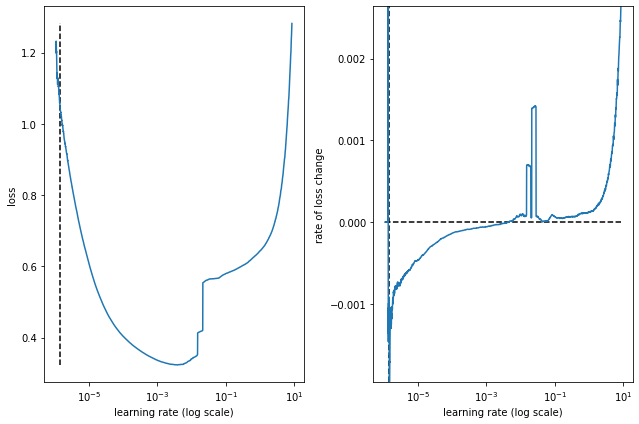

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_252fm_64f_6ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_108 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_157 (Conv1D)            (None, 132, 64)      8384        ['input_108[0][0]']              
                                                                                                  
 conv1d_158 (Conv1D)            (None, 126, 64)      12224       ['input_108[0][0]']              
                                                                                                  
 conv1d_159 (Conv1D)            (None, 120, 64)      16064       ['input_108[0][0]']              
                               

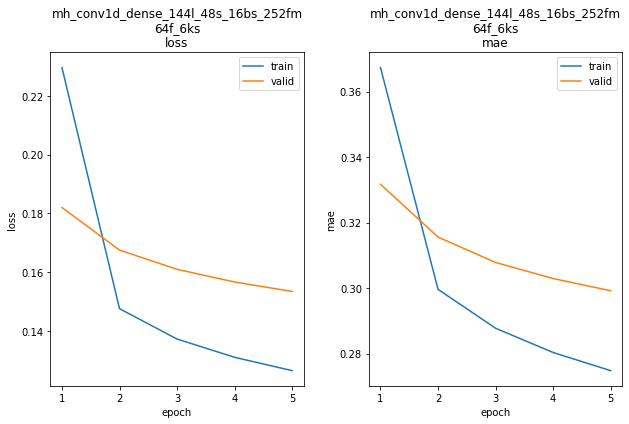

mh_conv1d_dense_144l_48s_16bs_252fm_64f_6ks train min loss: 0.126548	mae: 0.274795	epoch: 5
mh_conv1d_dense_144l_48s_16bs_252fm_64f_6ks valid min loss: 0.153479	mae: 0.299203	epoch: 5

mh_conv1d_dense_144l_48s_16bs_252fm_64f_6ks
Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 414.2255
Function value obtained: 0.1535
Current minimum: 0.1483
Iteration No: 16 started. Searching for the next optimal point.
feat_maps 131
filters 64
kern_size 6
Epoch 1/5
11752/11752 [==============================] - 45s 4ms/step - loss: 1.6218 - mae: 0.8175


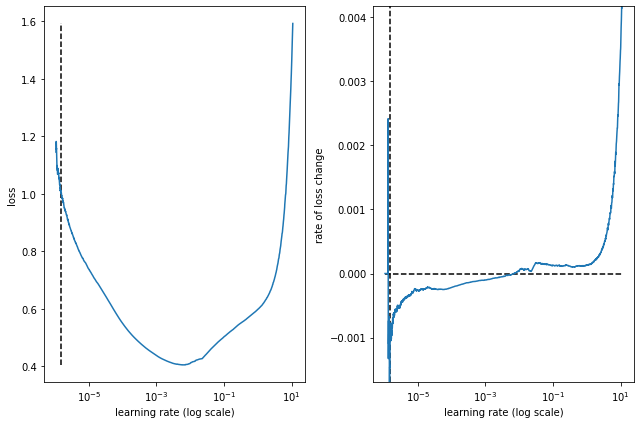

best lr: 1.4593448e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_131fm_64f_6ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_109 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_160 (Conv1D)            (None, 132, 64)      8384        ['input_109[0][0]']              
                                                                                                  
 conv1d_161 (Conv1D)            (None, 126, 64)      12224       ['input_109[0][0]']              
                                                                                                  
 conv1d_162 (Conv1D)            (None, 120, 64)      16064       ['input_109[0][0]']              
                               

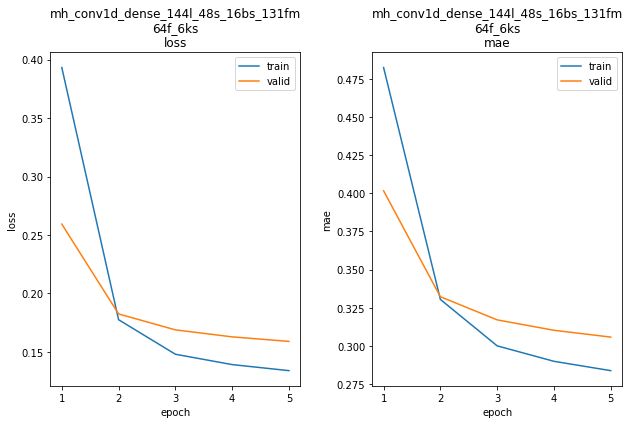

mh_conv1d_dense_144l_48s_16bs_131fm_64f_6ks train min loss: 0.133933	mae: 0.283765	epoch: 5
mh_conv1d_dense_144l_48s_16bs_131fm_64f_6ks valid min loss: 0.158937	mae: 0.305740	epoch: 5

mh_conv1d_dense_144l_48s_16bs_131fm_64f_6ks
Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 373.4080
Function value obtained: 0.1589
Current minimum: 0.1483
Iteration No: 17 started. Searching for the next optimal point.
feat_maps 130
filters 32
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 45s 4ms/step - loss: 1.6381 - mae: 0.7930


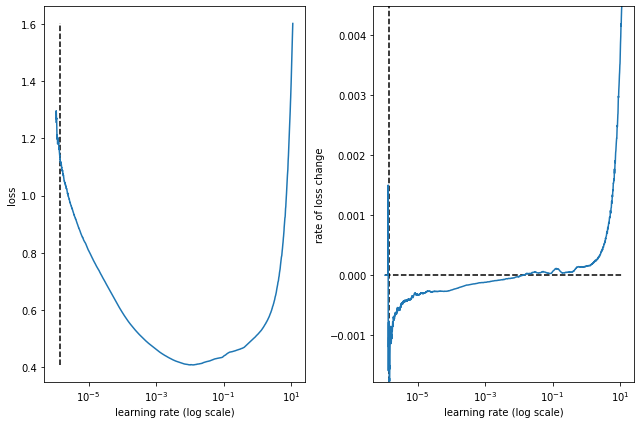

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_130fm_32f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_110 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_163 (Conv1D)            (None, 140, 32)      1632        ['input_110[0][0]']              
                                                                                                  
 conv1d_164 (Conv1D)            (None, 138, 32)      2272        ['input_110[0][0]']              
                                                                                                  
 conv1d_165 (Conv1D)            (None, 136, 32)      2912        ['input_110[0][0]']              
                               

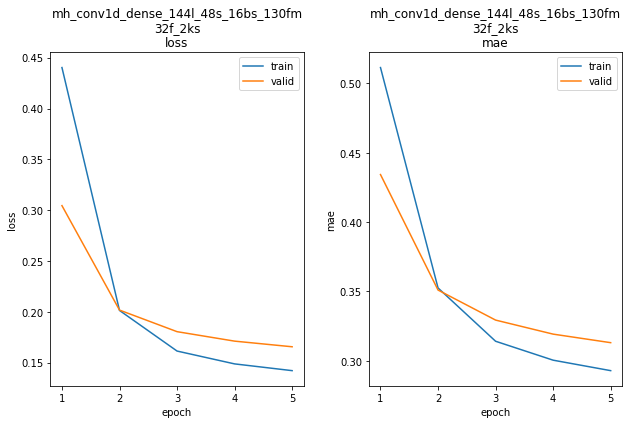

mh_conv1d_dense_144l_48s_16bs_130fm_32f_2ks train min loss: 0.142107	mae: 0.292866	epoch: 5
mh_conv1d_dense_144l_48s_16bs_130fm_32f_2ks valid min loss: 0.165600	mae: 0.313033	epoch: 5

mh_conv1d_dense_144l_48s_16bs_130fm_32f_2ks
Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 402.8005
Function value obtained: 0.1656
Current minimum: 0.1483
Iteration No: 18 started. Searching for the next optimal point.
feat_maps 255
filters 57
kern_size 6
Epoch 1/5
11752/11752 [==============================] - 47s 4ms/step - loss: 1.3794 - mae: 0.7391


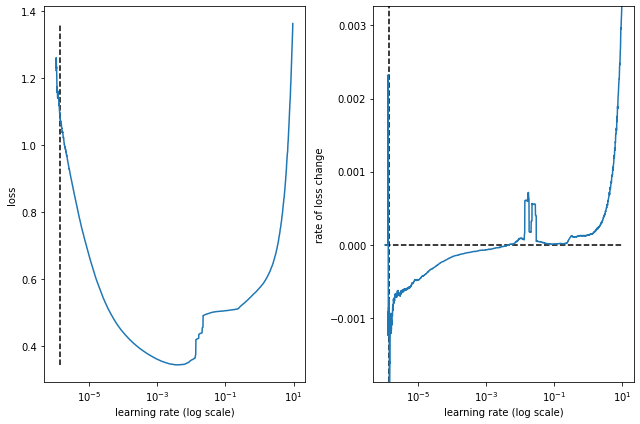

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_255fm_57f_6ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_111 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_166 (Conv1D)            (None, 132, 57)      7467        ['input_111[0][0]']              
                                                                                                  
 conv1d_167 (Conv1D)            (None, 126, 57)      10887       ['input_111[0][0]']              
                                                                                                  
 conv1d_168 (Conv1D)            (None, 120, 57)      14307       ['input_111[0][0]']              
                               

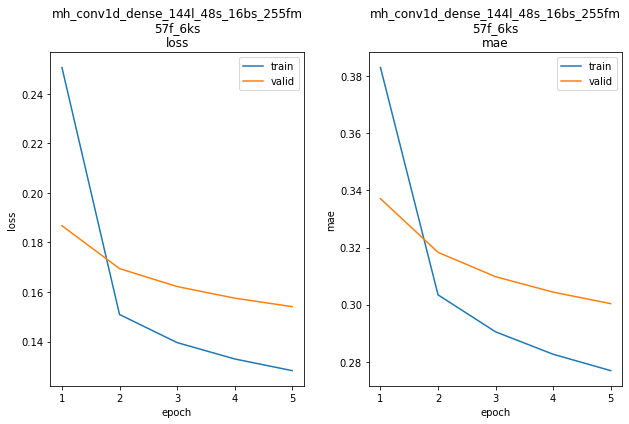

mh_conv1d_dense_144l_48s_16bs_255fm_57f_6ks train min loss: 0.128256	mae: 0.276891	epoch: 5
mh_conv1d_dense_144l_48s_16bs_255fm_57f_6ks valid min loss: 0.154099	mae: 0.300348	epoch: 5

mh_conv1d_dense_144l_48s_16bs_255fm_57f_6ks
Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 413.0487
Function value obtained: 0.1541
Current minimum: 0.1483
Iteration No: 19 started. Searching for the next optimal point.
feat_maps 256
filters 61
kern_size 4
Epoch 1/5
11752/11752 [==============================] - 45s 4ms/step - loss: 1.3023 - mae: 0.7249


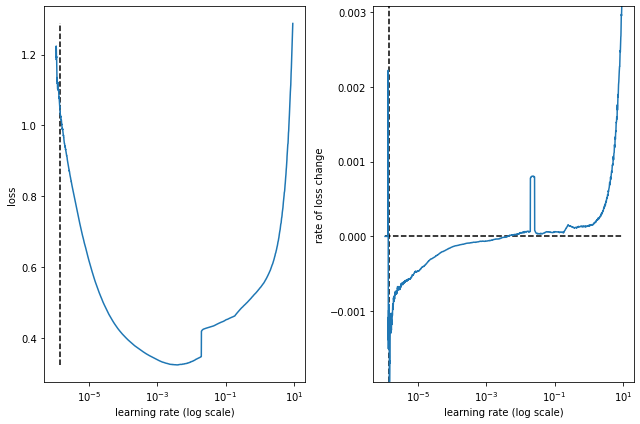

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_256fm_61f_4ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_112 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_169 (Conv1D)            (None, 136, 61)      5551        ['input_112[0][0]']              
                                                                                                  
 conv1d_170 (Conv1D)            (None, 132, 61)      7991        ['input_112[0][0]']              
                                                                                                  
 conv1d_171 (Conv1D)            (None, 128, 61)      10431       ['input_112[0][0]']              
                               

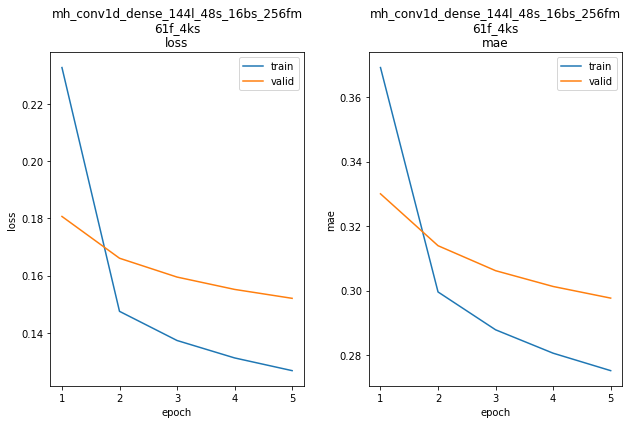

mh_conv1d_dense_144l_48s_16bs_256fm_61f_4ks train min loss: 0.126792	mae: 0.275135	epoch: 5
mh_conv1d_dense_144l_48s_16bs_256fm_61f_4ks valid min loss: 0.152078	mae: 0.297652	epoch: 5

mh_conv1d_dense_144l_48s_16bs_256fm_61f_4ks
Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 400.0546
Function value obtained: 0.1521
Current minimum: 0.1483
Iteration No: 20 started. Searching for the next optimal point.
feat_maps 130
filters 40
kern_size 6
Epoch 1/5
11752/11752 [==============================] - 46s 4ms/step - loss: 1.6902 - mae: 0.8186


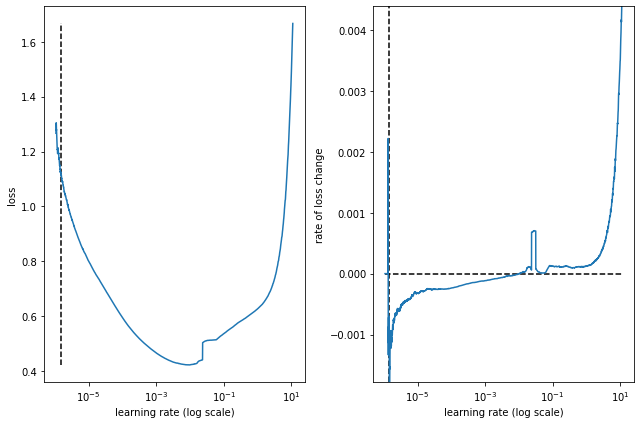

best lr: 1.4593448e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_130fm_40f_6ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_113 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_172 (Conv1D)            (None, 132, 40)      5240        ['input_113[0][0]']              
                                                                                                  
 conv1d_173 (Conv1D)            (None, 126, 40)      7640        ['input_113[0][0]']              
                                                                                                  
 conv1d_174 (Conv1D)            (None, 120, 40)      10040       ['input_113[0][0]']              
                               

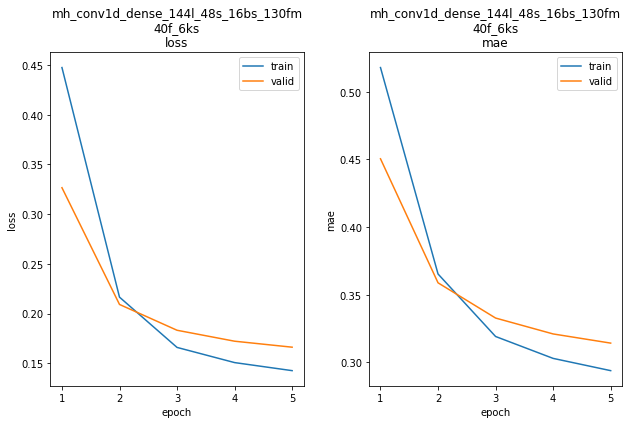

mh_conv1d_dense_144l_48s_16bs_130fm_40f_6ks train min loss: 0.142611	mae: 0.293960	epoch: 5
mh_conv1d_dense_144l_48s_16bs_130fm_40f_6ks valid min loss: 0.166201	mae: 0.314298	epoch: 5

mh_conv1d_dense_144l_48s_16bs_130fm_40f_6ks
WARN: bad model mh_conv1d_dense_144l_48s_16bs_130fm_40f_6ks
Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 367.7810
Function value obtained: 0.1662
Current minimum: 0.1483
Iteration No: 21 started. Searching for the next optimal point.
feat_maps 256
filters 42
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 46s 4ms/step - loss: 1.3696 - mae: 0.7561


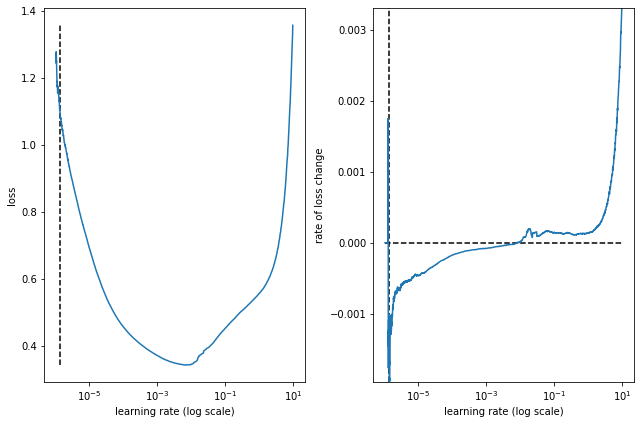

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_256fm_42f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_114 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_175 (Conv1D)            (None, 140, 42)      2142        ['input_114[0][0]']              
                                                                                                  
 conv1d_176 (Conv1D)            (None, 138, 42)      2982        ['input_114[0][0]']              
                                                                                                  
 conv1d_177 (Conv1D)            (None, 136, 42)      3822        ['input_114[0][0]']              
                               

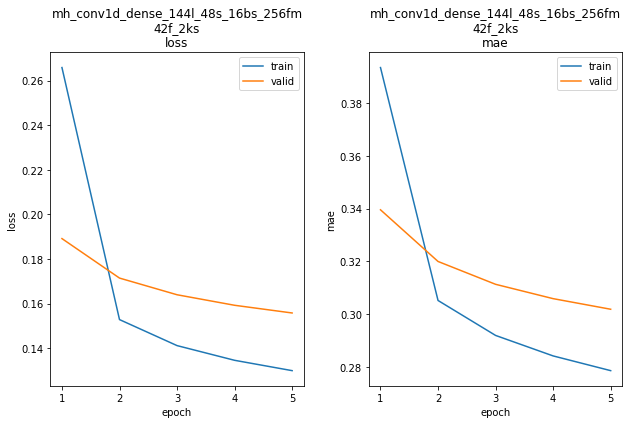

mh_conv1d_dense_144l_48s_16bs_256fm_42f_2ks train min loss: 0.129909	mae: 0.278627	epoch: 5
mh_conv1d_dense_144l_48s_16bs_256fm_42f_2ks valid min loss: 0.155772	mae: 0.301878	epoch: 5

mh_conv1d_dense_144l_48s_16bs_256fm_42f_2ks
Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 397.5568
Function value obtained: 0.1558
Current minimum: 0.1483
Iteration No: 22 started. Searching for the next optimal point.
feat_maps 196
filters 64
kern_size 6
Epoch 1/5
11752/11752 [==============================] - 31s 3ms/step - loss: 1.3893 - mae: 0.5025


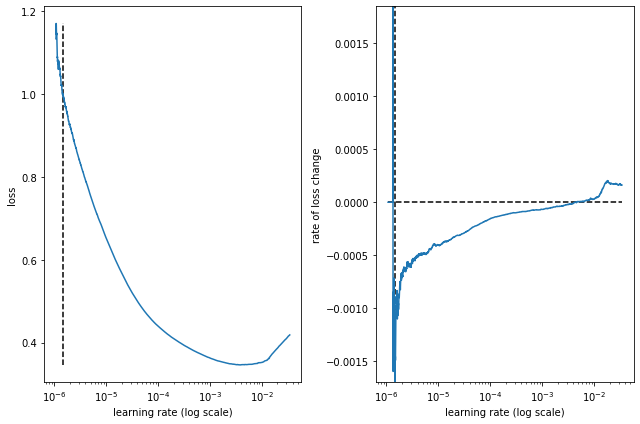

best lr: 1.4593448e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_196fm_64f_6ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_115 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_178 (Conv1D)            (None, 132, 64)      8384        ['input_115[0][0]']              
                                                                                                  
 conv1d_179 (Conv1D)            (None, 126, 64)      12224       ['input_115[0][0]']              
                                                                                                  
 conv1d_180 (Conv1D)            (None, 120, 64)      16064       ['input_115[0][0]']              
                               

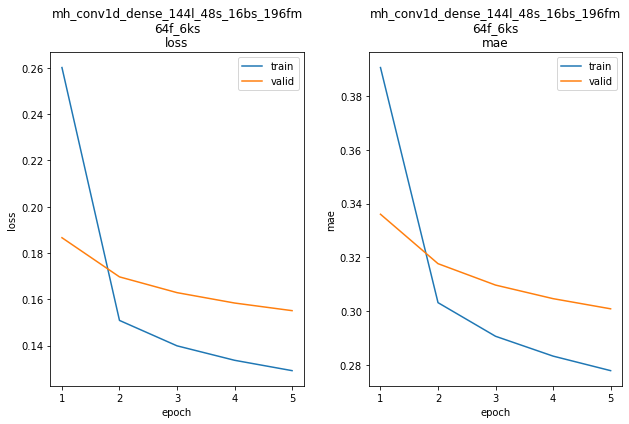

mh_conv1d_dense_144l_48s_16bs_196fm_64f_6ks train min loss: 0.129150	mae: 0.277929	epoch: 5
mh_conv1d_dense_144l_48s_16bs_196fm_64f_6ks valid min loss: 0.155083	mae: 0.300910	epoch: 5

mh_conv1d_dense_144l_48s_16bs_196fm_64f_6ks
Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 367.2132
Function value obtained: 0.1551
Current minimum: 0.1483
Iteration No: 23 started. Searching for the next optimal point.
feat_maps 255
filters 59
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 47s 4ms/step - loss: 1.3041 - mae: 0.7389


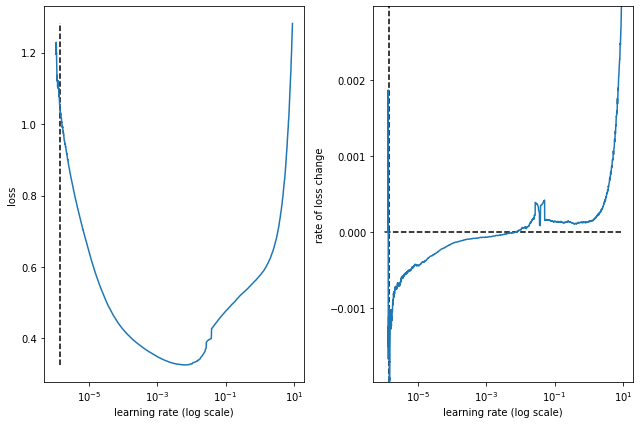

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_255fm_59f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_116 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_181 (Conv1D)            (None, 140, 59)      3009        ['input_116[0][0]']              
                                                                                                  
 conv1d_182 (Conv1D)            (None, 138, 59)      4189        ['input_116[0][0]']              
                                                                                                  
 conv1d_183 (Conv1D)            (None, 136, 59)      5369        ['input_116[0][0]']              
                               

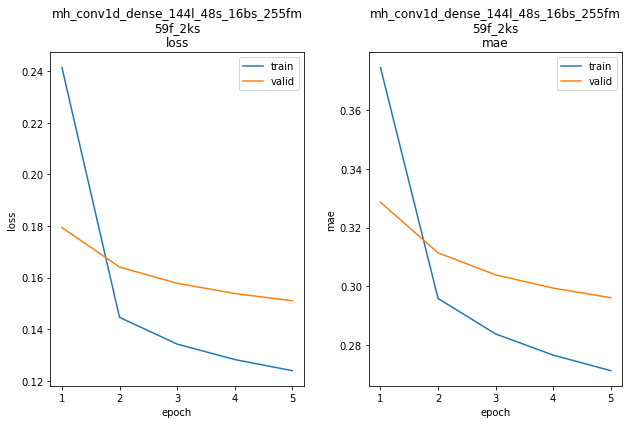

mh_conv1d_dense_144l_48s_16bs_255fm_59f_2ks train min loss: 0.123933	mae: 0.271292	epoch: 5
mh_conv1d_dense_144l_48s_16bs_255fm_59f_2ks valid min loss: 0.151014	mae: 0.296140	epoch: 5

mh_conv1d_dense_144l_48s_16bs_255fm_59f_2ks
Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 431.8301
Function value obtained: 0.1510
Current minimum: 0.1483
Iteration No: 24 started. Searching for the next optimal point.
feat_maps 200
filters 62
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 47s 4ms/step - loss: 1.3491 - mae: 0.7440


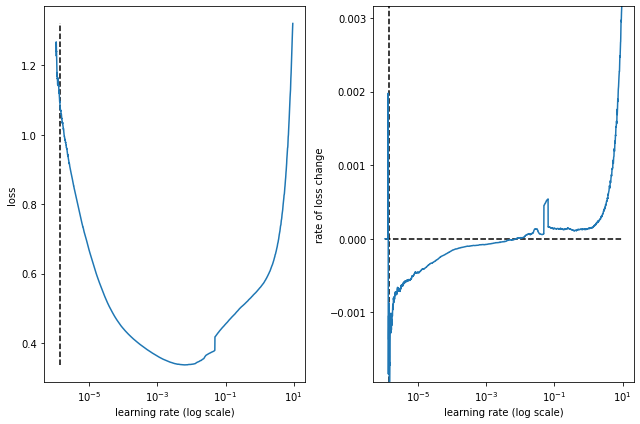

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_200fm_62f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_117 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_184 (Conv1D)            (None, 140, 62)      3162        ['input_117[0][0]']              
                                                                                                  
 conv1d_185 (Conv1D)            (None, 138, 62)      4402        ['input_117[0][0]']              
                                                                                                  
 conv1d_186 (Conv1D)            (None, 136, 62)      5642        ['input_117[0][0]']              
                               

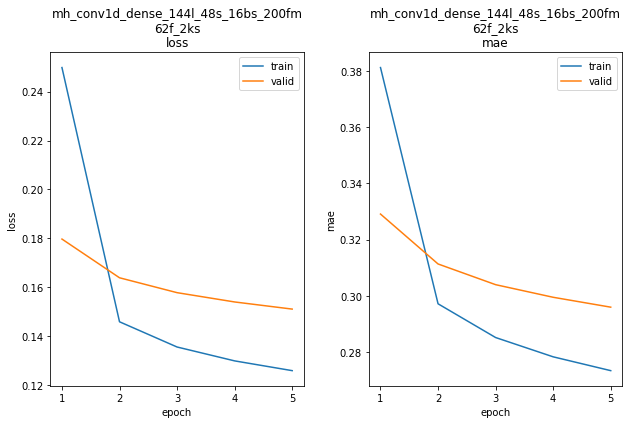

mh_conv1d_dense_144l_48s_16bs_200fm_62f_2ks train min loss: 0.125818	mae: 0.273369	epoch: 5
mh_conv1d_dense_144l_48s_16bs_200fm_62f_2ks valid min loss: 0.151012	mae: 0.295959	epoch: 5

mh_conv1d_dense_144l_48s_16bs_200fm_62f_2ks
Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 432.9686
Function value obtained: 0.1510
Current minimum: 0.1483
Iteration No: 25 started. Searching for the next optimal point.
feat_maps 129
filters 57
kern_size 6
Epoch 1/5
11752/11752 [==============================] - 49s 4ms/step - loss: 1.7084 - mae: 0.8122


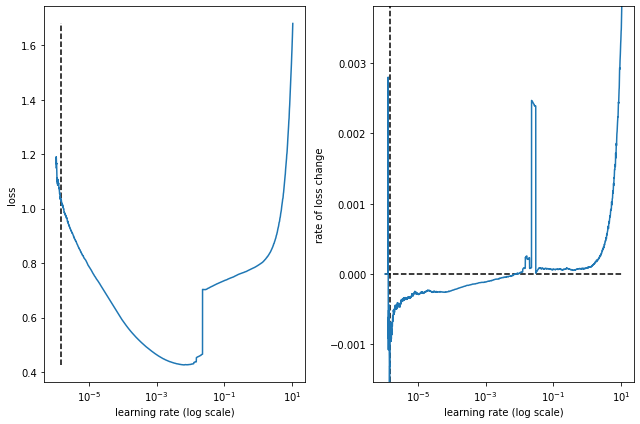

best lr: 1.4593448e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_129fm_57f_6ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_118 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_187 (Conv1D)            (None, 132, 57)      7467        ['input_118[0][0]']              
                                                                                                  
 conv1d_188 (Conv1D)            (None, 126, 57)      10887       ['input_118[0][0]']              
                                                                                                  
 conv1d_189 (Conv1D)            (None, 120, 57)      14307       ['input_118[0][0]']              
                               

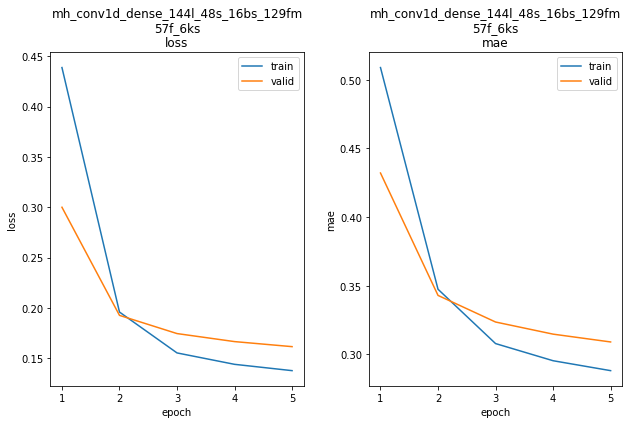

mh_conv1d_dense_144l_48s_16bs_129fm_57f_6ks train min loss: 0.137875	mae: 0.288181	epoch: 5
mh_conv1d_dense_144l_48s_16bs_129fm_57f_6ks valid min loss: 0.161700	mae: 0.309075	epoch: 5

mh_conv1d_dense_144l_48s_16bs_129fm_57f_6ks
WARN: bad model mh_conv1d_dense_144l_48s_16bs_129fm_57f_6ks
Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 414.5514
Function value obtained: 0.1617
Current minimum: 0.1483
Iteration No: 26 started. Searching for the next optimal point.
feat_maps 129
filters 57
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 49s 4ms/step - loss: 1.6162 - mae: 0.8086


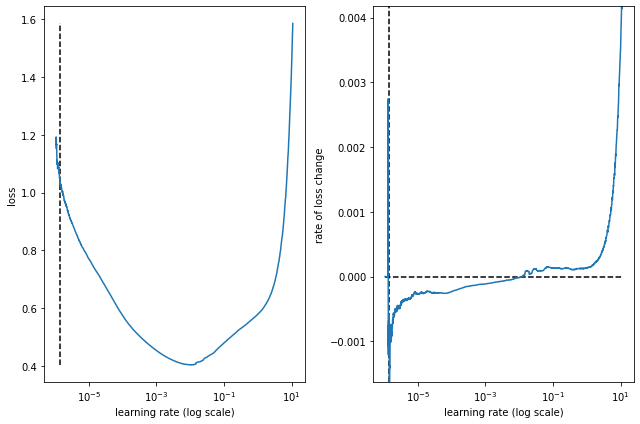

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_129fm_57f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_119 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_190 (Conv1D)            (None, 140, 57)      2907        ['input_119[0][0]']              
                                                                                                  
 conv1d_191 (Conv1D)            (None, 138, 57)      4047        ['input_119[0][0]']              
                                                                                                  
 conv1d_192 (Conv1D)            (None, 136, 57)      5187        ['input_119[0][0]']              
                               

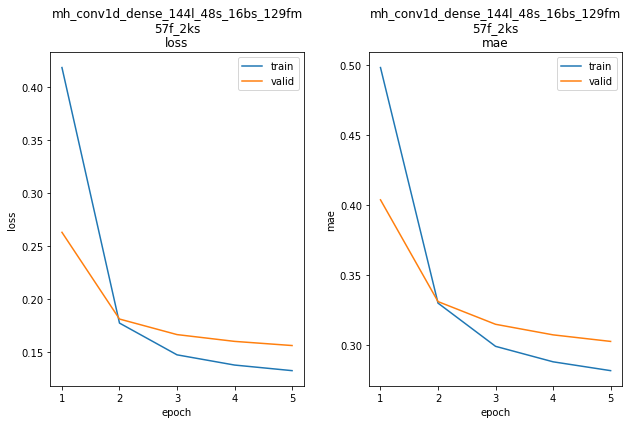

mh_conv1d_dense_144l_48s_16bs_129fm_57f_2ks train min loss: 0.132596	mae: 0.281699	epoch: 5
mh_conv1d_dense_144l_48s_16bs_129fm_57f_2ks valid min loss: 0.156245	mae: 0.302590	epoch: 5

mh_conv1d_dense_144l_48s_16bs_129fm_57f_2ks
Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 351.3842
Function value obtained: 0.1562
Current minimum: 0.1483
Iteration No: 27 started. Searching for the next optimal point.
feat_maps 256
filters 50
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 49s 4ms/step - loss: 1.3448 - mae: 0.7477


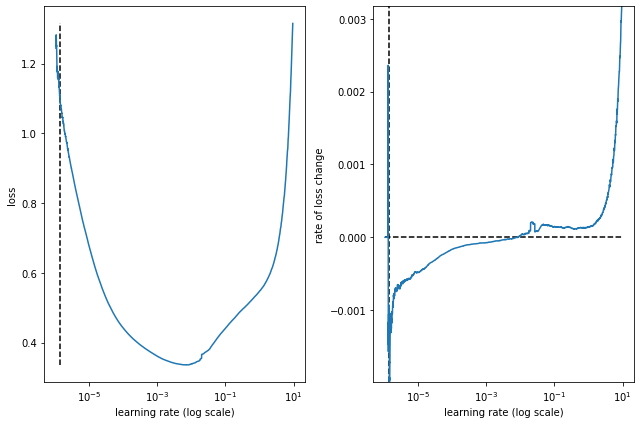

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_256fm_50f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_120 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_193 (Conv1D)            (None, 140, 50)      2550        ['input_120[0][0]']              
                                                                                                  
 conv1d_194 (Conv1D)            (None, 138, 50)      3550        ['input_120[0][0]']              
                                                                                                  
 conv1d_195 (Conv1D)            (None, 136, 50)      4550        ['input_120[0][0]']              
                               

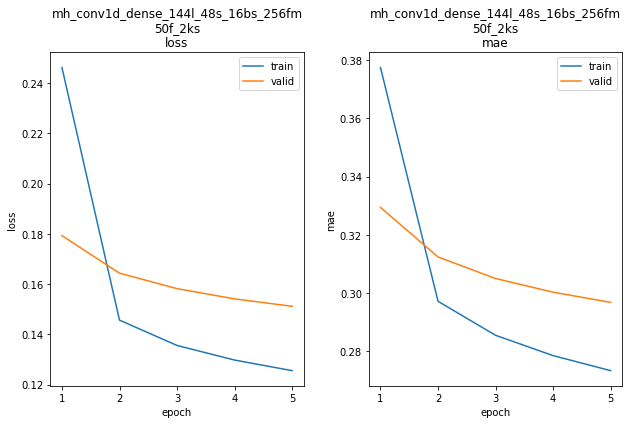

mh_conv1d_dense_144l_48s_16bs_256fm_50f_2ks train min loss: 0.125529	mae: 0.273298	epoch: 5
mh_conv1d_dense_144l_48s_16bs_256fm_50f_2ks valid min loss: 0.151133	mae: 0.296758	epoch: 5

mh_conv1d_dense_144l_48s_16bs_256fm_50f_2ks
Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 437.9991
Function value obtained: 0.1511
Current minimum: 0.1483
Iteration No: 28 started. Searching for the next optimal point.
feat_maps 132
filters 32
kern_size 6
Epoch 1/5
11752/11752 [==============================] - 49s 4ms/step - loss: 1.6997 - mae: 0.8187


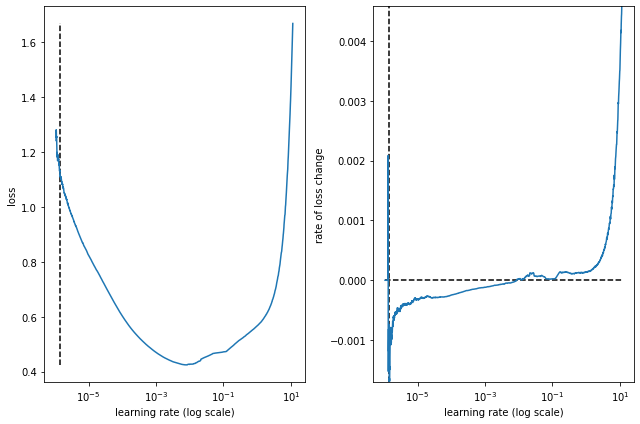

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_132fm_32f_6ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_121 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_196 (Conv1D)            (None, 132, 32)      4192        ['input_121[0][0]']              
                                                                                                  
 conv1d_197 (Conv1D)            (None, 126, 32)      6112        ['input_121[0][0]']              
                                                                                                  
 conv1d_198 (Conv1D)            (None, 120, 32)      8032        ['input_121[0][0]']              
                               

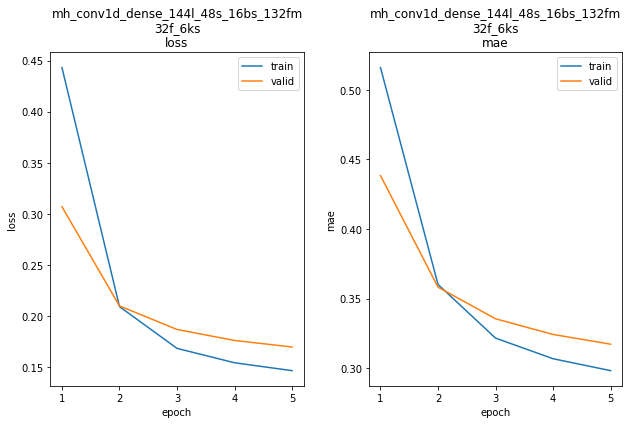

mh_conv1d_dense_144l_48s_16bs_132fm_32f_6ks train min loss: 0.146483	mae: 0.298245	epoch: 5
mh_conv1d_dense_144l_48s_16bs_132fm_32f_6ks valid min loss: 0.169605	mae: 0.317257	epoch: 5

mh_conv1d_dense_144l_48s_16bs_132fm_32f_6ks
Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 430.6534
Function value obtained: 0.1696
Current minimum: 0.1483
Iteration No: 29 started. Searching for the next optimal point.
feat_maps 129
filters 40
kern_size 2
Epoch 1/5
11752/11752 [==============================] - 49s 4ms/step - loss: 1.6825 - mae: 0.8206


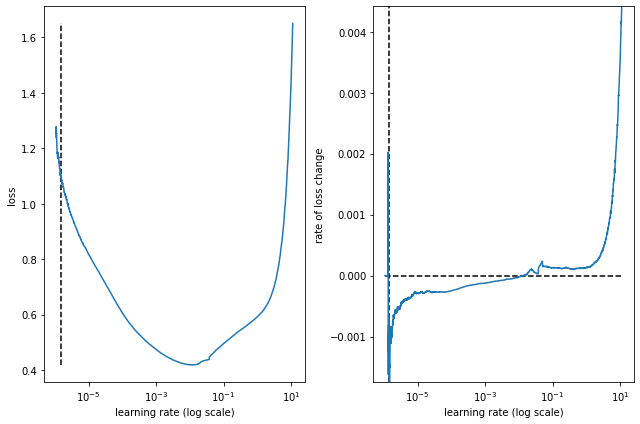

best lr: 1.4593448e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_129fm_40f_2ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_122 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_199 (Conv1D)            (None, 140, 40)      2040        ['input_122[0][0]']              
                                                                                                  
 conv1d_200 (Conv1D)            (None, 138, 40)      2840        ['input_122[0][0]']              
                                                                                                  
 conv1d_201 (Conv1D)            (None, 136, 40)      3640        ['input_122[0][0]']              
                               

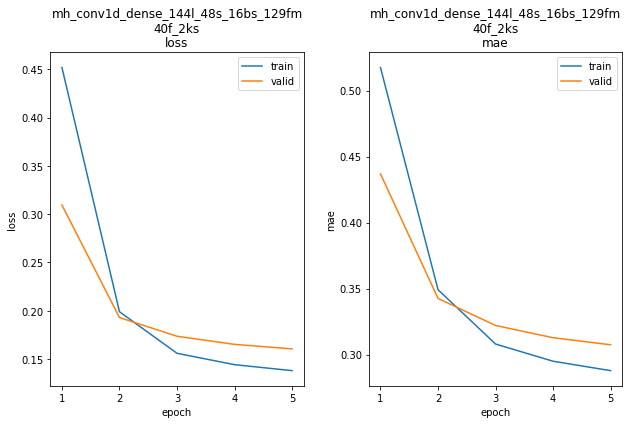

mh_conv1d_dense_144l_48s_16bs_129fm_40f_2ks train min loss: 0.138020	mae: 0.287871	epoch: 5
mh_conv1d_dense_144l_48s_16bs_129fm_40f_2ks valid min loss: 0.160554	mae: 0.307472	epoch: 5

mh_conv1d_dense_144l_48s_16bs_129fm_40f_2ks
WARN: bad model mh_conv1d_dense_144l_48s_16bs_129fm_40f_2ks
Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 465.6619
Function value obtained: 0.1606
Current minimum: 0.1483
Iteration No: 30 started. Searching for the next optimal point.
feat_maps 255
filters 54
kern_size 4
Epoch 1/5
11752/11752 [==============================] - 50s 4ms/step - loss: 1.3910 - mae: 0.7609


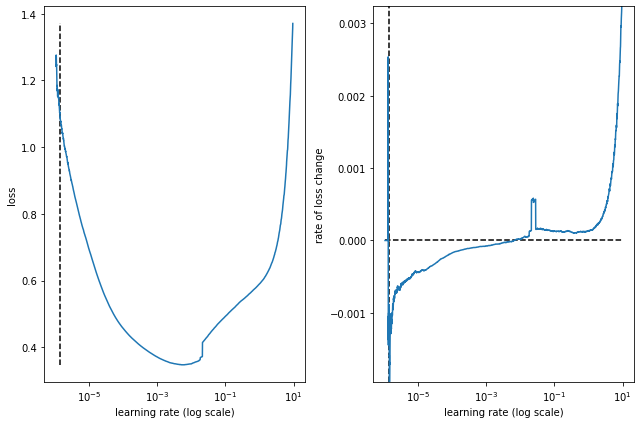

best lr: 1.4509475e-06 

Model: "mh_conv1d_dense_144l_48s_16bs_255fm_54f_4ks"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_123 (InputLayer)         [(None, 144, 10)]    0           []                               
                                                                                                  
 conv1d_202 (Conv1D)            (None, 136, 54)      4914        ['input_123[0][0]']              
                                                                                                  
 conv1d_203 (Conv1D)            (None, 132, 54)      7074        ['input_123[0][0]']              
                                                                                                  
 conv1d_204 (Conv1D)            (None, 128, 54)      9234        ['input_123[0][0]']              
                               

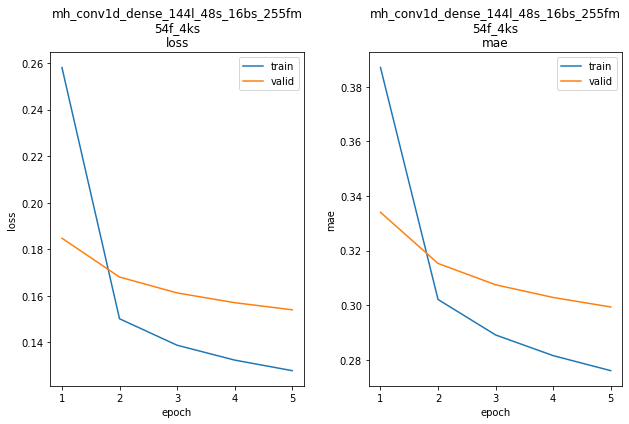

mh_conv1d_dense_144l_48s_16bs_255fm_54f_4ks train min loss: 0.127811	mae: 0.276062	epoch: 5
mh_conv1d_dense_144l_48s_16bs_255fm_54f_4ks valid min loss: 0.153972	mae: 0.299382	epoch: 5

mh_conv1d_dense_144l_48s_16bs_255fm_54f_4ks
Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 437.7754
Function value obtained: 0.1540
Current minimum: 0.1483

[254, 64, 2]
0.14829251170158386



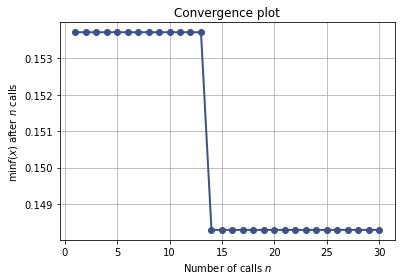

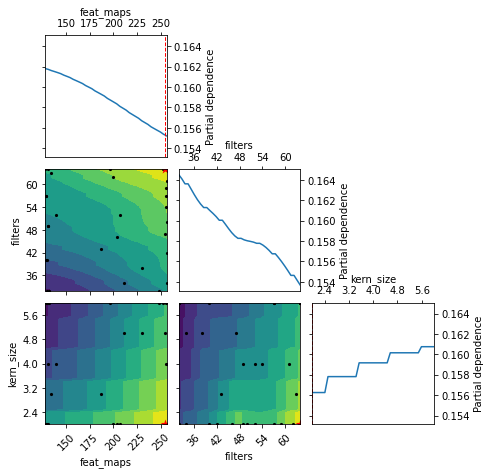

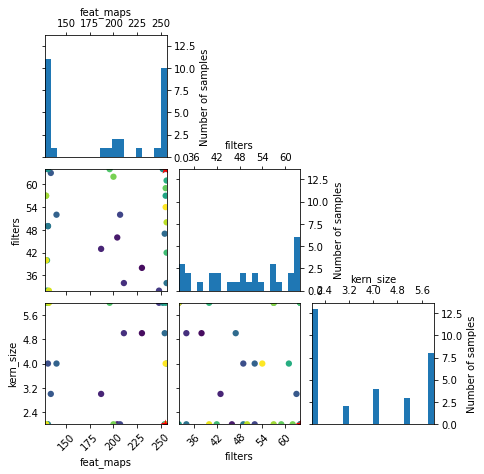

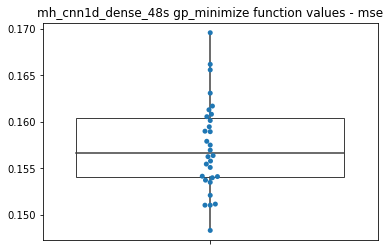

CPU times: user 3h 22min 52s, sys: 25min 24s, total: 3h 48min 16s
Wall time: 3h 22min


In [ ]:
%%time


results_id = 'mh_cnn1d_dense_48s'
hpo[results_id] = {}

dim_feat_maps = Integer(low = 128, high = 256, name = 'feat_maps')
dim_filters   = Integer(low =  32, high =  64, name = 'filters')
dim_kern_size = Integer(low =   2, high =   6, name = 'kern_size')

hpo[results_id]['dims'] = [dim_feat_maps,
                           dim_filters,
                           dim_kern_size]
hpo[results_id]['init_dims'] = [128, 64, 2]
hpo[results_id]['calls']     = 30


@use_named_args(dimensions = hpo[results_id]['dims'])
def model_fitness(**dims):
    params = get_default_params('mh_conv1d_dense')
    params.update({'lrf_params': [0.000001,  0.0002, 32, 5, 100, 25]})

#             'lrf_params': [0.001,   10, 32, 5, 100, 25]}
#             'lrf_params': [0.00009,  10, 32, 5, 100, 25]}
#             'lrf_params': [0.00001,  10, 32, 5, 100, 25]}
#             'lrf_params': [0.0003,   10, 32, 5, 100, 25]}  # 0.0003 too high
#             'lrf_params': [0.000005, 10, 32, 5, 100, 25]}
#            'lrf_params': [0.000001, 10, 32, 5, 100, 25]}  # last - no underfitting but might be learning too slowly
#   params.update({'lrf_params': [0.00001,  0.0002, 32, 5, 100, 25]}) # early signs of underfitting


    return get_bo_mse(params, **dims)


hpo[results_id]['fitness_func'] = model_fitness
hpo[results_id]['results']      = run_bo_search(hpo, results_id)

The optimal parameters found for the 0.1448 minimum value were:

 * feat_maps - 128
 * filters - 57
 * kern_size - 2

This minimal value is greater than the Conv1D-LSTM minimal mse value of 0.1296.  An additional Dense(activation='relu') layer may improve the mse value but may not give transformative results.

It's clear from some of the learning rate finder curves that start_lr and/or end_lr could be further refined.  

As with all of the skopt runs, it would benefit from running for more iterations and probably more learning rate tuning.

---

### Conv2D - Dense

...

1 of 16
Pandas(Index=8, feat_maps=256, filters=64, kern_size=4)
Epoch 1/5
11752/11752 [==============================] - 8s 629us/step - loss: 2.0690 - mae: 0.5595


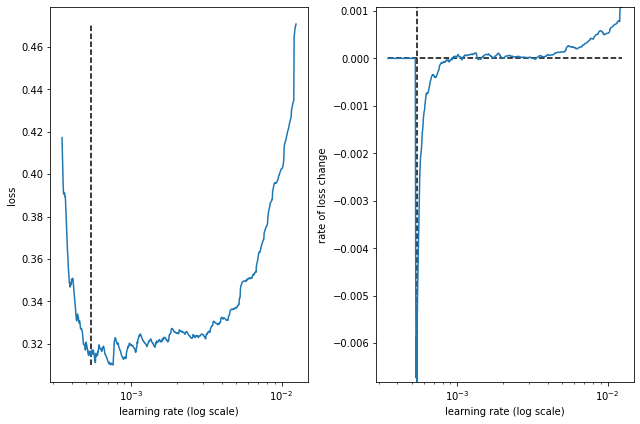

best lr: 0.0005380484 

Model: "conv2d_dense_144l_48s_16bs_256fm_64f_4ks_0.1000do"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_2 (Dropout)          (None, 144, 10)           0         
_________________________________________________________________
reshape_36 (Reshape)         (None, 144, 10, 1)        0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 144, 10, 64)       320       
_________________________________________________________________
flatten_16 (Flatten)         (None, 92160)             0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 92160)             0         
_________________________________________________________________
dense_34 (Dense)             (None, 256)               23593216  
___________________________________________________________

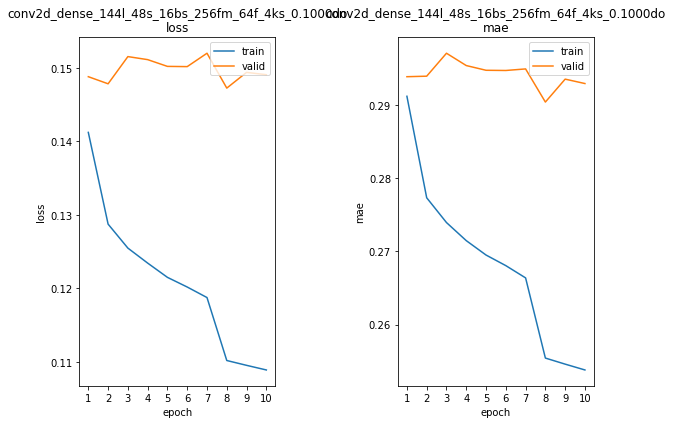

conv2d_dense_144l_48s_16bs_256fm_64f_4ks_0.1000do train min loss: 0.108910	mae: 0.253783	epoch: 10
conv2d_dense_144l_48s_16bs_256fm_64f_4ks_0.1000do valid min loss: 0.147236	mae: 0.290437	epoch: 8

2 of 16
Pandas(Index=13, feat_maps=512, filters=32, kern_size=3)
Epoch 1/5
11752/11752 [==============================] - 9s 710us/step - loss: 3.7834 - mae: 0.5814


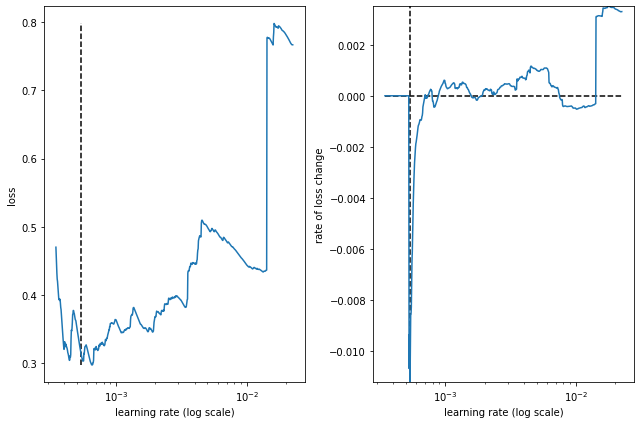

best lr: 0.0005380484 

Model: "conv2d_dense_144l_48s_16bs_512fm_32f_3ks_0.1000do"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_5 (Dropout)          (None, 144, 10)           0         
_________________________________________________________________
reshape_38 (Reshape)         (None, 144, 10, 1)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 144, 10, 32)       128       
_________________________________________________________________
flatten_17 (Flatten)         (None, 46080)             0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 46080)             0         
_________________________________________________________________
dense_37 (Dense)             (None, 512)               23593472  
___________________________________________________________

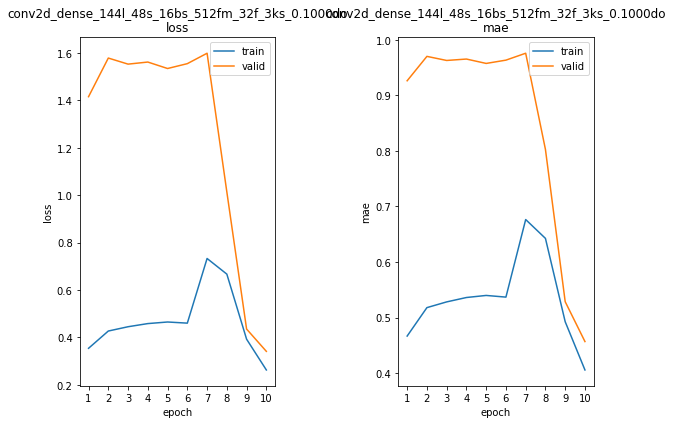

conv2d_dense_144l_48s_16bs_512fm_32f_3ks_0.1000do train min loss: 0.262304	mae: 0.405755	epoch: 10
conv2d_dense_144l_48s_16bs_512fm_32f_3ks_0.1000do valid min loss: 0.340845	mae: 0.456883	epoch: 10

3 of 16
Pandas(Index=9, feat_maps=512, filters=24, kern_size=2)
Epoch 1/5
11752/11752 [==============================] - 8s 650us/step - loss: 1.4013 - mae: 0.5366


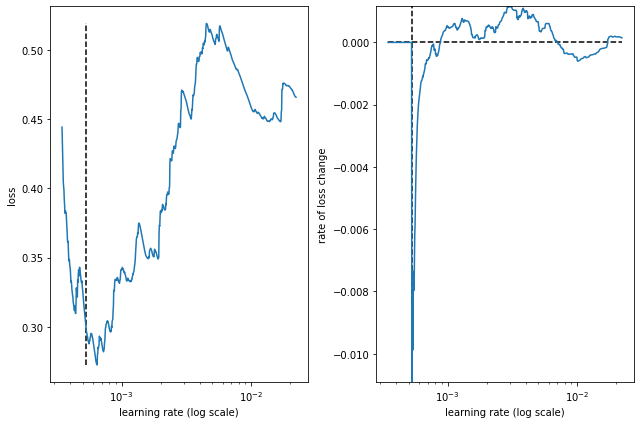

best lr: 0.0005289712 

Model: "conv2d_dense_144l_48s_16bs_512fm_24f_2ks_0.1000do"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_8 (Dropout)          (None, 144, 10)           0         
_________________________________________________________________
reshape_40 (Reshape)         (None, 144, 10, 1)        0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 144, 10, 24)       72        
_________________________________________________________________
flatten_18 (Flatten)         (None, 34560)             0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 34560)             0         
_________________________________________________________________
dense_40 (Dense)             (None, 512)               17695232  
___________________________________________________________

KeyboardInterrupt: ignored

In [ ]:
params = {'xcols':        def_cols,
          'ycols':             'y',
          'lags':              144, 
          'steps_ahead':        48,
          'stride':             48, 
          'shuffle':          True,
          'bs':                 16,
          'model_type': 'conv2d_dense',
          'mix_type':         'ts',
          'mix_alpha':           4,
          'mix_factor':          0,
          'mix_diff':            1,
          #'feat_maps':         32,
          #'filters':            8,
          #'kern_size':          3,
          'drop_out':          0.1,
          'kern_reg':          0.0,
          'recu_reg':          0.0,
          'epochs':             10,
          'lrf_params': lrf_params}

#sweep_values = {'feat_maps': [64, 128, 256],
#                'filters':   [16,  32,  64],
#                'kern_size': [ 5,   7,   9]}
sweep_values = {'feat_maps': [256, 512, 1024],
                'filters':   [ 24,  32,   64],
                'kern_size': [  2,   3,    4]}
models, ks_model_names = random_search_params(models, params, sweep_values, limit = 16)

get_best_models(models, ks_model_names)
get_best_models(models)

display(rank_models(models, 'val_loss', strict = True, limit = 5))
display(rank_models(models, 'val_mae',  strict = True, limit = 5))

...

It's clear from some of the learning rate finder curves that start_lr and/or end_lr could be further refined.  

As with all of the skopt runs, it would benefit from running for more iterations and probably more learning rate tuning.

---

skopt time



Iteration No: 1 started. Evaluating function at provided point.
feat_maps: 512
lags: 144
filters: 64
kern_size: 3
Epoch 1/5
11752/11752 [==============================] - 17s 1ms/step - loss: 5.4255 - mae: 0.6588


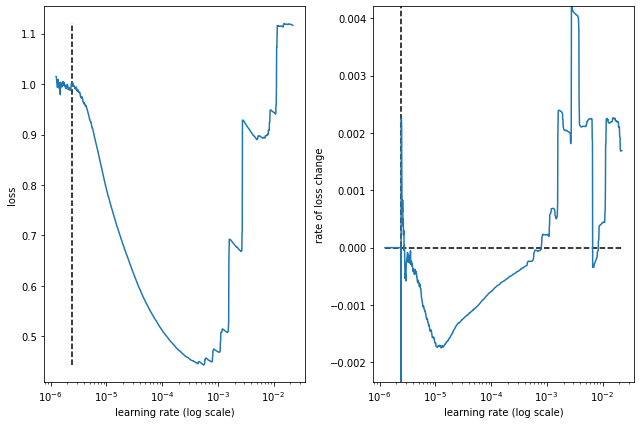

best lr: 2.4055353e-06 

Model: "conv2d_dense_144l_48s_16bs_512fm_64f_3ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_78 (Reshape)         (None, 144, 10, 1)        0         
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 144, 10, 64)       256       
_________________________________________________________________
flatten_37 (Flatten)         (None, 92160)             0         
_________________________________________________________________
dense_97 (Dense)             (None, 512)               47186432  
_________________________________________________________________
dense_98 (Dense)             (None, 256)               131328    
_________________________________________________________________
dense_99 (Dense)             (None, 48)                12336     
_________________________________________________________________
r

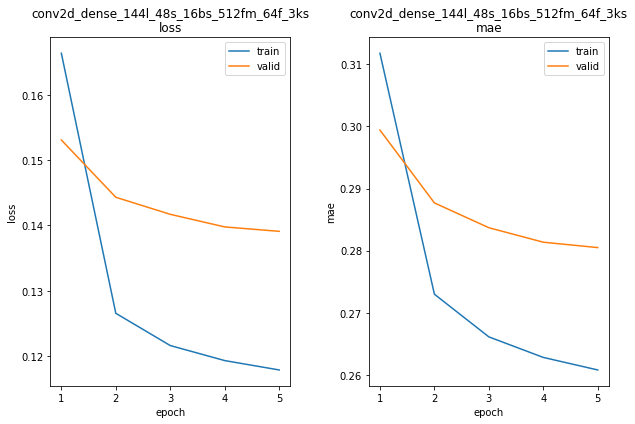

conv2d_dense_144l_48s_16bs_512fm_64f_3ks train min loss: 0.117853	mae: 0.260777	epoch: 5
conv2d_dense_144l_48s_16bs_512fm_64f_3ks valid min loss: 0.139101	mae: 0.280490	epoch: 5

conv2d_dense_144l_48s_16bs_512fm_64f_3ks
mse: 0.13910073041915894

Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 400.7758
Function value obtained: 0.1391
Current minimum: 0.1391
Iteration No: 2 started. Evaluating function at random point.
feat_maps: 868
lags: 66
filters: 55
kern_size: 5
Epoch 1/5
11757/11757 [==============================] - 14s 1ms/step - loss: 1.8079 - mae: 0.6155


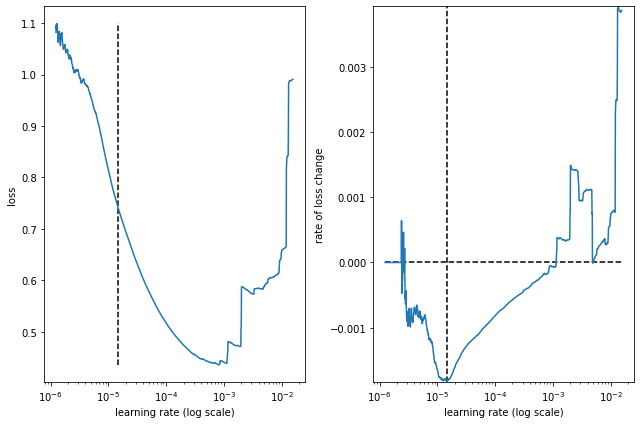

best lr: 1.47850305e-05 

Model: "conv2d_dense_66l_48s_16bs_868fm_55f_5ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_80 (Reshape)         (None, 66, 10, 1)         0         
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 66, 10, 55)        330       
_________________________________________________________________
flatten_38 (Flatten)         (None, 36300)             0         
_________________________________________________________________
dense_100 (Dense)            (None, 868)               31509268  
_________________________________________________________________
dense_101 (Dense)            (None, 434)               377146    
_________________________________________________________________
dense_102 (Dense)            (None, 48)                20880     
_________________________________________________________________
r

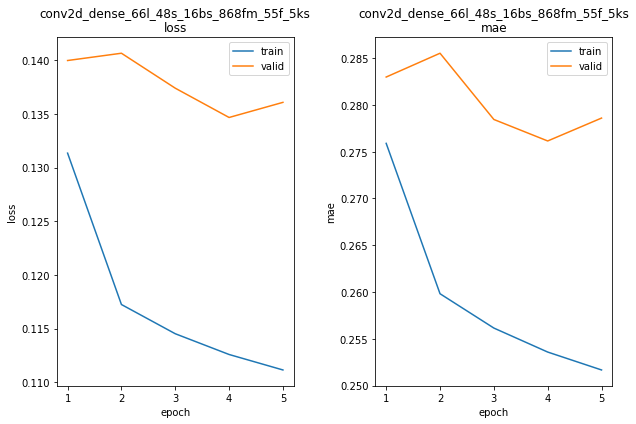

conv2d_dense_66l_48s_16bs_868fm_55f_5ks train min loss: 0.111156	mae: 0.251672	epoch: 5
conv2d_dense_66l_48s_16bs_868fm_55f_5ks valid min loss: 0.134676	mae: 0.276148	epoch: 4

conv2d_dense_66l_48s_16bs_868fm_55f_5ks
WARN: bad model conv2d_dense_66l_48s_16bs_868fm_55f_5ks
mse: 0.1346757858991623

Iteration No: 2 ended. Evaluation done at random point.
Time taken: 380.3604
Function value obtained: 0.1347
Current minimum: 0.1347
Iteration No: 3 started. Evaluating function at random point.
feat_maps: 598
lags: 58
filters: 42
kern_size: 4
Epoch 1/5
11757/11757 [==============================] - 12s 935us/step - loss: 1.8007 - mae: 0.6309


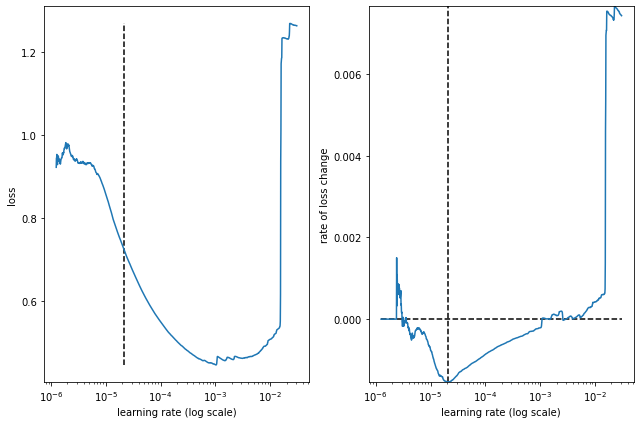

best lr: 2.1186179e-05 

Model: "conv2d_dense_58l_48s_16bs_598fm_42f_4ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_82 (Reshape)         (None, 58, 10, 1)         0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 58, 10, 42)        210       
_________________________________________________________________
flatten_39 (Flatten)         (None, 24360)             0         
_________________________________________________________________
dense_103 (Dense)            (None, 598)               14567878  
_________________________________________________________________
dense_104 (Dense)            (None, 299)               179101    
_________________________________________________________________
dense_105 (Dense)            (None, 48)                14400     
_________________________________________________________________
re

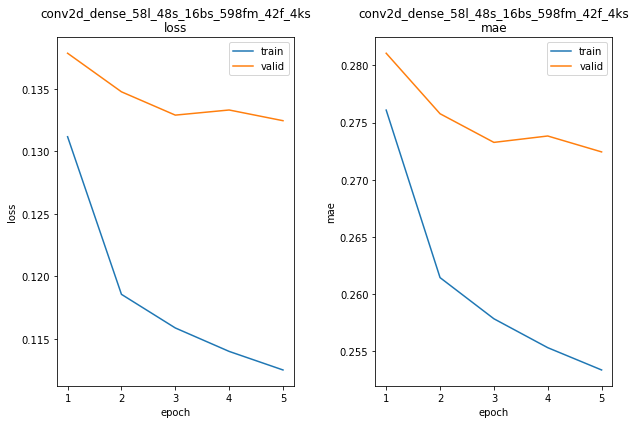

conv2d_dense_58l_48s_16bs_598fm_42f_4ks train min loss: 0.112514	mae: 0.253384	epoch: 5
conv2d_dense_58l_48s_16bs_598fm_42f_4ks valid min loss: 0.132446	mae: 0.272437	epoch: 5

conv2d_dense_58l_48s_16bs_598fm_42f_4ks
WARN: bad model conv2d_dense_58l_48s_16bs_598fm_42f_4ks
mse: 0.13244566321372986

Iteration No: 3 ended. Evaluation done at random point.
Time taken: 293.1298
Function value obtained: 0.1324
Current minimum: 0.1324
Iteration No: 4 started. Evaluating function at random point.
feat_maps: 366
lags: 110
filters: 26
kern_size: 6
Epoch 1/5
11754/11754 [==============================] - 11s 874us/step - loss: 12.8628 - mae: 0.6579


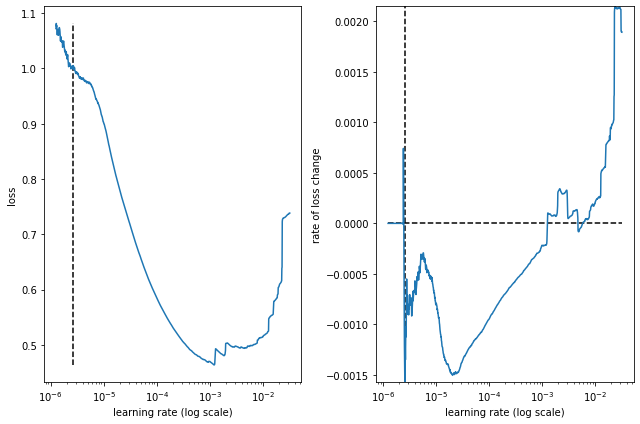

best lr: 2.5801126e-06 

Model: "conv2d_dense_110l_48s_16bs_366fm_26f_6ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_84 (Reshape)         (None, 110, 10, 1)        0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 110, 10, 26)       182       
_________________________________________________________________
flatten_40 (Flatten)         (None, 28600)             0         
_________________________________________________________________
dense_106 (Dense)            (None, 366)               10467966  
_________________________________________________________________
dense_107 (Dense)            (None, 183)               67161     
_________________________________________________________________
dense_108 (Dense)            (None, 48)                8832      
_________________________________________________________________
r

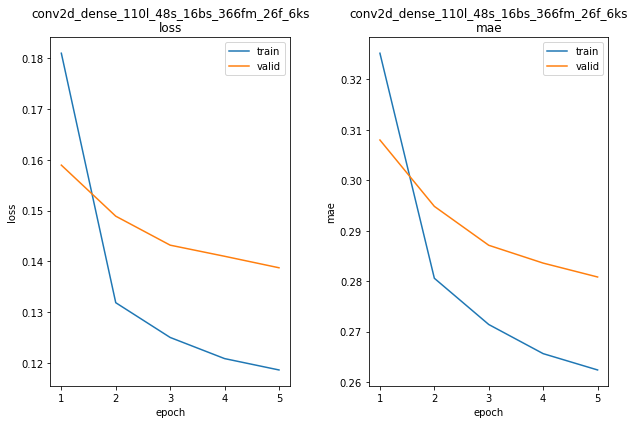

conv2d_dense_110l_48s_16bs_366fm_26f_6ks train min loss: 0.118581	mae: 0.262413	epoch: 5
conv2d_dense_110l_48s_16bs_366fm_26f_6ks valid min loss: 0.138727	mae: 0.280829	epoch: 5

conv2d_dense_110l_48s_16bs_366fm_26f_6ks
mse: 0.1387273520231247

Iteration No: 4 ended. Evaluation done at random point.
Time taken: 371.8504
Function value obtained: 0.1387
Current minimum: 0.1324
Iteration No: 5 started. Evaluating function at random point.
feat_maps: 977
lags: 48
filters: 64
kern_size: 5
Epoch 1/5
11758/11758 [==============================] - 16s 1ms/step - loss: 5.9961 - mae: 0.6741


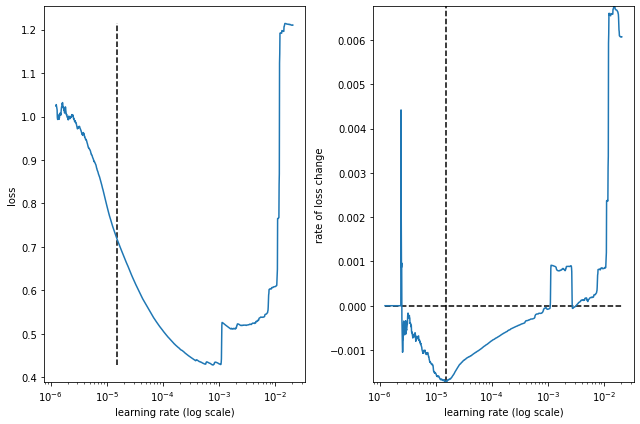

best lr: 1.5444486e-05 

Model: "conv2d_dense_48l_48s_16bs_977fm_64f_5ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_86 (Reshape)         (None, 48, 10, 1)         0         
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 48, 10, 64)        384       
_________________________________________________________________
flatten_41 (Flatten)         (None, 30720)             0         
_________________________________________________________________
dense_109 (Dense)            (None, 977)               30014417  
_________________________________________________________________
dense_110 (Dense)            (None, 488)               477264    
_________________________________________________________________
dense_111 (Dense)            (None, 48)                23472     
_________________________________________________________________
re

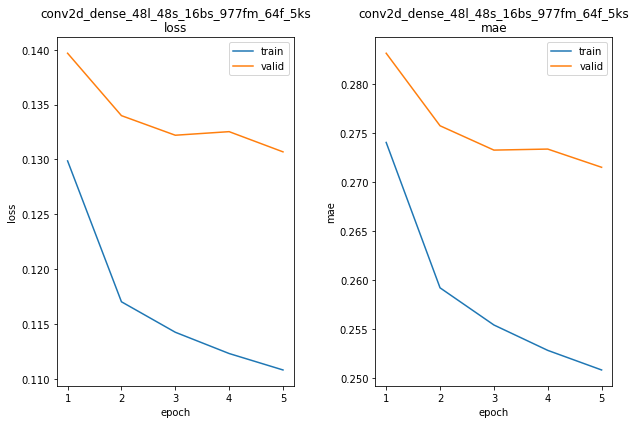

conv2d_dense_48l_48s_16bs_977fm_64f_5ks train min loss: 0.110822	mae: 0.250852	epoch: 5
conv2d_dense_48l_48s_16bs_977fm_64f_5ks valid min loss: 0.130694	mae: 0.271514	epoch: 5

conv2d_dense_48l_48s_16bs_977fm_64f_5ks
WARN: bad model conv2d_dense_48l_48s_16bs_977fm_64f_5ks
mse: 0.13069382309913635

Iteration No: 5 ended. Evaluation done at random point.
Time taken: 408.0761
Function value obtained: 0.1307
Current minimum: 0.1307
Iteration No: 6 started. Evaluating function at random point.
feat_maps: 726
lags: 49
filters: 25
kern_size: 5
Epoch 1/5
11758/11758 [==============================] - 11s 837us/step - loss: 2.2025 - mae: 0.6221


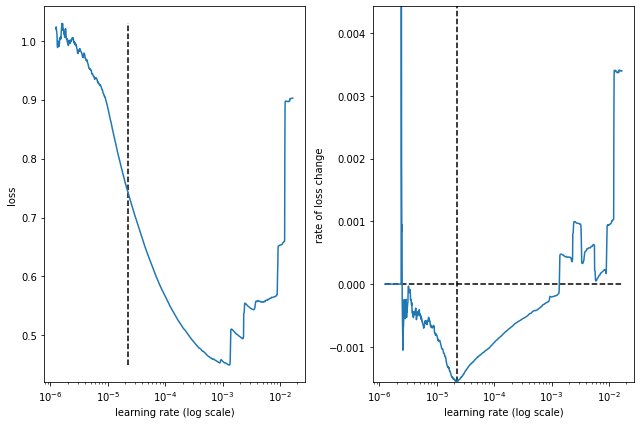

best lr: 2.213047e-05 

Model: "conv2d_dense_49l_48s_16bs_726fm_25f_5ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_88 (Reshape)         (None, 49, 10, 1)         0         
_________________________________________________________________
conv2d_47 (Conv2D)           (None, 49, 10, 25)        150       
_________________________________________________________________
flatten_42 (Flatten)         (None, 12250)             0         
_________________________________________________________________
dense_112 (Dense)            (None, 726)               8894226   
_________________________________________________________________
dense_113 (Dense)            (None, 363)               263901    
_________________________________________________________________
dense_114 (Dense)            (None, 48)                17472     
_________________________________________________________________
res

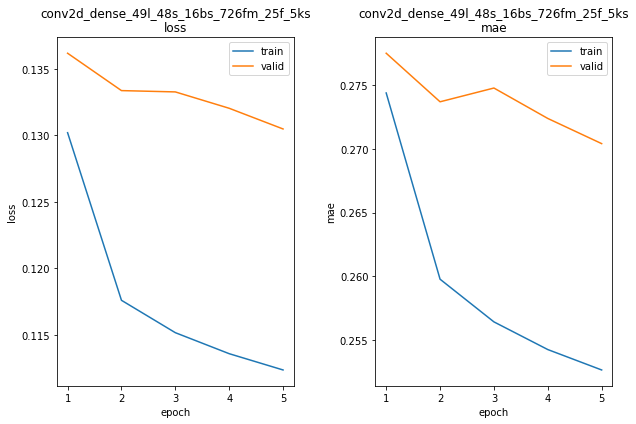

conv2d_dense_49l_48s_16bs_726fm_25f_5ks train min loss: 0.112361	mae: 0.252648	epoch: 5
conv2d_dense_49l_48s_16bs_726fm_25f_5ks valid min loss: 0.130484	mae: 0.270411	epoch: 5

conv2d_dense_49l_48s_16bs_726fm_25f_5ks
WARN: bad model conv2d_dense_49l_48s_16bs_726fm_25f_5ks
mse: 0.1304837167263031

Iteration No: 6 ended. Evaluation done at random point.
Time taken: 330.1522
Function value obtained: 0.1305
Current minimum: 0.1305
Iteration No: 7 started. Evaluating function at random point.
feat_maps: 563
lags: 52
filters: 63
kern_size: 3
Epoch 1/5
11757/11757 [==============================] - 13s 1ms/step - loss: 9.9242 - mae: 0.6601


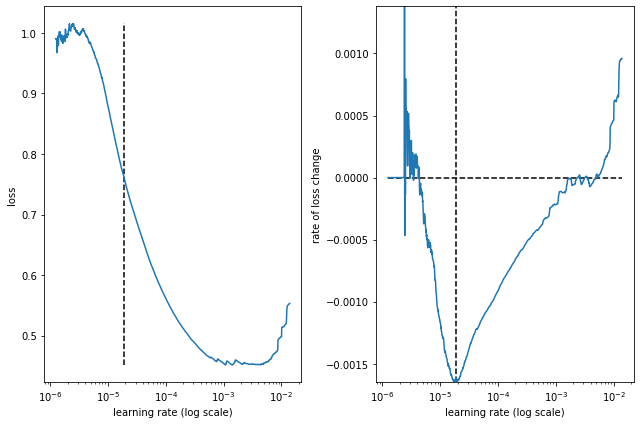

best lr: 1.9068942e-05 

Model: "conv2d_dense_52l_48s_16bs_563fm_63f_3ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_90 (Reshape)         (None, 52, 10, 1)         0         
_________________________________________________________________
conv2d_48 (Conv2D)           (None, 52, 10, 63)        252       
_________________________________________________________________
flatten_43 (Flatten)         (None, 32760)             0         
_________________________________________________________________
dense_115 (Dense)            (None, 563)               18444443  
_________________________________________________________________
dense_116 (Dense)            (None, 281)               158484    
_________________________________________________________________
dense_117 (Dense)            (None, 48)                13536     
_________________________________________________________________
re

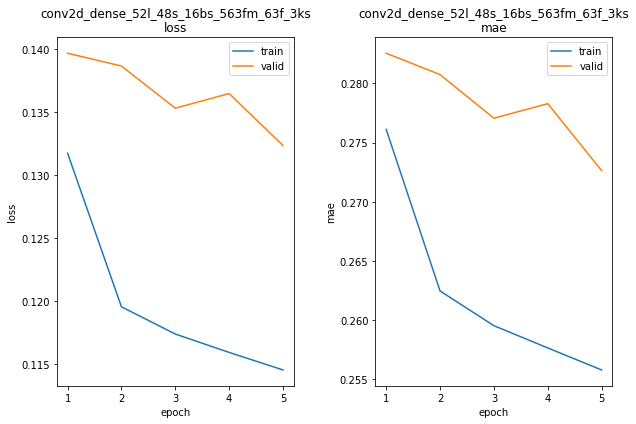

conv2d_dense_52l_48s_16bs_563fm_63f_3ks train min loss: 0.114555	mae: 0.255791	epoch: 5
conv2d_dense_52l_48s_16bs_563fm_63f_3ks valid min loss: 0.132346	mae: 0.272631	epoch: 5

conv2d_dense_52l_48s_16bs_563fm_63f_3ks
WARN: bad model conv2d_dense_52l_48s_16bs_563fm_63f_3ks
mse: 0.13234610855579376

Iteration No: 7 ended. Evaluation done at random point.
Time taken: 328.8143
Function value obtained: 0.1323
Current minimum: 0.1305
Iteration No: 8 started. Evaluating function at random point.
feat_maps: 326
lags: 107
filters: 39
kern_size: 7
Epoch 1/5
11754/11754 [==============================] - 11s 873us/step - loss: 2.7993 - mae: 0.6016


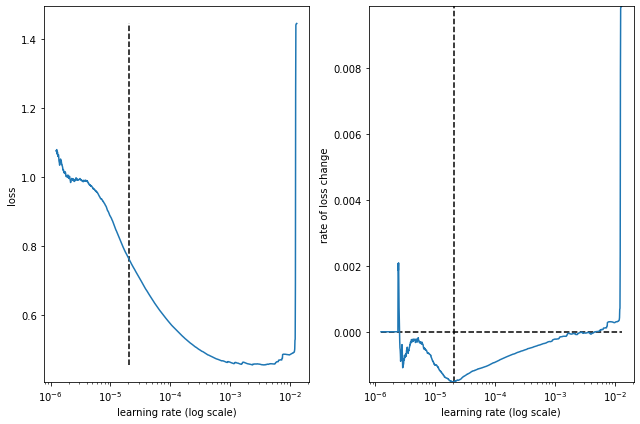

best lr: 2.0471296e-05 

Model: "conv2d_dense_107l_48s_16bs_326fm_39f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_92 (Reshape)         (None, 107, 10, 1)        0         
_________________________________________________________________
conv2d_49 (Conv2D)           (None, 107, 10, 39)       312       
_________________________________________________________________
flatten_44 (Flatten)         (None, 41730)             0         
_________________________________________________________________
dense_118 (Dense)            (None, 326)               13604306  
_________________________________________________________________
dense_119 (Dense)            (None, 163)               53301     
_________________________________________________________________
dense_120 (Dense)            (None, 48)                7872      
_________________________________________________________________
r

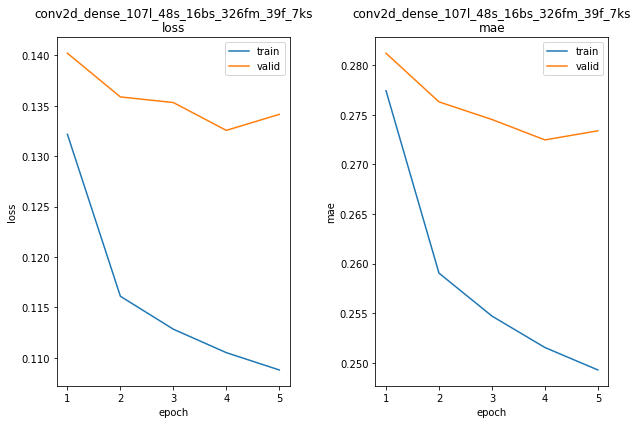

conv2d_dense_107l_48s_16bs_326fm_39f_7ks train min loss: 0.108788	mae: 0.249275	epoch: 5
conv2d_dense_107l_48s_16bs_326fm_39f_7ks valid min loss: 0.132559	mae: 0.272475	epoch: 4

conv2d_dense_107l_48s_16bs_326fm_39f_7ks
WARN: bad model conv2d_dense_107l_48s_16bs_326fm_39f_7ks
mse: 0.1325586885213852

Iteration No: 8 ended. Evaluation done at random point.
Time taken: 373.4108
Function value obtained: 0.1326
Current minimum: 0.1305
Iteration No: 9 started. Evaluating function at random point.
feat_maps: 614
lags: 131
filters: 51
kern_size: 4
Epoch 1/5
11752/11752 [==============================] - 16s 1ms/step - loss: 3.2193 - mae: 0.6175


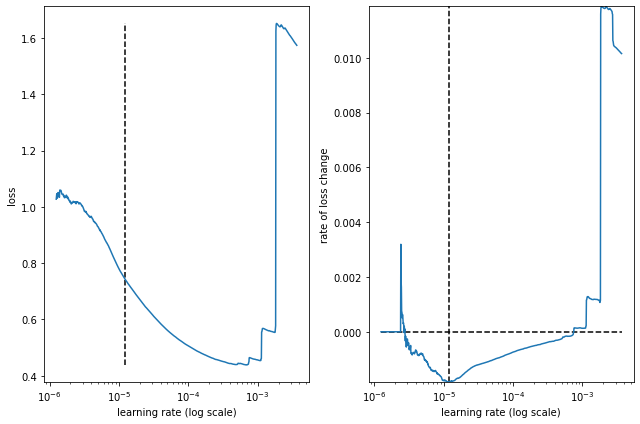

best lr: 1.209598e-05 

Model: "conv2d_dense_131l_48s_16bs_614fm_51f_4ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_94 (Reshape)         (None, 131, 10, 1)        0         
_________________________________________________________________
conv2d_50 (Conv2D)           (None, 131, 10, 51)       255       
_________________________________________________________________
flatten_45 (Flatten)         (None, 66810)             0         
_________________________________________________________________
dense_121 (Dense)            (None, 614)               41021954  
_________________________________________________________________
dense_122 (Dense)            (None, 307)               188805    
_________________________________________________________________
dense_123 (Dense)            (None, 48)                14784     
_________________________________________________________________
re

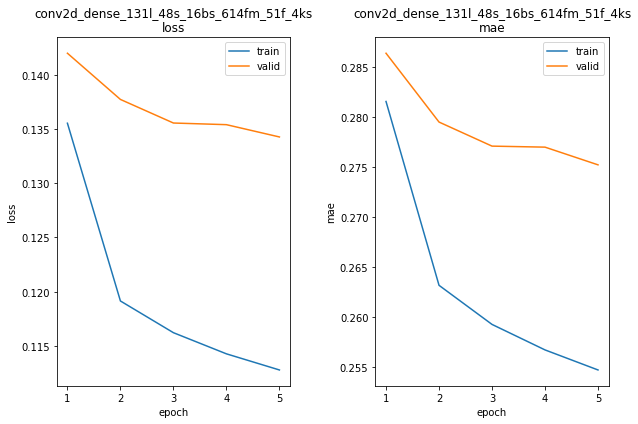

conv2d_dense_131l_48s_16bs_614fm_51f_4ks train min loss: 0.112789	mae: 0.254695	epoch: 5
conv2d_dense_131l_48s_16bs_614fm_51f_4ks valid min loss: 0.134266	mae: 0.275243	epoch: 5

conv2d_dense_131l_48s_16bs_614fm_51f_4ks
WARN: bad model conv2d_dense_131l_48s_16bs_614fm_51f_4ks
mse: 0.134266197681427

Iteration No: 9 ended. Evaluation done at random point.
Time taken: 671.9189
Function value obtained: 0.1343
Current minimum: 0.1305
Iteration No: 10 started. Evaluating function at random point.
feat_maps: 266
lags: 138
filters: 47
kern_size: 4
Epoch 1/5
11752/11752 [==============================] - 12s 998us/step - loss: 2.3349 - mae: 0.6142


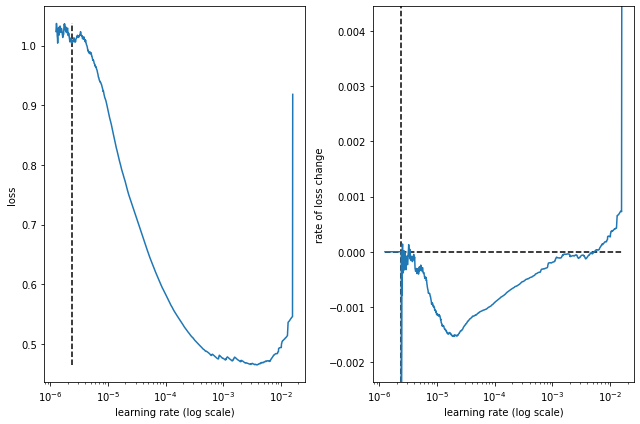

best lr: 2.4055353e-06 

Model: "conv2d_dense_138l_48s_16bs_266fm_47f_4ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_96 (Reshape)         (None, 138, 10, 1)        0         
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 138, 10, 47)       235       
_________________________________________________________________
flatten_46 (Flatten)         (None, 64860)             0         
_________________________________________________________________
dense_124 (Dense)            (None, 266)               17253026  
_________________________________________________________________
dense_125 (Dense)            (None, 133)               35511     
_________________________________________________________________
dense_126 (Dense)            (None, 48)                6432      
_________________________________________________________________
r

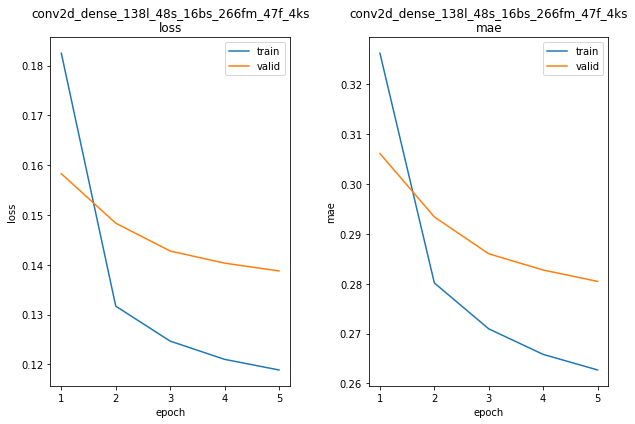

conv2d_dense_138l_48s_16bs_266fm_47f_4ks train min loss: 0.118865	mae: 0.262708	epoch: 5
conv2d_dense_138l_48s_16bs_266fm_47f_4ks valid min loss: 0.138748	mae: 0.280468	epoch: 5

conv2d_dense_138l_48s_16bs_266fm_47f_4ks
mse: 0.1387484222650528

Iteration No: 10 ended. Evaluation done at random point.
Time taken: 369.3882
Function value obtained: 0.1387
Current minimum: 0.1305
Iteration No: 11 started. Evaluating function at random point.
feat_maps: 268
lags: 70
filters: 34
kern_size: 5
Epoch 1/5
11756/11756 [==============================] - 11s 845us/step - loss: 3.0804 - mae: 0.6303


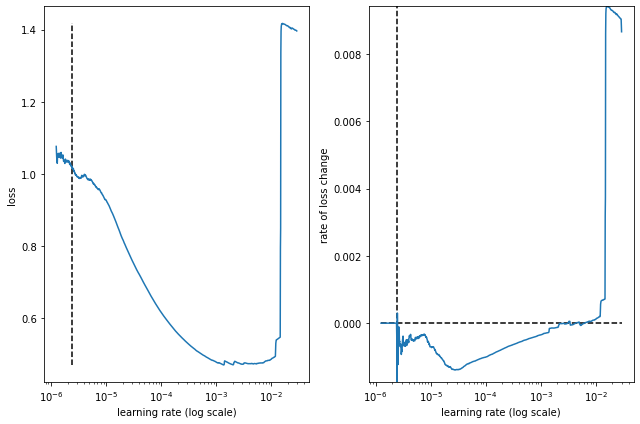

best lr: 2.4260112e-06 

Model: "conv2d_dense_70l_48s_16bs_268fm_34f_5ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_98 (Reshape)         (None, 70, 10, 1)         0         
_________________________________________________________________
conv2d_52 (Conv2D)           (None, 70, 10, 34)        204       
_________________________________________________________________
flatten_47 (Flatten)         (None, 23800)             0         
_________________________________________________________________
dense_127 (Dense)            (None, 268)               6378668   
_________________________________________________________________
dense_128 (Dense)            (None, 134)               36046     
_________________________________________________________________
dense_129 (Dense)            (None, 48)                6480      
_________________________________________________________________
re

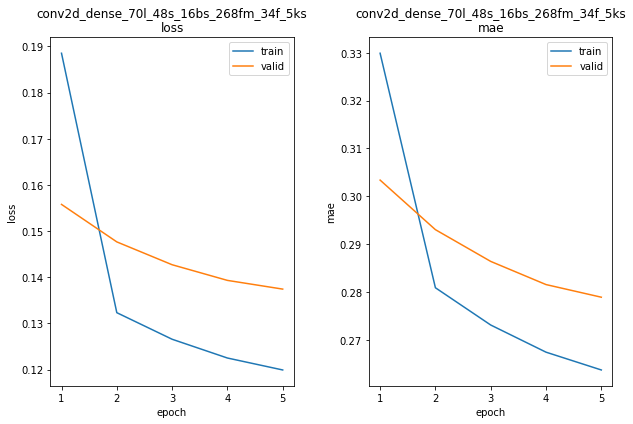

conv2d_dense_70l_48s_16bs_268fm_34f_5ks train min loss: 0.119930	mae: 0.263746	epoch: 5
conv2d_dense_70l_48s_16bs_268fm_34f_5ks valid min loss: 0.137445	mae: 0.278940	epoch: 5

conv2d_dense_70l_48s_16bs_268fm_34f_5ks
mse: 0.13744467496871948

Iteration No: 11 ended. Evaluation done at random point.
Time taken: 358.4422
Function value obtained: 0.1374
Current minimum: 0.1305
Iteration No: 12 started. Evaluating function at random point.
feat_maps: 1022
lags: 141
filters: 31
kern_size: 2
Epoch 1/5
11752/11752 [==============================] - 16s 1ms/step - loss: 4.4146 - mae: 0.6280


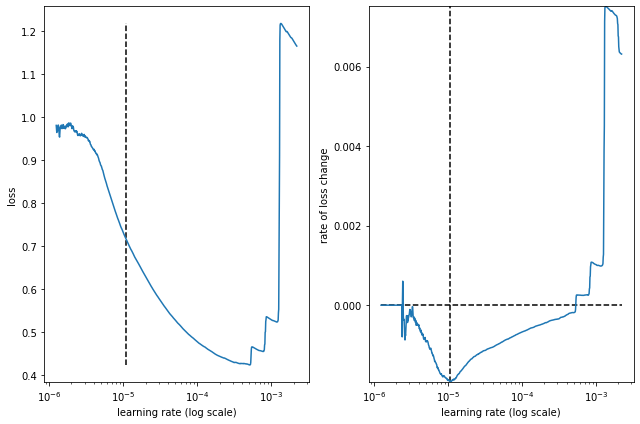

best lr: 1.0791544e-05 

Model: "conv2d_dense_141l_48s_16bs_1022fm_31f_2ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_100 (Reshape)        (None, 141, 10, 1)        0         
_________________________________________________________________
conv2d_53 (Conv2D)           (None, 141, 10, 31)       93        
_________________________________________________________________
flatten_48 (Flatten)         (None, 43710)             0         
_________________________________________________________________
dense_130 (Dense)            (None, 1022)              44672642  
_________________________________________________________________
dense_131 (Dense)            (None, 511)               522753    
_________________________________________________________________
dense_132 (Dense)            (None, 48)                24576     
_________________________________________________________________


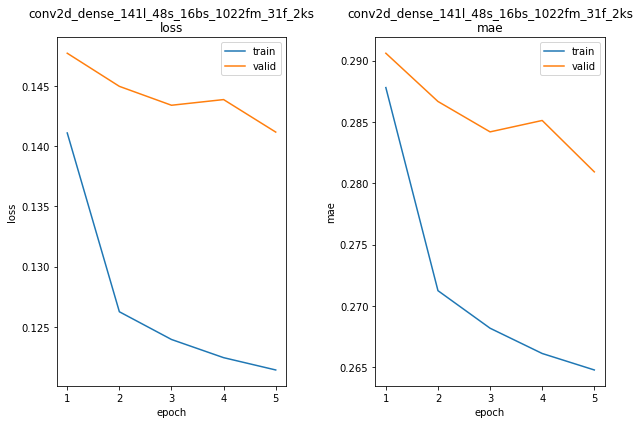

conv2d_dense_141l_48s_16bs_1022fm_31f_2ks train min loss: 0.121411	mae: 0.264785	epoch: 5
conv2d_dense_141l_48s_16bs_1022fm_31f_2ks valid min loss: 0.141174	mae: 0.280928	epoch: 5

conv2d_dense_141l_48s_16bs_1022fm_31f_2ks
WARN: bad model conv2d_dense_141l_48s_16bs_1022fm_31f_2ks
mse: 0.1411735564470291

Iteration No: 12 ended. Evaluation done at random point.
Time taken: 418.3415
Function value obtained: 0.1412
Current minimum: 0.1305
Iteration No: 13 started. Searching for the next optimal point.
feat_maps: 263
lags: 48
filters: 64
kern_size: 7
Epoch 1/5
11758/11758 [==============================] - 11s 832us/step - loss: 2.2358 - mae: 0.5962


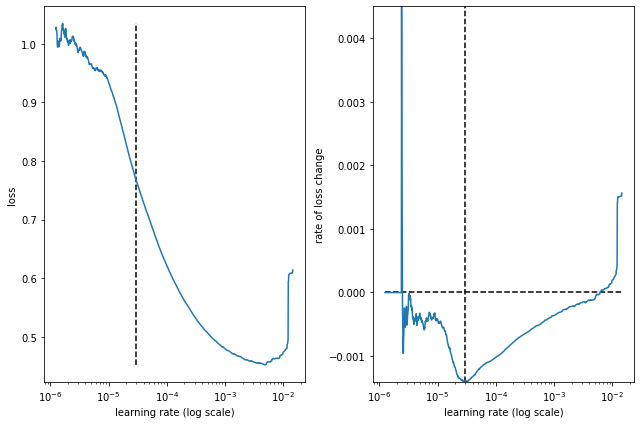

best lr: 2.9821982e-05 

Model: "conv2d_dense_48l_48s_16bs_263fm_64f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_102 (Reshape)        (None, 48, 10, 1)         0         
_________________________________________________________________
conv2d_54 (Conv2D)           (None, 48, 10, 64)        512       
_________________________________________________________________
flatten_49 (Flatten)         (None, 30720)             0         
_________________________________________________________________
dense_133 (Dense)            (None, 263)               8079623   
_________________________________________________________________
dense_134 (Dense)            (None, 131)               34584     
_________________________________________________________________
dense_135 (Dense)            (None, 48)                6336      
_________________________________________________________________
re

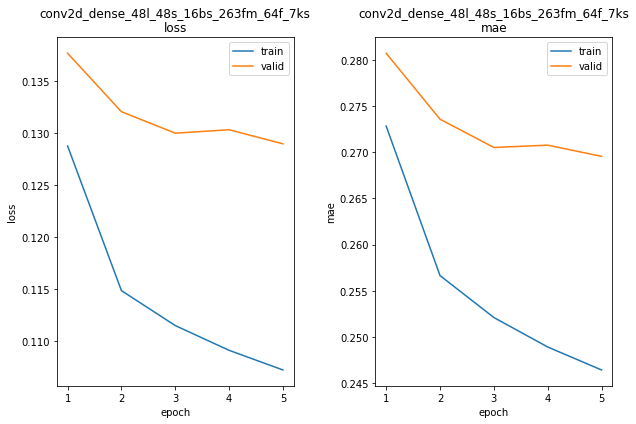

conv2d_dense_48l_48s_16bs_263fm_64f_7ks train min loss: 0.107264	mae: 0.246431	epoch: 5
conv2d_dense_48l_48s_16bs_263fm_64f_7ks valid min loss: 0.128965	mae: 0.269563	epoch: 5

conv2d_dense_48l_48s_16bs_263fm_64f_7ks
WARN: bad model conv2d_dense_48l_48s_16bs_263fm_64f_7ks
mse: 0.12896452844142914

Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 391.2575
Function value obtained: 0.1290
Current minimum: 0.1290
Iteration No: 14 started. Searching for the next optimal point.
feat_maps: 387
lags: 49
filters: 28
kern_size: 2
Epoch 1/5
11758/11758 [==============================] - 10s 821us/step - loss: 5.9459 - mae: 0.6370


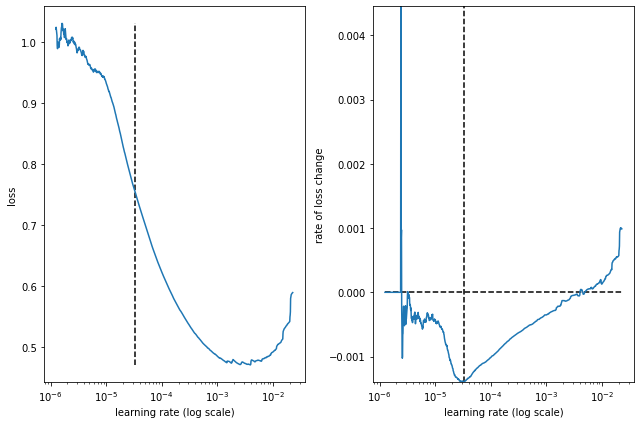

best lr: 3.2843414e-05 

Model: "conv2d_dense_49l_48s_16bs_387fm_28f_2ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_104 (Reshape)        (None, 49, 10, 1)         0         
_________________________________________________________________
conv2d_55 (Conv2D)           (None, 49, 10, 28)        84        
_________________________________________________________________
flatten_50 (Flatten)         (None, 13720)             0         
_________________________________________________________________
dense_136 (Dense)            (None, 387)               5310027   
_________________________________________________________________
dense_137 (Dense)            (None, 193)               74884     
_________________________________________________________________
dense_138 (Dense)            (None, 48)                9312      
_________________________________________________________________
re

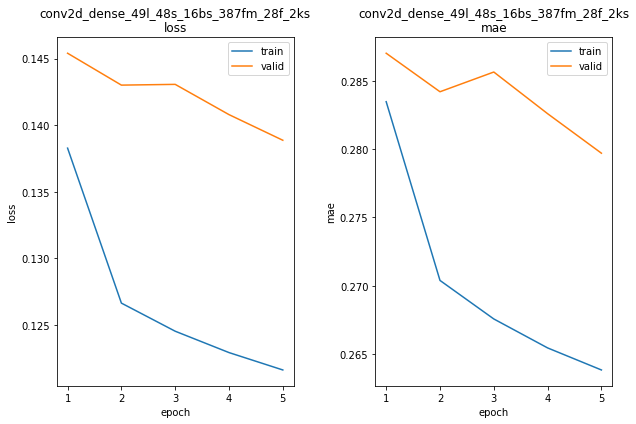

conv2d_dense_49l_48s_16bs_387fm_28f_2ks train min loss: 0.121618	mae: 0.263838	epoch: 5
conv2d_dense_49l_48s_16bs_387fm_28f_2ks valid min loss: 0.138868	mae: 0.279698	epoch: 5

conv2d_dense_49l_48s_16bs_387fm_28f_2ks
WARN: bad model conv2d_dense_49l_48s_16bs_387fm_28f_2ks
mse: 0.13886752724647522

Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 362.5011
Function value obtained: 0.1389
Current minimum: 0.1290
Iteration No: 15 started. Searching for the next optimal point.
feat_maps: 933
lags: 50
filters: 60
kern_size: 7
Epoch 1/5
11758/11758 [==============================] - 15s 1ms/step - loss: 3.8465 - mae: 0.6018


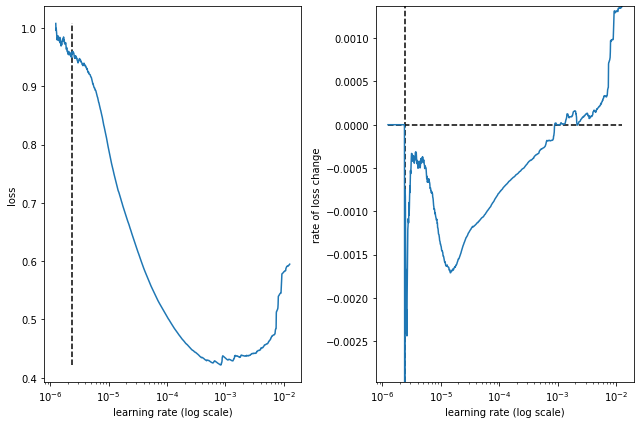

best lr: 2.4044584e-06 

Model: "conv2d_dense_50l_48s_16bs_933fm_60f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_106 (Reshape)        (None, 50, 10, 1)         0         
_________________________________________________________________
conv2d_56 (Conv2D)           (None, 50, 10, 60)        480       
_________________________________________________________________
flatten_51 (Flatten)         (None, 30000)             0         
_________________________________________________________________
dense_139 (Dense)            (None, 933)               27990933  
_________________________________________________________________
dense_140 (Dense)            (None, 466)               435244    
_________________________________________________________________
dense_141 (Dense)            (None, 48)                22416     
_________________________________________________________________
re

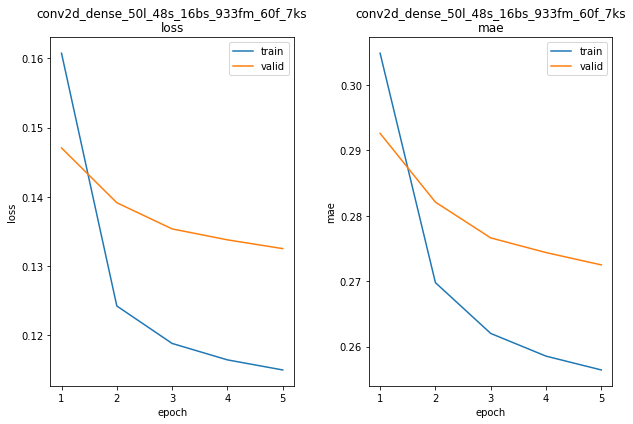

conv2d_dense_50l_48s_16bs_933fm_60f_7ks train min loss: 0.115000	mae: 0.256435	epoch: 5
conv2d_dense_50l_48s_16bs_933fm_60f_7ks valid min loss: 0.132518	mae: 0.272496	epoch: 5

conv2d_dense_50l_48s_16bs_933fm_60f_7ks
mse: 0.13251782953739166

Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 377.4673
Function value obtained: 0.1325
Current minimum: 0.1290
Iteration No: 16 started. Searching for the next optimal point.
feat_maps: 1000
lags: 52
filters: 24
kern_size: 7
Epoch 1/5
11757/11757 [==============================] - 12s 917us/step - loss: 16.3833 - mae: 0.6507


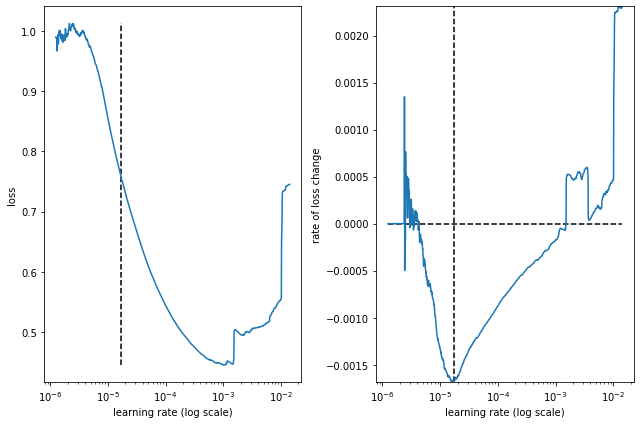

best lr: 1.7013364e-05 

Model: "conv2d_dense_52l_48s_16bs_1000fm_24f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_108 (Reshape)        (None, 52, 10, 1)         0         
_________________________________________________________________
conv2d_57 (Conv2D)           (None, 52, 10, 24)        192       
_________________________________________________________________
flatten_52 (Flatten)         (None, 12480)             0         
_________________________________________________________________
dense_142 (Dense)            (None, 1000)              12481000  
_________________________________________________________________
dense_143 (Dense)            (None, 500)               500500    
_________________________________________________________________
dense_144 (Dense)            (None, 48)                24048     
_________________________________________________________________
r

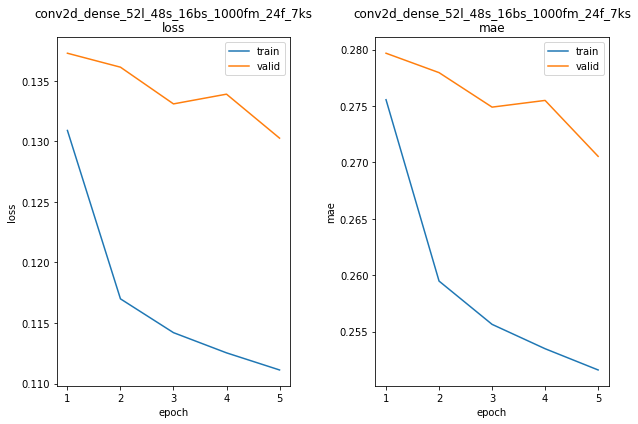

conv2d_dense_52l_48s_16bs_1000fm_24f_7ks train min loss: 0.111127	mae: 0.251591	epoch: 5
conv2d_dense_52l_48s_16bs_1000fm_24f_7ks valid min loss: 0.130262	mae: 0.270537	epoch: 5

conv2d_dense_52l_48s_16bs_1000fm_24f_7ks
WARN: bad model conv2d_dense_52l_48s_16bs_1000fm_24f_7ks
mse: 0.13026176393032074

Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 348.0325
Function value obtained: 0.1303
Current minimum: 0.1290
Iteration No: 17 started. Searching for the next optimal point.
feat_maps: 994
lags: 140
filters: 64
kern_size: 7
Epoch 1/5
11752/11752 [==============================] - 29s 2ms/step - loss: 1.6465 - mae: 0.6103


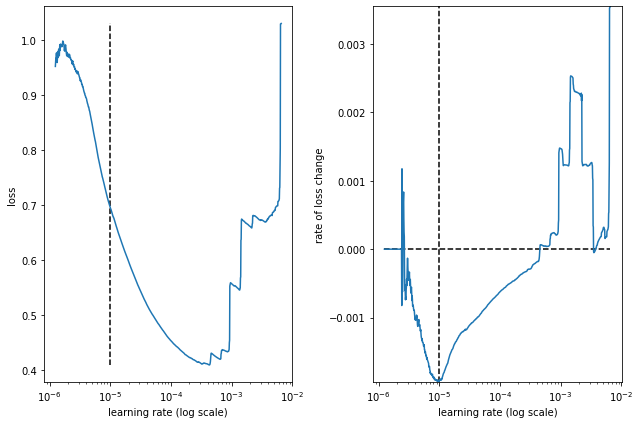

best lr: 9.798289e-06 

Model: "conv2d_dense_140l_48s_16bs_994fm_64f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_110 (Reshape)        (None, 140, 10, 1)        0         
_________________________________________________________________
conv2d_58 (Conv2D)           (None, 140, 10, 64)       512       
_________________________________________________________________
flatten_53 (Flatten)         (None, 89600)             0         
_________________________________________________________________
dense_145 (Dense)            (None, 994)               89063394  
_________________________________________________________________
dense_146 (Dense)            (None, 497)               494515    
_________________________________________________________________
dense_147 (Dense)            (None, 48)                23904     
_________________________________________________________________
re

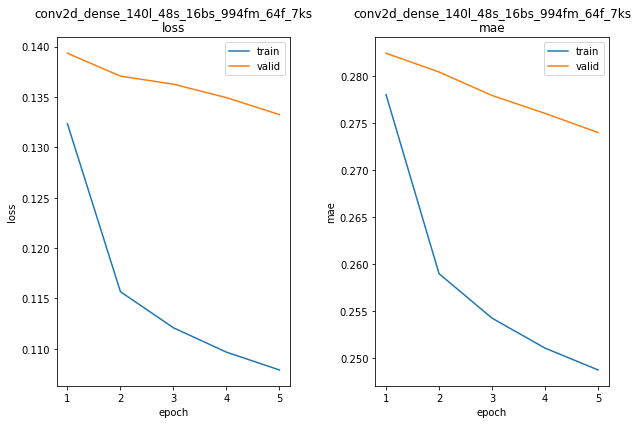

conv2d_dense_140l_48s_16bs_994fm_64f_7ks train min loss: 0.107897	mae: 0.248722	epoch: 5
conv2d_dense_140l_48s_16bs_994fm_64f_7ks valid min loss: 0.133254	mae: 0.273987	epoch: 5

conv2d_dense_140l_48s_16bs_994fm_64f_7ks
WARN: bad model conv2d_dense_140l_48s_16bs_994fm_64f_7ks
mse: 0.13325372338294983

Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 818.3047
Function value obtained: 0.1333
Current minimum: 0.1290
Iteration No: 18 started. Searching for the next optimal point.
feat_maps: 975
lags: 49
filters: 64
kern_size: 7
Epoch 1/5
11758/11758 [==============================] - 16s 1ms/step - loss: 10.1763 - mae: 0.6089


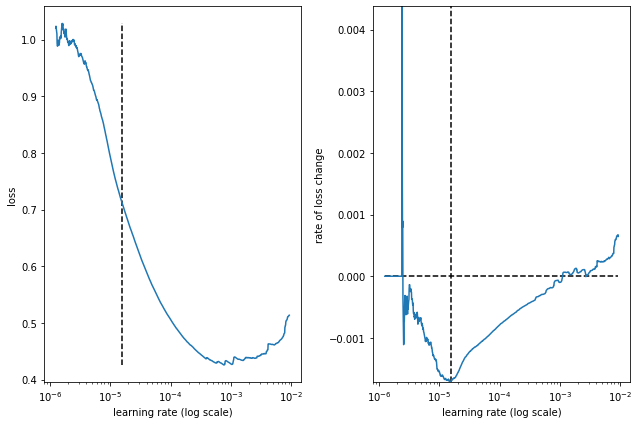

best lr: 1.5444486e-05 

Model: "conv2d_dense_49l_48s_16bs_975fm_64f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_112 (Reshape)        (None, 49, 10, 1)         0         
_________________________________________________________________
conv2d_59 (Conv2D)           (None, 49, 10, 64)        512       
_________________________________________________________________
flatten_54 (Flatten)         (None, 31360)             0         
_________________________________________________________________
dense_148 (Dense)            (None, 975)               30576975  
_________________________________________________________________
dense_149 (Dense)            (None, 487)               475312    
_________________________________________________________________
dense_150 (Dense)            (None, 48)                23424     
_________________________________________________________________
re

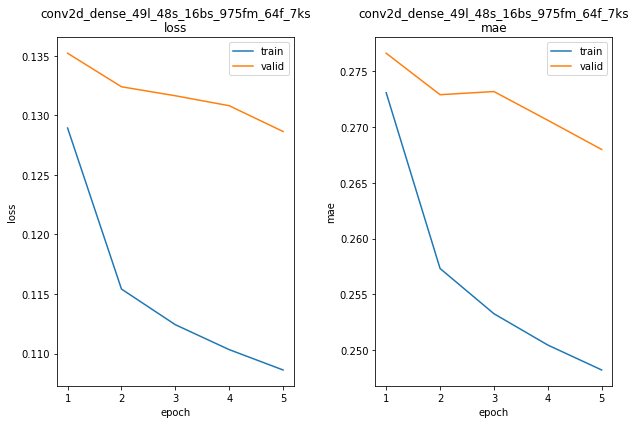

conv2d_dense_49l_48s_16bs_975fm_64f_7ks train min loss: 0.108627	mae: 0.248221	epoch: 5
conv2d_dense_49l_48s_16bs_975fm_64f_7ks valid min loss: 0.128642	mae: 0.268001	epoch: 5

conv2d_dense_49l_48s_16bs_975fm_64f_7ks
WARN: bad model conv2d_dense_49l_48s_16bs_975fm_64f_7ks
mse: 0.12864212691783905

Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 391.7195
Function value obtained: 0.1286
Current minimum: 0.1286
Iteration No: 19 started. Searching for the next optimal point.
feat_maps: 291
lags: 48
filters: 61
kern_size: 7
Epoch 1/5
11758/11758 [==============================] - 11s 839us/step - loss: 2.0706 - mae: 0.5656


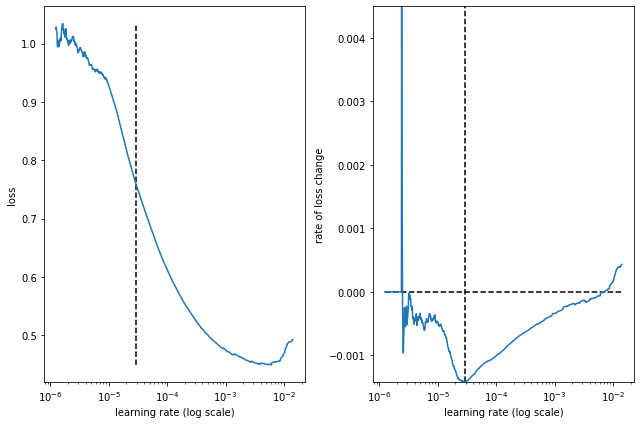

best lr: 2.9303274e-05 

Model: "conv2d_dense_48l_48s_16bs_291fm_61f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_114 (Reshape)        (None, 48, 10, 1)         0         
_________________________________________________________________
conv2d_60 (Conv2D)           (None, 48, 10, 61)        488       
_________________________________________________________________
flatten_55 (Flatten)         (None, 29280)             0         
_________________________________________________________________
dense_151 (Dense)            (None, 291)               8520771   
_________________________________________________________________
dense_152 (Dense)            (None, 145)               42340     
_________________________________________________________________
dense_153 (Dense)            (None, 48)                7008      
_________________________________________________________________
re

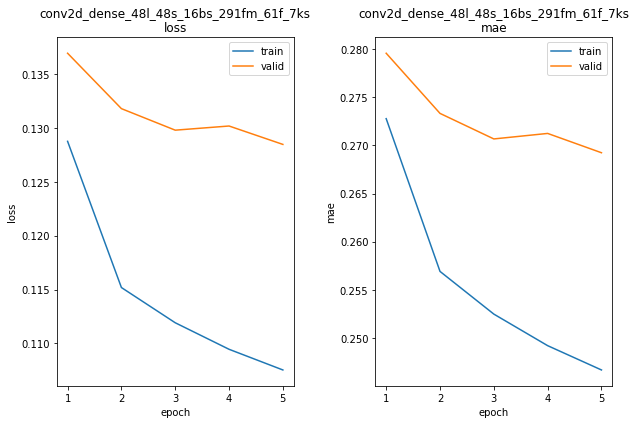

conv2d_dense_48l_48s_16bs_291fm_61f_7ks train min loss: 0.107533	mae: 0.246659	epoch: 5
conv2d_dense_48l_48s_16bs_291fm_61f_7ks valid min loss: 0.128469	mae: 0.269237	epoch: 5

conv2d_dense_48l_48s_16bs_291fm_61f_7ks
WARN: bad model conv2d_dense_48l_48s_16bs_291fm_61f_7ks
mse: 0.12846891582012177

Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 361.0785
Function value obtained: 0.1285
Current minimum: 0.1285
Iteration No: 20 started. Searching for the next optimal point.
feat_maps: 262
lags: 53
filters: 24
kern_size: 7
Epoch 1/5
11757/11757 [==============================] - 11s 874us/step - loss: 2.3392 - mae: 0.6154


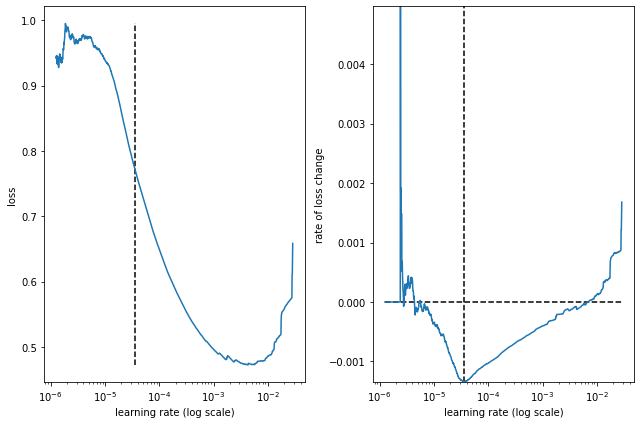

best lr: 3.5865956e-05 

Model: "conv2d_dense_53l_48s_16bs_262fm_24f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_116 (Reshape)        (None, 53, 10, 1)         0         
_________________________________________________________________
conv2d_61 (Conv2D)           (None, 53, 10, 24)        192       
_________________________________________________________________
flatten_56 (Flatten)         (None, 12720)             0         
_________________________________________________________________
dense_154 (Dense)            (None, 262)               3332902   
_________________________________________________________________
dense_155 (Dense)            (None, 131)               34453     
_________________________________________________________________
dense_156 (Dense)            (None, 48)                6336      
_________________________________________________________________
re

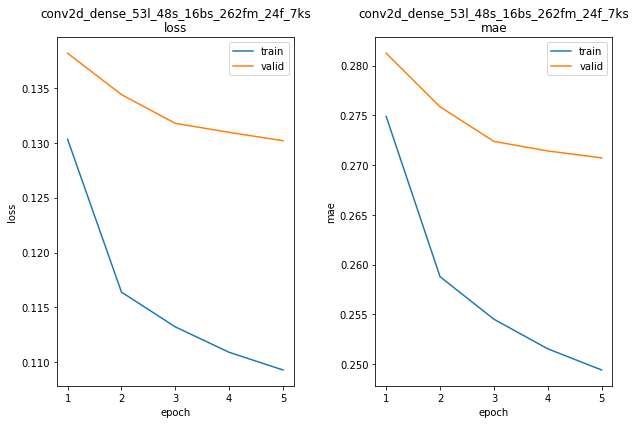

conv2d_dense_53l_48s_16bs_262fm_24f_7ks train min loss: 0.109295	mae: 0.249399	epoch: 5
conv2d_dense_53l_48s_16bs_262fm_24f_7ks valid min loss: 0.130189	mae: 0.270719	epoch: 5

conv2d_dense_53l_48s_16bs_262fm_24f_7ks
WARN: bad model conv2d_dense_53l_48s_16bs_262fm_24f_7ks
mse: 0.13018859922885895

Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 339.3353
Function value obtained: 0.1302
Current minimum: 0.1285
Iteration No: 21 started. Searching for the next optimal point.
feat_maps: 974
lags: 143
filters: 26
kern_size: 7
Epoch 1/5
11752/11752 [==============================] - 14s 1ms/step - loss: 11.8090 - mae: 0.6733


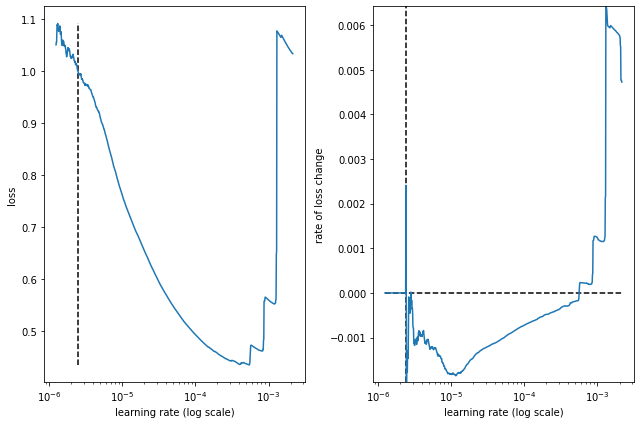

best lr: 2.4481383e-06 

Model: "conv2d_dense_143l_48s_16bs_974fm_26f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_118 (Reshape)        (None, 143, 10, 1)        0         
_________________________________________________________________
conv2d_62 (Conv2D)           (None, 143, 10, 26)       208       
_________________________________________________________________
flatten_57 (Flatten)         (None, 37180)             0         
_________________________________________________________________
dense_157 (Dense)            (None, 974)               36214294  
_________________________________________________________________
dense_158 (Dense)            (None, 487)               474825    
_________________________________________________________________
dense_159 (Dense)            (None, 48)                23424     
_________________________________________________________________
r

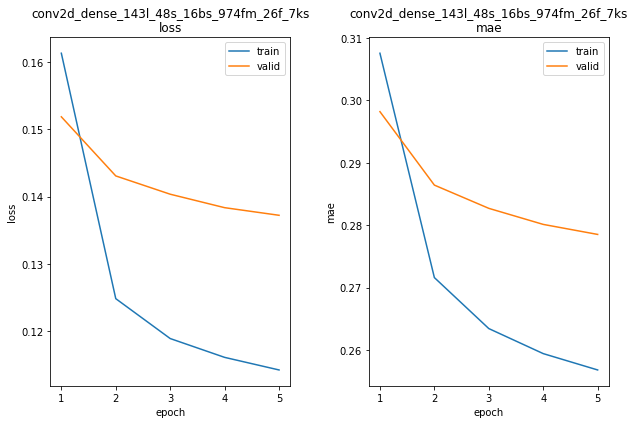

conv2d_dense_143l_48s_16bs_974fm_26f_7ks train min loss: 0.114226	mae: 0.256787	epoch: 5
conv2d_dense_143l_48s_16bs_974fm_26f_7ks valid min loss: 0.137217	mae: 0.278519	epoch: 5

conv2d_dense_143l_48s_16bs_974fm_26f_7ks
mse: 0.137216717004776

Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 414.3828
Function value obtained: 0.1372
Current minimum: 0.1285
Iteration No: 22 started. Searching for the next optimal point.
feat_maps: 802
lags: 50
filters: 64
kern_size: 2
Epoch 1/5
11758/11758 [==============================] - 15s 1ms/step - loss: 1.9215 - mae: 0.6058


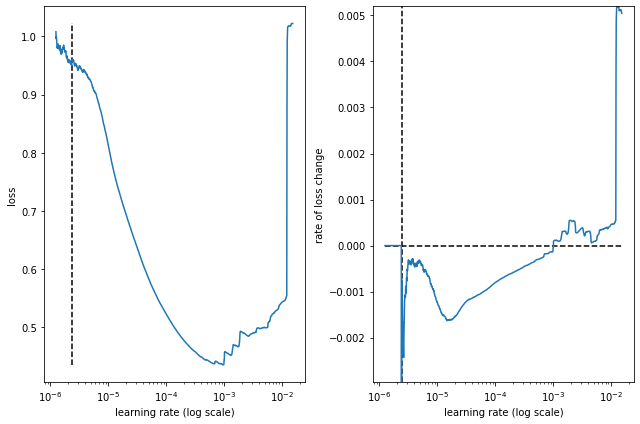

best lr: 2.4044584e-06 

Model: "conv2d_dense_50l_48s_16bs_802fm_64f_2ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_120 (Reshape)        (None, 50, 10, 1)         0         
_________________________________________________________________
conv2d_63 (Conv2D)           (None, 50, 10, 64)        192       
_________________________________________________________________
flatten_58 (Flatten)         (None, 32000)             0         
_________________________________________________________________
dense_160 (Dense)            (None, 802)               25664802  
_________________________________________________________________
dense_161 (Dense)            (None, 401)               322003    
_________________________________________________________________
dense_162 (Dense)            (None, 48)                19296     
_________________________________________________________________
re

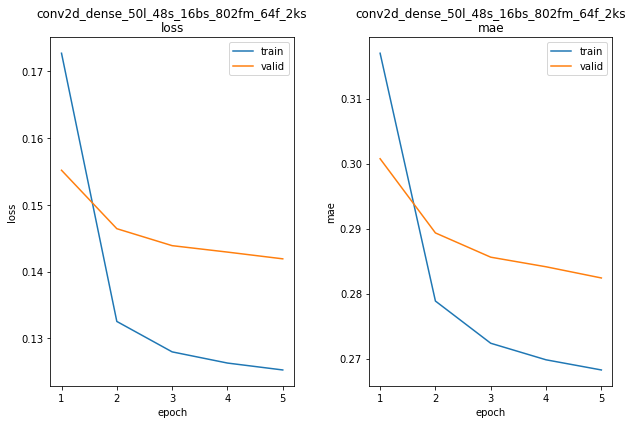

conv2d_dense_50l_48s_16bs_802fm_64f_2ks train min loss: 0.125275	mae: 0.268237	epoch: 5
conv2d_dense_50l_48s_16bs_802fm_64f_2ks valid min loss: 0.141919	mae: 0.282395	epoch: 5

conv2d_dense_50l_48s_16bs_802fm_64f_2ks
mse: 0.14191889762878418

Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 350.4399
Function value obtained: 0.1419
Current minimum: 0.1285
Iteration No: 23 started. Searching for the next optimal point.
feat_maps: 958
lags: 49
filters: 26
kern_size: 7
Epoch 1/5
11758/11758 [==============================] - 12s 965us/step - loss: 13.4715 - mae: 0.7002


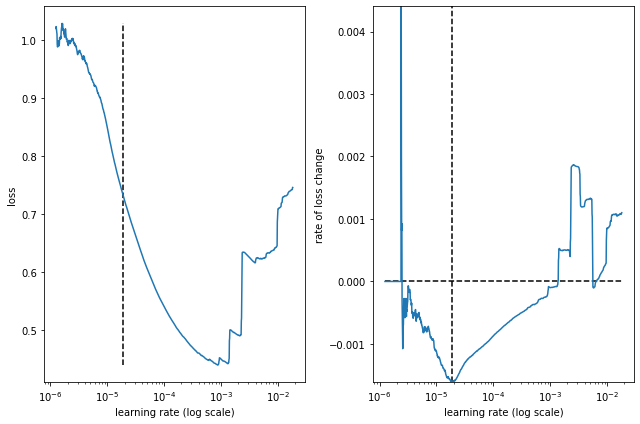

best lr: 1.8568944e-05 

Model: "conv2d_dense_49l_48s_16bs_958fm_26f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_122 (Reshape)        (None, 49, 10, 1)         0         
_________________________________________________________________
conv2d_64 (Conv2D)           (None, 49, 10, 26)        208       
_________________________________________________________________
flatten_59 (Flatten)         (None, 12740)             0         
_________________________________________________________________
dense_163 (Dense)            (None, 958)               12205878  
_________________________________________________________________
dense_164 (Dense)            (None, 479)               459361    
_________________________________________________________________
dense_165 (Dense)            (None, 48)                23040     
_________________________________________________________________
re

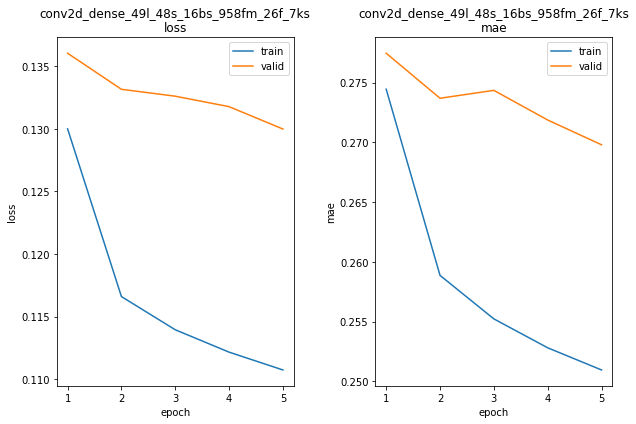

conv2d_dense_49l_48s_16bs_958fm_26f_7ks train min loss: 0.110736	mae: 0.250947	epoch: 5
conv2d_dense_49l_48s_16bs_958fm_26f_7ks valid min loss: 0.129977	mae: 0.269793	epoch: 5

conv2d_dense_49l_48s_16bs_958fm_26f_7ks
WARN: bad model conv2d_dense_49l_48s_16bs_958fm_26f_7ks
mse: 0.12997686862945557

Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 372.6938
Function value obtained: 0.1300
Current minimum: 0.1285
Iteration No: 24 started. Searching for the next optimal point.
feat_maps: 259
lags: 140
filters: 62
kern_size: 7
Epoch 1/5
11752/11752 [==============================] - 14s 1ms/step - loss: 4.8272 - mae: 0.6107


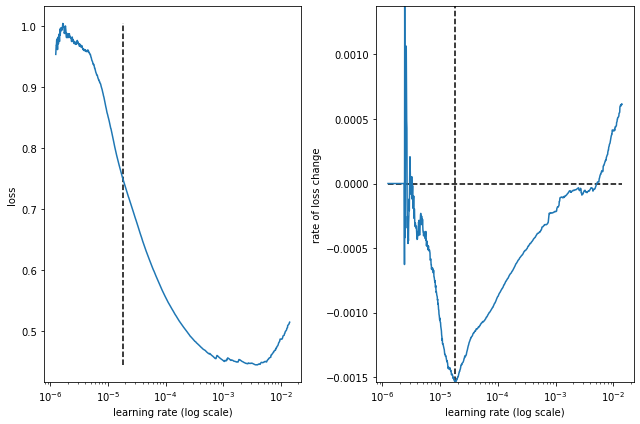

best lr: 1.795504e-05 

Model: "conv2d_dense_140l_48s_16bs_259fm_62f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_124 (Reshape)        (None, 140, 10, 1)        0         
_________________________________________________________________
conv2d_65 (Conv2D)           (None, 140, 10, 62)       496       
_________________________________________________________________
flatten_60 (Flatten)         (None, 86800)             0         
_________________________________________________________________
dense_166 (Dense)            (None, 259)               22481459  
_________________________________________________________________
dense_167 (Dense)            (None, 129)               33540     
_________________________________________________________________
dense_168 (Dense)            (None, 48)                6240      
_________________________________________________________________
re

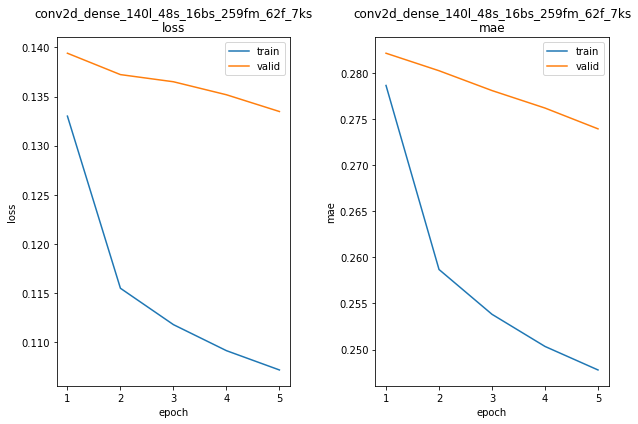

conv2d_dense_140l_48s_16bs_259fm_62f_7ks train min loss: 0.107161	mae: 0.247794	epoch: 5
conv2d_dense_140l_48s_16bs_259fm_62f_7ks valid min loss: 0.133478	mae: 0.273928	epoch: 5

conv2d_dense_140l_48s_16bs_259fm_62f_7ks
WARN: bad model conv2d_dense_140l_48s_16bs_259fm_62f_7ks
mse: 0.13347788155078888

Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 381.4152
Function value obtained: 0.1335
Current minimum: 0.1285
Iteration No: 25 started. Searching for the next optimal point.
feat_maps: 974
lags: 49
filters: 63
kern_size: 7
Epoch 1/5
11758/11758 [==============================] - 16s 1ms/step - loss: 1.8982 - mae: 0.6143


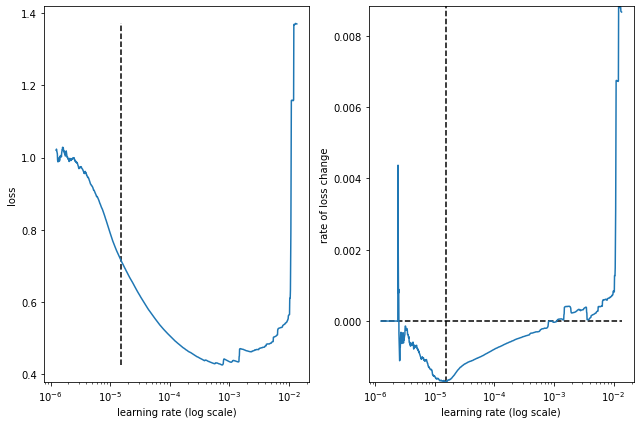

best lr: 1.5444486e-05 

Model: "conv2d_dense_49l_48s_16bs_974fm_63f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_126 (Reshape)        (None, 49, 10, 1)         0         
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 49, 10, 63)        504       
_________________________________________________________________
flatten_61 (Flatten)         (None, 30870)             0         
_________________________________________________________________
dense_169 (Dense)            (None, 974)               30068354  
_________________________________________________________________
dense_170 (Dense)            (None, 487)               474825    
_________________________________________________________________
dense_171 (Dense)            (None, 48)                23424     
_________________________________________________________________
re

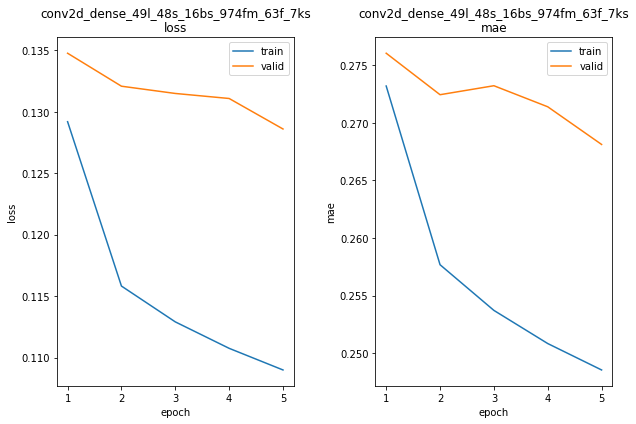

conv2d_dense_49l_48s_16bs_974fm_63f_7ks train min loss: 0.108991	mae: 0.248535	epoch: 5
conv2d_dense_49l_48s_16bs_974fm_63f_7ks valid min loss: 0.128603	mae: 0.268122	epoch: 5

conv2d_dense_49l_48s_16bs_974fm_63f_7ks
WARN: bad model conv2d_dense_49l_48s_16bs_974fm_63f_7ks
mse: 0.1286030113697052

Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 369.1979
Function value obtained: 0.1286
Current minimum: 0.1285
Iteration No: 26 started. Searching for the next optimal point.
feat_maps: 284
lags: 50
filters: 26
kern_size: 7
Epoch 1/5
11758/11758 [==============================] - 10s 821us/step - loss: 4.9499 - mae: 0.6274


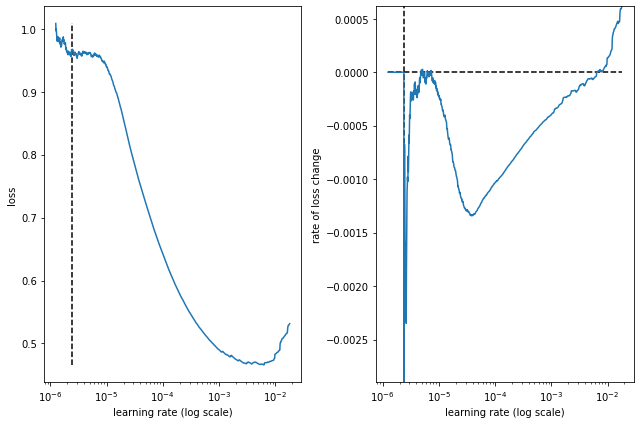

best lr: 2.4044584e-06 

Model: "conv2d_dense_50l_48s_16bs_284fm_26f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_128 (Reshape)        (None, 50, 10, 1)         0         
_________________________________________________________________
conv2d_67 (Conv2D)           (None, 50, 10, 26)        208       
_________________________________________________________________
flatten_62 (Flatten)         (None, 13000)             0         
_________________________________________________________________
dense_172 (Dense)            (None, 284)               3692284   
_________________________________________________________________
dense_173 (Dense)            (None, 142)               40470     
_________________________________________________________________
dense_174 (Dense)            (None, 48)                6864      
_________________________________________________________________
re

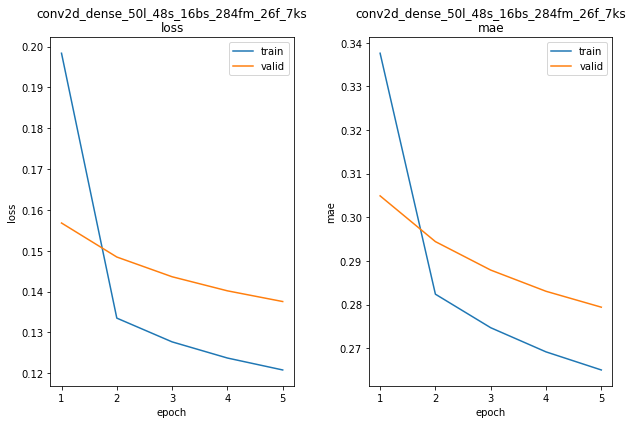

conv2d_dense_50l_48s_16bs_284fm_26f_7ks train min loss: 0.120806	mae: 0.265002	epoch: 5
conv2d_dense_50l_48s_16bs_284fm_26f_7ks valid min loss: 0.137562	mae: 0.279390	epoch: 5

conv2d_dense_50l_48s_16bs_284fm_26f_7ks
mse: 0.13756176829338074

Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 391.3032
Function value obtained: 0.1376
Current minimum: 0.1285
Iteration No: 27 started. Searching for the next optimal point.
feat_maps: 992
lags: 143
filters: 62
kern_size: 7
Epoch 1/5
11752/11752 [==============================] - 30s 2ms/step - loss: 6.6418 - mae: 0.6814


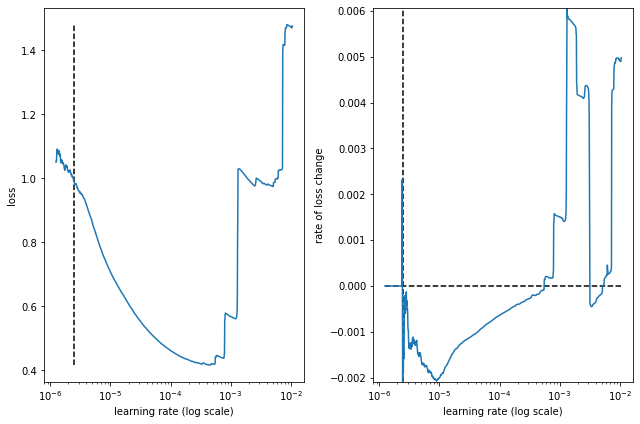

best lr: 2.4481383e-06 

Model: "conv2d_dense_143l_48s_16bs_992fm_62f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_130 (Reshape)        (None, 143, 10, 1)        0         
_________________________________________________________________
conv2d_68 (Conv2D)           (None, 143, 10, 62)       496       
_________________________________________________________________
flatten_63 (Flatten)         (None, 88660)             0         
_________________________________________________________________
dense_175 (Dense)            (None, 992)               87951712  
_________________________________________________________________
dense_176 (Dense)            (None, 496)               492528    
_________________________________________________________________
dense_177 (Dense)            (None, 48)                23856     
_________________________________________________________________
r

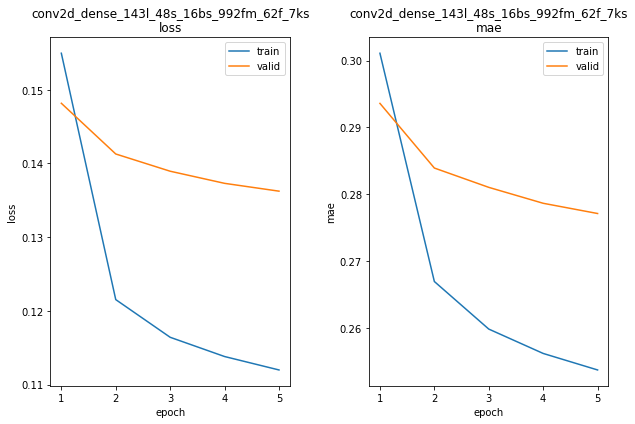

conv2d_dense_143l_48s_16bs_992fm_62f_7ks train min loss: 0.111976	mae: 0.253748	epoch: 5
conv2d_dense_143l_48s_16bs_992fm_62f_7ks valid min loss: 0.136240	mae: 0.277136	epoch: 5

conv2d_dense_143l_48s_16bs_992fm_62f_7ks
mse: 0.13624009490013123

Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 722.0819
Function value obtained: 0.1362
Current minimum: 0.1285
Iteration No: 28 started. Searching for the next optimal point.
feat_maps: 335
lags: 49
filters: 63
kern_size: 7
Epoch 1/5
11758/11758 [==============================] - 12s 958us/step - loss: 9.8120 - mae: 0.6363


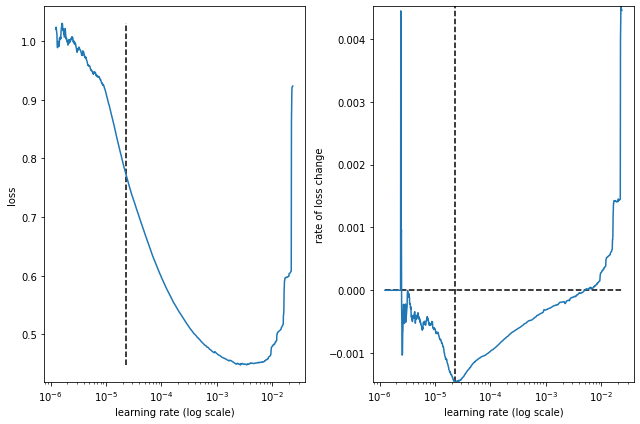

best lr: 2.3122859e-05 

Model: "conv2d_dense_49l_48s_16bs_335fm_63f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_132 (Reshape)        (None, 49, 10, 1)         0         
_________________________________________________________________
conv2d_69 (Conv2D)           (None, 49, 10, 63)        504       
_________________________________________________________________
flatten_64 (Flatten)         (None, 30870)             0         
_________________________________________________________________
dense_178 (Dense)            (None, 335)               10341785  
_________________________________________________________________
dense_179 (Dense)            (None, 167)               56112     
_________________________________________________________________
dense_180 (Dense)            (None, 48)                8064      
_________________________________________________________________
re

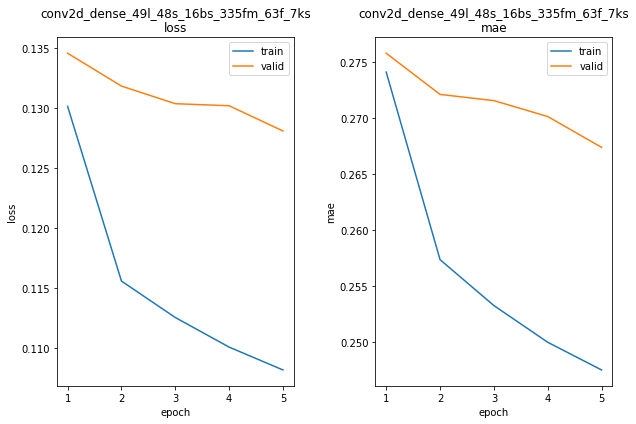

conv2d_dense_49l_48s_16bs_335fm_63f_7ks train min loss: 0.108181	mae: 0.247484	epoch: 5
conv2d_dense_49l_48s_16bs_335fm_63f_7ks valid min loss: 0.128076	mae: 0.267373	epoch: 5

conv2d_dense_49l_48s_16bs_335fm_63f_7ks
WARN: bad model conv2d_dense_49l_48s_16bs_335fm_63f_7ks
mse: 0.12807565927505493

Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 401.3814
Function value obtained: 0.1281
Current minimum: 0.1281
Iteration No: 29 started. Searching for the next optimal point.
feat_maps: 1015
lags: 49
filters: 62
kern_size: 7
Epoch 1/5
11758/11758 [==============================] - 16s 1ms/step - loss: 5.9344 - mae: 0.6191


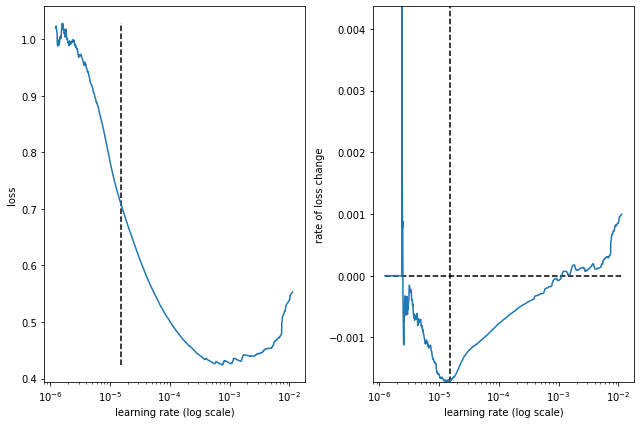

best lr: 1.5043295e-05 

Model: "conv2d_dense_49l_48s_16bs_1015fm_62f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_134 (Reshape)        (None, 49, 10, 1)         0         
_________________________________________________________________
conv2d_70 (Conv2D)           (None, 49, 10, 62)        496       
_________________________________________________________________
flatten_65 (Flatten)         (None, 30380)             0         
_________________________________________________________________
dense_181 (Dense)            (None, 1015)              30836715  
_________________________________________________________________
dense_182 (Dense)            (None, 507)               515112    
_________________________________________________________________
dense_183 (Dense)            (None, 48)                24384     
_________________________________________________________________
r

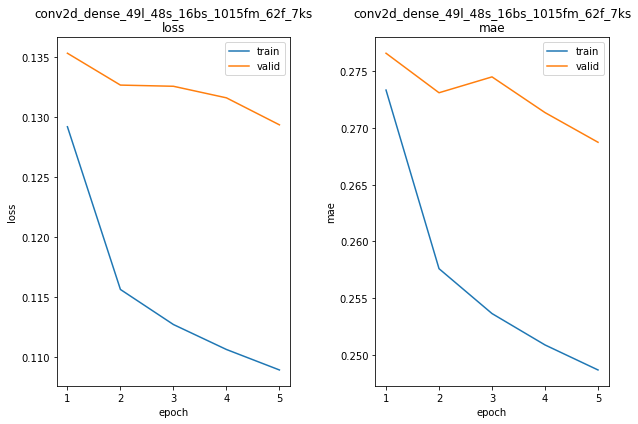

conv2d_dense_49l_48s_16bs_1015fm_62f_7ks train min loss: 0.108915	mae: 0.248662	epoch: 5
conv2d_dense_49l_48s_16bs_1015fm_62f_7ks valid min loss: 0.129368	mae: 0.268754	epoch: 5

conv2d_dense_49l_48s_16bs_1015fm_62f_7ks
WARN: bad model conv2d_dense_49l_48s_16bs_1015fm_62f_7ks
mse: 0.12936803698539734

Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 376.0171
Function value obtained: 0.1294
Current minimum: 0.1281
Iteration No: 30 started. Searching for the next optimal point.
feat_maps: 996
lags: 52
filters: 25
kern_size: 7
Epoch 1/5
11757/11757 [==============================] - 12s 972us/step - loss: 3.6091 - mae: 0.6227


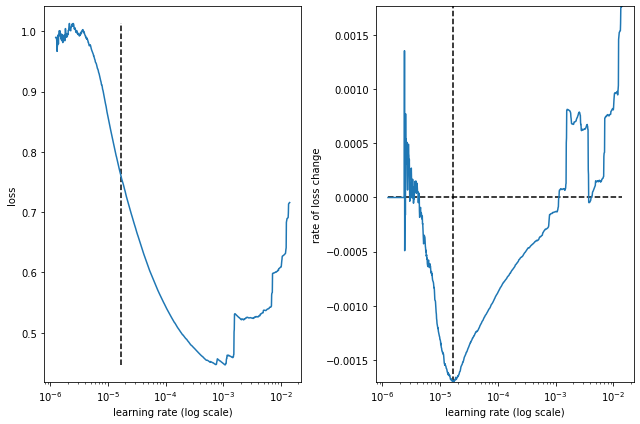

best lr: 1.6864742e-05 

Model: "conv2d_dense_52l_48s_16bs_996fm_25f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_136 (Reshape)        (None, 52, 10, 1)         0         
_________________________________________________________________
conv2d_71 (Conv2D)           (None, 52, 10, 25)        200       
_________________________________________________________________
flatten_66 (Flatten)         (None, 13000)             0         
_________________________________________________________________
dense_184 (Dense)            (None, 996)               12948996  
_________________________________________________________________
dense_185 (Dense)            (None, 498)               496506    
_________________________________________________________________
dense_186 (Dense)            (None, 48)                23952     
_________________________________________________________________
re

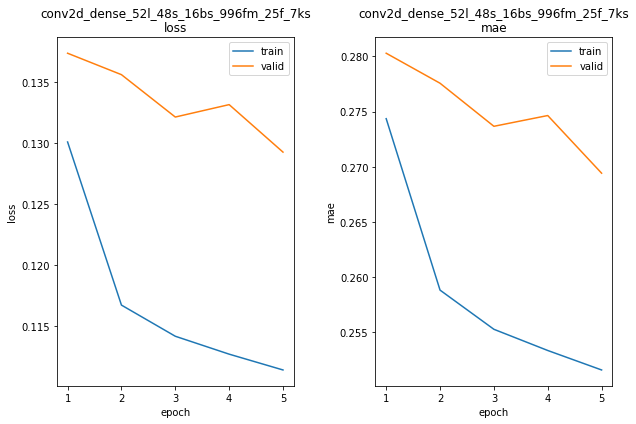

conv2d_dense_52l_48s_16bs_996fm_25f_7ks train min loss: 0.111375	mae: 0.251572	epoch: 5
conv2d_dense_52l_48s_16bs_996fm_25f_7ks valid min loss: 0.129248	mae: 0.269416	epoch: 5

conv2d_dense_52l_48s_16bs_996fm_25f_7ks
WARN: bad model conv2d_dense_52l_48s_16bs_996fm_25f_7ks
mse: 0.12924794852733612

Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 300.2848
Function value obtained: 0.1292
Current minimum: 0.1281
[335, 49, 63, 7]
0.12807565927505493


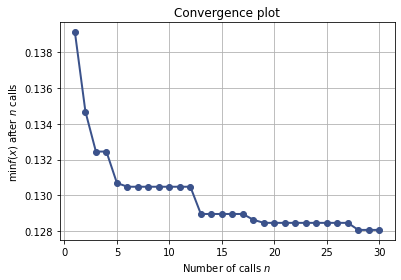

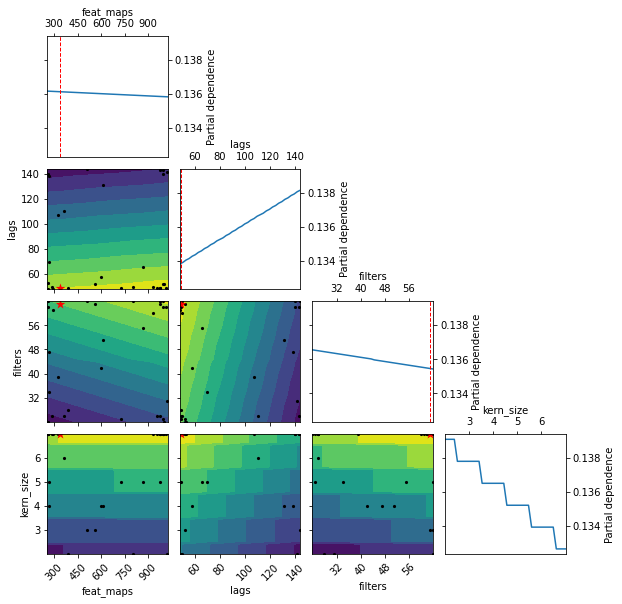

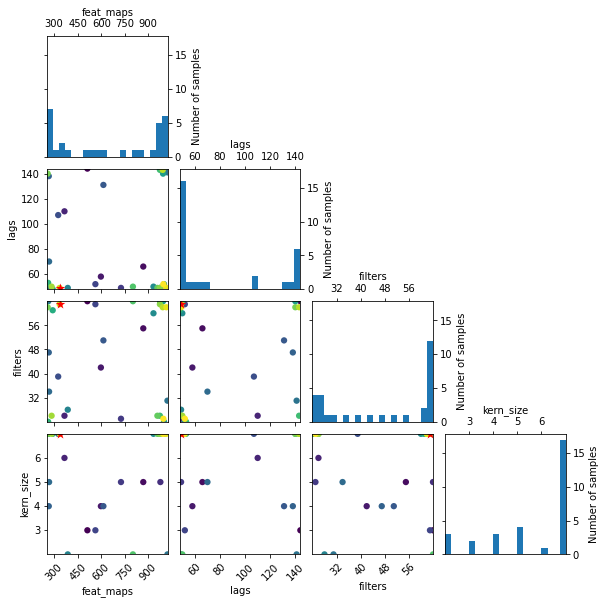

In [ ]:
%%time


dim_feat_maps = Integer(low = 256, high = 1024, name = 'feat_maps')
dim_lags      = Integer(low =  48, high =  144, name = 'lags')
dim_filters   = Integer(low =  24, high =   64, name = 'filters')
dim_kern_size = Integer(low =   2, high =    7, name = 'kern_size')

bo_dims_cnn2d_dense_48s = [dim_feat_maps,
                           dim_lags,
                           dim_filters,
                           dim_kern_size]


@use_named_args(dimensions = bo_dims_cnn2d_dense_48s)
def model_fitness_cnn2d_dense_48s(**dims):
    params = {'xcols':        def_cols,
              'ycols':             'y',
              'lags':               48, 
              'steps_ahead':        48,
              'stride':             48, 
              'shuffle':          True,
              'bs':                 16,
              'model_type': 'conv2d_dense',
              'mix_type':         'ts',
              'mix_alpha':           4,
              'mix_factor':          0,
              'mix_diff':            1,
              'feat_maps':          32,
              'filters':            64,
              'kern_size':           3,
              'drop_out':          0.0,
              'kern_reg':          0.0,
              'recu_reg':          0.0,
              'epochs':              5,
              'lrf_params': [0.000001, 10, 32, 5, 100, 25]}
#             'lrf_params': [0.00009, 10, 32, 5, 100, 25]}
#             'lrf_params': [0.00001, 10, 32, 5, 100, 25]}
#              lrf_params = [0.0003,   10, 32, 5, 100, 25]  # 0.0003 too high
#             'lrf_params': [0.000005, 10, 32, 5, 100, 25]}
#             'lrf_params': [0.000001, 10, 32, 5, 100, 25]}

    return get_bo_mse(params, **dims)


bo_def_dims_cnn2d_dense_48s = [512, 144, 64, 3]
bo_results_id = 'cnn2d_dense_48s'

bo_search_results[bo_results_id] = run_bo_search(model_fitness_cnn2d_dense_48s, 
                                                 bo_dims_cnn2d_dense_48s, 
                                                 bo_def_dims_cnn2d_dense_48s, 
                                                 40)

Try again with activation='relu' in Dense nodes

Iteration No: 1 started. Evaluating function at provided point.
feat_maps: 256
lags: 48
filters: 64
kern_size: 7
Epoch 1/5
11758/11758 [==============================] - 10s 761us/step - loss: 2.6197 - mae: 0.6072


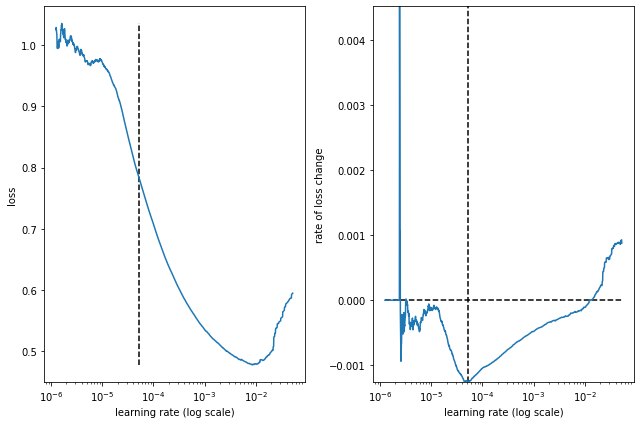

best lr: 5.274697e-05 

Model: "conv2d_dense_48l_48s_16bs_256fm_64f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_140 (Reshape)        (None, 48, 10, 1)         0         
_________________________________________________________________
conv2d_73 (Conv2D)           (None, 48, 10, 64)        512       
_________________________________________________________________
flatten_68 (Flatten)         (None, 30720)             0         
_________________________________________________________________
dense_190 (Dense)            (None, 256)               7864576   
_________________________________________________________________
dense_191 (Dense)            (None, 128)               32896     
_________________________________________________________________
dense_192 (Dense)            (None, 48)                6192      
_________________________________________________________________
res

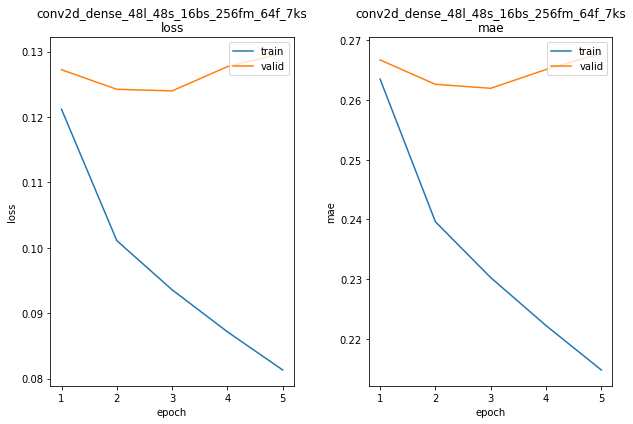

conv2d_dense_48l_48s_16bs_256fm_64f_7ks train min loss: 0.081336	mae: 0.214762	epoch: 5
conv2d_dense_48l_48s_16bs_256fm_64f_7ks valid min loss: 0.124005	mae: 0.261974	epoch: 3

conv2d_dense_48l_48s_16bs_256fm_64f_7ks
mse: 0.12400490045547485

Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 329.6438
Function value obtained: 0.1240
Current minimum: 0.1240
Iteration No: 2 started. Evaluating function at random point.
feat_maps: 421
lags: 37
filters: 55
kern_size: 12
Epoch 1/5
11758/11758 [==============================] - 15s 1ms/step - loss: 1.9280 - mae: 0.8369


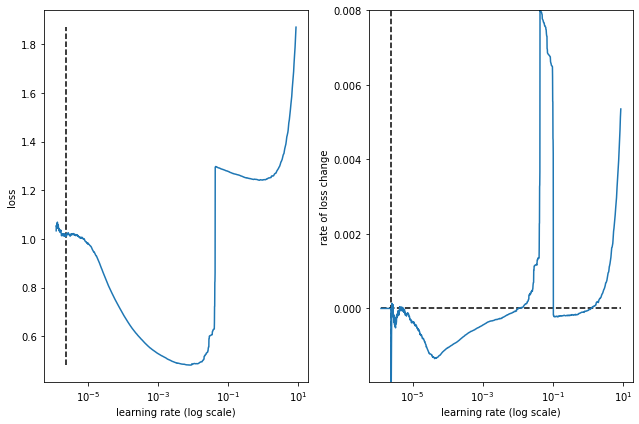

best lr: 2.4470207e-06 

Model: "conv2d_dense_37l_48s_16bs_421fm_55f_12ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_142 (Reshape)        (None, 37, 10, 1)         0         
_________________________________________________________________
conv2d_74 (Conv2D)           (None, 37, 10, 55)        715       
_________________________________________________________________
flatten_69 (Flatten)         (None, 20350)             0         
_________________________________________________________________
dense_193 (Dense)            (None, 421)               8567771   
_________________________________________________________________
dense_194 (Dense)            (None, 210)               88620     
_________________________________________________________________
dense_195 (Dense)            (None, 48)                10128     
_________________________________________________________________
r

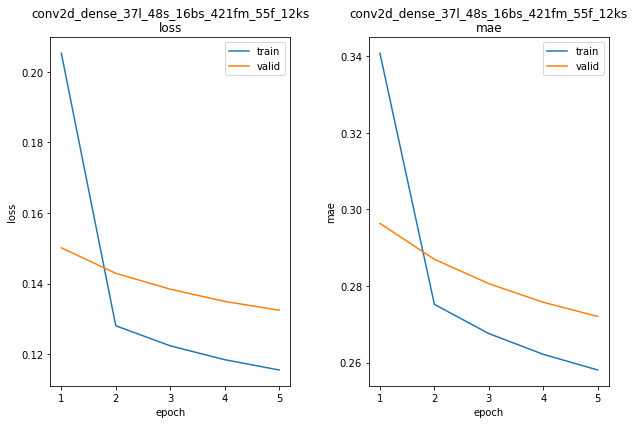

conv2d_dense_37l_48s_16bs_421fm_55f_12ks train min loss: 0.115547	mae: 0.258097	epoch: 5
conv2d_dense_37l_48s_16bs_421fm_55f_12ks valid min loss: 0.132479	mae: 0.272061	epoch: 5

conv2d_dense_37l_48s_16bs_421fm_55f_12ks
mse: 0.13247868418693542

Iteration No: 2 ended. Evaluation done at random point.
Time taken: 365.1145
Function value obtained: 0.1325
Current minimum: 0.1240
Iteration No: 3 started. Evaluating function at random point.
feat_maps: 264
lags: 31
filters: 42
kern_size: 9
Epoch 1/5
11759/11759 [==============================] - 14s 1ms/step - loss: 2.0273 - mae: 0.8947


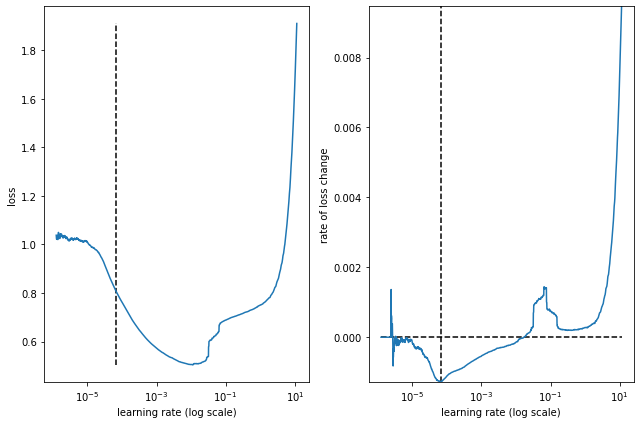

best lr: 6.565951e-05 

Model: "conv2d_dense_31l_48s_16bs_264fm_42f_9ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_144 (Reshape)        (None, 31, 10, 1)         0         
_________________________________________________________________
conv2d_75 (Conv2D)           (None, 31, 10, 42)        420       
_________________________________________________________________
flatten_70 (Flatten)         (None, 13020)             0         
_________________________________________________________________
dense_196 (Dense)            (None, 264)               3437544   
_________________________________________________________________
dense_197 (Dense)            (None, 132)               34980     
_________________________________________________________________
dense_198 (Dense)            (None, 48)                6384      
_________________________________________________________________
res

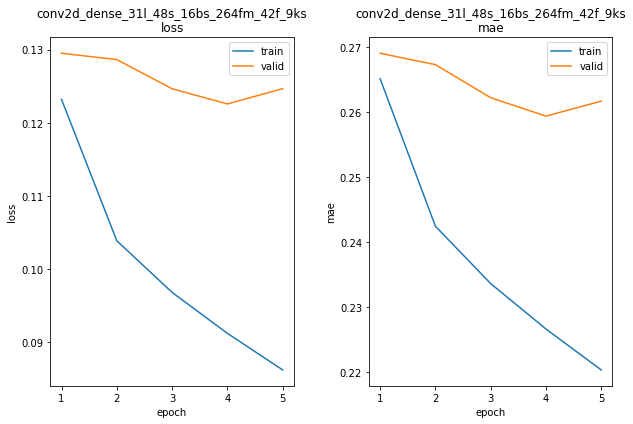

conv2d_dense_31l_48s_16bs_264fm_42f_9ks train min loss: 0.086201	mae: 0.220390	epoch: 5
conv2d_dense_31l_48s_16bs_264fm_42f_9ks valid min loss: 0.122577	mae: 0.259432	epoch: 4

conv2d_dense_31l_48s_16bs_264fm_42f_9ks
mse: 0.1225774735212326

Iteration No: 3 ended. Evaluation done at random point.
Time taken: 340.3636
Function value obtained: 0.1226
Current minimum: 0.1226
Iteration No: 4 started. Evaluating function at random point.
feat_maps: 128
lags: 71
filters: 26
kern_size: 14
Epoch 1/5
11756/11756 [==============================] - 14s 1ms/step - loss: 2.0805 - mae: 0.9042


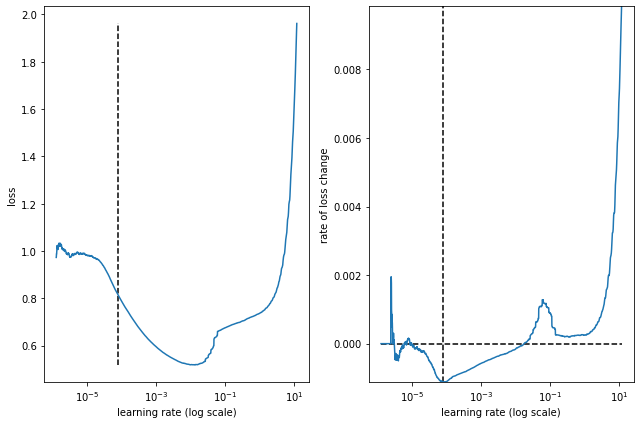

best lr: 7.63036e-05 

Model: "conv2d_dense_71l_48s_16bs_128fm_26f_14ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_146 (Reshape)        (None, 71, 10, 1)         0         
_________________________________________________________________
conv2d_76 (Conv2D)           (None, 71, 10, 26)        390       
_________________________________________________________________
flatten_71 (Flatten)         (None, 18460)             0         
_________________________________________________________________
dense_199 (Dense)            (None, 128)               2363008   
_________________________________________________________________
dense_200 (Dense)            (None, 64)                8256      
_________________________________________________________________
dense_201 (Dense)            (None, 48)                3120      
_________________________________________________________________
res

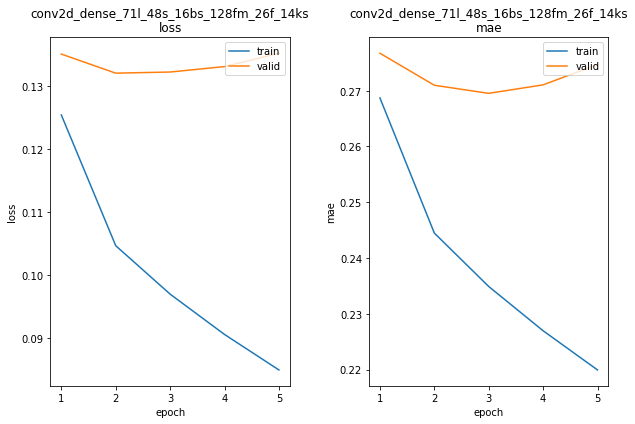

conv2d_dense_71l_48s_16bs_128fm_26f_14ks train min loss: 0.084947	mae: 0.219932	epoch: 5
conv2d_dense_71l_48s_16bs_128fm_26f_14ks valid min loss: 0.132009	mae: 0.270978	epoch: 2

conv2d_dense_71l_48s_16bs_128fm_26f_14ks
mse: 0.1320086568593979

Iteration No: 4 ended. Evaluation done at random point.
Time taken: 371.8125
Function value obtained: 0.1320
Current minimum: 0.1226
Iteration No: 5 started. Evaluating function at random point.
feat_maps: 484
lags: 24
filters: 64
kern_size: 12
Epoch 1/5
11759/11759 [==============================] - 15s 1ms/step - loss: 1.9444 - mae: 0.8230


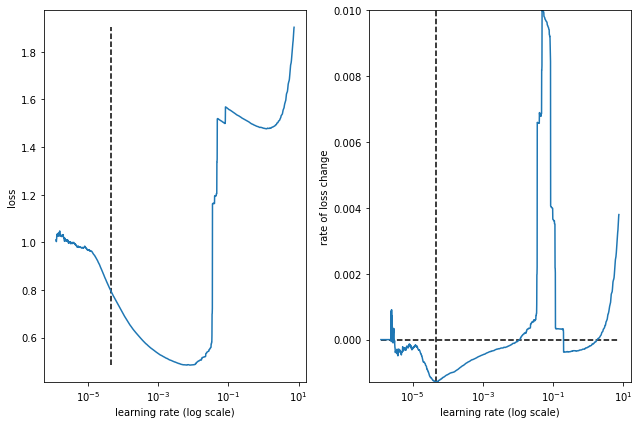

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_484fm_64f_12ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_148 (Reshape)        (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_77 (Conv2D)           (None, 24, 10, 64)        832       
_________________________________________________________________
flatten_72 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dense_202 (Dense)            (None, 484)               7434724   
_________________________________________________________________
dense_203 (Dense)            (None, 242)               117370    
_________________________________________________________________
dense_204 (Dense)            (None, 48)                11664     
_________________________________________________________________
r

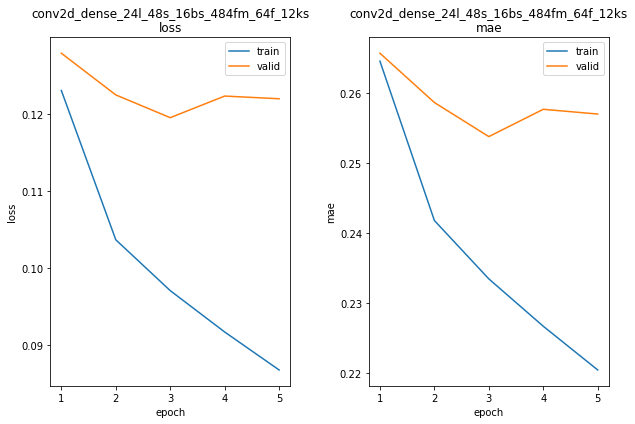

conv2d_dense_24l_48s_16bs_484fm_64f_12ks train min loss: 0.086810	mae: 0.220495	epoch: 5
conv2d_dense_24l_48s_16bs_484fm_64f_12ks valid min loss: 0.119534	mae: 0.253784	epoch: 3

conv2d_dense_24l_48s_16bs_484fm_64f_12ks
mse: 0.11953436583280563

Iteration No: 5 ended. Evaluation done at random point.
Time taken: 369.1545
Function value obtained: 0.1195
Current minimum: 0.1195
Iteration No: 6 started. Evaluating function at random point.
feat_maps: 338
lags: 25
filters: 25
kern_size: 11
Epoch 1/5
11759/11759 [==============================] - 11s 838us/step - loss: 17.2044 - mae: 0.6776


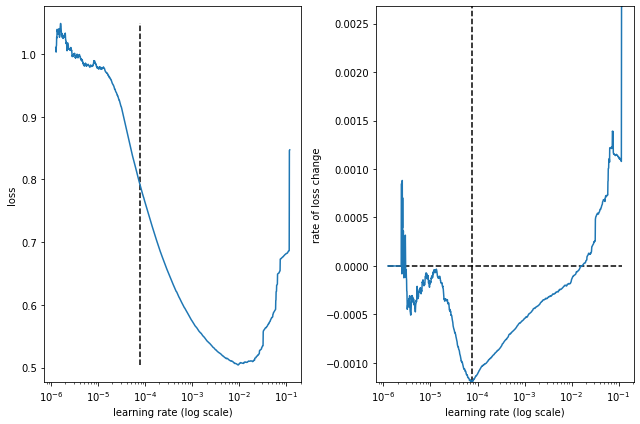

best lr: 7.62193e-05 

Model: "conv2d_dense_25l_48s_16bs_338fm_25f_11ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_150 (Reshape)        (None, 25, 10, 1)         0         
_________________________________________________________________
conv2d_78 (Conv2D)           (None, 25, 10, 25)        300       
_________________________________________________________________
flatten_73 (Flatten)         (None, 6250)              0         
_________________________________________________________________
dense_205 (Dense)            (None, 338)               2112838   
_________________________________________________________________
dense_206 (Dense)            (None, 169)               57291     
_________________________________________________________________
dense_207 (Dense)            (None, 48)                8160      
_________________________________________________________________
res

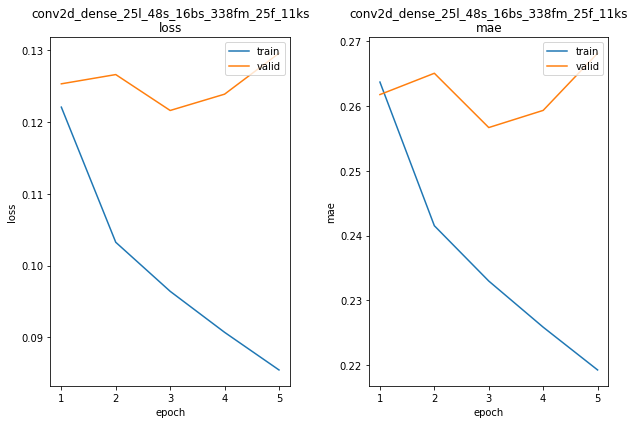

conv2d_dense_25l_48s_16bs_338fm_25f_11ks train min loss: 0.085480	mae: 0.219242	epoch: 5
conv2d_dense_25l_48s_16bs_338fm_25f_11ks valid min loss: 0.121599	mae: 0.256679	epoch: 3

conv2d_dense_25l_48s_16bs_338fm_25f_11ks
mse: 0.12159907072782516

Iteration No: 6 ended. Evaluation done at random point.
Time taken: 359.8840
Function value obtained: 0.1216
Current minimum: 0.1195
Iteration No: 7 started. Evaluating function at random point.
feat_maps: 243
lags: 27
filters: 63
kern_size: 8
Epoch 1/5
11759/11759 [==============================] - 15s 1ms/step - loss: 2.0011 - mae: 0.8857


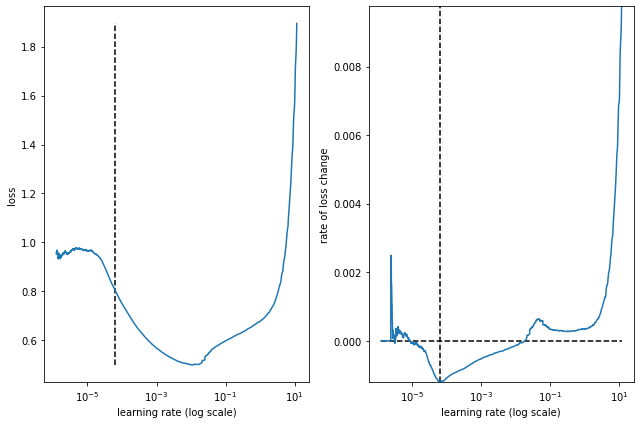

best lr: 6.395405e-05 

Model: "conv2d_dense_27l_48s_16bs_243fm_63f_8ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_152 (Reshape)        (None, 27, 10, 1)         0         
_________________________________________________________________
conv2d_79 (Conv2D)           (None, 27, 10, 63)        567       
_________________________________________________________________
flatten_74 (Flatten)         (None, 17010)             0         
_________________________________________________________________
dense_208 (Dense)            (None, 243)               4133673   
_________________________________________________________________
dense_209 (Dense)            (None, 121)               29524     
_________________________________________________________________
dense_210 (Dense)            (None, 48)                5856      
_________________________________________________________________
res

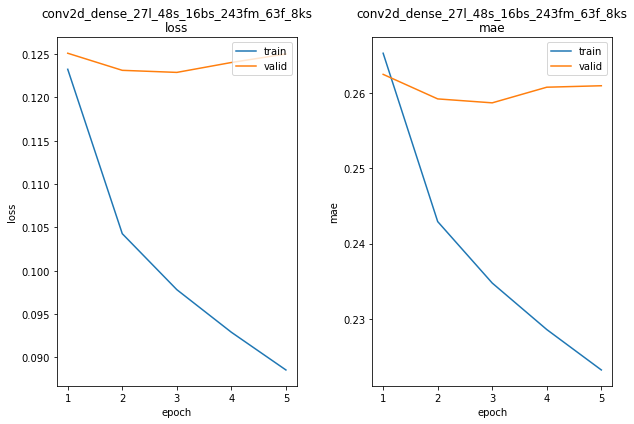

conv2d_dense_27l_48s_16bs_243fm_63f_8ks train min loss: 0.088553	mae: 0.223247	epoch: 5
conv2d_dense_27l_48s_16bs_243fm_63f_8ks valid min loss: 0.122893	mae: 0.258668	epoch: 3

conv2d_dense_27l_48s_16bs_243fm_63f_8ks
mse: 0.12289264798164368

Iteration No: 7 ended. Evaluation done at random point.
Time taken: 335.8331
Function value obtained: 0.1229
Current minimum: 0.1195
Iteration No: 8 started. Evaluating function at random point.
feat_maps: 105
lags: 69
filters: 39
kern_size: 17
Epoch 1/5
11756/11756 [==============================] - 11s 829us/step - loss: 6.2517 - mae: 0.6429


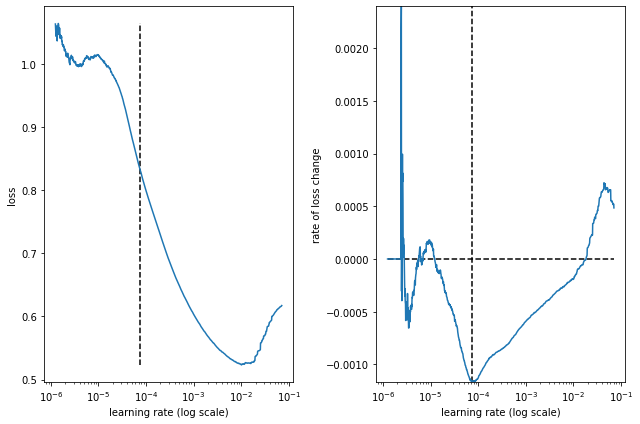

best lr: 7.5636985e-05 

Model: "conv2d_dense_69l_48s_16bs_105fm_39f_17ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_154 (Reshape)        (None, 69, 10, 1)         0         
_________________________________________________________________
conv2d_80 (Conv2D)           (None, 69, 10, 39)        702       
_________________________________________________________________
flatten_75 (Flatten)         (None, 26910)             0         
_________________________________________________________________
dense_211 (Dense)            (None, 105)               2825655   
_________________________________________________________________
dense_212 (Dense)            (None, 52)                5512      
_________________________________________________________________
dense_213 (Dense)            (None, 48)                2544      
_________________________________________________________________
r

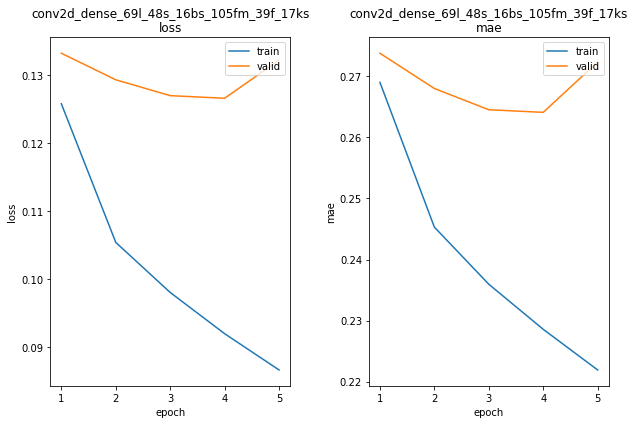

conv2d_dense_69l_48s_16bs_105fm_39f_17ks train min loss: 0.086574	mae: 0.221918	epoch: 5
conv2d_dense_69l_48s_16bs_105fm_39f_17ks valid min loss: 0.126600	mae: 0.264088	epoch: 4

conv2d_dense_69l_48s_16bs_105fm_39f_17ks
mse: 0.12659960985183716

Iteration No: 8 ended. Evaluation done at random point.
Time taken: 331.1939
Function value obtained: 0.1266
Current minimum: 0.1195
Iteration No: 9 started. Evaluating function at random point.
feat_maps: 273
lags: 86
filters: 51
kern_size: 10
Epoch 1/5
11755/11755 [==============================] - 13s 1ms/step - loss: 4.2190 - mae: 0.6243


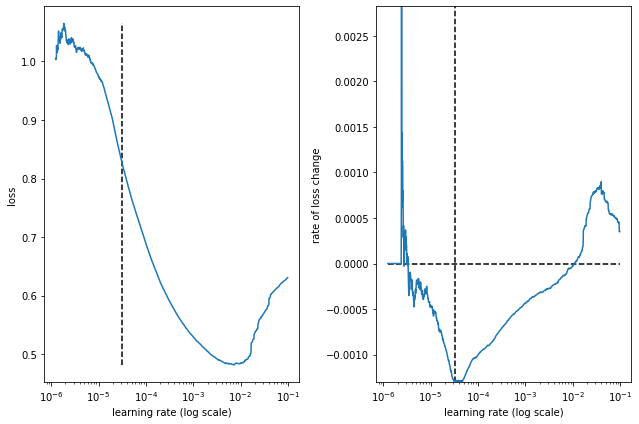

best lr: 3.2018565e-05 

Model: "conv2d_dense_86l_48s_16bs_273fm_51f_10ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_156 (Reshape)        (None, 86, 10, 1)         0         
_________________________________________________________________
conv2d_81 (Conv2D)           (None, 86, 10, 51)        561       
_________________________________________________________________
flatten_76 (Flatten)         (None, 43860)             0         
_________________________________________________________________
dense_214 (Dense)            (None, 273)               11974053  
_________________________________________________________________
dense_215 (Dense)            (None, 136)               37264     
_________________________________________________________________
dense_216 (Dense)            (None, 48)                6576      
_________________________________________________________________
r

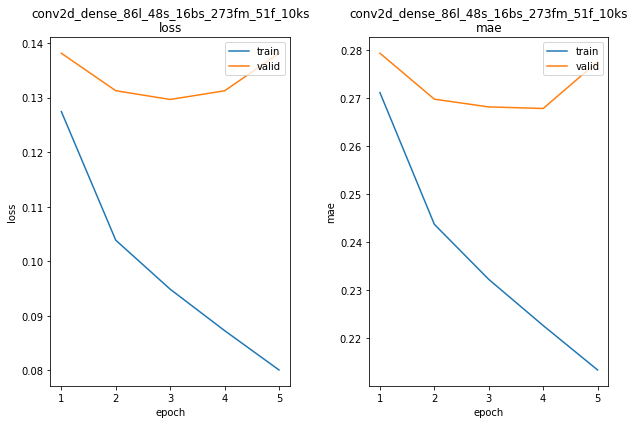

conv2d_dense_86l_48s_16bs_273fm_51f_10ks train min loss: 0.080092	mae: 0.213435	epoch: 5
conv2d_dense_86l_48s_16bs_273fm_51f_10ks valid min loss: 0.129660	mae: 0.268127	epoch: 3

conv2d_dense_86l_48s_16bs_273fm_51f_10ks
mse: 0.12965956330299377

Iteration No: 9 ended. Evaluation done at random point.
Time taken: 315.9901
Function value obtained: 0.1297
Current minimum: 0.1195
Iteration No: 10 started. Evaluating function at random point.
feat_maps: 70
lags: 92
filters: 47
kern_size: 10
Epoch 1/5
11755/11755 [==============================] - 15s 1ms/step - loss: 2.0638 - mae: 0.8918


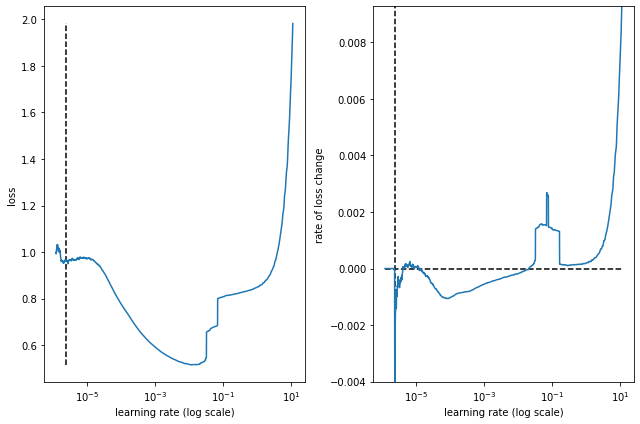

best lr: 2.4049968e-06 

Model: "conv2d_dense_92l_48s_16bs_70fm_47f_10ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_158 (Reshape)        (None, 92, 10, 1)         0         
_________________________________________________________________
conv2d_82 (Conv2D)           (None, 92, 10, 47)        517       
_________________________________________________________________
flatten_77 (Flatten)         (None, 43240)             0         
_________________________________________________________________
dense_217 (Dense)            (None, 70)                3026870   
_________________________________________________________________
dense_218 (Dense)            (None, 35)                2485      
_________________________________________________________________
dense_219 (Dense)            (None, 48)                1728      
_________________________________________________________________
re

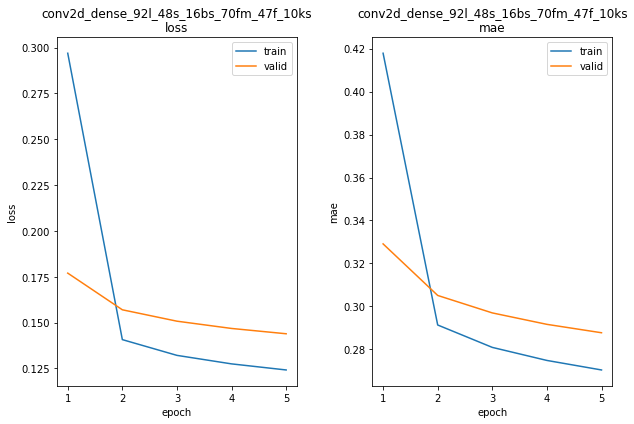

conv2d_dense_92l_48s_16bs_70fm_47f_10ks train min loss: 0.124154	mae: 0.270469	epoch: 5
conv2d_dense_92l_48s_16bs_70fm_47f_10ks valid min loss: 0.143901	mae: 0.287779	epoch: 5

conv2d_dense_92l_48s_16bs_70fm_47f_10ks
mse: 0.14390121400356293

Iteration No: 10 ended. Evaluation done at random point.
Time taken: 371.8060
Function value obtained: 0.1439
Current minimum: 0.1195
Iteration No: 11 started. Evaluating function at random point.
feat_maps: 71
lags: 41
filters: 34
kern_size: 13
Epoch 1/5
11758/11758 [==============================] - 15s 1ms/step - loss: 2.1460 - mae: 0.9164


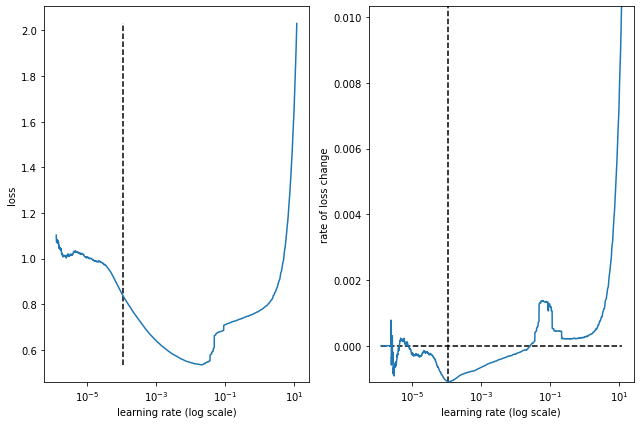

best lr: 0.00011118907 

Model: "conv2d_dense_41l_48s_16bs_71fm_34f_13ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_160 (Reshape)        (None, 41, 10, 1)         0         
_________________________________________________________________
conv2d_83 (Conv2D)           (None, 41, 10, 34)        476       
_________________________________________________________________
flatten_78 (Flatten)         (None, 13940)             0         
_________________________________________________________________
dense_220 (Dense)            (None, 71)                989811    
_________________________________________________________________
dense_221 (Dense)            (None, 35)                2520      
_________________________________________________________________
dense_222 (Dense)            (None, 48)                1728      
_________________________________________________________________
re

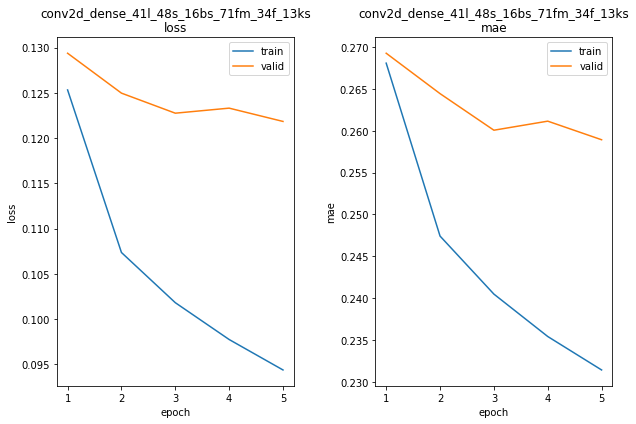

conv2d_dense_41l_48s_16bs_71fm_34f_13ks train min loss: 0.094367	mae: 0.231404	epoch: 5
conv2d_dense_41l_48s_16bs_71fm_34f_13ks valid min loss: 0.121837	mae: 0.258937	epoch: 5

conv2d_dense_41l_48s_16bs_71fm_34f_13ks
mse: 0.12183725088834763

Iteration No: 11 ended. Evaluation done at random point.
Time taken: 370.8845
Function value obtained: 0.1218
Current minimum: 0.1195
Iteration No: 12 started. Evaluating function at random point.
feat_maps: 121
lags: 25
filters: 27
kern_size: 17
Epoch 1/5
11759/11759 [==============================] - 14s 1ms/step - loss: 835702358016.0000 - mae: 21542.3145


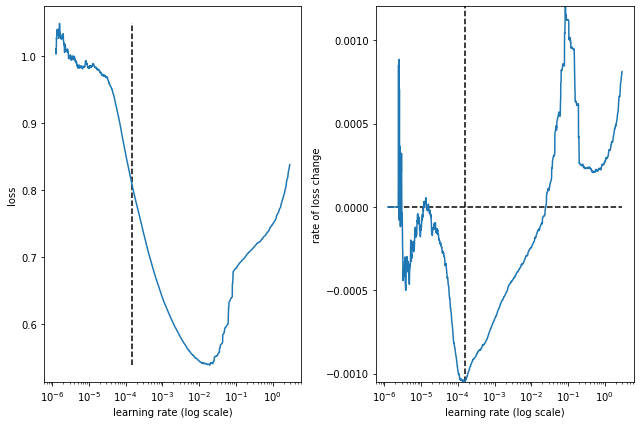

best lr: 0.00015242031 

Model: "conv2d_dense_25l_48s_16bs_121fm_27f_17ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_162 (Reshape)        (None, 25, 10, 1)         0         
_________________________________________________________________
conv2d_84 (Conv2D)           (None, 25, 10, 27)        486       
_________________________________________________________________
flatten_79 (Flatten)         (None, 6750)              0         
_________________________________________________________________
dense_223 (Dense)            (None, 121)               816871    
_________________________________________________________________
dense_224 (Dense)            (None, 60)                7320      
_________________________________________________________________
dense_225 (Dense)            (None, 48)                2928      
_________________________________________________________________
r

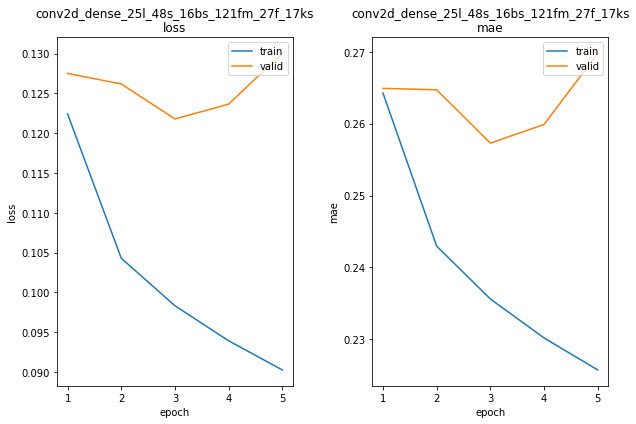

conv2d_dense_25l_48s_16bs_121fm_27f_17ks train min loss: 0.090256	mae: 0.225735	epoch: 5
conv2d_dense_25l_48s_16bs_121fm_27f_17ks valid min loss: 0.121790	mae: 0.257285	epoch: 3

conv2d_dense_25l_48s_16bs_121fm_27f_17ks
mse: 0.1217895969748497

Iteration No: 12 ended. Evaluation done at random point.
Time taken: 332.6483
Function value obtained: 0.1218
Current minimum: 0.1195
Iteration No: 13 started. Searching for the next optimal point.
feat_maps: 68
lags: 24
filters: 64
kern_size: 17
Epoch 1/5
11759/11759 [==============================] - 16s 1ms/step - loss: 2.1938 - mae: 0.9229


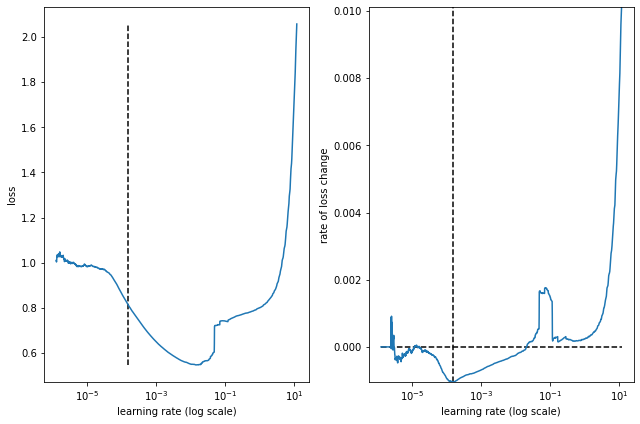

best lr: 0.00015242031 

Model: "conv2d_dense_24l_48s_16bs_68fm_64f_17ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_164 (Reshape)        (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_85 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_80 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dense_226 (Dense)            (None, 68)                1044548   
_________________________________________________________________
dense_227 (Dense)            (None, 34)                2346      
_________________________________________________________________
dense_228 (Dense)            (None, 48)                1680      
_________________________________________________________________
re

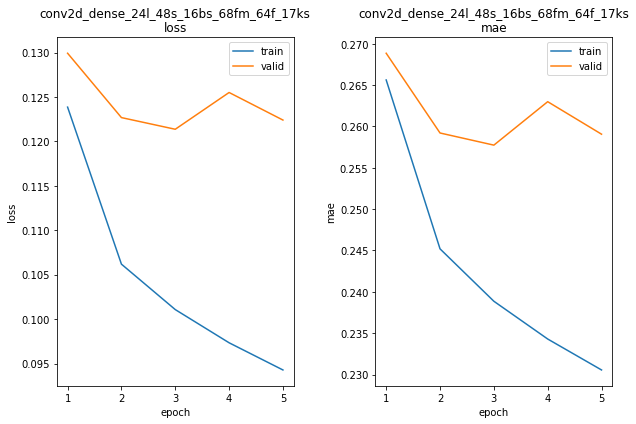

conv2d_dense_24l_48s_16bs_68fm_64f_17ks train min loss: 0.094277	mae: 0.230554	epoch: 5
conv2d_dense_24l_48s_16bs_68fm_64f_17ks valid min loss: 0.121367	mae: 0.257737	epoch: 3

conv2d_dense_24l_48s_16bs_68fm_64f_17ks
mse: 0.12136717885732651

Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 335.1343
Function value obtained: 0.1214
Current minimum: 0.1195
Iteration No: 14 started. Searching for the next optimal point.
feat_maps: 469
lags: 24
filters: 25
kern_size: 7
Epoch 1/5
11759/11759 [==============================] - 13s 1ms/step - loss: 3.4340 - mae: 0.6727


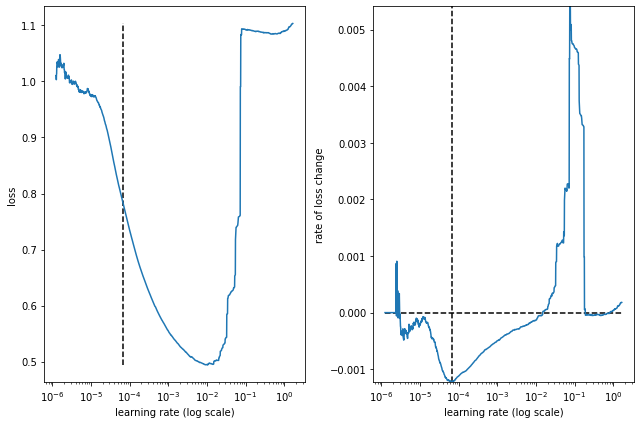

best lr: 6.741044e-05 

Model: "conv2d_dense_24l_48s_16bs_469fm_25f_7ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_166 (Reshape)        (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_86 (Conv2D)           (None, 24, 10, 25)        200       
_________________________________________________________________
flatten_81 (Flatten)         (None, 6000)              0         
_________________________________________________________________
dense_229 (Dense)            (None, 469)               2814469   
_________________________________________________________________
dense_230 (Dense)            (None, 234)               109980    
_________________________________________________________________
dense_231 (Dense)            (None, 48)                11280     
_________________________________________________________________
res

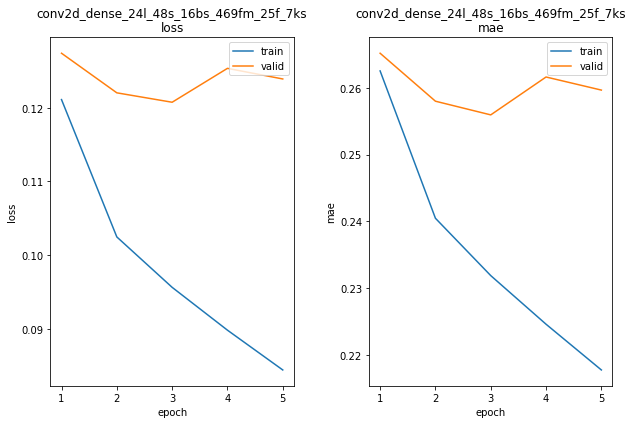

conv2d_dense_24l_48s_16bs_469fm_25f_7ks train min loss: 0.084395	mae: 0.217740	epoch: 5
conv2d_dense_24l_48s_16bs_469fm_25f_7ks valid min loss: 0.120764	mae: 0.255965	epoch: 3

conv2d_dense_24l_48s_16bs_469fm_25f_7ks
mse: 0.12076380103826523

Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 337.2879
Function value obtained: 0.1208
Current minimum: 0.1195
Iteration No: 15 started. Searching for the next optimal point.
feat_maps: 151
lags: 24
filters: 24
kern_size: 6
Epoch 1/5
11759/11759 [==============================] - 12s 992us/step - loss: 26816.1738 - mae: 4.9212


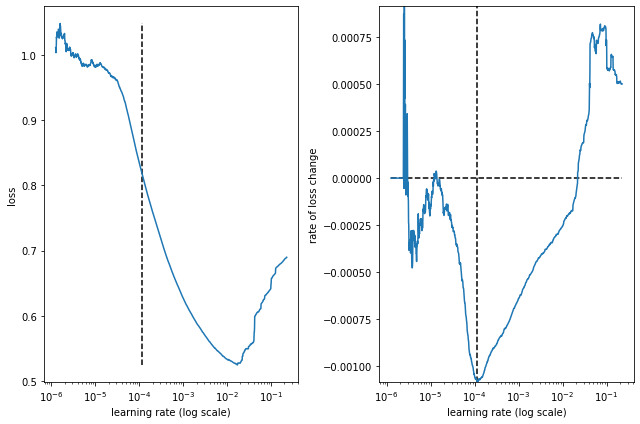

best lr: 0.00011511391 

Model: "conv2d_dense_24l_48s_16bs_151fm_24f_6ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_168 (Reshape)        (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_87 (Conv2D)           (None, 24, 10, 24)        168       
_________________________________________________________________
flatten_82 (Flatten)         (None, 5760)              0         
_________________________________________________________________
dense_232 (Dense)            (None, 151)               869911    
_________________________________________________________________
dense_233 (Dense)            (None, 75)                11400     
_________________________________________________________________
dense_234 (Dense)            (None, 48)                3648      
_________________________________________________________________
re

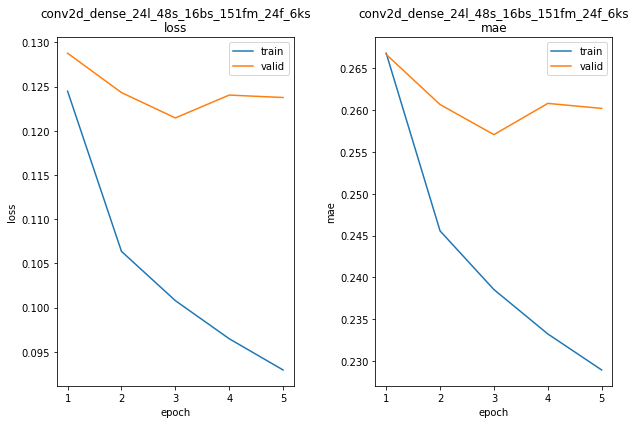

conv2d_dense_24l_48s_16bs_151fm_24f_6ks train min loss: 0.092955	mae: 0.228948	epoch: 5
conv2d_dense_24l_48s_16bs_151fm_24f_6ks valid min loss: 0.121447	mae: 0.257056	epoch: 3

conv2d_dense_24l_48s_16bs_151fm_24f_6ks
mse: 0.12144652009010315

Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 332.3790
Function value obtained: 0.1214
Current minimum: 0.1195
Iteration No: 16 started. Searching for the next optimal point.
feat_maps: 74
lags: 24
filters: 63
kern_size: 16
Epoch 1/5
11759/11759 [==============================] - 16s 1ms/step - loss: 2.2012 - mae: 0.9321


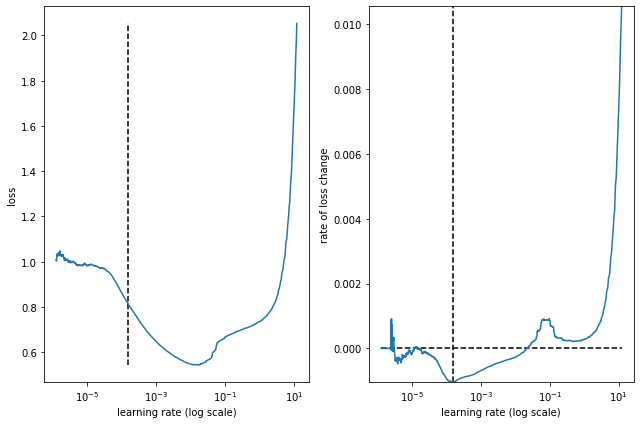

best lr: 0.00015242031 

Model: "conv2d_dense_24l_48s_16bs_74fm_63f_16ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_170 (Reshape)        (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 24, 10, 63)        1071      
_________________________________________________________________
flatten_83 (Flatten)         (None, 15120)             0         
_________________________________________________________________
dense_235 (Dense)            (None, 74)                1118954   
_________________________________________________________________
dense_236 (Dense)            (None, 37)                2775      
_________________________________________________________________
dense_237 (Dense)            (None, 48)                1824      
_________________________________________________________________
re

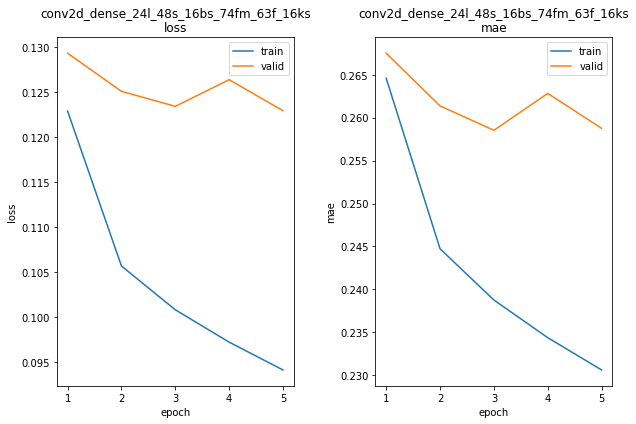

conv2d_dense_24l_48s_16bs_74fm_63f_16ks train min loss: 0.094138	mae: 0.230616	epoch: 5
conv2d_dense_24l_48s_16bs_74fm_63f_16ks valid min loss: 0.122941	mae: 0.258759	epoch: 5

conv2d_dense_24l_48s_16bs_74fm_63f_16ks
mse: 0.12294066697359085

Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 370.5070
Function value obtained: 0.1229
Current minimum: 0.1195
Iteration No: 17 started. Searching for the next optimal point.
feat_maps: 452
lags: 24
filters: 25
kern_size: 16
Epoch 1/5
11759/11759 [==============================] - 16s 1ms/step - loss: 2.0102 - mae: 0.8897


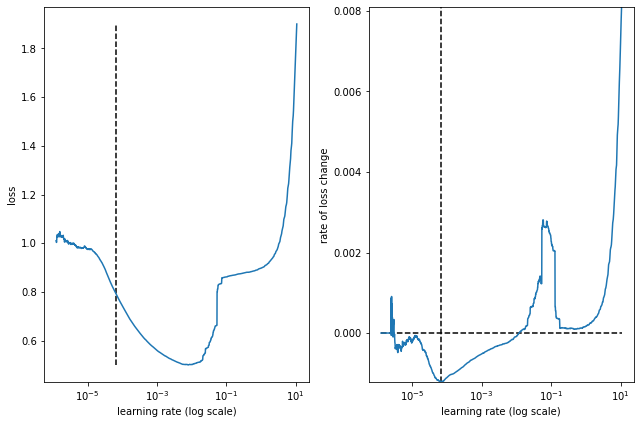

best lr: 6.741044e-05 

Model: "conv2d_dense_24l_48s_16bs_452fm_25f_16ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_172 (Reshape)        (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_89 (Conv2D)           (None, 24, 10, 25)        425       
_________________________________________________________________
flatten_84 (Flatten)         (None, 6000)              0         
_________________________________________________________________
dense_238 (Dense)            (None, 452)               2712452   
_________________________________________________________________
dense_239 (Dense)            (None, 226)               102378    
_________________________________________________________________
dense_240 (Dense)            (None, 48)                10896     
_________________________________________________________________
re

In [ ]:
%%time

dim_feat_maps = Integer(low = 64, high = 512, name = 'feat_maps')
dim_lags      = Integer(low = 24, high =  96, name = 'lags')
dim_filters   = Integer(low = 24, high =  64, name = 'filters')
dim_kern_size = Integer(low =  5, high =  17, name = 'kern_size')

bo_dims_48s = [dim_feat_maps,
               dim_lags,
               dim_filters,
               dim_kern_size]


@use_named_args(dimensions = bo_dims_48s)
def model_fitness_48s(feat_maps, lags, filters, kern_size):
    params = {'xcols':        def_cols,
              'ycols':             'y',
              'lags':             lags, 
              'steps_ahead':        48,
              'stride':             48, 
              'shuffle':          True,
              'bs':                 16,
              'model_type': 'conv2d_dense',
              'mix_type':         'ts',
              'mix_alpha':           4,
              'mix_factor':          0,
              'mix_diff':            1,
              'feat_maps':   feat_maps,
              'filters':       filters,
              'kern_size':   kern_size,
              'drop_out':          0.0,
              'kern_reg':          0.0,
              'recu_reg':          0.0,
              'epochs':              5,
              'lrf_params': [0.000001, 10, 32, 5, 100, 25]}
        
    print('feat_maps:', feat_maps)
    print('lags:',      lags)
    print('filters:',   filters)
    print('kern_size:', kern_size)
    
    model_names = ['']
    model_name = get_model_name(models, params)
    model_names.append(model_name)

    # skopt will re-evaluate the same point, even when gp_minimize(..., noise = 1e-10) is set
    # Some problems are noisy but regardless is bad default behaviour!
    # DO NOT rebuild the model 
    if not model_name in models:
      model = create_model(params)
      models[model_name]['history'] = run_model(models, params)
      summarise_history(models, model_names)

    print(model_name)
    bo_mse = models[model_name]['perf']['val_loss']['min']
     
    if reject_model(models[model_name]['perf'], strict = False):
      print("WARN: bad model", model_name)
      BAD_MODEL_PENALTY = 1
      bo_mse *= BAD_MODEL_PENALTY  # bad models get (arbitrarly) "higher" values

    print("mse:", bo_mse)
    print()

    return bo_mse


#bo_search_results = {}
bo_def_dims_48s = [256, 48, 64, 7]

bo_search_results['conv2d_48s'] = gp_minimize(func = model_fitness_48s,
                                              dimensions = bo_dims_48s,
                                              x0 = bo_def_dims_48s,
                                              n_calls = 40,
                                              acq_func = 'EI',
                                              noise = 1e-10,  # noise, limit but not prevent re-evaluating the same point
                                              verbose = True,
                                              random_state = 42)

print(bo_search_results['conv2d_48s'].x)
print(bo_search_results['conv2d_48s'].fun)

# sorted(zip(bo_search_results['s_lstm_1s'].func_vals, bo_search_results['s_lstm_1s'].x_iters))

plot_convergence(bo_search_results['conv2d_48s'])

plot_objective(result   = bo_search_results['conv2d_48s'])
plot_evaluations(result = bo_search_results['conv2d_48s']);

Iteration No: 1 started. Evaluating function at provided point.
feat_maps 256
lags 48
filters 64
kern_size 7
Epoch 1/5
11758/11758 [==============================] - 13s 1ms/step - loss: 1.5119 - mae: 0.7850


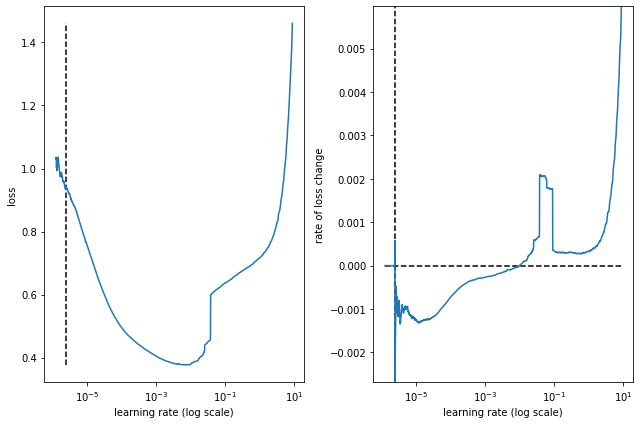

best lr: 2.4470207e-06 

Model: "conv2d_dense_48l_48s_16bs_256fm_64f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_82 (Reshape)        (None, 48, 10, 1)         0         
                                                                 
 conv2d (Conv2D)             (None, 48, 10, 64)        512       
                                                                 
 flatten_167 (Flatten)       (None, 30720)             0         
                                                                 
 dense_331 (Dense)           (None, 256)               7864576   
                                                                 
 dense_332 (Dense)           (None, 128)               32896     
                                                                 
 dense_333 (Dense)           (None, 48)                6192      
                                                                 
 r

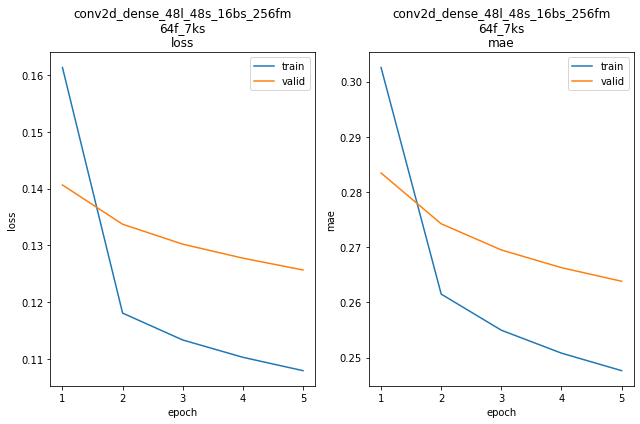

conv2d_dense_48l_48s_16bs_256fm_64f_7ks train min loss: 0.107934	mae: 0.247618	epoch: 5
conv2d_dense_48l_48s_16bs_256fm_64f_7ks valid min loss: 0.125667	mae: 0.263823	epoch: 5

conv2d_dense_48l_48s_16bs_256fm_64f_7ks
Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 393.5090
Function value obtained: 0.1257
Current minimum: 0.1257
Iteration No: 2 started. Evaluating function at random point.
feat_maps 421
lags 46
filters 53
kern_size 11
Epoch 1/5
11758/11758 [==============================] - 10s 784us/step - loss: 3.7985 - mae: 0.5645


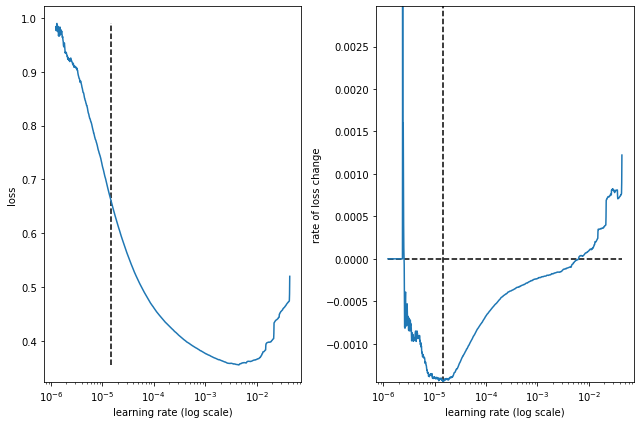

best lr: 1.4781641e-05 

Model: "conv2d_dense_46l_48s_16bs_421fm_53f_11ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_84 (Reshape)        (None, 46, 10, 1)         0         
                                                                 
 conv2d_1 (Conv2D)           (None, 46, 10, 53)        636       
                                                                 
 flatten_168 (Flatten)       (None, 24380)             0         
                                                                 
 dense_334 (Dense)           (None, 421)               10264401  
                                                                 
 dense_335 (Dense)           (None, 210)               88620     
                                                                 
 dense_336 (Dense)           (None, 48)                10128     
                                                                 
 

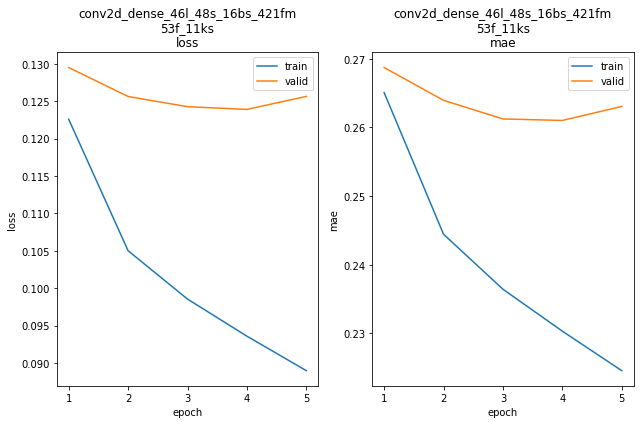

conv2d_dense_46l_48s_16bs_421fm_53f_11ks train min loss: 0.088976	mae: 0.224579	epoch: 5
conv2d_dense_46l_48s_16bs_421fm_53f_11ks valid min loss: 0.123900	mae: 0.261017	epoch: 4

conv2d_dense_46l_48s_16bs_421fm_53f_11ks
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 300.1999
Function value obtained: 0.1239
Current minimum: 0.1239
Iteration No: 3 started. Evaluating function at random point.
feat_maps 264
lags 36
filters 38
kern_size 8
Epoch 1/5
11758/11758 [==============================] - 12s 953us/step - loss: 1.6524 - mae: 0.7199


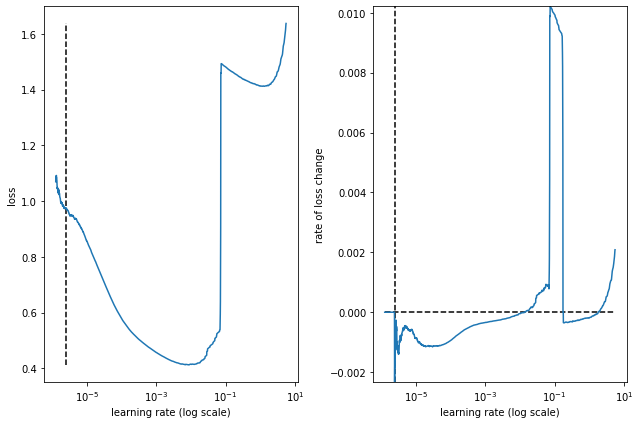

best lr: 2.4044584e-06 

Model: "conv2d_dense_36l_48s_16bs_264fm_38f_8ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_86 (Reshape)        (None, 36, 10, 1)         0         
                                                                 
 conv2d_2 (Conv2D)           (None, 36, 10, 38)        342       
                                                                 
 flatten_169 (Flatten)       (None, 13680)             0         
                                                                 
 dense_337 (Dense)           (None, 264)               3611784   
                                                                 
 dense_338 (Dense)           (None, 132)               34980     
                                                                 
 dense_339 (Dense)           (None, 48)                6384      
                                                                 
 r

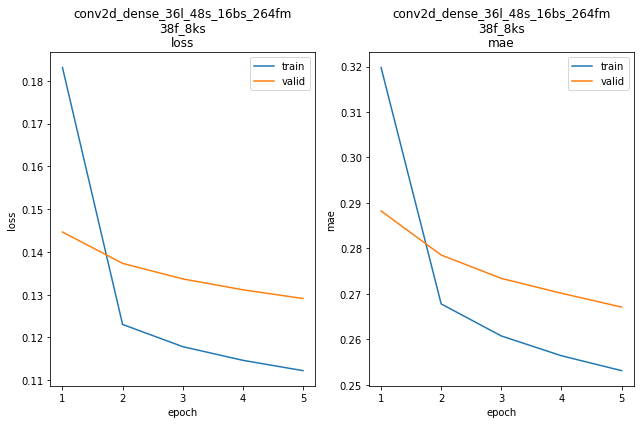

conv2d_dense_36l_48s_16bs_264fm_38f_8ks train min loss: 0.112248	mae: 0.253129	epoch: 5
conv2d_dense_36l_48s_16bs_264fm_38f_8ks valid min loss: 0.129121	mae: 0.267110	epoch: 5

conv2d_dense_36l_48s_16bs_264fm_38f_8ks
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 353.1042
Function value obtained: 0.1291
Current minimum: 0.1239
Iteration No: 4 started. Evaluating function at random point.
feat_maps 128
lags 102
filters 19
kern_size 13
Epoch 1/5
11754/11754 [==============================] - 13s 965us/step - loss: 2.0246 - mae: 0.9010


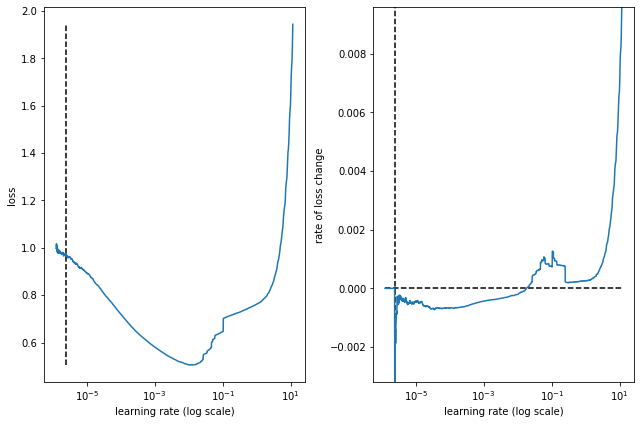

best lr: 2.4051762e-06 

Model: "conv2d_dense_102l_48s_16bs_128fm_19f_13ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_88 (Reshape)        (None, 102, 10, 1)        0         
                                                                 
 conv2d_3 (Conv2D)           (None, 102, 10, 19)       266       
                                                                 
 flatten_170 (Flatten)       (None, 19380)             0         
                                                                 
 dense_340 (Dense)           (None, 128)               2480768   
                                                                 
 dense_341 (Dense)           (None, 64)                8256      
                                                                 
 dense_342 (Dense)           (None, 48)                3120      
                                                                 


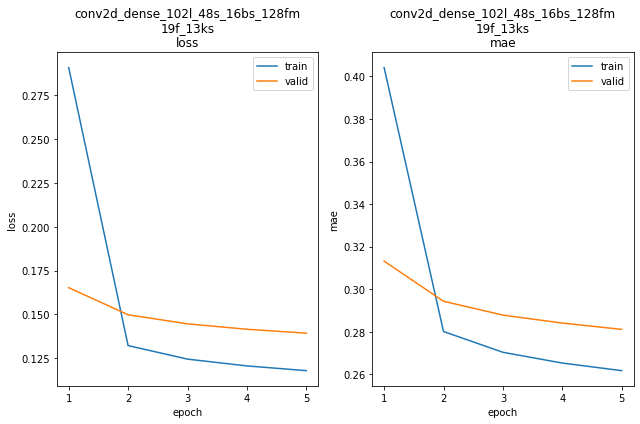

conv2d_dense_102l_48s_16bs_128fm_19f_13ks train min loss: 0.117934	mae: 0.261690	epoch: 5
conv2d_dense_102l_48s_16bs_128fm_19f_13ks valid min loss: 0.139317	mae: 0.281089	epoch: 5

conv2d_dense_102l_48s_16bs_128fm_19f_13ks
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 433.3111
Function value obtained: 0.1393
Current minimum: 0.1239
Iteration No: 5 started. Evaluating function at random point.
feat_maps 484
lags 24
filters 64
kern_size 12
Epoch 1/5
11759/11759 [==============================] - 10s 772us/step - loss: 1.6061 - mae: 0.5489


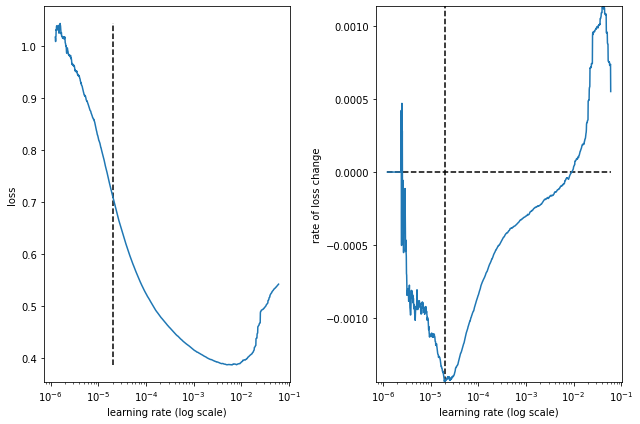

best lr: 2.008945e-05 

Model: "conv2d_dense_24l_48s_16bs_484fm_64f_12ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_90 (Reshape)        (None, 24, 10, 1)         0         
                                                                 
 conv2d_4 (Conv2D)           (None, 24, 10, 64)        832       
                                                                 
 flatten_171 (Flatten)       (None, 15360)             0         
                                                                 
 dense_343 (Dense)           (None, 484)               7434724   
                                                                 
 dense_344 (Dense)           (None, 242)               117370    
                                                                 
 dense_345 (Dense)           (None, 48)                11664     
                                                                 
 r

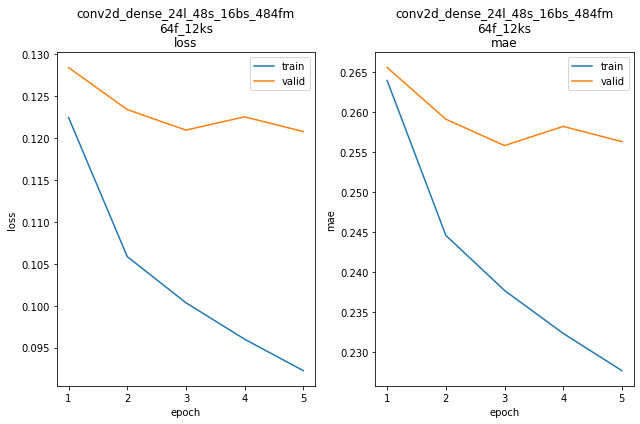

conv2d_dense_24l_48s_16bs_484fm_64f_12ks train min loss: 0.092251	mae: 0.227683	epoch: 5
conv2d_dense_24l_48s_16bs_484fm_64f_12ks valid min loss: 0.120795	mae: 0.256297	epoch: 5

conv2d_dense_24l_48s_16bs_484fm_64f_12ks
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 306.9540
Function value obtained: 0.1208
Current minimum: 0.1208
Iteration No: 6 started. Evaluating function at random point.
feat_maps 338
lags 25
filters 17
kern_size 10
Epoch 1/5
11759/11759 [==============================] - 12s 961us/step - loss: 1.8168 - mae: 0.7833


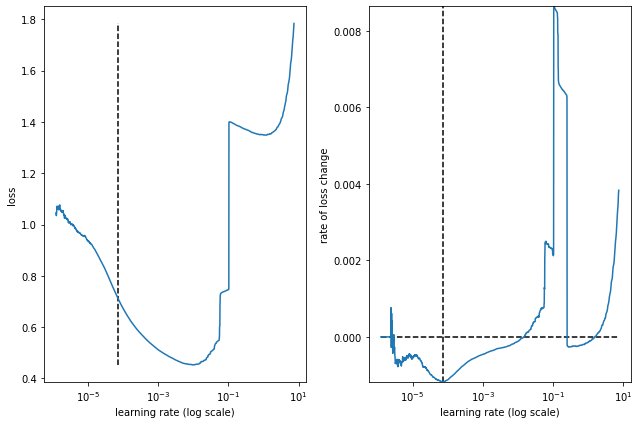

best lr: 7.423957e-05 

Model: "conv2d_dense_25l_48s_16bs_338fm_17f_10ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_92 (Reshape)        (None, 25, 10, 1)         0         
                                                                 
 conv2d_5 (Conv2D)           (None, 25, 10, 17)        187       
                                                                 
 flatten_172 (Flatten)       (None, 4250)              0         
                                                                 
 dense_346 (Dense)           (None, 338)               1436838   
                                                                 
 dense_347 (Dense)           (None, 169)               57291     
                                                                 
 dense_348 (Dense)           (None, 48)                8160      
                                                                 
 r

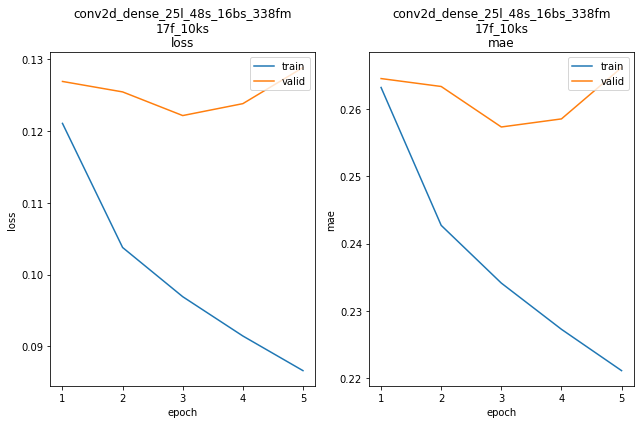

conv2d_dense_25l_48s_16bs_338fm_17f_10ks train min loss: 0.086602	mae: 0.221114	epoch: 5
conv2d_dense_25l_48s_16bs_338fm_17f_10ks valid min loss: 0.122162	mae: 0.257351	epoch: 3

conv2d_dense_25l_48s_16bs_338fm_17f_10ks
Iteration No: 6 ended. Evaluation done at random point.
Time taken: 357.0092
Function value obtained: 0.1222
Current minimum: 0.1208
Iteration No: 7 started. Evaluating function at random point.
feat_maps 243
lags 30
filters 63
kern_size 6
Epoch 1/5
11759/11759 [==============================] - 13s 1ms/step - loss: 1.6245 - mae: 0.8108


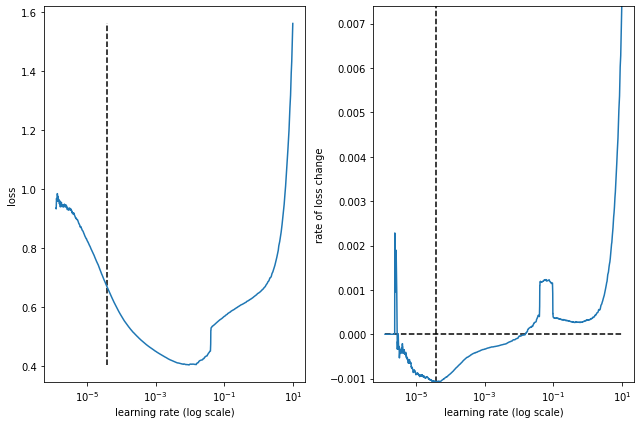

best lr: 3.8450053e-05 

Model: "conv2d_dense_30l_48s_16bs_243fm_63f_6ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_94 (Reshape)        (None, 30, 10, 1)         0         
                                                                 
 conv2d_6 (Conv2D)           (None, 30, 10, 63)        441       
                                                                 
 flatten_173 (Flatten)       (None, 18900)             0         
                                                                 
 dense_349 (Dense)           (None, 243)               4592943   
                                                                 
 dense_350 (Dense)           (None, 121)               29524     
                                                                 
 dense_351 (Dense)           (None, 48)                5856      
                                                                 
 r

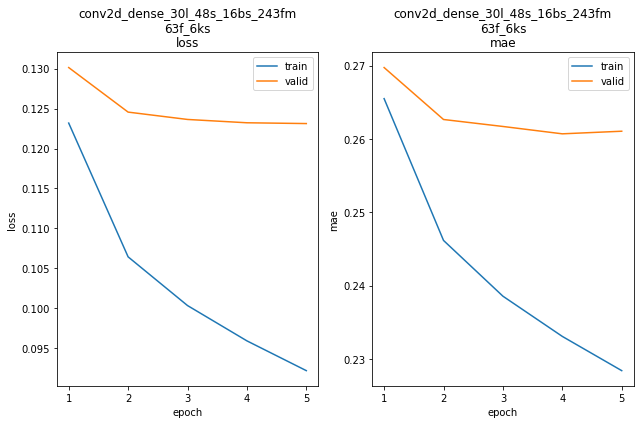

conv2d_dense_30l_48s_16bs_243fm_63f_6ks train min loss: 0.092191	mae: 0.228420	epoch: 5
conv2d_dense_30l_48s_16bs_243fm_63f_6ks valid min loss: 0.123130	mae: 0.261058	epoch: 5

conv2d_dense_30l_48s_16bs_243fm_63f_6ks
Iteration No: 7 ended. Evaluation done at random point.
Time taken: 326.8250
Function value obtained: 0.1231
Current minimum: 0.1208
Iteration No: 8 started. Evaluating function at random point.
feat_maps 105
lags 98
filters 34
kern_size 17
Epoch 1/5
11755/11755 [==============================] - 13s 1ms/step - loss: 1.9590 - mae: 0.8807


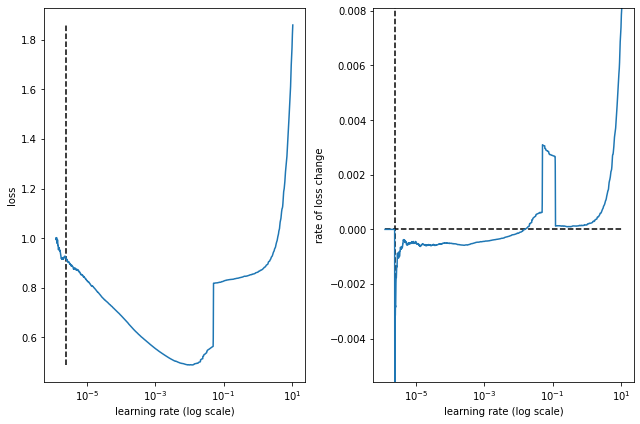

best lr: 2.4049968e-06 

Model: "conv2d_dense_98l_48s_16bs_105fm_34f_17ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_96 (Reshape)        (None, 98, 10, 1)         0         
                                                                 
 conv2d_7 (Conv2D)           (None, 98, 10, 34)        612       
                                                                 
 flatten_174 (Flatten)       (None, 33320)             0         
                                                                 
 dense_352 (Dense)           (None, 105)               3498705   
                                                                 
 dense_353 (Dense)           (None, 52)                5512      
                                                                 
 dense_354 (Dense)           (None, 48)                2544      
                                                                 
 

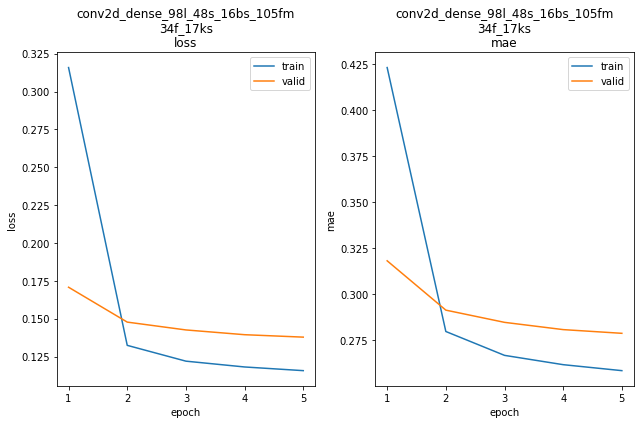

conv2d_dense_98l_48s_16bs_105fm_34f_17ks train min loss: 0.115690	mae: 0.258431	epoch: 5
conv2d_dense_98l_48s_16bs_105fm_34f_17ks valid min loss: 0.137817	mae: 0.278742	epoch: 5

conv2d_dense_98l_48s_16bs_105fm_34f_17ks
Iteration No: 8 ended. Evaluation done at random point.
Time taken: 287.5394
Function value obtained: 0.1378
Current minimum: 0.1208
Iteration No: 9 started. Evaluating function at random point.
feat_maps 273
lags 127
filters 49
kern_size 9
Epoch 1/5
11753/11753 [==============================] - 14s 1ms/step - loss: 32.8029 - mae: 0.6968


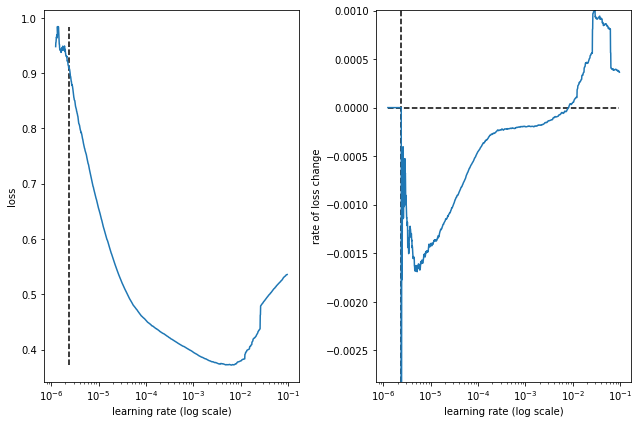

best lr: 2.405355e-06 

Model: "conv2d_dense_127l_48s_16bs_273fm_49f_9ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_98 (Reshape)        (None, 127, 10, 1)        0         
                                                                 
 conv2d_8 (Conv2D)           (None, 127, 10, 49)       490       
                                                                 
 flatten_175 (Flatten)       (None, 62230)             0         
                                                                 
 dense_355 (Dense)           (None, 273)               16989063  
                                                                 
 dense_356 (Dense)           (None, 136)               37264     
                                                                 
 dense_357 (Dense)           (None, 48)                6576      
                                                                 
 r

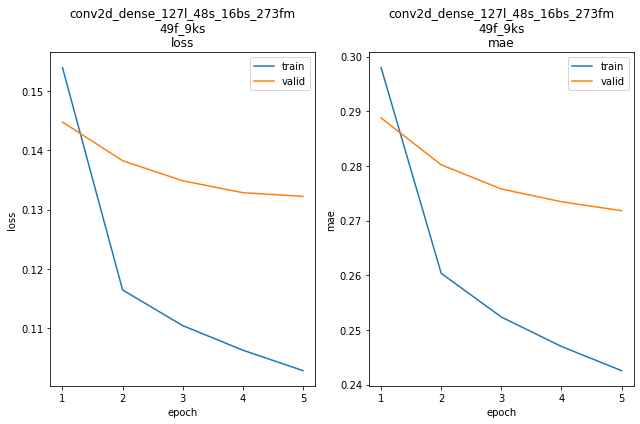

conv2d_dense_127l_48s_16bs_273fm_49f_9ks train min loss: 0.102909	mae: 0.242561	epoch: 5
conv2d_dense_127l_48s_16bs_273fm_49f_9ks valid min loss: 0.132223	mae: 0.271813	epoch: 5

conv2d_dense_127l_48s_16bs_273fm_49f_9ks
Iteration No: 9 ended. Evaluation done at random point.
Time taken: 422.2025
Function value obtained: 0.1322
Current minimum: 0.1208
Iteration No: 10 started. Evaluating function at random point.
feat_maps 70
lags 137
filters 43
kern_size 8
Epoch 1/5
11752/11752 [==============================] - 14s 1ms/step - loss: 2.2747 - mae: 0.9141


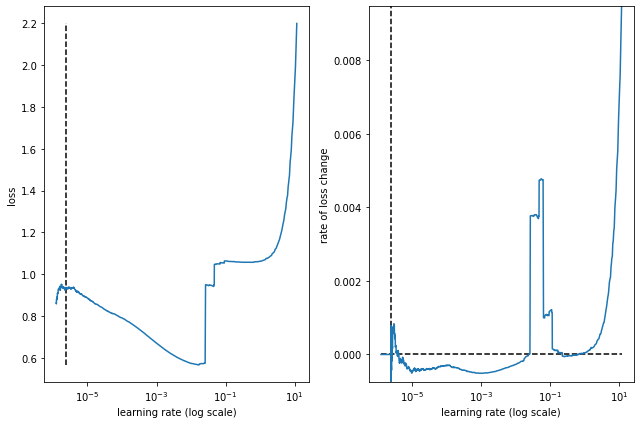

best lr: 2.4055353e-06 

Model: "conv2d_dense_137l_48s_16bs_70fm_43f_8ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_100 (Reshape)       (None, 137, 10, 1)        0         
                                                                 
 conv2d_9 (Conv2D)           (None, 137, 10, 43)       387       
                                                                 
 flatten_176 (Flatten)       (None, 58910)             0         
                                                                 
 dense_358 (Dense)           (None, 70)                4123770   
                                                                 
 dense_359 (Dense)           (None, 35)                2485      
                                                                 
 dense_360 (Dense)           (None, 48)                1728      
                                                                 
 r

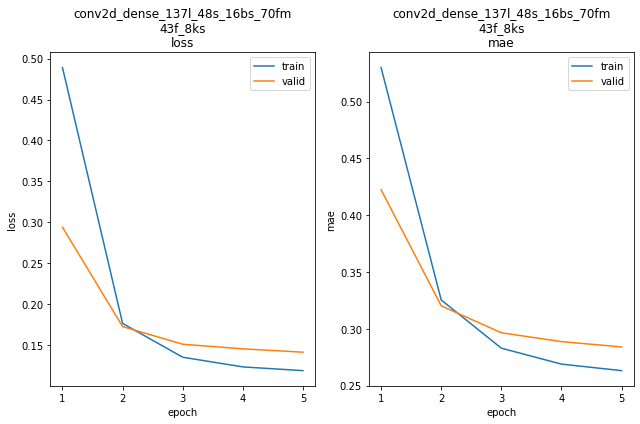

conv2d_dense_137l_48s_16bs_70fm_43f_8ks train min loss: 0.118817	mae: 0.263081	epoch: 5
conv2d_dense_137l_48s_16bs_70fm_43f_8ks valid min loss: 0.141348	mae: 0.283979	epoch: 5

conv2d_dense_137l_48s_16bs_70fm_43f_8ks
WARN: bad model conv2d_dense_137l_48s_16bs_70fm_43f_8ks
Iteration No: 10 ended. Evaluation done at random point.
Time taken: 325.4181
Function value obtained: 0.1413
Current minimum: 0.1208
Iteration No: 11 started. Evaluating function at random point.
feat_maps 71
lags 52
filters 28
kern_size 13
Epoch 1/5
11757/11757 [==============================] - 13s 1ms/step - loss: 2.2711 - mae: 0.9385


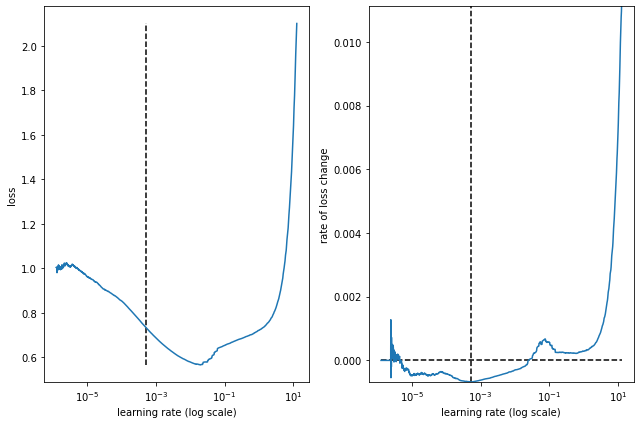

best lr: 0.00051650306 

Model: "conv2d_dense_52l_48s_16bs_71fm_28f_13ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_102 (Reshape)       (None, 52, 10, 1)         0         
                                                                 
 conv2d_10 (Conv2D)          (None, 52, 10, 28)        392       
                                                                 
 flatten_177 (Flatten)       (None, 14560)             0         
                                                                 
 dense_361 (Dense)           (None, 71)                1033831   
                                                                 
 dense_362 (Dense)           (None, 35)                2520      
                                                                 
 dense_363 (Dense)           (None, 48)                1728      
                                                                 
 r

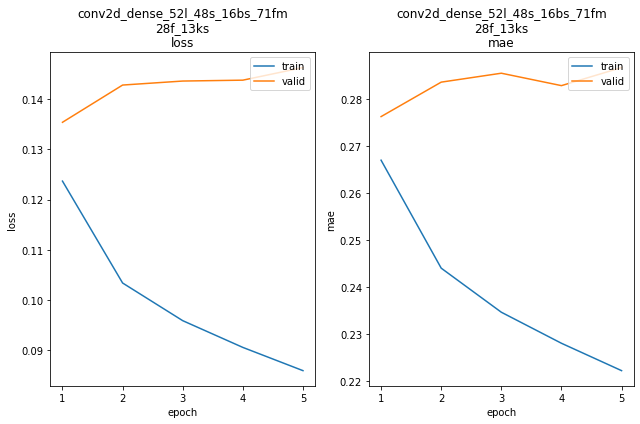

conv2d_dense_52l_48s_16bs_71fm_28f_13ks train min loss: 0.085988	mae: 0.222273	epoch: 5
conv2d_dense_52l_48s_16bs_71fm_28f_13ks valid min loss: 0.135394	mae: 0.276218	epoch: 1

conv2d_dense_52l_48s_16bs_71fm_28f_13ks
Iteration No: 11 ended. Evaluation done at random point.
Time taken: 330.0077
Function value obtained: 0.1354
Current minimum: 0.1208
Iteration No: 12 started. Evaluating function at random point.
feat_maps 512
lags 24
filters 16
kern_size 17
Epoch 1/5
11759/11759 [==============================] - 9s 695us/step - loss: 2.5392 - mae: 0.5859


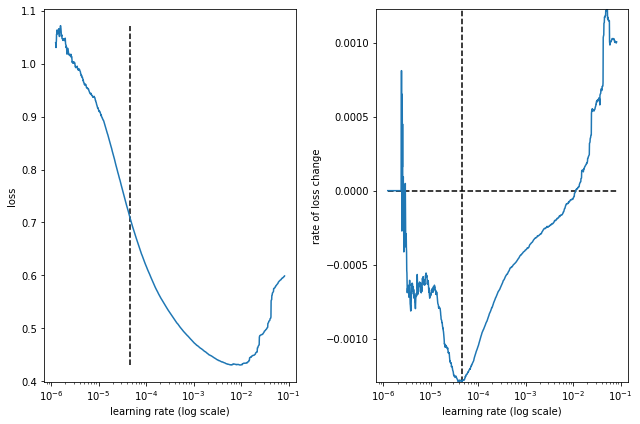

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_16f_17ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_104 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_11 (Conv2D)          (None, 24, 10, 16)        288       
                                                                 
 flatten_178 (Flatten)       (None, 3840)              0         
                                                                 
 dense_364 (Dense)           (None, 512)               1966592   
                                                                 
 dense_365 (Dense)           (None, 256)               131328    
                                                                 
 dense_366 (Dense)           (None, 48)                12336     
                                                                 
 

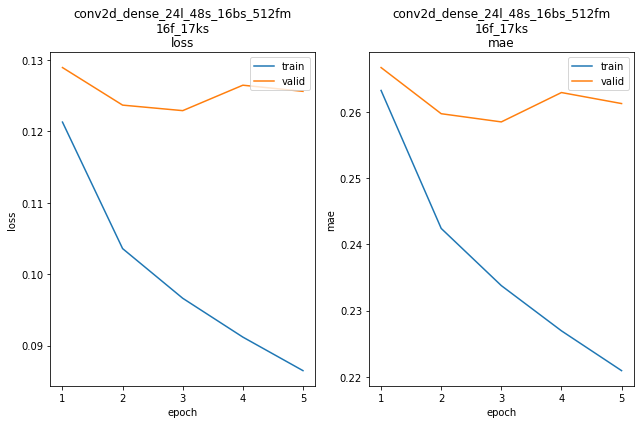

conv2d_dense_24l_48s_16bs_512fm_16f_17ks train min loss: 0.086506	mae: 0.220932	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_16f_17ks valid min loss: 0.122918	mae: 0.258485	epoch: 3

conv2d_dense_24l_48s_16bs_512fm_16f_17ks
Iteration No: 12 ended. Evaluation done at random point.
Time taken: 266.6940
Function value obtained: 0.1229
Current minimum: 0.1208
Iteration No: 13 started. Searching for the next optimal point.
feat_maps 506
lags 137
filters 16
kern_size 12
Epoch 1/5
11752/11752 [==============================] - 11s 899us/step - loss: 1.5595 - mae: 0.5440


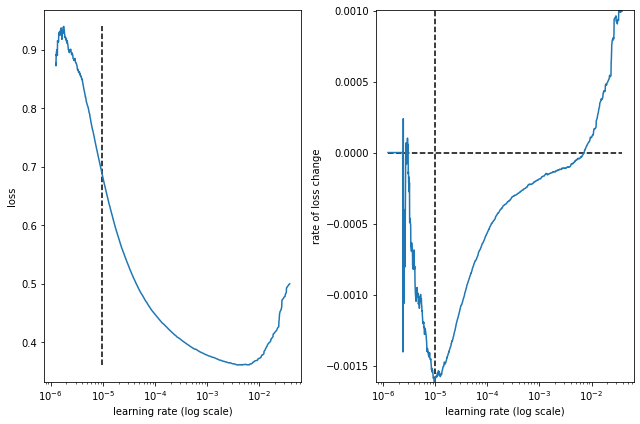

best lr: 9.798289e-06 

Model: "conv2d_dense_137l_48s_16bs_506fm_16f_12ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_106 (Reshape)       (None, 137, 10, 1)        0         
                                                                 
 conv2d_12 (Conv2D)          (None, 137, 10, 16)       208       
                                                                 
 flatten_179 (Flatten)       (None, 21920)             0         
                                                                 
 dense_367 (Dense)           (None, 506)               11092026  
                                                                 
 dense_368 (Dense)           (None, 253)               128271    
                                                                 
 dense_369 (Dense)           (None, 48)                12192     
                                                                 
 

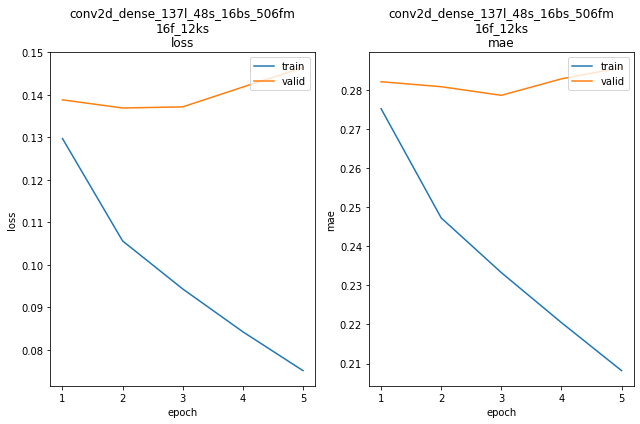

conv2d_dense_137l_48s_16bs_506fm_16f_12ks train min loss: 0.075086	mae: 0.208176	epoch: 5
conv2d_dense_137l_48s_16bs_506fm_16f_12ks valid min loss: 0.136929	mae: 0.280782	epoch: 2

conv2d_dense_137l_48s_16bs_506fm_16f_12ks
Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 385.2984
Function value obtained: 0.1369
Current minimum: 0.1208
Iteration No: 14 started. Searching for the next optimal point.
feat_maps 480
lags 77
filters 61
kern_size 16
Epoch 1/5
11756/11756 [==============================] - 22s 2ms/step - loss: 1.3021 - mae: 0.7288


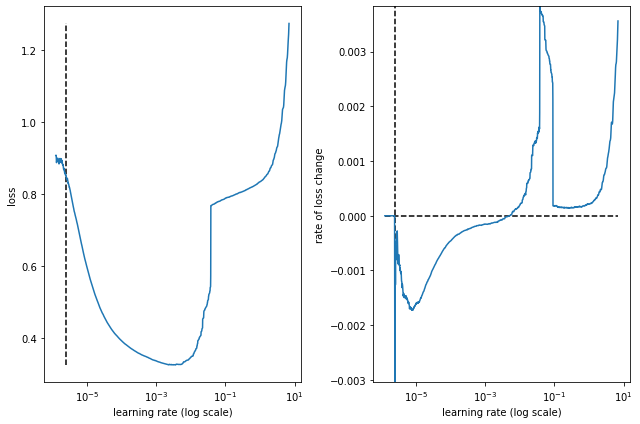

best lr: 2.4260112e-06 

Model: "conv2d_dense_77l_48s_16bs_480fm_61f_16ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_108 (Reshape)       (None, 77, 10, 1)         0         
                                                                 
 conv2d_13 (Conv2D)          (None, 77, 10, 61)        1037      
                                                                 
 flatten_180 (Flatten)       (None, 46970)             0         
                                                                 
 dense_370 (Dense)           (None, 480)               22546080  
                                                                 
 dense_371 (Dense)           (None, 240)               115440    
                                                                 
 dense_372 (Dense)           (None, 48)                11568     
                                                                 
 

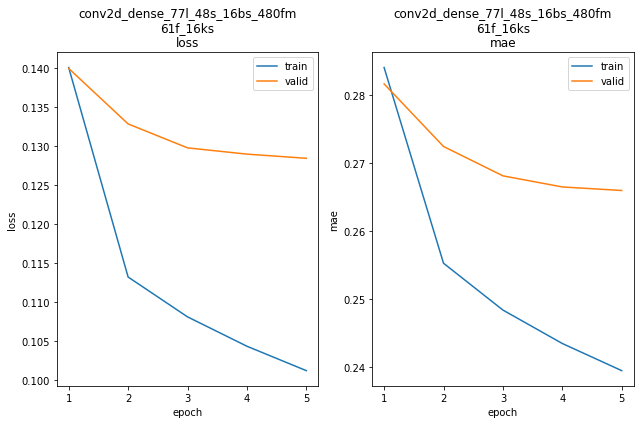

conv2d_dense_77l_48s_16bs_480fm_61f_16ks train min loss: 0.101205	mae: 0.239475	epoch: 5
conv2d_dense_77l_48s_16bs_480fm_61f_16ks valid min loss: 0.128446	mae: 0.265947	epoch: 5

conv2d_dense_77l_48s_16bs_480fm_61f_16ks
Iteration No: 14 ended. Search finished for the next optimal point.
Time taken: 432.6707
Function value obtained: 0.1284
Current minimum: 0.1208
Iteration No: 15 started. Searching for the next optimal point.
feat_maps 506
lags 67
filters 62
kern_size 16
Epoch 1/5
11756/11756 [==============================] - 22s 2ms/step - loss: 1.3487 - mae: 0.7539


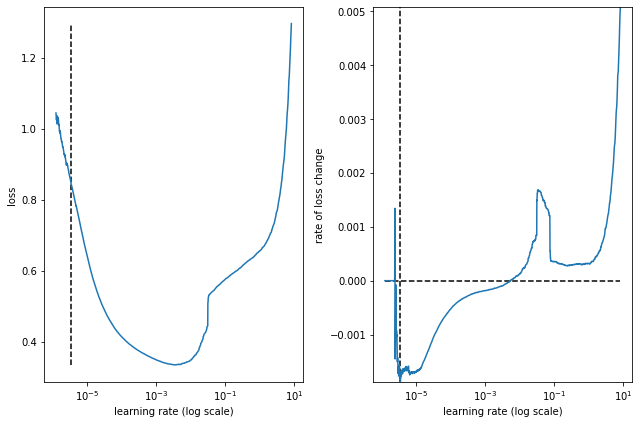

best lr: 3.476453e-06 

Model: "conv2d_dense_67l_48s_16bs_506fm_62f_16ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_110 (Reshape)       (None, 67, 10, 1)         0         
                                                                 
 conv2d_14 (Conv2D)          (None, 67, 10, 62)        1054      
                                                                 
 flatten_181 (Flatten)       (None, 41540)             0         
                                                                 
 dense_373 (Dense)           (None, 506)               21019746  
                                                                 
 dense_374 (Dense)           (None, 253)               128271    
                                                                 
 dense_375 (Dense)           (None, 48)                12192     
                                                                 
 r

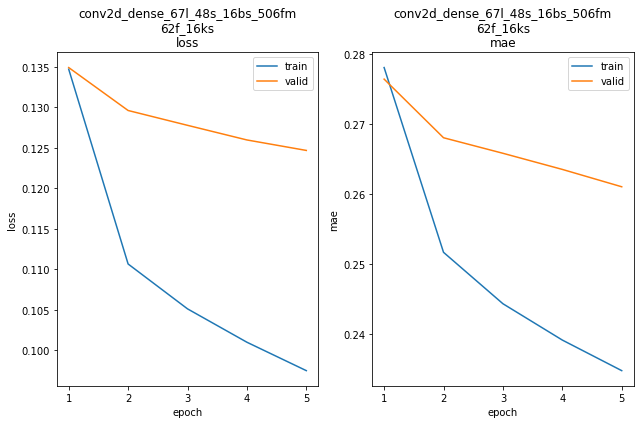

conv2d_dense_67l_48s_16bs_506fm_62f_16ks train min loss: 0.097496	mae: 0.234813	epoch: 5
conv2d_dense_67l_48s_16bs_506fm_62f_16ks valid min loss: 0.124691	mae: 0.261059	epoch: 5

conv2d_dense_67l_48s_16bs_506fm_62f_16ks
Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 431.0149
Function value obtained: 0.1247
Current minimum: 0.1208
Iteration No: 16 started. Searching for the next optimal point.
feat_maps 501
lags 143
filters 62
kern_size 15
Epoch 1/5
11752/11752 [==============================] - 25s 2ms/step - loss: 11.9549 - mae: 0.6244


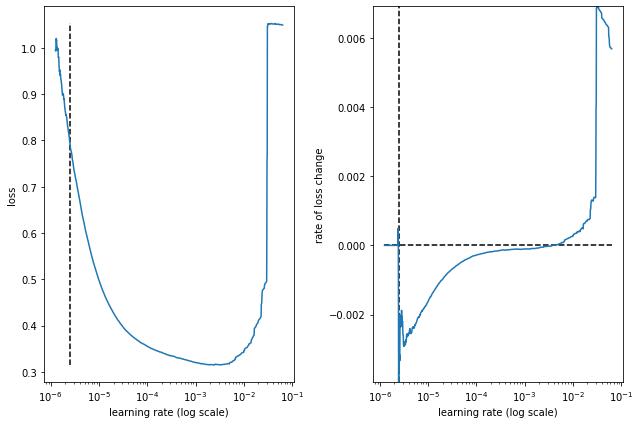

best lr: 2.4481383e-06 

Model: "conv2d_dense_143l_48s_16bs_501fm_62f_15ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_112 (Reshape)       (None, 143, 10, 1)        0         
                                                                 
 conv2d_15 (Conv2D)          (None, 143, 10, 62)       992       
                                                                 
 flatten_182 (Flatten)       (None, 88660)             0         
                                                                 
 dense_376 (Dense)           (None, 501)               44419161  
                                                                 
 dense_377 (Dense)           (None, 250)               125500    
                                                                 
 dense_378 (Dense)           (None, 48)                12048     
                                                                 


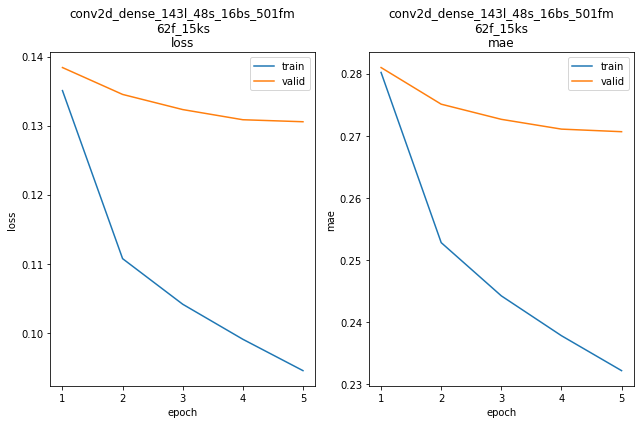

conv2d_dense_143l_48s_16bs_501fm_62f_15ks train min loss: 0.094511	mae: 0.232211	epoch: 5
conv2d_dense_143l_48s_16bs_501fm_62f_15ks valid min loss: 0.130565	mae: 0.270658	epoch: 5

conv2d_dense_143l_48s_16bs_501fm_62f_15ks
Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 714.7298
Function value obtained: 0.1306
Current minimum: 0.1208
Iteration No: 17 started. Searching for the next optimal point.
feat_maps 505
lags 58
filters 16
kern_size 14
Epoch 1/5
11757/11757 [==============================] - 15s 1ms/step - loss: 1.5387 - mae: 0.7939


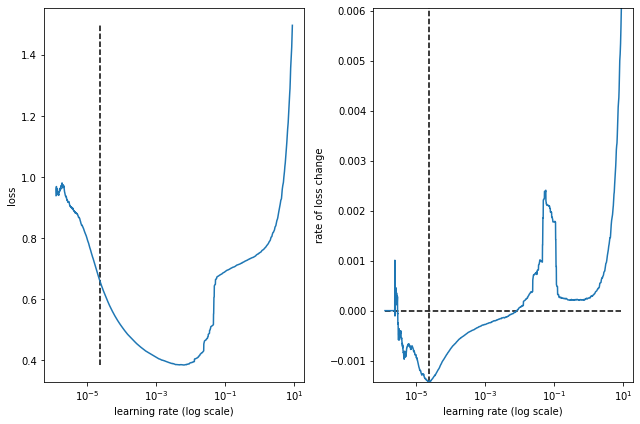

best lr: 2.3332866e-05 

Model: "conv2d_dense_58l_48s_16bs_505fm_16f_14ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_114 (Reshape)       (None, 58, 10, 1)         0         
                                                                 
 conv2d_16 (Conv2D)          (None, 58, 10, 16)        240       
                                                                 
 flatten_183 (Flatten)       (None, 9280)              0         
                                                                 
 dense_379 (Dense)           (None, 505)               4686905   
                                                                 
 dense_380 (Dense)           (None, 252)               127512    
                                                                 
 dense_381 (Dense)           (None, 48)                12144     
                                                                 
 

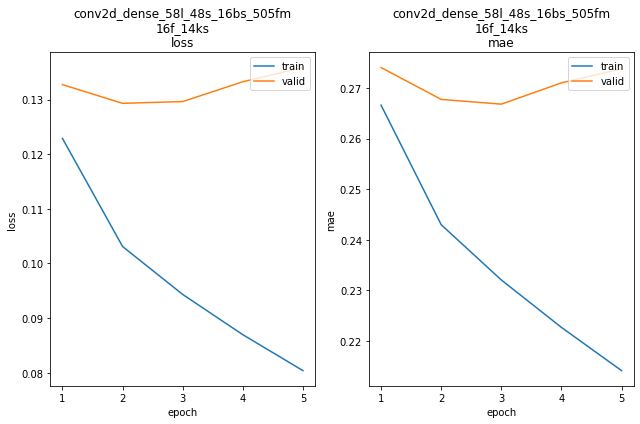

conv2d_dense_58l_48s_16bs_505fm_16f_14ks train min loss: 0.080376	mae: 0.214143	epoch: 5
conv2d_dense_58l_48s_16bs_505fm_16f_14ks valid min loss: 0.129325	mae: 0.267751	epoch: 2

conv2d_dense_58l_48s_16bs_505fm_16f_14ks
Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 325.9379
Function value obtained: 0.1293
Current minimum: 0.1208
Iteration No: 18 started. Searching for the next optimal point.
feat_maps 511
lags 24
filters 34
kern_size 14
Epoch 1/5
11759/11759 [==============================] - 10s 790us/step - loss: 1.9874 - mae: 0.5524


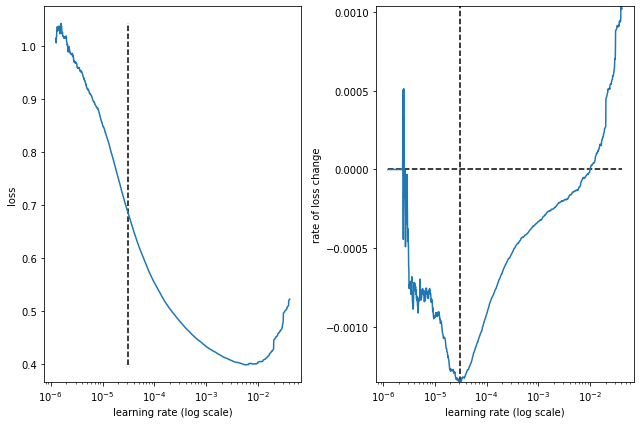

best lr: 3.060842e-05 

Model: "conv2d_dense_24l_48s_16bs_511fm_34f_14ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_116 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_17 (Conv2D)          (None, 24, 10, 34)        510       
                                                                 
 flatten_184 (Flatten)       (None, 8160)              0         
                                                                 
 dense_382 (Dense)           (None, 511)               4170271   
                                                                 
 dense_383 (Dense)           (None, 255)               130560    
                                                                 
 dense_384 (Dense)           (None, 48)                12288     
                                                                 
 r

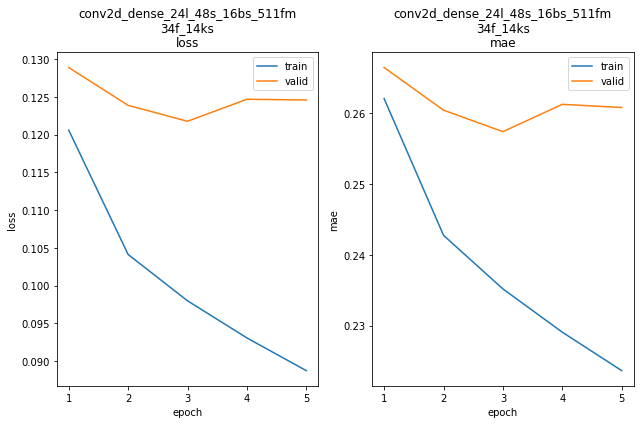

conv2d_dense_24l_48s_16bs_511fm_34f_14ks train min loss: 0.088736	mae: 0.223652	epoch: 5
conv2d_dense_24l_48s_16bs_511fm_34f_14ks valid min loss: 0.121774	mae: 0.257382	epoch: 3

conv2d_dense_24l_48s_16bs_511fm_34f_14ks
Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 313.8178
Function value obtained: 0.1218
Current minimum: 0.1208
Iteration No: 19 started. Searching for the next optimal point.
feat_maps 506
lags 116
filters 24
kern_size 5
Epoch 1/5
11753/11753 [==============================] - 13s 1ms/step - loss: 5.1514 - mae: 0.5802


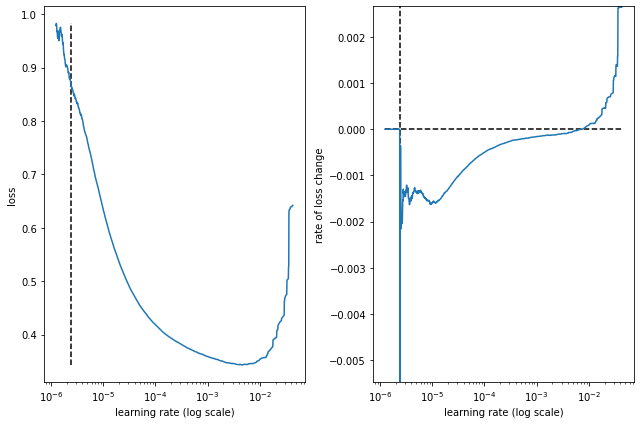

best lr: 2.405355e-06 

Model: "conv2d_dense_116l_48s_16bs_506fm_24f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_118 (Reshape)       (None, 116, 10, 1)        0         
                                                                 
 conv2d_18 (Conv2D)          (None, 116, 10, 24)       144       
                                                                 
 flatten_185 (Flatten)       (None, 27840)             0         
                                                                 
 dense_385 (Dense)           (None, 506)               14087546  
                                                                 
 dense_386 (Dense)           (None, 253)               128271    
                                                                 
 dense_387 (Dense)           (None, 48)                12192     
                                                                 
 r

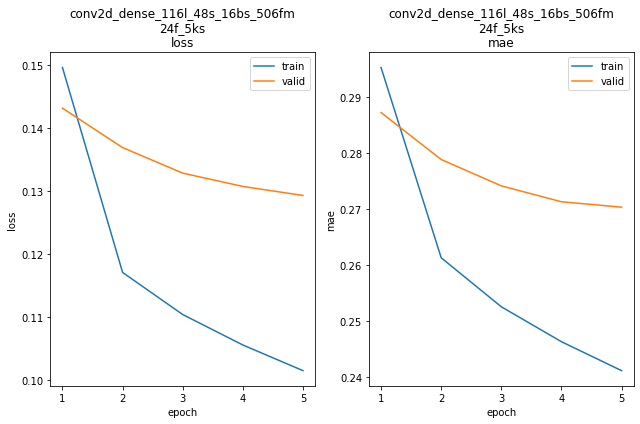

conv2d_dense_116l_48s_16bs_506fm_24f_5ks train min loss: 0.101557	mae: 0.241217	epoch: 5
conv2d_dense_116l_48s_16bs_506fm_24f_5ks valid min loss: 0.129305	mae: 0.270345	epoch: 5

conv2d_dense_116l_48s_16bs_506fm_24f_5ks
Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 413.1734
Function value obtained: 0.1293
Current minimum: 0.1208
Iteration No: 20 started. Searching for the next optimal point.
feat_maps 65
lags 86
filters 50
kern_size 3
Epoch 1/5
11755/11755 [==============================] - 14s 1ms/step - loss: 2.3308 - mae: 0.9517


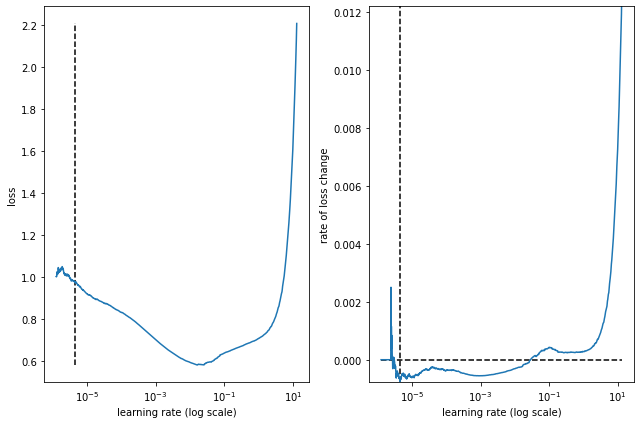

best lr: 4.445234e-06 

Model: "conv2d_dense_86l_48s_16bs_65fm_50f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_120 (Reshape)       (None, 86, 10, 1)         0         
                                                                 
 conv2d_19 (Conv2D)          (None, 86, 10, 50)        200       
                                                                 
 flatten_186 (Flatten)       (None, 43000)             0         
                                                                 
 dense_388 (Dense)           (None, 65)                2795065   
                                                                 
 dense_389 (Dense)           (None, 32)                2112      
                                                                 
 dense_390 (Dense)           (None, 48)                1584      
                                                                 
 res

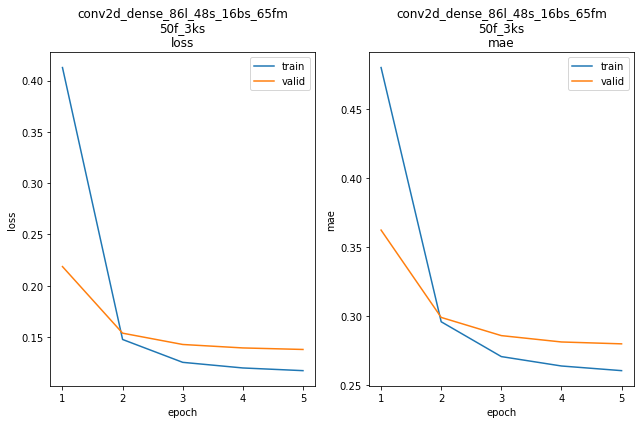

conv2d_dense_86l_48s_16bs_65fm_50f_3ks train min loss: 0.117154	mae: 0.260235	epoch: 5
conv2d_dense_86l_48s_16bs_65fm_50f_3ks valid min loss: 0.137816	mae: 0.279705	epoch: 5

conv2d_dense_86l_48s_16bs_65fm_50f_3ks
Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 355.4956
Function value obtained: 0.1378
Current minimum: 0.1208
Iteration No: 21 started. Searching for the next optimal point.
feat_maps 80
lags 70
filters 16
kern_size 5
Epoch 1/5
11756/11756 [==============================] - 11s 864us/step - loss: 88.6087 - mae: 0.8017


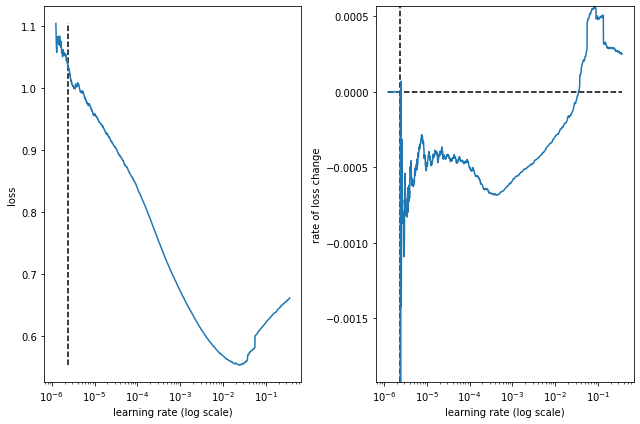

best lr: 2.4260112e-06 

Model: "conv2d_dense_70l_48s_16bs_80fm_16f_5ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_122 (Reshape)       (None, 70, 10, 1)         0         
                                                                 
 conv2d_20 (Conv2D)          (None, 70, 10, 16)        96        
                                                                 
 flatten_187 (Flatten)       (None, 11200)             0         
                                                                 
 dense_391 (Dense)           (None, 80)                896080    
                                                                 
 dense_392 (Dense)           (None, 40)                3240      
                                                                 
 dense_393 (Dense)           (None, 48)                1968      
                                                                 
 re

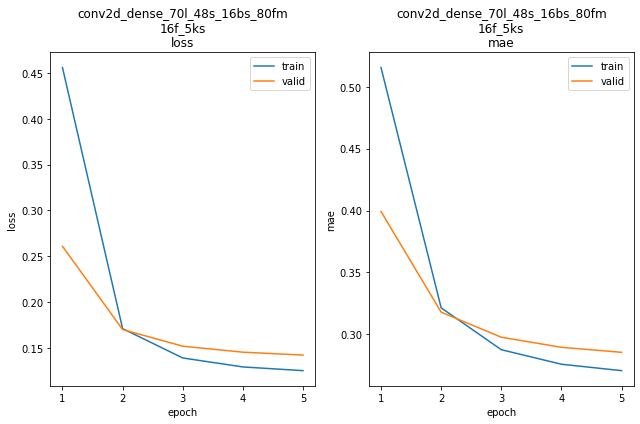

conv2d_dense_70l_48s_16bs_80fm_16f_5ks train min loss: 0.125060	mae: 0.270649	epoch: 5
conv2d_dense_70l_48s_16bs_80fm_16f_5ks valid min loss: 0.142059	mae: 0.285457	epoch: 5

conv2d_dense_70l_48s_16bs_80fm_16f_5ks
WARN: bad model conv2d_dense_70l_48s_16bs_80fm_16f_5ks
Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 274.7012
Function value obtained: 0.1421
Current minimum: 0.1208
Iteration No: 22 started. Searching for the next optimal point.
feat_maps 508
lags 108
filters 64
kern_size 16
Epoch 1/5
11754/11754 [==============================] - 30s 2ms/step - loss: 1.3086 - mae: 0.7544


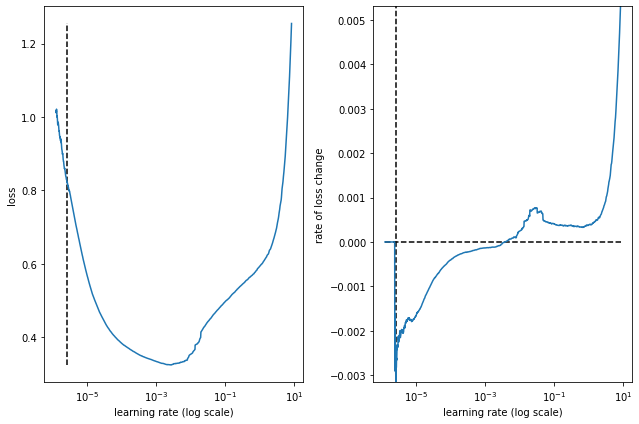

best lr: 2.5801126e-06 

Model: "conv2d_dense_108l_48s_16bs_508fm_64f_16ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_124 (Reshape)       (None, 108, 10, 1)        0         
                                                                 
 conv2d_21 (Conv2D)          (None, 108, 10, 64)       1088      
                                                                 
 flatten_188 (Flatten)       (None, 69120)             0         
                                                                 
 dense_394 (Dense)           (None, 508)               35113468  
                                                                 
 dense_395 (Dense)           (None, 254)               129286    
                                                                 
 dense_396 (Dense)           (None, 48)                12240     
                                                                 


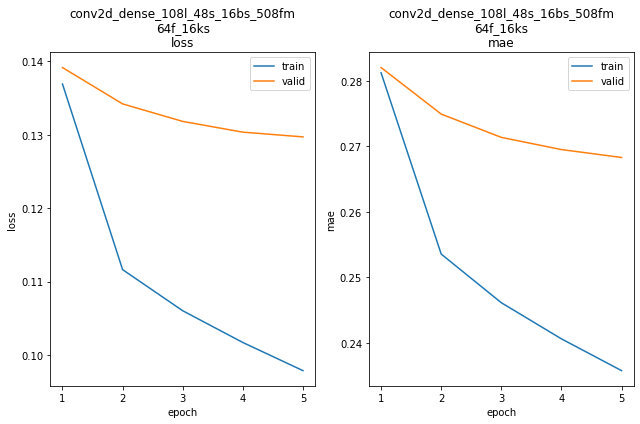

conv2d_dense_108l_48s_16bs_508fm_64f_16ks train min loss: 0.097848	mae: 0.235776	epoch: 5
conv2d_dense_108l_48s_16bs_508fm_64f_16ks valid min loss: 0.129717	mae: 0.268291	epoch: 5

conv2d_dense_108l_48s_16bs_508fm_64f_16ks
Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 699.2054
Function value obtained: 0.1297
Current minimum: 0.1208
Iteration No: 23 started. Searching for the next optimal point.
feat_maps 424
lags 24
filters 25
kern_size 3
Epoch 1/5
11759/11759 [==============================] - 11s 873us/step - loss: 19.4217 - mae: 0.6388


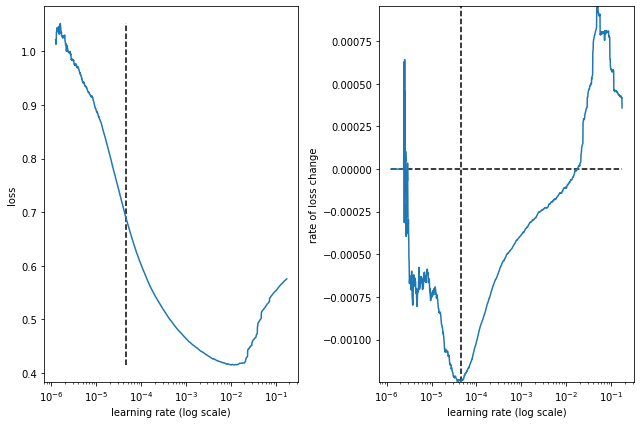

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_424fm_25f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_126 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_22 (Conv2D)          (None, 24, 10, 25)        100       
                                                                 
 flatten_189 (Flatten)       (None, 6000)              0         
                                                                 
 dense_397 (Dense)           (None, 424)               2544424   
                                                                 
 dense_398 (Dense)           (None, 212)               90100     
                                                                 
 dense_399 (Dense)           (None, 48)                10224     
                                                                 
 r

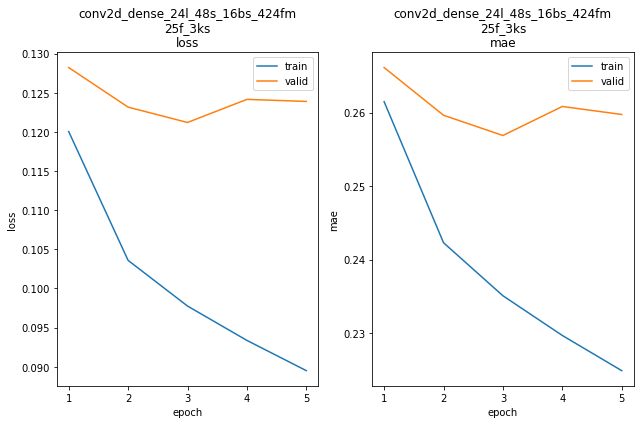

conv2d_dense_24l_48s_16bs_424fm_25f_3ks train min loss: 0.089496	mae: 0.224866	epoch: 5
conv2d_dense_24l_48s_16bs_424fm_25f_3ks valid min loss: 0.121212	mae: 0.256883	epoch: 3

conv2d_dense_24l_48s_16bs_424fm_25f_3ks
Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 323.4597
Function value obtained: 0.1212
Current minimum: 0.1208
Iteration No: 24 started. Searching for the next optimal point.
feat_maps 76
lags 24
filters 49
kern_size 9
Epoch 1/5
11759/11759 [==============================] - 15s 1ms/step - loss: 2.2283 - mae: 0.9280


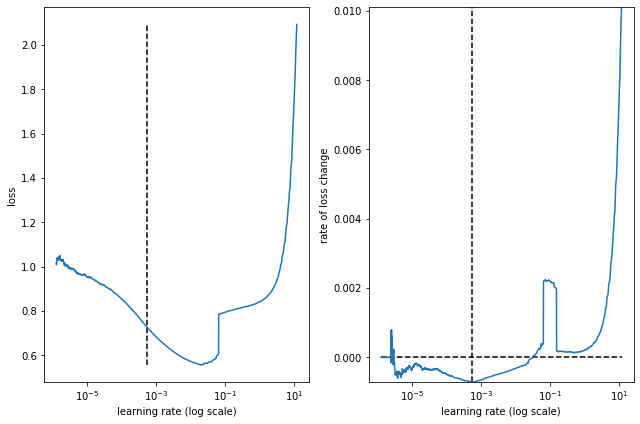

best lr: 0.00054383953 

Model: "conv2d_dense_24l_48s_16bs_76fm_49f_9ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_128 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_23 (Conv2D)          (None, 24, 10, 49)        490       
                                                                 
 flatten_190 (Flatten)       (None, 11760)             0         
                                                                 
 dense_400 (Dense)           (None, 76)                893836    
                                                                 
 dense_401 (Dense)           (None, 38)                2926      
                                                                 
 dense_402 (Dense)           (None, 48)                1872      
                                                                 
 re

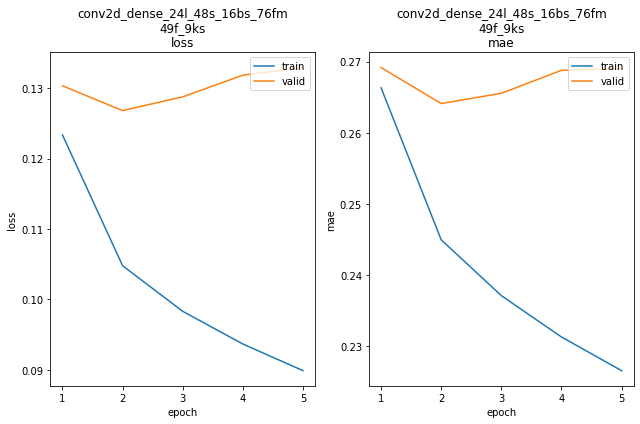

conv2d_dense_24l_48s_16bs_76fm_49f_9ks train min loss: 0.089870	mae: 0.226517	epoch: 5
conv2d_dense_24l_48s_16bs_76fm_49f_9ks valid min loss: 0.126834	mae: 0.264109	epoch: 2

conv2d_dense_24l_48s_16bs_76fm_49f_9ks
Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 320.3781
Function value obtained: 0.1268
Current minimum: 0.1208
Iteration No: 25 started. Searching for the next optimal point.
feat_maps 501
lags 90
filters 16
kern_size 16
Epoch 1/5
11755/11755 [==============================] - 16s 1ms/step - loss: 1.5169 - mae: 0.7941


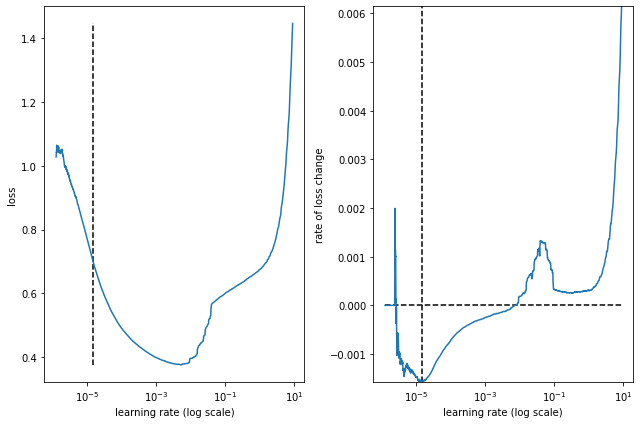

best lr: 1.4281594e-05 

Model: "conv2d_dense_90l_48s_16bs_501fm_16f_16ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_130 (Reshape)       (None, 90, 10, 1)         0         
                                                                 
 conv2d_24 (Conv2D)          (None, 90, 10, 16)        272       
                                                                 
 flatten_191 (Flatten)       (None, 14400)             0         
                                                                 
 dense_403 (Dense)           (None, 501)               7214901   
                                                                 
 dense_404 (Dense)           (None, 250)               125500    
                                                                 
 dense_405 (Dense)           (None, 48)                12048     
                                                                 
 

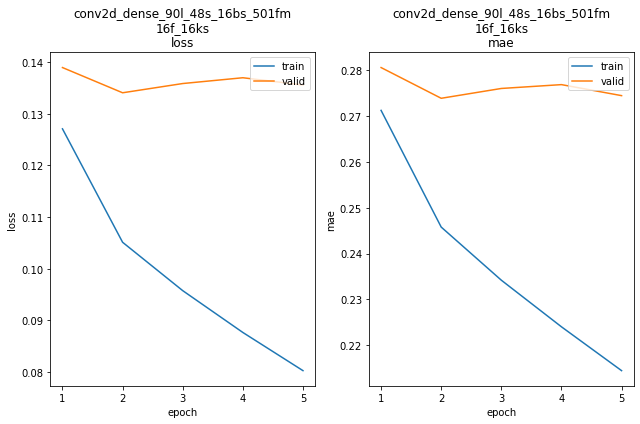

conv2d_dense_90l_48s_16bs_501fm_16f_16ks train min loss: 0.080258	mae: 0.214437	epoch: 5
conv2d_dense_90l_48s_16bs_501fm_16f_16ks valid min loss: 0.134085	mae: 0.273881	epoch: 2

conv2d_dense_90l_48s_16bs_501fm_16f_16ks
Iteration No: 25 ended. Search finished for the next optimal point.
Time taken: 284.7689
Function value obtained: 0.1341
Current minimum: 0.1208
Iteration No: 26 started. Searching for the next optimal point.
feat_maps 500
lags 37
filters 63
kern_size 14
Epoch 1/5
11758/11758 [==============================] - 18s 1ms/step - loss: 1.4387 - mae: 0.7726


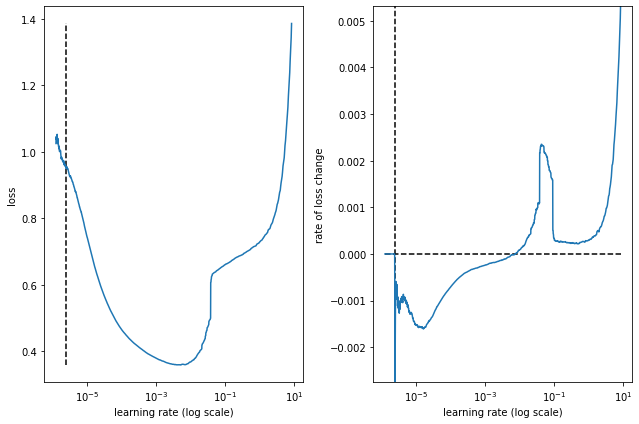

best lr: 2.4470207e-06 

Model: "conv2d_dense_37l_48s_16bs_500fm_63f_14ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_132 (Reshape)       (None, 37, 10, 1)         0         
                                                                 
 conv2d_25 (Conv2D)          (None, 37, 10, 63)        945       
                                                                 
 flatten_192 (Flatten)       (None, 23310)             0         
                                                                 
 dense_406 (Dense)           (None, 500)               11655500  
                                                                 
 dense_407 (Dense)           (None, 250)               125250    
                                                                 
 dense_408 (Dense)           (None, 48)                12048     
                                                                 
 

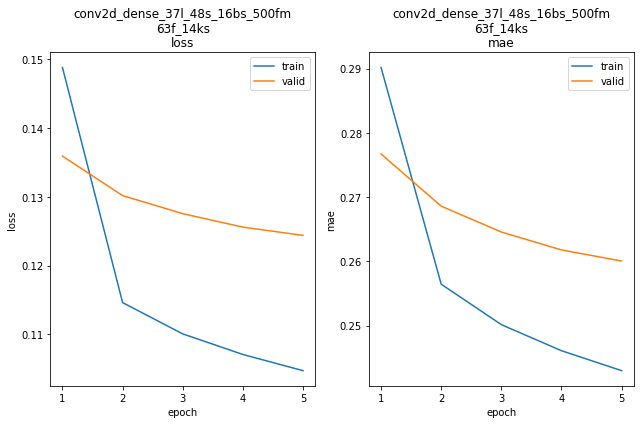

conv2d_dense_37l_48s_16bs_500fm_63f_14ks train min loss: 0.104709	mae: 0.242998	epoch: 5
conv2d_dense_37l_48s_16bs_500fm_63f_14ks valid min loss: 0.124387	mae: 0.260054	epoch: 5

conv2d_dense_37l_48s_16bs_500fm_63f_14ks
Iteration No: 26 ended. Search finished for the next optimal point.
Time taken: 359.4687
Function value obtained: 0.1244
Current minimum: 0.1208
Iteration No: 27 started. Searching for the next optimal point.
feat_maps 508
lags 124
filters 64
kern_size 3
Epoch 1/5
11753/11753 [==============================] - 25s 2ms/step - loss: 84.1999 - mae: 0.7750


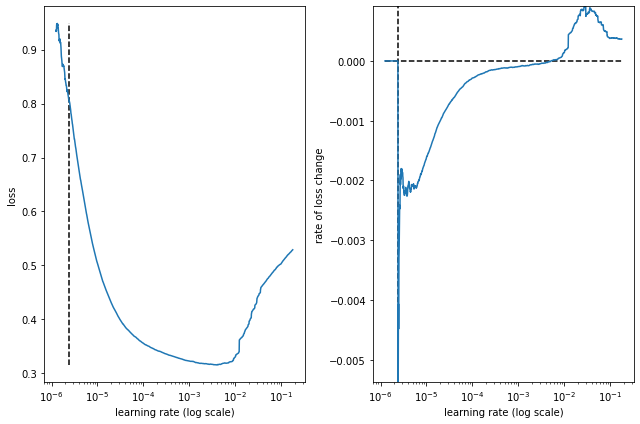

best lr: 2.405355e-06 

Model: "conv2d_dense_124l_48s_16bs_508fm_64f_3ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_134 (Reshape)       (None, 124, 10, 1)        0         
                                                                 
 conv2d_26 (Conv2D)          (None, 124, 10, 64)       256       
                                                                 
 flatten_193 (Flatten)       (None, 79360)             0         
                                                                 
 dense_409 (Dense)           (None, 508)               40315388  
                                                                 
 dense_410 (Dense)           (None, 254)               129286    
                                                                 
 dense_411 (Dense)           (None, 48)                12240     
                                                                 
 r

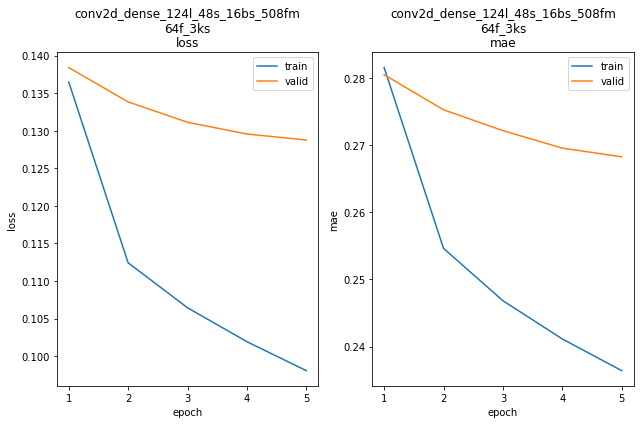

conv2d_dense_124l_48s_16bs_508fm_64f_3ks train min loss: 0.098069	mae: 0.236422	epoch: 5
conv2d_dense_124l_48s_16bs_508fm_64f_3ks valid min loss: 0.128774	mae: 0.268260	epoch: 5

conv2d_dense_124l_48s_16bs_508fm_64f_3ks
Iteration No: 27 ended. Search finished for the next optimal point.
Time taken: 706.1190
Function value obtained: 0.1288
Current minimum: 0.1208
Iteration No: 28 started. Searching for the next optimal point.
feat_maps 81
lags 116
filters 63
kern_size 15
Epoch 1/5
11753/11753 [==============================] - 12s 948us/step - loss: 173.1030 - mae: 0.9497


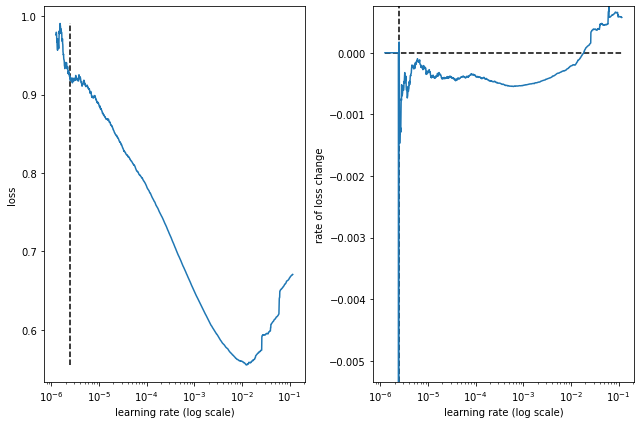

best lr: 2.405355e-06 

Model: "conv2d_dense_116l_48s_16bs_81fm_63f_15ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_136 (Reshape)       (None, 116, 10, 1)        0         
                                                                 
 conv2d_27 (Conv2D)          (None, 116, 10, 63)       1008      
                                                                 
 flatten_194 (Flatten)       (None, 73080)             0         
                                                                 
 dense_412 (Dense)           (None, 81)                5919561   
                                                                 
 dense_413 (Dense)           (None, 40)                3280      
                                                                 
 dense_414 (Dense)           (None, 48)                1968      
                                                                 
 r

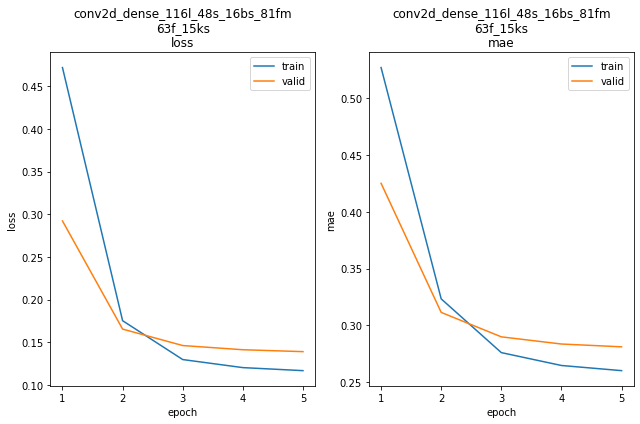

conv2d_dense_116l_48s_16bs_81fm_63f_15ks train min loss: 0.116752	mae: 0.260126	epoch: 5
conv2d_dense_116l_48s_16bs_81fm_63f_15ks valid min loss: 0.139012	mae: 0.281100	epoch: 5

conv2d_dense_116l_48s_16bs_81fm_63f_15ks
WARN: bad model conv2d_dense_116l_48s_16bs_81fm_63f_15ks
Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 340.0752
Function value obtained: 0.1390
Current minimum: 0.1208
Iteration No: 29 started. Searching for the next optimal point.
feat_maps 277
lags 63
filters 64
kern_size 12
Epoch 1/5
11757/11757 [==============================] - 18s 1ms/step - loss: 1.4808 - mae: 0.7896


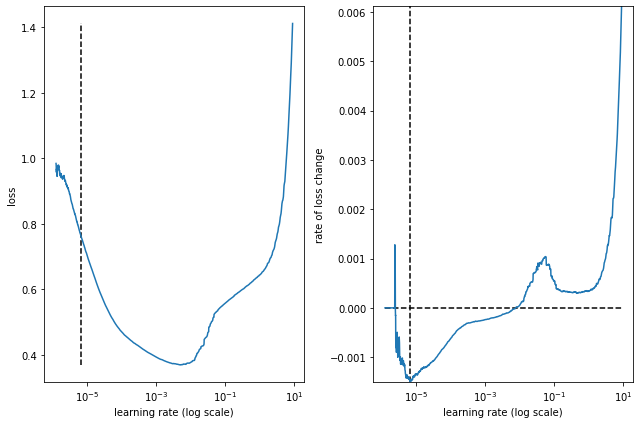

best lr: 6.771548e-06 

Model: "conv2d_dense_63l_48s_16bs_277fm_64f_12ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_138 (Reshape)       (None, 63, 10, 1)         0         
                                                                 
 conv2d_28 (Conv2D)          (None, 63, 10, 64)        832       
                                                                 
 flatten_195 (Flatten)       (None, 40320)             0         
                                                                 
 dense_415 (Dense)           (None, 277)               11168917  
                                                                 
 dense_416 (Dense)           (None, 138)               38364     
                                                                 
 dense_417 (Dense)           (None, 48)                6672      
                                                                 
 r

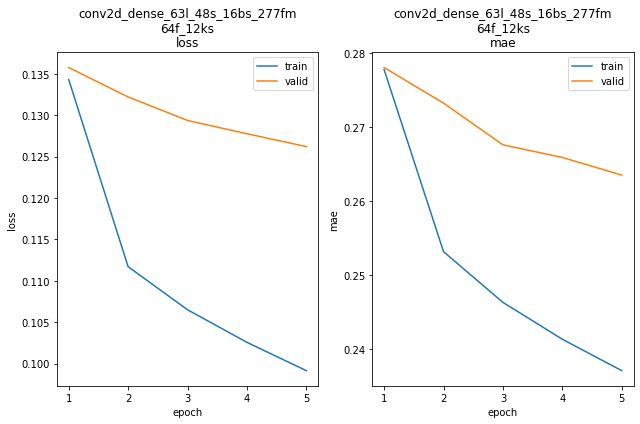

conv2d_dense_63l_48s_16bs_277fm_64f_12ks train min loss: 0.099153	mae: 0.237067	epoch: 5
conv2d_dense_63l_48s_16bs_277fm_64f_12ks valid min loss: 0.126220	mae: 0.263492	epoch: 5

conv2d_dense_63l_48s_16bs_277fm_64f_12ks
Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 369.8949
Function value obtained: 0.1262
Current minimum: 0.1208
Iteration No: 30 started. Searching for the next optimal point.
feat_maps 317
lags 95
filters 63
kern_size 12
Epoch 1/5
11755/11755 [==============================] - 15s 1ms/step - loss: 1.4316 - mae: 0.5513


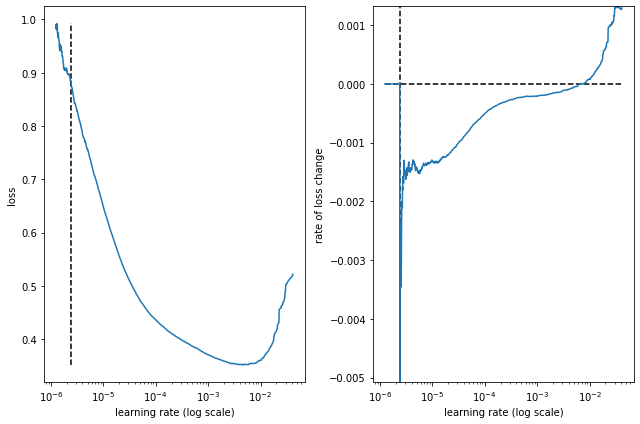

best lr: 2.4049968e-06 

Model: "conv2d_dense_95l_48s_16bs_317fm_63f_12ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_140 (Reshape)       (None, 95, 10, 1)         0         
                                                                 
 conv2d_29 (Conv2D)          (None, 95, 10, 63)        819       
                                                                 
 flatten_196 (Flatten)       (None, 59850)             0         
                                                                 
 dense_418 (Dense)           (None, 317)               18972767  
                                                                 
 dense_419 (Dense)           (None, 158)               50244     
                                                                 
 dense_420 (Dense)           (None, 48)                7632      
                                                                 
 

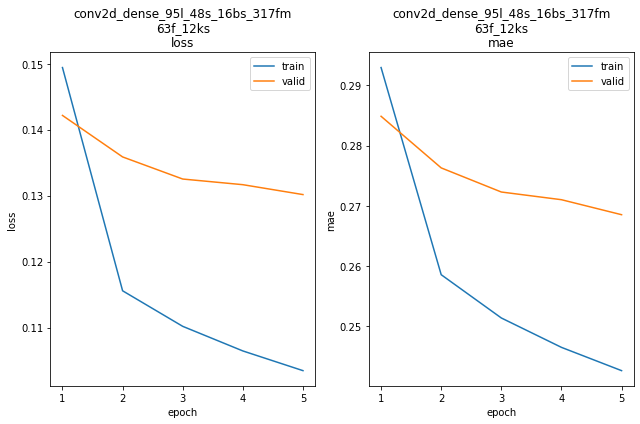

conv2d_dense_95l_48s_16bs_317fm_63f_12ks train min loss: 0.103488	mae: 0.242614	epoch: 5
conv2d_dense_95l_48s_16bs_317fm_63f_12ks valid min loss: 0.130168	mae: 0.268522	epoch: 5

conv2d_dense_95l_48s_16bs_317fm_63f_12ks
Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 401.9637
Function value obtained: 0.1302
Current minimum: 0.1208
Iteration No: 31 started. Searching for the next optimal point.
feat_maps 65
lags 28
filters 16
kern_size 9
Epoch 1/5
11759/11759 [==============================] - 15s 1ms/step - loss: 2.4124 - mae: 0.9626


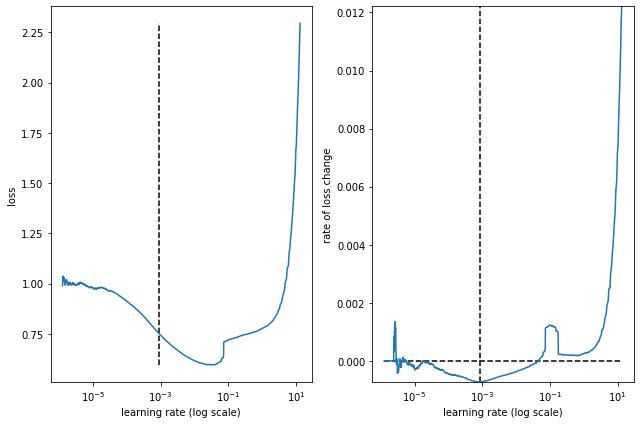

best lr: 0.000858189 

Model: "conv2d_dense_28l_48s_16bs_65fm_16f_9ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_142 (Reshape)       (None, 28, 10, 1)         0         
                                                                 
 conv2d_30 (Conv2D)          (None, 28, 10, 16)        160       
                                                                 
 flatten_197 (Flatten)       (None, 4480)              0         
                                                                 
 dense_421 (Dense)           (None, 65)                291265    
                                                                 
 dense_422 (Dense)           (None, 32)                2112      
                                                                 
 dense_423 (Dense)           (None, 48)                1584      
                                                                 
 resh

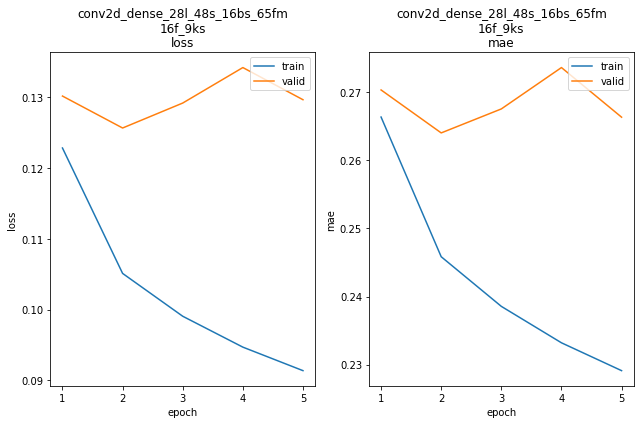

conv2d_dense_28l_48s_16bs_65fm_16f_9ks train min loss: 0.091378	mae: 0.229126	epoch: 5
conv2d_dense_28l_48s_16bs_65fm_16f_9ks valid min loss: 0.125641	mae: 0.264033	epoch: 2

conv2d_dense_28l_48s_16bs_65fm_16f_9ks
Iteration No: 31 ended. Search finished for the next optimal point.
Time taken: 280.1264
Function value obtained: 0.1256
Current minimum: 0.1208
Iteration No: 32 started. Searching for the next optimal point.
feat_maps 65
lags 46
filters 64
kern_size 11
Epoch 1/5
11758/11758 [==============================] - 10s 826us/step - loss: 2.3668 - mae: 0.6341


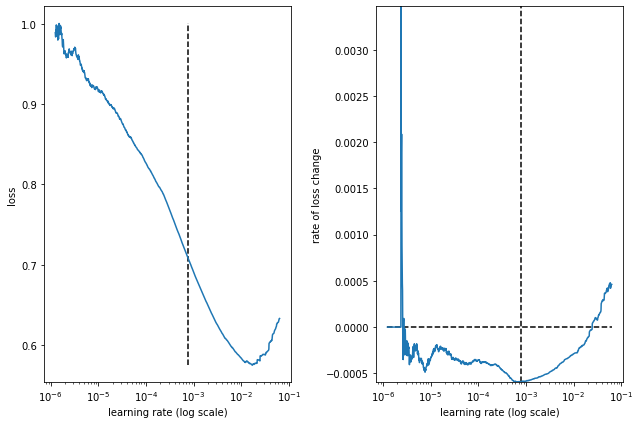

best lr: 0.0007728765 

Model: "conv2d_dense_46l_48s_16bs_65fm_64f_11ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_144 (Reshape)       (None, 46, 10, 1)         0         
                                                                 
 conv2d_31 (Conv2D)          (None, 46, 10, 64)        768       
                                                                 
 flatten_198 (Flatten)       (None, 29440)             0         
                                                                 
 dense_424 (Dense)           (None, 65)                1913665   
                                                                 
 dense_425 (Dense)           (None, 32)                2112      
                                                                 
 dense_426 (Dense)           (None, 48)                1584      
                                                                 
 re

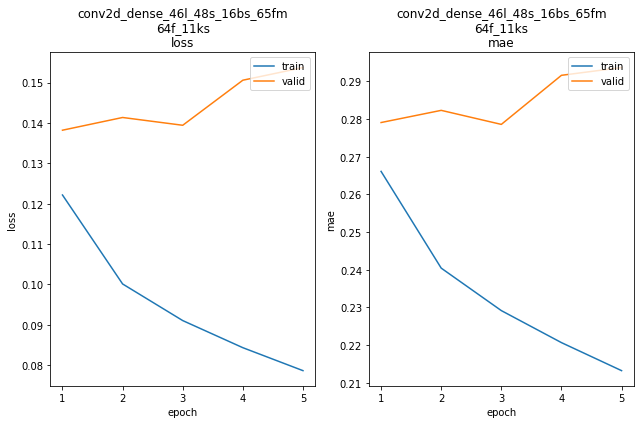

conv2d_dense_46l_48s_16bs_65fm_64f_11ks train min loss: 0.078660	mae: 0.213223	epoch: 5
conv2d_dense_46l_48s_16bs_65fm_64f_11ks valid min loss: 0.138217	mae: 0.279073	epoch: 1

conv2d_dense_46l_48s_16bs_65fm_64f_11ks
Iteration No: 32 ended. Search finished for the next optimal point.
Time taken: 383.4858
Function value obtained: 0.1382
Current minimum: 0.1208
Iteration No: 33 started. Searching for the next optimal point.
feat_maps 349
lags 25
filters 63
kern_size 10
Epoch 1/5
11759/11759 [==============================] - 15s 1ms/step - loss: 1.5854 - mae: 0.7853


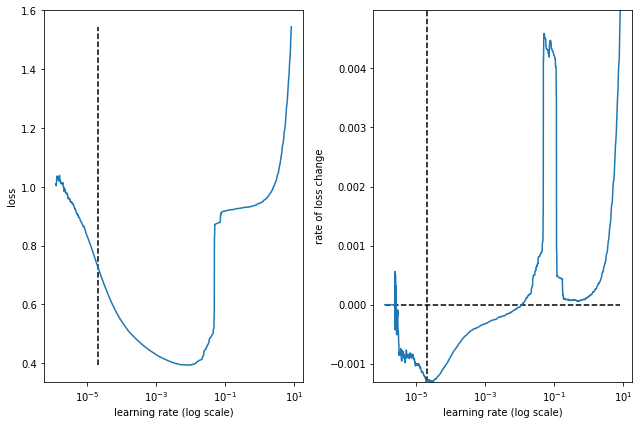

best lr: 2.008945e-05 

Model: "conv2d_dense_25l_48s_16bs_349fm_63f_10ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_146 (Reshape)       (None, 25, 10, 1)         0         
                                                                 
 conv2d_32 (Conv2D)          (None, 25, 10, 63)        693       
                                                                 
 flatten_199 (Flatten)       (None, 15750)             0         
                                                                 
 dense_427 (Dense)           (None, 349)               5497099   
                                                                 
 dense_428 (Dense)           (None, 174)               60900     
                                                                 
 dense_429 (Dense)           (None, 48)                8400      
                                                                 
 r

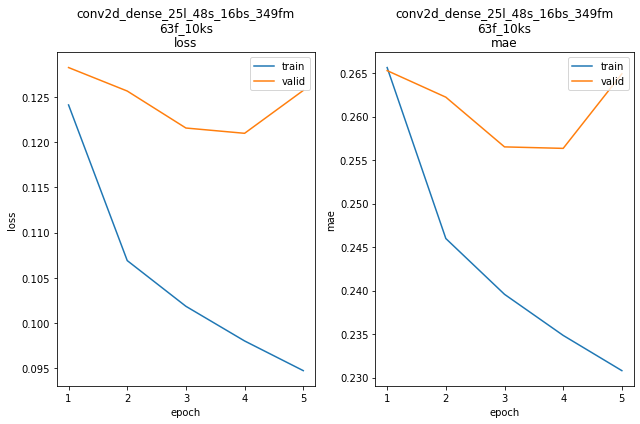

conv2d_dense_25l_48s_16bs_349fm_63f_10ks train min loss: 0.094741	mae: 0.230808	epoch: 5
conv2d_dense_25l_48s_16bs_349fm_63f_10ks valid min loss: 0.120974	mae: 0.256349	epoch: 4

conv2d_dense_25l_48s_16bs_349fm_63f_10ks
Iteration No: 33 ended. Search finished for the next optimal point.
Time taken: 367.2755
Function value obtained: 0.1210
Current minimum: 0.1208
Iteration No: 34 started. Searching for the next optimal point.
feat_maps 299
lags 144
filters 62
kern_size 16
Epoch 1/5
11752/11752 [==============================] - 26s 2ms/step - loss: 1.4550 - mae: 0.7855


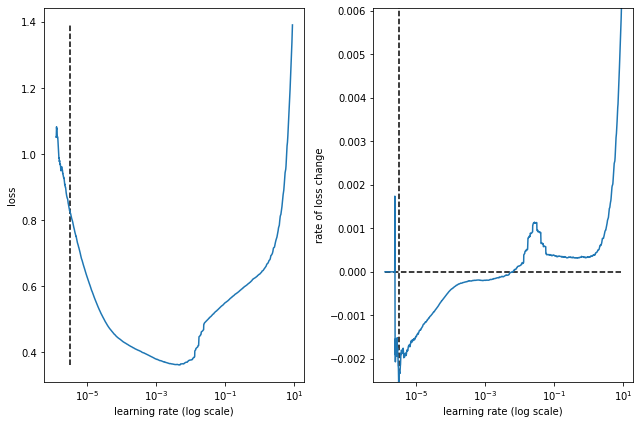

best lr: 3.102866e-06 

Model: "conv2d_dense_144l_48s_16bs_299fm_62f_16ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_148 (Reshape)       (None, 144, 10, 1)        0         
                                                                 
 conv2d_33 (Conv2D)          (None, 144, 10, 62)       1054      
                                                                 
 flatten_200 (Flatten)       (None, 89280)             0         
                                                                 
 dense_430 (Dense)           (None, 299)               26695019  
                                                                 
 dense_431 (Dense)           (None, 149)               44700     
                                                                 
 dense_432 (Dense)           (None, 48)                7200      
                                                                 
 

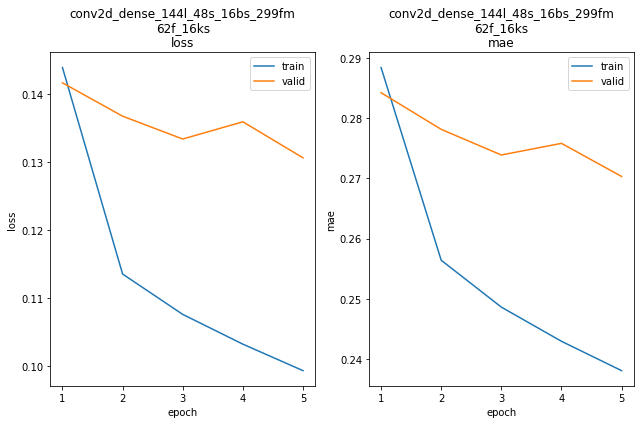

conv2d_dense_144l_48s_16bs_299fm_62f_16ks train min loss: 0.099315	mae: 0.238060	epoch: 5
conv2d_dense_144l_48s_16bs_299fm_62f_16ks valid min loss: 0.130635	mae: 0.270328	epoch: 5

conv2d_dense_144l_48s_16bs_299fm_62f_16ks
Iteration No: 34 ended. Search finished for the next optimal point.
Time taken: 570.1121
Function value obtained: 0.1306
Current minimum: 0.1208
Iteration No: 35 started. Searching for the next optimal point.
feat_maps 234
lags 143
filters 17
kern_size 13
Epoch 1/5
11752/11752 [==============================] - 15s 1ms/step - loss: 1.7052 - mae: 0.8301


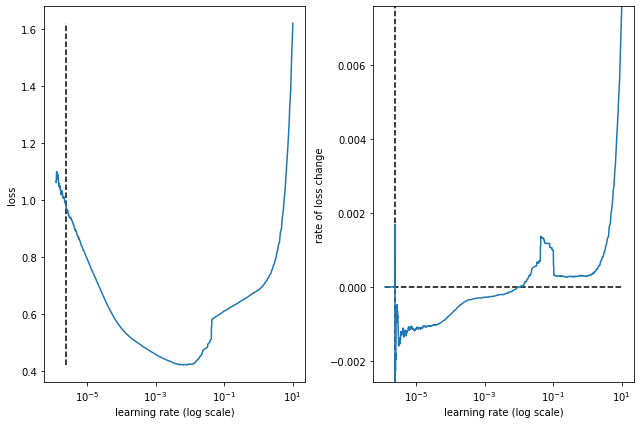

best lr: 2.4481383e-06 

Model: "conv2d_dense_143l_48s_16bs_234fm_17f_13ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_150 (Reshape)       (None, 143, 10, 1)        0         
                                                                 
 conv2d_34 (Conv2D)          (None, 143, 10, 17)       238       
                                                                 
 flatten_201 (Flatten)       (None, 24310)             0         
                                                                 
 dense_433 (Dense)           (None, 234)               5688774   
                                                                 
 dense_434 (Dense)           (None, 117)               27495     
                                                                 
 dense_435 (Dense)           (None, 48)                5664      
                                                                 


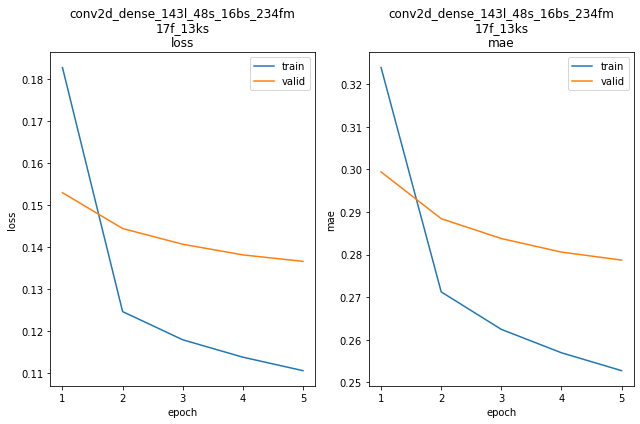

conv2d_dense_143l_48s_16bs_234fm_17f_13ks train min loss: 0.110563	mae: 0.252757	epoch: 5
conv2d_dense_143l_48s_16bs_234fm_17f_13ks valid min loss: 0.136590	mae: 0.278714	epoch: 5

conv2d_dense_143l_48s_16bs_234fm_17f_13ks
Iteration No: 35 ended. Search finished for the next optimal point.
Time taken: 324.4412
Function value obtained: 0.1366
Current minimum: 0.1208
Iteration No: 36 started. Searching for the next optimal point.
feat_maps 335
lags 62
filters 16
kern_size 4
Epoch 1/5
11757/11757 [==============================] - 12s 945us/step - loss: 1997.5854 - mae: 1.2801


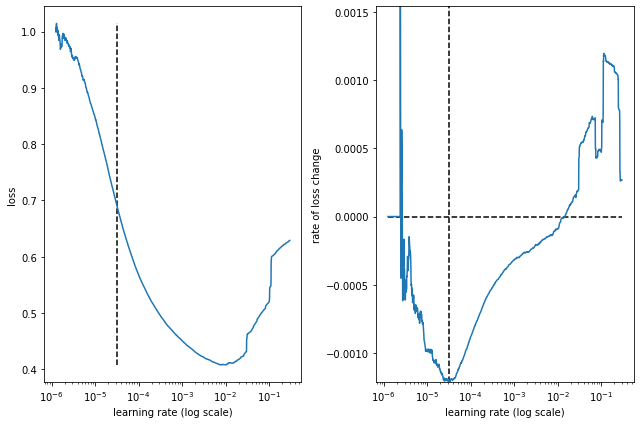

best lr: 3.1720167e-05 

Model: "conv2d_dense_62l_48s_16bs_335fm_16f_4ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_152 (Reshape)       (None, 62, 10, 1)         0         
                                                                 
 conv2d_35 (Conv2D)          (None, 62, 10, 16)        80        
                                                                 
 flatten_202 (Flatten)       (None, 9920)              0         
                                                                 
 dense_436 (Dense)           (None, 335)               3323535   
                                                                 
 dense_437 (Dense)           (None, 167)               56112     
                                                                 
 dense_438 (Dense)           (None, 48)                8064      
                                                                 
 r

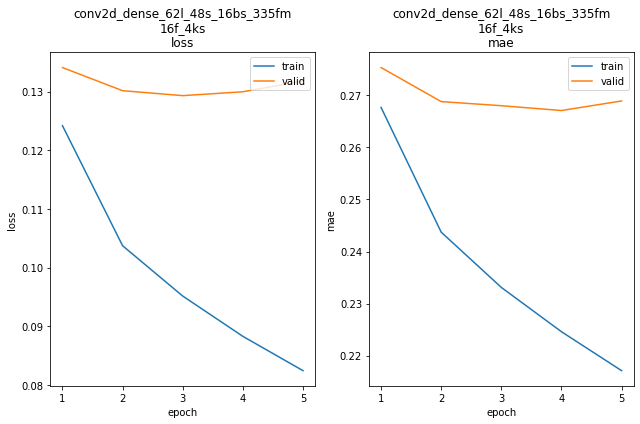

conv2d_dense_62l_48s_16bs_335fm_16f_4ks train min loss: 0.082411	mae: 0.217102	epoch: 5
conv2d_dense_62l_48s_16bs_335fm_16f_4ks valid min loss: 0.129314	mae: 0.268023	epoch: 3

conv2d_dense_62l_48s_16bs_335fm_16f_4ks
Iteration No: 36 ended. Search finished for the next optimal point.
Time taken: 361.2213
Function value obtained: 0.1293
Current minimum: 0.1208
Iteration No: 37 started. Searching for the next optimal point.
feat_maps 503
lags 39
filters 20
kern_size 8
Epoch 1/5
11758/11758 [==============================] - 10s 791us/step - loss: 18.8307 - mae: 0.6537


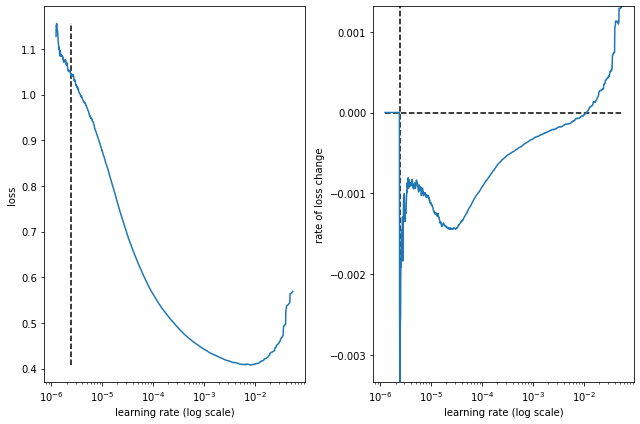

best lr: 2.4256462e-06 

Model: "conv2d_dense_39l_48s_16bs_503fm_20f_8ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_154 (Reshape)       (None, 39, 10, 1)         0         
                                                                 
 conv2d_36 (Conv2D)          (None, 39, 10, 20)        180       
                                                                 
 flatten_203 (Flatten)       (None, 7800)              0         
                                                                 
 dense_439 (Dense)           (None, 503)               3923903   
                                                                 
 dense_440 (Dense)           (None, 251)               126504    
                                                                 
 dense_441 (Dense)           (None, 48)                12096     
                                                                 
 r

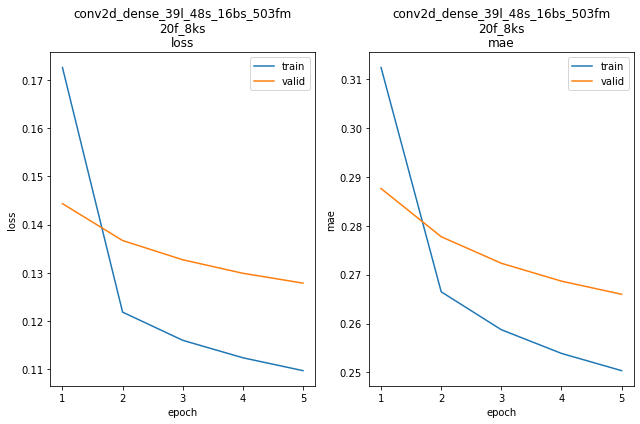

conv2d_dense_39l_48s_16bs_503fm_20f_8ks train min loss: 0.109692	mae: 0.250351	epoch: 5
conv2d_dense_39l_48s_16bs_503fm_20f_8ks valid min loss: 0.127859	mae: 0.265988	epoch: 5

conv2d_dense_39l_48s_16bs_503fm_20f_8ks
Iteration No: 37 ended. Search finished for the next optimal point.
Time taken: 347.0554
Function value obtained: 0.1279
Current minimum: 0.1208
Iteration No: 38 started. Searching for the next optimal point.
feat_maps 190
lags 24
filters 25
kern_size 9
Epoch 1/5
11759/11759 [==============================] - 15s 1ms/step - loss: 1.8781 - mae: 0.8659


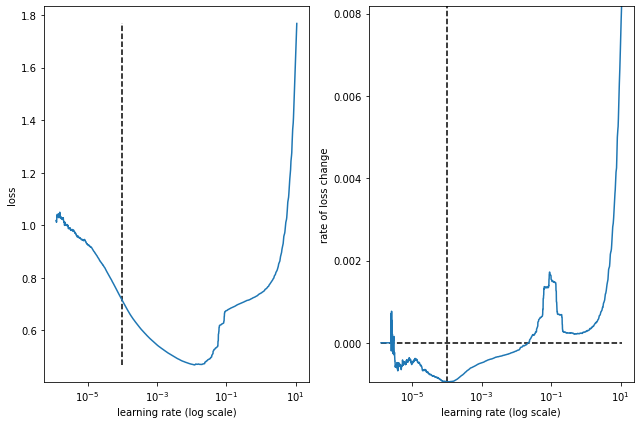

best lr: 0.000100920646 

Model: "conv2d_dense_24l_48s_16bs_190fm_25f_9ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_156 (Reshape)       (None, 24, 10, 1)         0         
                                                                 
 conv2d_37 (Conv2D)          (None, 24, 10, 25)        250       
                                                                 
 flatten_204 (Flatten)       (None, 6000)              0         
                                                                 
 dense_442 (Dense)           (None, 190)               1140190   
                                                                 
 dense_443 (Dense)           (None, 95)                18145     
                                                                 
 dense_444 (Dense)           (None, 48)                4608      
                                                                 
 

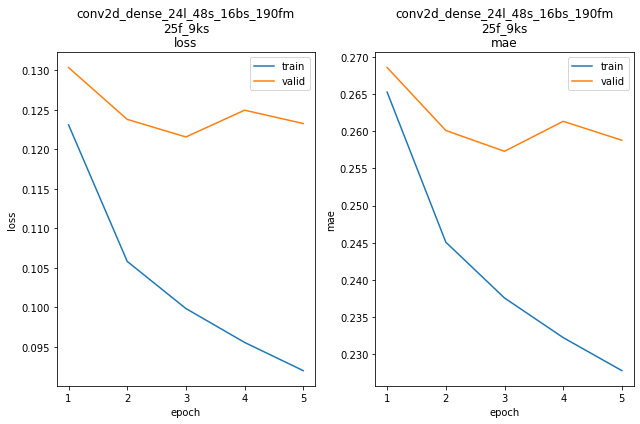

conv2d_dense_24l_48s_16bs_190fm_25f_9ks train min loss: 0.091982	mae: 0.227782	epoch: 5
conv2d_dense_24l_48s_16bs_190fm_25f_9ks valid min loss: 0.121562	mae: 0.257314	epoch: 3

conv2d_dense_24l_48s_16bs_190fm_25f_9ks
Iteration No: 38 ended. Search finished for the next optimal point.
Time taken: 318.5568
Function value obtained: 0.1216
Current minimum: 0.1208
Iteration No: 39 started. Searching for the next optimal point.
feat_maps 507
lags 54
filters 63
kern_size 7
Epoch 1/5
11757/11757 [==============================] - 21s 2ms/step - loss: 1.3296 - mae: 0.7473


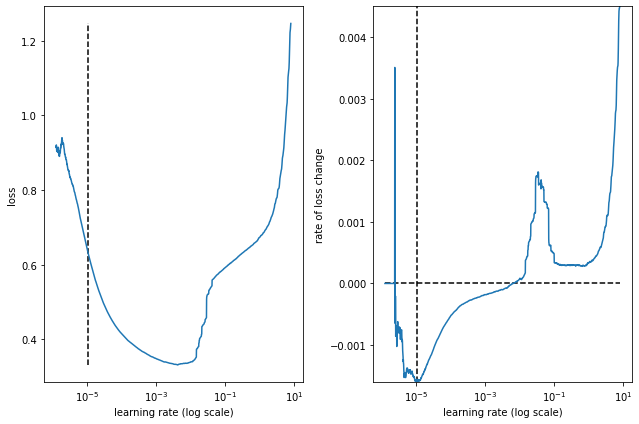

best lr: 1.050057e-05 

Model: "conv2d_dense_54l_48s_16bs_507fm_63f_7ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_158 (Reshape)       (None, 54, 10, 1)         0         
                                                                 
 conv2d_38 (Conv2D)          (None, 54, 10, 63)        504       
                                                                 
 flatten_205 (Flatten)       (None, 34020)             0         
                                                                 
 dense_445 (Dense)           (None, 507)               17248647  
                                                                 
 dense_446 (Dense)           (None, 253)               128524    
                                                                 
 dense_447 (Dense)           (None, 48)                12192     
                                                                 
 re

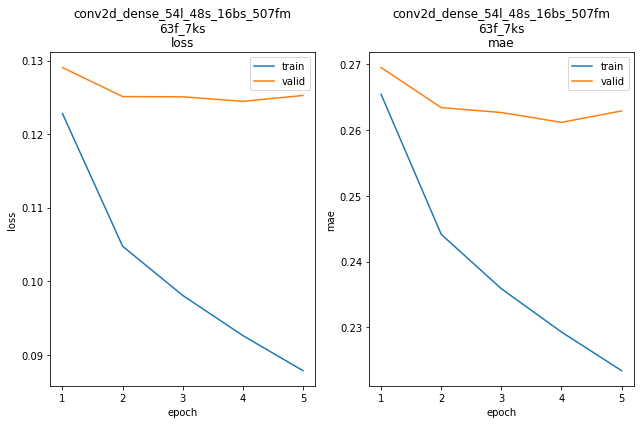

conv2d_dense_54l_48s_16bs_507fm_63f_7ks train min loss: 0.087840	mae: 0.223422	epoch: 5
conv2d_dense_54l_48s_16bs_507fm_63f_7ks valid min loss: 0.124448	mae: 0.261171	epoch: 4

conv2d_dense_54l_48s_16bs_507fm_63f_7ks
Iteration No: 39 ended. Search finished for the next optimal point.
Time taken: 363.6679
Function value obtained: 0.1244
Current minimum: 0.1208
Iteration No: 40 started. Searching for the next optimal point.
feat_maps 349
lags 109
filters 16
kern_size 14
Epoch 1/5
11754/11754 [==============================] - 12s 927us/step - loss: 172.3470 - mae: 0.8881


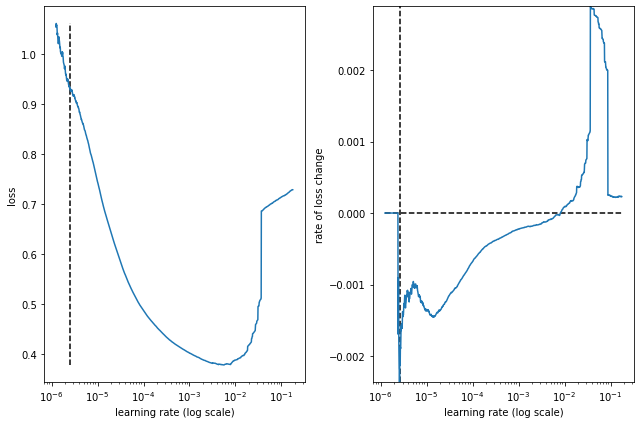

best lr: 2.5801126e-06 

Model: "conv2d_dense_109l_48s_16bs_349fm_16f_14ks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_160 (Reshape)       (None, 109, 10, 1)        0         
                                                                 
 conv2d_39 (Conv2D)          (None, 109, 10, 16)       240       
                                                                 
 flatten_206 (Flatten)       (None, 17440)             0         
                                                                 
 dense_448 (Dense)           (None, 349)               6086909   
                                                                 
 dense_449 (Dense)           (None, 174)               60900     
                                                                 
 dense_450 (Dense)           (None, 48)                8400      
                                                                 


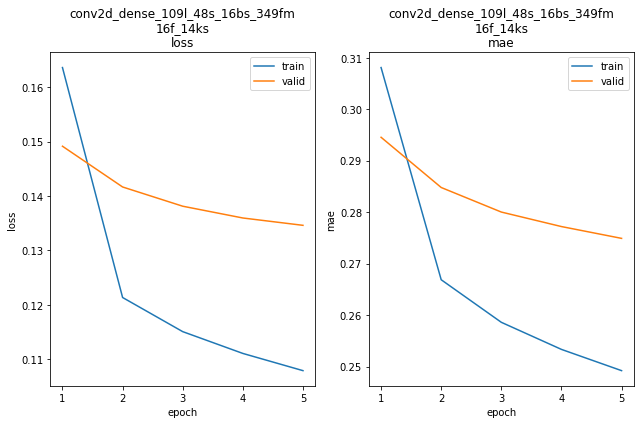

conv2d_dense_109l_48s_16bs_349fm_16f_14ks train min loss: 0.107921	mae: 0.249195	epoch: 5
conv2d_dense_109l_48s_16bs_349fm_16f_14ks valid min loss: 0.134608	mae: 0.274901	epoch: 5

conv2d_dense_109l_48s_16bs_349fm_16f_14ks
Iteration No: 40 ended. Search finished for the next optimal point.
Time taken: 374.9389
Function value obtained: 0.1346
Current minimum: 0.1208

[484, 24, 64, 12]
0.12079545855522156



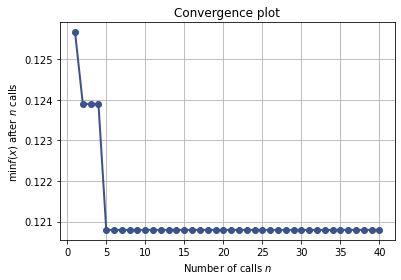

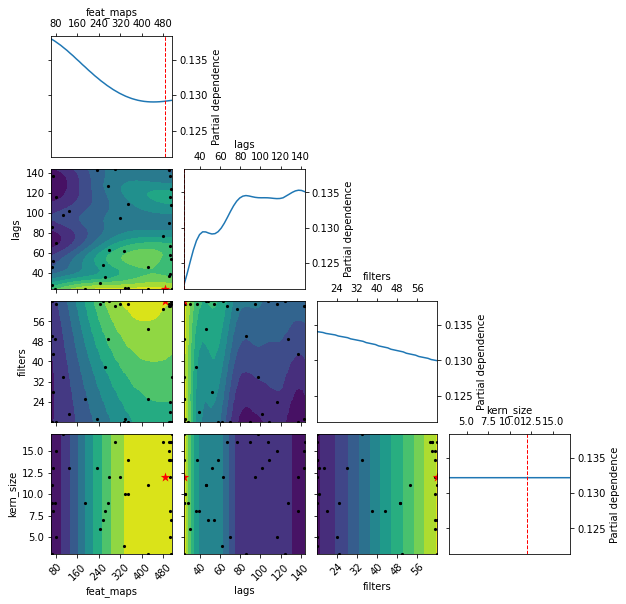

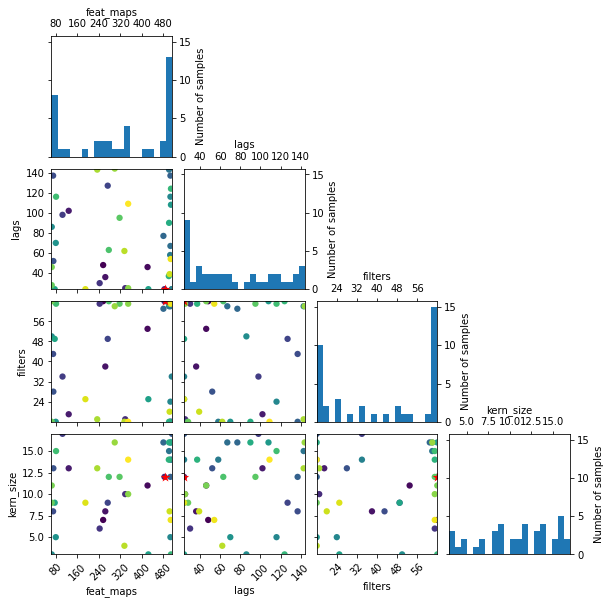

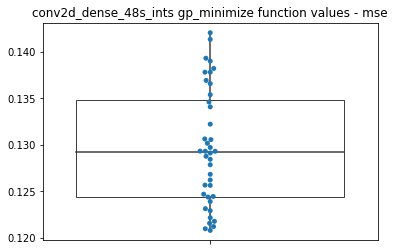

CPU times: user 4h 15min 15s, sys: 31min 32s, total: 4h 46min 47s
Wall time: 4h 14min 16s


In [ ]:
%%time


results_id = 'conv2d_dense_48s_ints'
hpo[results_id] = {}

dim_feat_maps = Integer(low = 64, high = 512, name = 'feat_maps')
dim_lags      = Integer(low = 24, high = 144, name = 'lags')
dim_filters   = Integer(low = 16, high =  64, name = 'filters')
dim_kern_size = Integer(low =  3, high =  17, name = 'kern_size')

hpo[results_id]['dims'] = [dim_feat_maps,
                           dim_lags,
                           dim_filters,
                           dim_kern_size]
hpo[results_id]['init_dims'] = [256, 48, 64, 7]
hpo[results_id]['calls']     = 40


@use_named_args(dimensions = hpo[results_id]['dims'])
def model_fitness(**dims):
    params = get_default_params('conv2d_dense')
    params.update({'lrf_params': [0.000001, 10, 32, 5, 100, 25]})

    return get_bo_mse(params, **dims)


hpo[results_id]['fitness_func'] = model_fitness
hpo[results_id]['results']      = run_bo_search(hpo, results_id)

Iteration No: 1 started. Evaluating function at provided point.
drop_out: 0.1000
kern_reg: 0.0001
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1000do_0.0001kr
mse: 0.13604766130447388

Iteration No: 1 ended. Evaluation done at provided point.
Time taken: 0.0046
Function value obtained: 0.1360
Current minimum: 0.1360
Iteration No: 2 started. Evaluating function at random point.
drop_out: 0.0267
kern_reg: 0.0001
Epoch 1/5
11759/11759 [==============================] - 9s 692us/step - loss: 2.9761 - mae: 0.6729


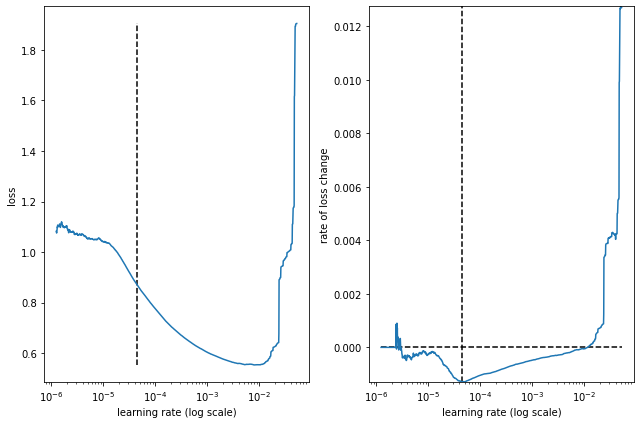

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0267do_0.0001kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_6 (Dropout)          (None, 24, 10)            0         
_________________________________________________________________
reshape_4 (Reshape)          (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_2 (Flatten)          (None, 15360)             0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 15360)             0         
_________________________________________________________________
dense_6 (Dense)              (None, 512)               7864832   
_________________________________________________

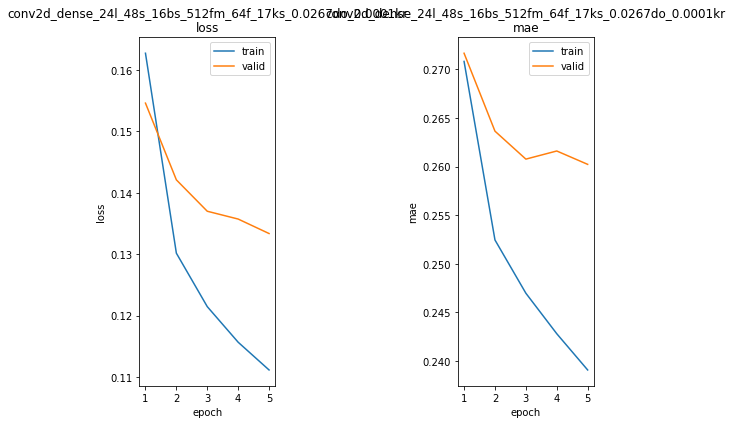

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0267do_0.0001kr train min loss: 0.111144	mae: 0.239088	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0267do_0.0001kr valid min loss: 0.133361	mae: 0.260226	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0267do_0.0001kr
mse: 0.13336141407489777

Iteration No: 2 ended. Evaluation done at random point.
Time taken: 306.2955
Function value obtained: 0.1334
Current minimum: 0.1334
Iteration No: 3 started. Evaluating function at random point.
drop_out: 0.0226
kern_reg: 0.0024
Epoch 1/5
11759/11759 [==============================] - 8s 654us/step - loss: 8.2469 - mae: 0.7046


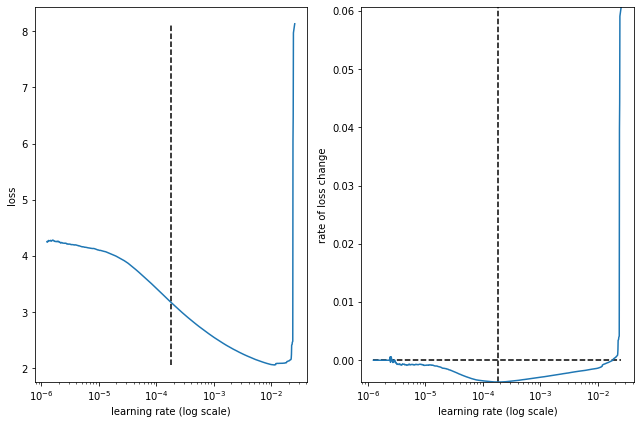

best lr: 0.00018006525 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0226do_0.0024kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_9 (Dropout)          (None, 24, 10)            0         
_________________________________________________________________
reshape_6 (Reshape)          (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_3 (Flatten)          (None, 15360)             0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               7864832   
_________________________________________________

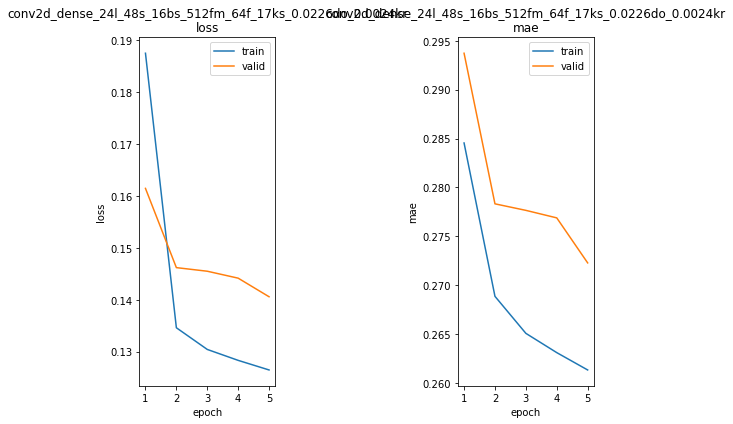

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0226do_0.0024kr train min loss: 0.126483	mae: 0.261351	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0226do_0.0024kr valid min loss: 0.140581	mae: 0.272295	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0226do_0.0024kr
mse: 0.14058148860931396

Iteration No: 3 ended. Evaluation done at random point.
Time taken: 304.8339
Function value obtained: 0.1406
Current minimum: 0.1334
Iteration No: 4 started. Evaluating function at random point.
drop_out: 0.0008
kern_reg: 0.0000
Epoch 1/5
11759/11759 [==============================] - 9s 675us/step - loss: 25.3748 - mae: 0.7354


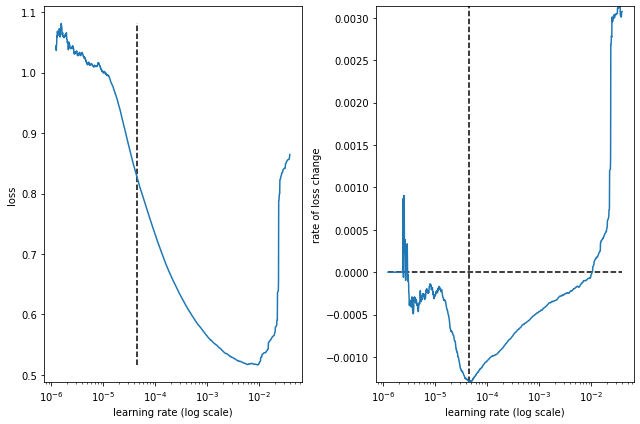

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0008do_0.0000kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_12 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_8 (Reshape)          (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_4 (Flatten)          (None, 15360)             0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_12 (Dense)             (None, 512)               7864832   
_________________________________________________

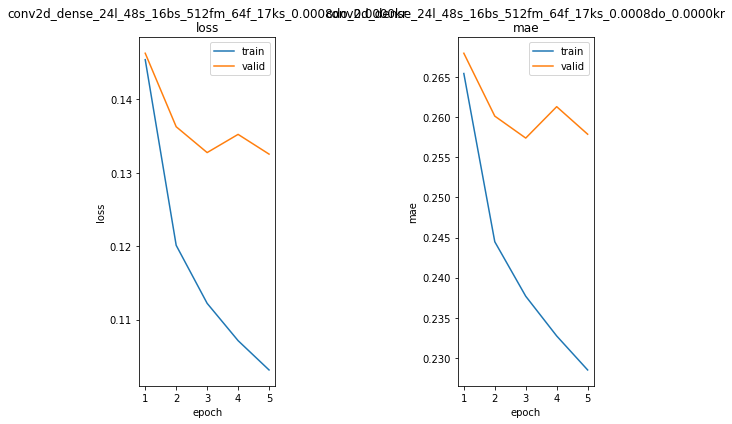

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0008do_0.0000kr train min loss: 0.103144	mae: 0.228505	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0008do_0.0000kr valid min loss: 0.132536	mae: 0.257870	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0008do_0.0000kr
mse: 0.13253569602966309

Iteration No: 4 ended. Evaluation done at random point.
Time taken: 384.3170
Function value obtained: 0.1325
Current minimum: 0.1325
Iteration No: 5 started. Evaluating function at random point.
drop_out: 0.0009
kern_reg: 0.0002
Epoch 1/5
11759/11759 [==============================] - 9s 678us/step - loss: 8.6252 - mae: 0.6559


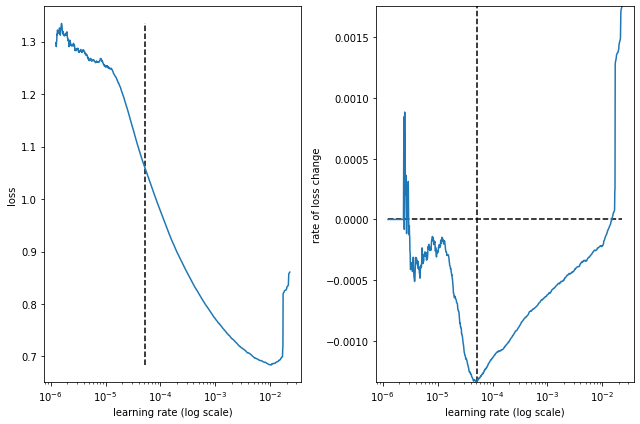

best lr: 5.135963e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0009do_0.0002kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_15 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_10 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_5 (Flatten)          (None, 15360)             0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_15 (Dense)             (None, 512)               7864832   
__________________________________________________

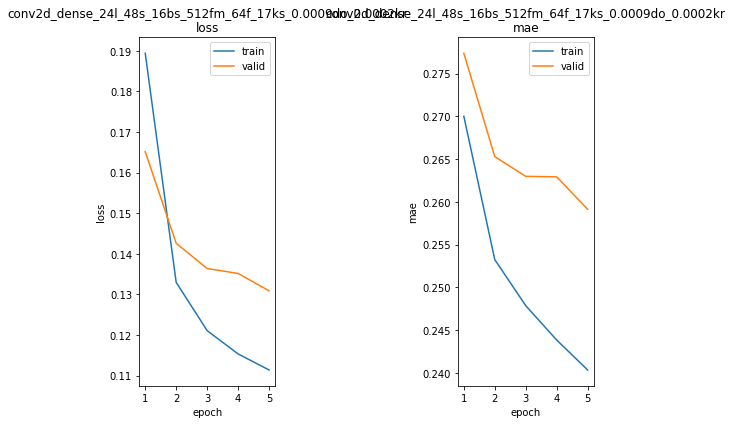

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0009do_0.0002kr train min loss: 0.111383	mae: 0.240331	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0009do_0.0002kr valid min loss: 0.130878	mae: 0.259128	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0009do_0.0002kr
mse: 0.13087831437587738

Iteration No: 5 ended. Evaluation done at random point.
Time taken: 344.0413
Function value obtained: 0.1309
Current minimum: 0.1309
Iteration No: 6 started. Evaluating function at random point.
drop_out: 0.0000
kern_reg: 0.0040
Epoch 1/5
11759/11759 [==============================] - 9s 709us/step - loss: 14.8421 - mae: 0.7309


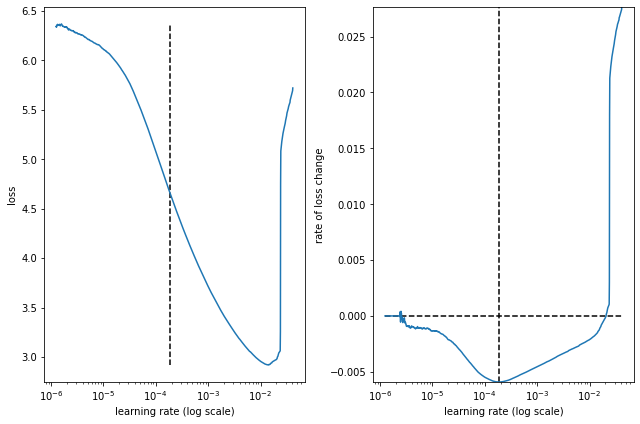

best lr: 0.00018486702 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0040kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_18 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_12 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_6 (Flatten)          (None, 15360)             0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_18 (Dense)             (None, 512)               7864832   
_________________________________________________

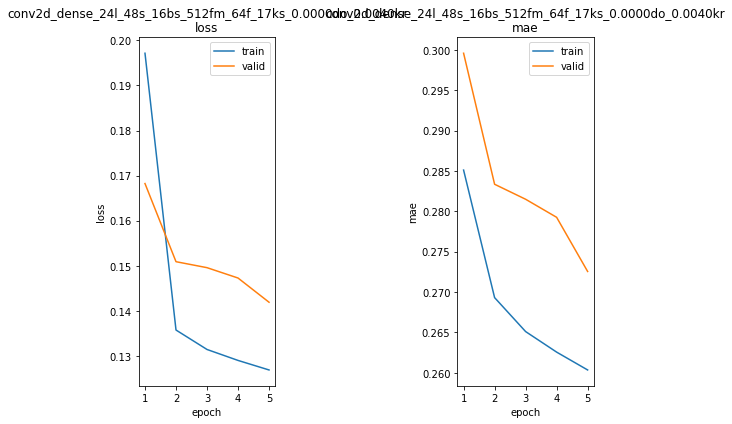

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0040kr train min loss: 0.126869	mae: 0.260360	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0040kr valid min loss: 0.141897	mae: 0.272551	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0040kr
mse: 0.14189745485782623

Iteration No: 6 ended. Evaluation done at random point.
Time taken: 305.7236
Function value obtained: 0.1419
Current minimum: 0.1309
Iteration No: 7 started. Evaluating function at random point.
drop_out: 0.0000
kern_reg: 0.0077
Epoch 1/5
11759/11759 [==============================] - 9s 700us/step - loss: 25.6146 - mae: 0.8027


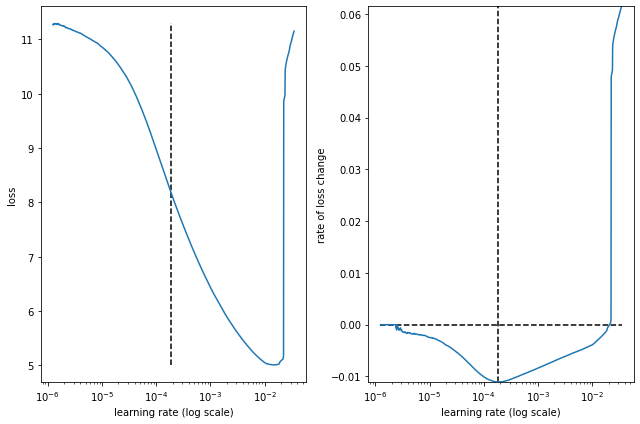

best lr: 0.0001864959 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0077kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_21 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_14 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_7 (Flatten)          (None, 15360)             0         
_________________________________________________________________
dropout_22 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_21 (Dense)             (None, 512)               7864832   
__________________________________________________

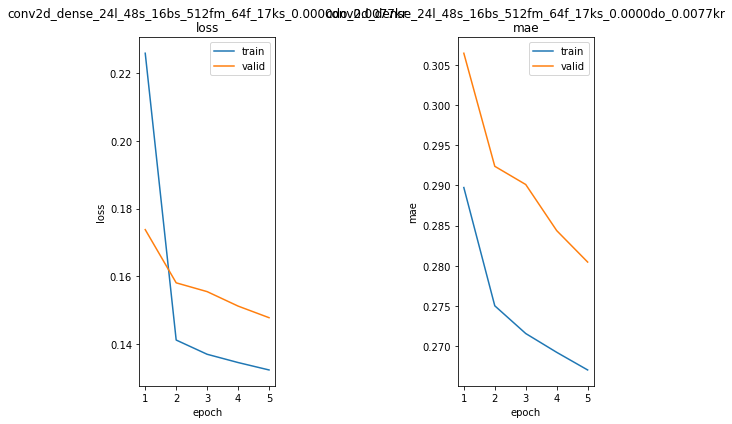

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0077kr train min loss: 0.132409	mae: 0.267039	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0077kr valid min loss: 0.147834	mae: 0.280471	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0077kr
mse: 0.1478339284658432

Iteration No: 7 ended. Evaluation done at random point.
Time taken: 265.9311
Function value obtained: 0.1478
Current minimum: 0.1309
Iteration No: 8 started. Evaluating function at random point.
drop_out: 0.1088
kern_reg: 0.0000
Epoch 1/5
11759/11759 [==============================] - 9s 679us/step - loss: 2.1125 - mae: 0.6075


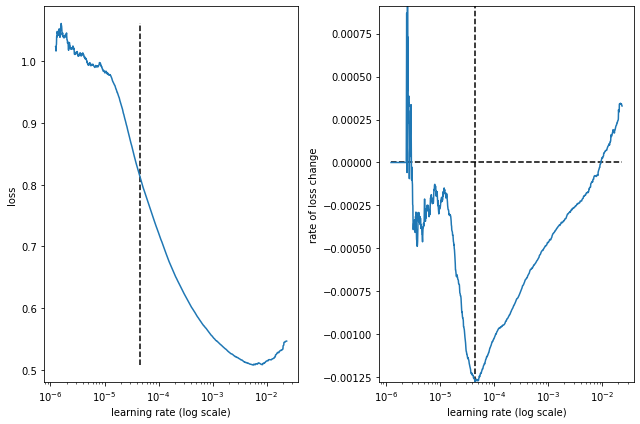

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1088do_0.0000kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_24 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_16 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_8 (Flatten)          (None, 15360)             0         
_________________________________________________________________
dropout_25 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_24 (Dense)             (None, 512)               7864832   
_________________________________________________

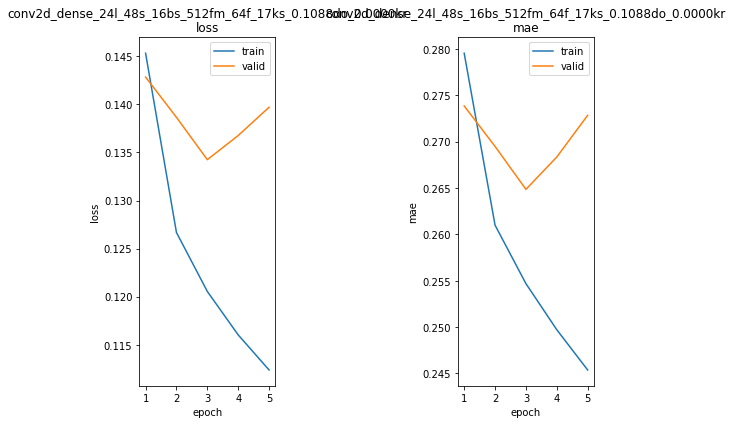

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1088do_0.0000kr train min loss: 0.112373	mae: 0.245373	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1088do_0.0000kr valid min loss: 0.134250	mae: 0.264856	epoch: 3

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1088do_0.0000kr
mse: 0.13424980640411377

Iteration No: 8 ended. Evaluation done at random point.
Time taken: 347.5588
Function value obtained: 0.1342
Current minimum: 0.1309
Iteration No: 9 started. Evaluating function at random point.
drop_out: 0.1852
kern_reg: 0.0030
Epoch 1/5
11759/11759 [==============================] - 9s 727us/step - loss: 10.3118 - mae: 0.7244


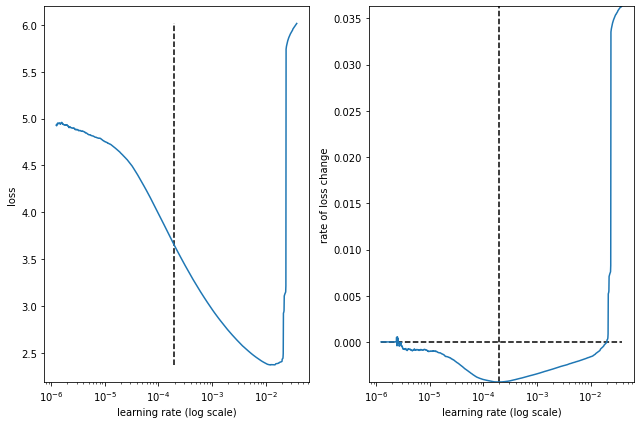

best lr: 0.00019485813 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1852do_0.0030kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_27 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_18 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_9 (Flatten)          (None, 15360)             0         
_________________________________________________________________
dropout_28 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_27 (Dense)             (None, 512)               7864832   
_________________________________________________

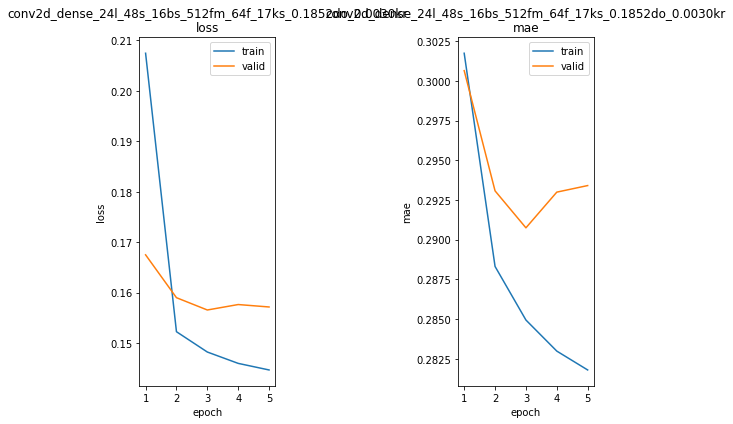

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1852do_0.0030kr train min loss: 0.144672	mae: 0.281793	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1852do_0.0030kr valid min loss: 0.156564	mae: 0.290745	epoch: 3

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1852do_0.0030kr
mse: 0.15656369924545288

Iteration No: 9 ended. Evaluation done at random point.
Time taken: 384.4529
Function value obtained: 0.1566
Current minimum: 0.1309
Iteration No: 10 started. Evaluating function at random point.
drop_out: 0.0043
kern_reg: 0.0000
Epoch 1/5
11759/11759 [==============================] - 9s 738us/step - loss: 3.0055 - mae: 0.6208


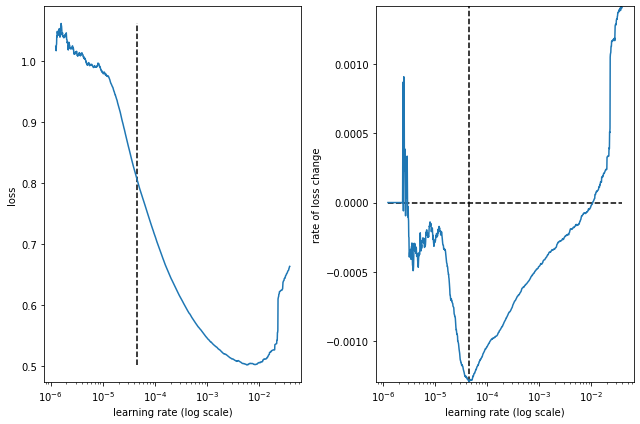

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0043do_0.0000kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_30 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_20 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_10 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_30 (Dense)             (None, 512)               7864832   
_________________________________________________

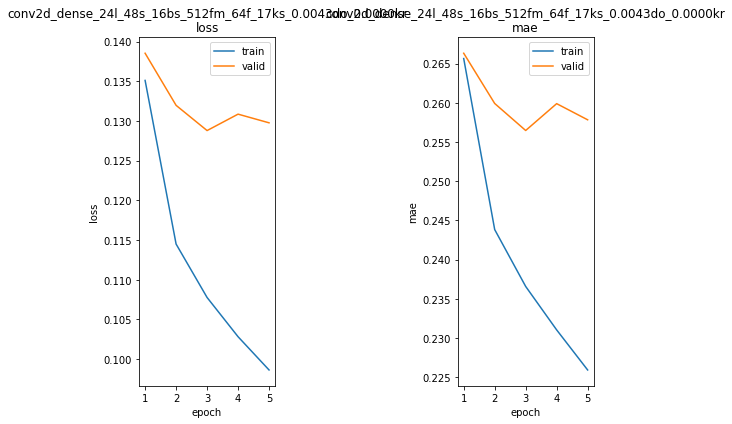

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0043do_0.0000kr train min loss: 0.098639	mae: 0.225939	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0043do_0.0000kr valid min loss: 0.128795	mae: 0.256465	epoch: 3

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0043do_0.0000kr
mse: 0.12879498302936554

Iteration No: 10 ended. Evaluation done at random point.
Time taken: 268.9969
Function value obtained: 0.1288
Current minimum: 0.1288
Iteration No: 11 started. Evaluating function at random point.
drop_out: 0.0000
kern_reg: 0.0013
Epoch 1/5
11759/11759 [==============================] - 9s 748us/step - loss: 5.4904 - mae: 0.6707


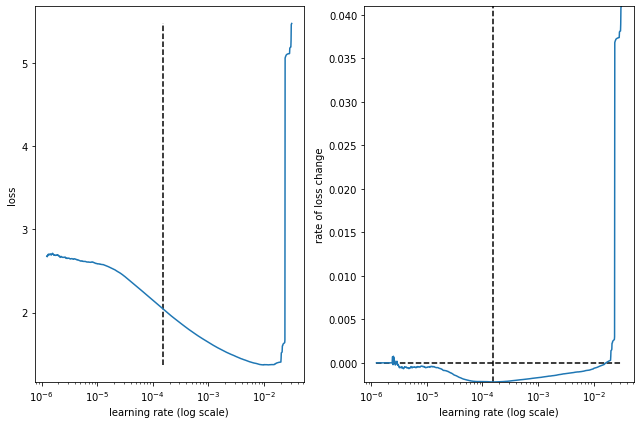

best lr: 0.00015511813 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0013kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_33 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_22 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_11 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_34 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_33 (Dense)             (None, 512)               7864832   
_________________________________________________

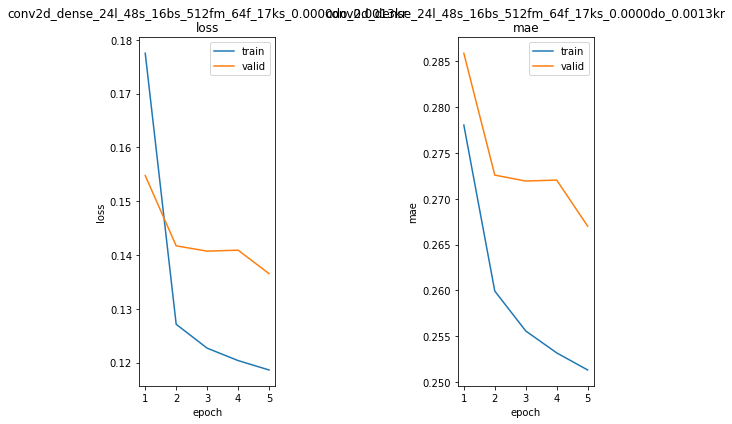

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0013kr train min loss: 0.118625	mae: 0.251320	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0013kr valid min loss: 0.136533	mae: 0.267021	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0013kr
mse: 0.13653293251991272

Iteration No: 11 ended. Evaluation done at random point.
Time taken: 383.6505
Function value obtained: 0.1365
Current minimum: 0.1288
Iteration No: 12 started. Evaluating function at random point.
drop_out: 0.0000
kern_reg: 0.0000
Epoch 1/5
11759/11759 [==============================] - 10s 805us/step - loss: 172.6140 - mae: 0.9838


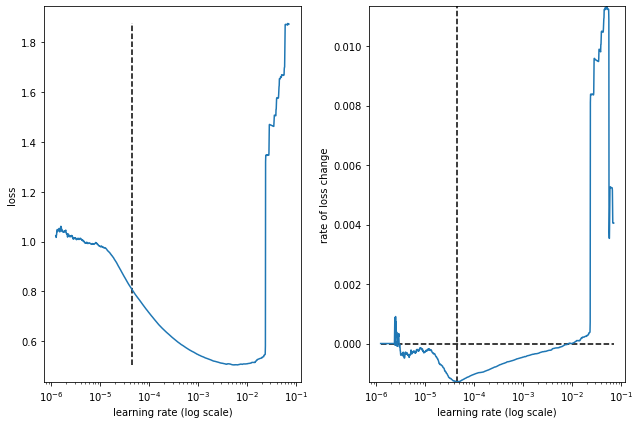

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0000kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_36 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_24 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_12 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_37 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_36 (Dense)             (None, 512)               7864832   
_________________________________________________

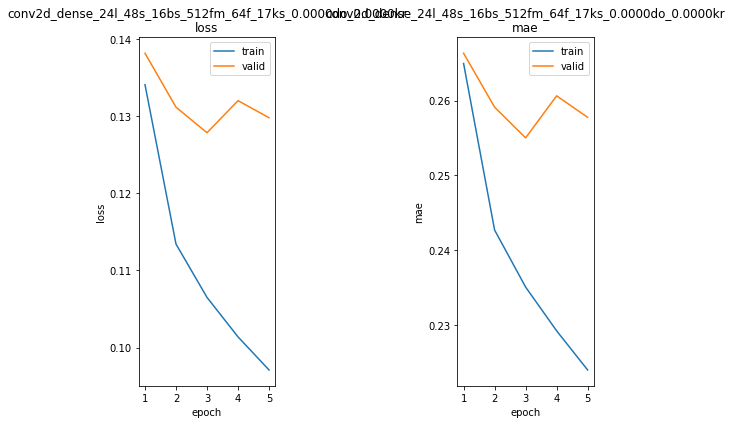

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0000kr train min loss: 0.097092	mae: 0.223995	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0000kr valid min loss: 0.127848	mae: 0.255024	epoch: 3

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0000kr
mse: 0.12784825265407562

Iteration No: 12 ended. Evaluation done at random point.
Time taken: 309.4750
Function value obtained: 0.1278
Current minimum: 0.1278
Iteration No: 13 started. Searching for the next optimal point.
drop_out: 0.0000
kern_reg: 0.0000
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0000kr
mse: 0.12784825265407562

Iteration No: 13 ended. Search finished for the next optimal point.
Time taken: 0.1508
Function value obtained: 0.1278
Current minimum: 0.1278
Iteration No: 14 started. Searching for the next optimal point.
drop_out: 0.0000
kern_reg: 0.0000
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0000kr
mse: 0.12784825265407562

Iteration No: 14 ended. Search finished for the next opti

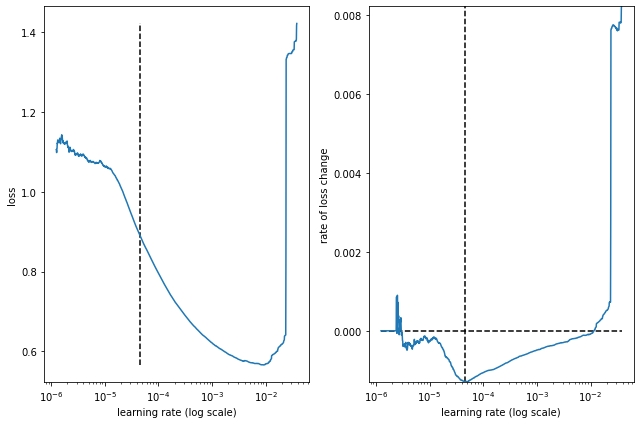

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0001kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_39 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_26 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_13 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_40 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_39 (Dense)             (None, 512)               7864832   
_________________________________________________

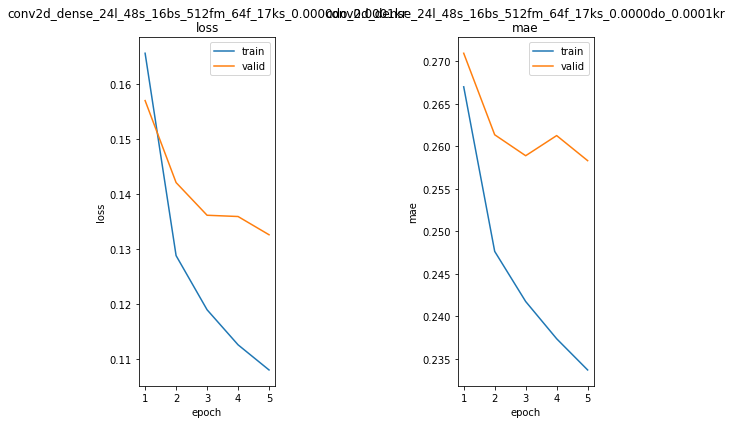

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0001kr train min loss: 0.107955	mae: 0.233713	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0001kr valid min loss: 0.132600	mae: 0.258312	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0001kr
mse: 0.13259965181350708

Iteration No: 15 ended. Search finished for the next optimal point.
Time taken: 309.4009
Function value obtained: 0.1326
Current minimum: 0.1278
Iteration No: 16 started. Searching for the next optimal point.
drop_out: 0.0000
kern_reg: 0.0000
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0000kr
mse: 0.12784825265407562

Iteration No: 16 ended. Search finished for the next optimal point.
Time taken: 0.1578
Function value obtained: 0.1278
Current minimum: 0.1278
Iteration No: 17 started. Searching for the next optimal point.
drop_out: 0.0000
kern_reg: 0.0969
Epoch 1/5
11759/11759 [==============================] - 10s 778us/step - loss: 595.2864 - mae: 1.2398


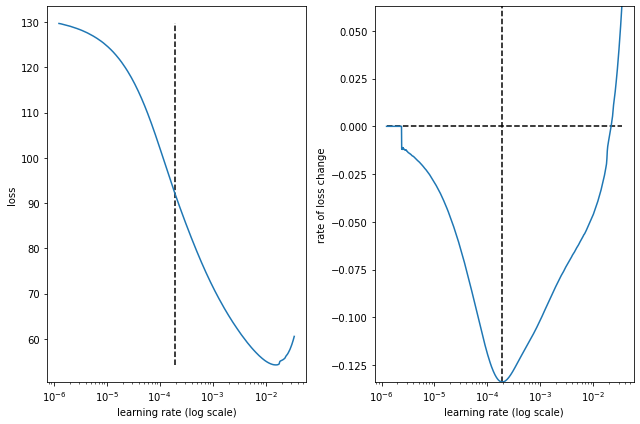

best lr: 0.00019146917 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0969kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_42 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_28 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_14 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_43 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_42 (Dense)             (None, 512)               7864832   
_________________________________________________

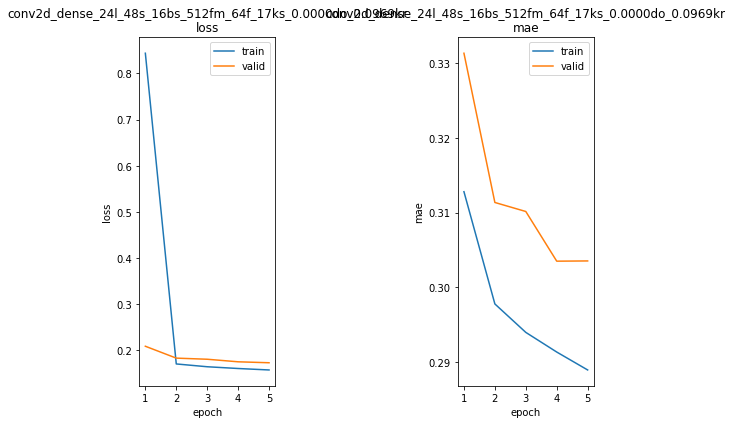

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0969kr train min loss: 0.157439	mae: 0.288920	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0969kr valid min loss: 0.173057	mae: 0.303520	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0969kr
mse: 0.1730571687221527

Iteration No: 17 ended. Search finished for the next optimal point.
Time taken: 234.5445
Function value obtained: 0.1731
Current minimum: 0.1278
Iteration No: 18 started. Searching for the next optimal point.
drop_out: 0.0000
kern_reg: 0.0001
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0001kr
mse: 0.13259965181350708

Iteration No: 18 ended. Search finished for the next optimal point.
Time taken: 0.1763
Function value obtained: 0.1326
Current minimum: 0.1278
Iteration No: 19 started. Searching for the next optimal point.
drop_out: 0.1595
kern_reg: 0.0000
Epoch 1/5
11759/11759 [==============================] - 10s 751us/step - loss: 4.3292 - mae: 0.6139


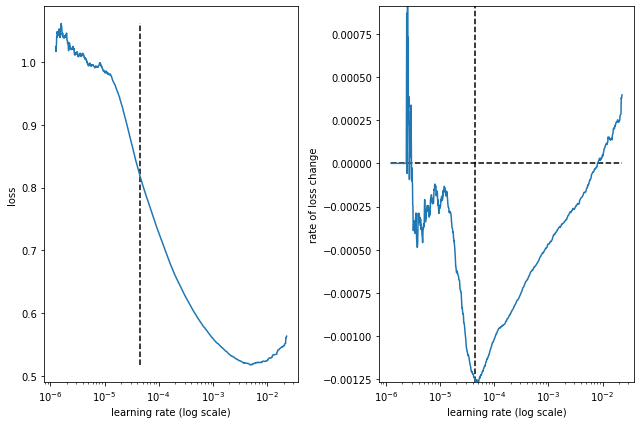

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1595do_0.0000kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_45 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_30 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_15 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_46 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_45 (Dense)             (None, 512)               7864832   
_________________________________________________

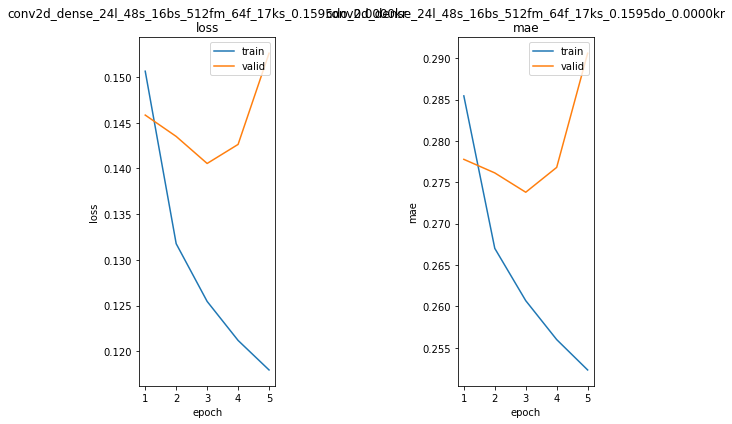

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1595do_0.0000kr train min loss: 0.117954	mae: 0.252311	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1595do_0.0000kr valid min loss: 0.140544	mae: 0.273801	epoch: 3

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1595do_0.0000kr
mse: 0.14054401218891144

Iteration No: 19 ended. Search finished for the next optimal point.
Time taken: 309.8503
Function value obtained: 0.1405
Current minimum: 0.1278
Iteration No: 20 started. Searching for the next optimal point.
drop_out: 0.0004
kern_reg: 0.0000
Epoch 1/5
11759/11759 [==============================] - 11s 827us/step - loss: 12.5231 - mae: 0.7187


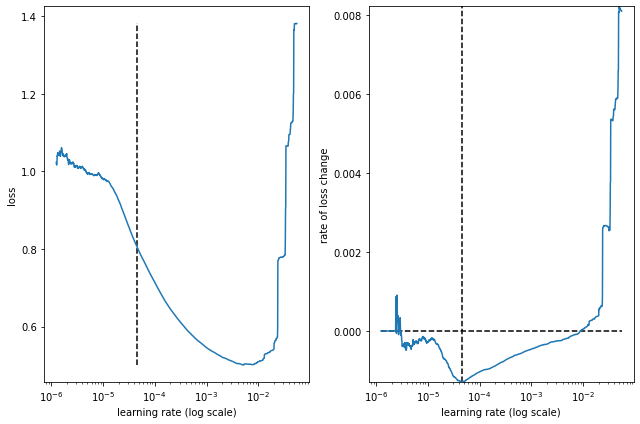

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0004do_0.0000kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_48 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_32 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_16 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_49 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_48 (Dense)             (None, 512)               7864832   
_________________________________________________

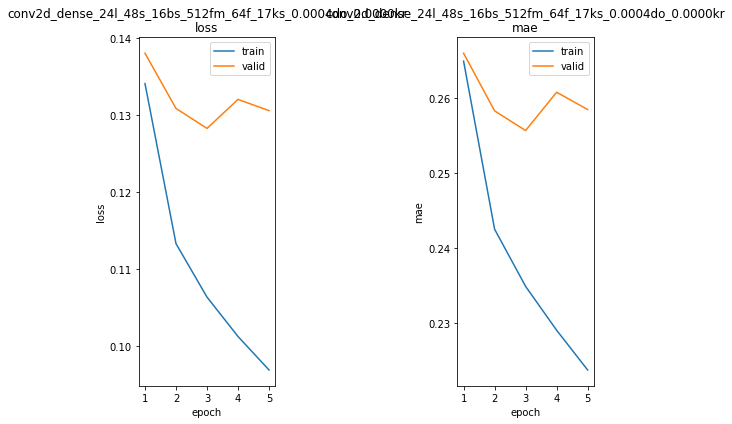

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0004do_0.0000kr train min loss: 0.096875	mae: 0.223807	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0004do_0.0000kr valid min loss: 0.128292	mae: 0.255646	epoch: 3

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0004do_0.0000kr
mse: 0.12829181551933289

Iteration No: 20 ended. Search finished for the next optimal point.
Time taken: 271.6950
Function value obtained: 0.1283
Current minimum: 0.1278
Iteration No: 21 started. Searching for the next optimal point.
drop_out: 0.1949
kern_reg: 0.0911
Epoch 1/5
11759/11759 [==============================] - 10s 812us/step - loss: 3422.0454 - mae: 2.6686


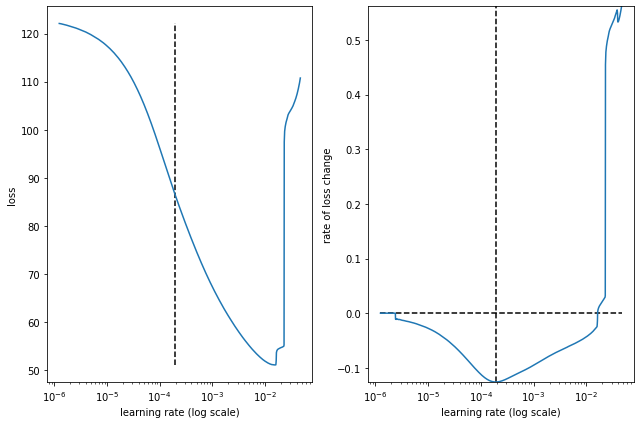

best lr: 0.00019146917 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1949do_0.0911kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_51 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_34 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_17 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_52 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_51 (Dense)             (None, 512)               7864832   
_________________________________________________

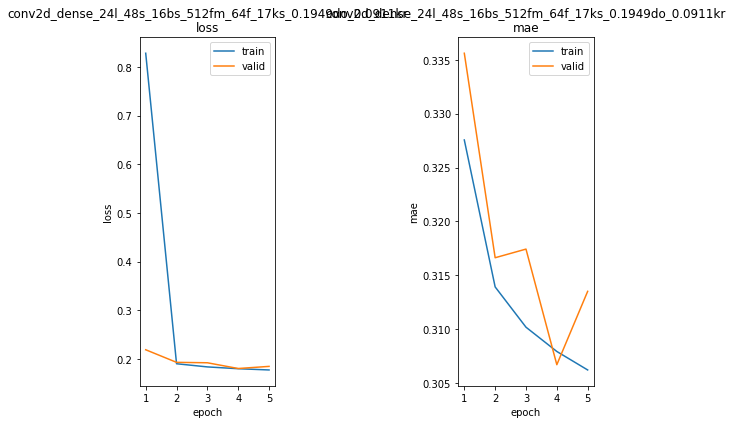

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1949do_0.0911kr train min loss: 0.177278	mae: 0.306218	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1949do_0.0911kr valid min loss: 0.180258	mae: 0.306706	epoch: 4

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.1949do_0.0911kr
mse: 0.18025760352611542

Iteration No: 21 ended. Search finished for the next optimal point.
Time taken: 348.1115
Function value obtained: 0.1803
Current minimum: 0.1278
Iteration No: 22 started. Searching for the next optimal point.
drop_out: 0.0004
kern_reg: 0.0000
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0004do_0.0000kr
mse: 0.12829181551933289

Iteration No: 22 ended. Search finished for the next optimal point.
Time taken: 0.1631
Function value obtained: 0.1283
Current minimum: 0.1278
Iteration No: 23 started. Searching for the next optimal point.
drop_out: 0.0003
kern_reg: 0.0001
Epoch 1/5
11759/11759 [==============================] - 10s 763us/step - loss: 4.2410 - mae: 0.6222


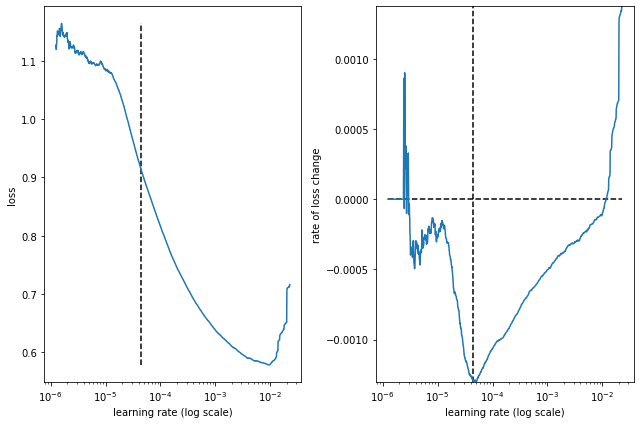

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0003do_0.0001kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_54 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_36 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_18 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_55 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_54 (Dense)             (None, 512)               7864832   
_________________________________________________

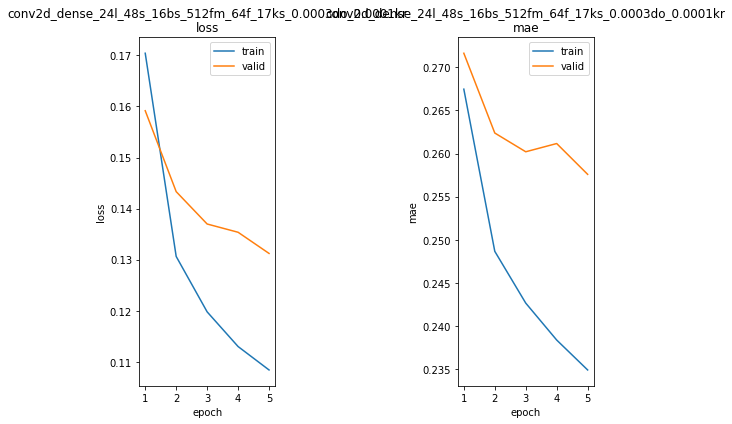

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0003do_0.0001kr train min loss: 0.108403	mae: 0.234906	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0003do_0.0001kr valid min loss: 0.131218	mae: 0.257585	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0003do_0.0001kr
mse: 0.13121820986270905

Iteration No: 23 ended. Search finished for the next optimal point.
Time taken: 311.1667
Function value obtained: 0.1312
Current minimum: 0.1278
Iteration No: 24 started. Searching for the next optimal point.
drop_out: 0.0000
kern_reg: 0.0000
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0000kr
mse: 0.12784825265407562

Iteration No: 24 ended. Search finished for the next optimal point.
Time taken: 0.1613
Function value obtained: 0.1278
Current minimum: 0.1278
Iteration No: 25 started. Searching for the next optimal point.
drop_out: 0.0000
kern_reg: 0.0000
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0000kr
mse: 0.12784825265407562

Iteration No: 25 ended. Search finished for th

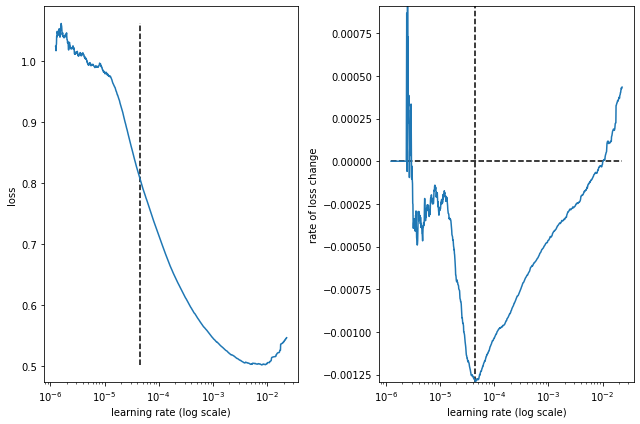

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0006do_0.0000kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_57 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_38 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_19 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_58 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_57 (Dense)             (None, 512)               7864832   
_________________________________________________

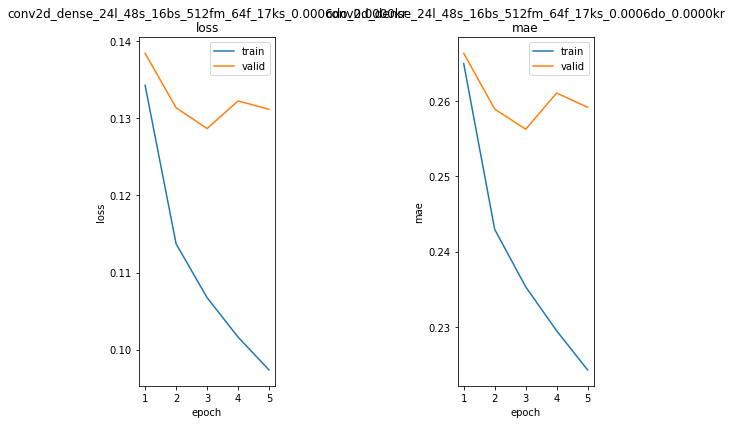

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0006do_0.0000kr train min loss: 0.097373	mae: 0.224275	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0006do_0.0000kr valid min loss: 0.128650	mae: 0.256231	epoch: 3

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0006do_0.0000kr
mse: 0.12865020334720612

Iteration No: 28 ended. Search finished for the next optimal point.
Time taken: 309.2609
Function value obtained: 0.1287
Current minimum: 0.1278
Iteration No: 29 started. Searching for the next optimal point.
drop_out: 0.0005
kern_reg: 0.0001
Epoch 1/5
11759/11759 [==============================] - 10s 830us/step - loss: 38.5541 - mae: 0.7675


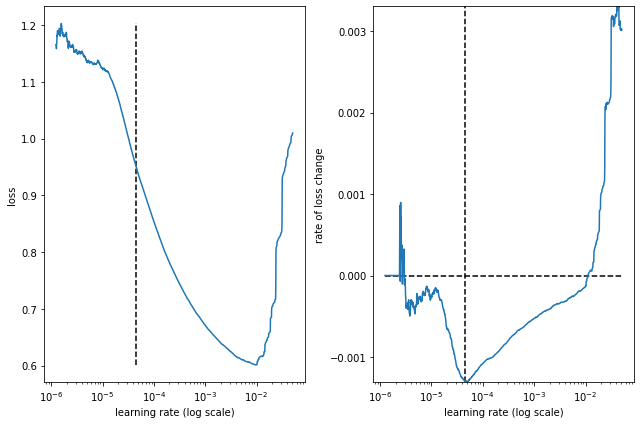

best lr: 4.5027125e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0005do_0.0001kr"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dropout_60 (Dropout)         (None, 24, 10)            0         
_________________________________________________________________
reshape_40 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_20 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dropout_61 (Dropout)         (None, 15360)             0         
_________________________________________________________________
dense_60 (Dense)             (None, 512)               7864832   
_________________________________________________

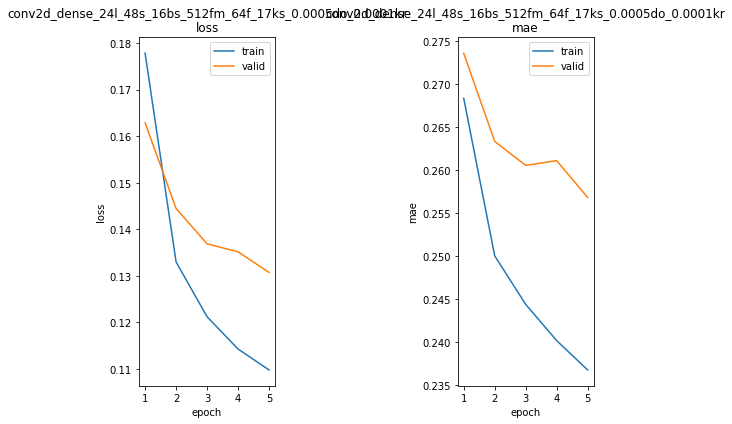

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0005do_0.0001kr train min loss: 0.109800	mae: 0.236767	epoch: 5
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0005do_0.0001kr valid min loss: 0.130741	mae: 0.256831	epoch: 5

conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0005do_0.0001kr
mse: 0.13074052333831787

Iteration No: 29 ended. Search finished for the next optimal point.
Time taken: 311.8570
Function value obtained: 0.1307
Current minimum: 0.1278
Iteration No: 30 started. Searching for the next optimal point.
drop_out: 0.0000
kern_reg: 0.0000
conv2d_dense_24l_48s_16bs_512fm_64f_17ks_0.0000do_0.0000kr
mse: 0.12784825265407562

Iteration No: 30 ended. Search finished for the next optimal point.
Time taken: 0.1824
Function value obtained: 0.1278
Current minimum: 0.1278
[1e-05, 1e-05]
0.12784825265407562


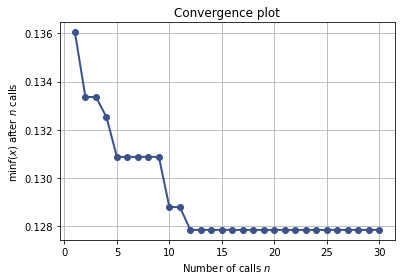

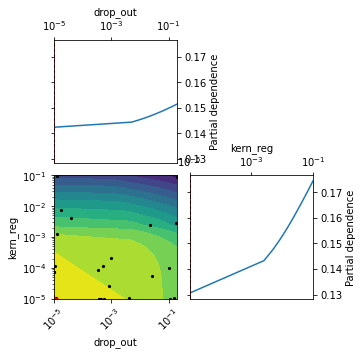

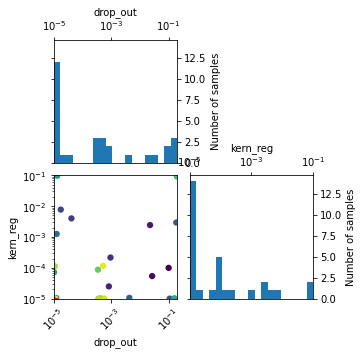

In [ ]:
%%time


dim_drop_out = Real(low = 1e-5, high = 2e-1, prior = 'log-uniform', name = 'drop_out')
dim_kern_reg = Real(low = 1e-5, high = 1e-1, prior = 'log-uniform', name = 'kern_reg')

# dim_drop_out = Real(low = 0.0, high = 5e-1, prior = 'log-uniform', name = 'drop_out')
# RuntimeWarning: invalid value encountered in add
#  X_orig = X * (self.high - self.low) + self.low
# ValueError: Point ([20, 31, 28, nan]) is not within the bounds of the space ([(4, 48), (16, 32), (16, 32), (0.0, 0.5)]).

bo_dims_cnn2d_dense_48s_reg = [dim_drop_out,
                               dim_kern_reg]


@use_named_args(dimensions = bo_dims_cnn2d_dense_48s_reg)
def model_fitness_cnn2d_dense_48s_reg(**dims):
    params = {'xcols':        def_cols,
              'ycols':             'y',
              'lags':               24, 
              'steps_ahead':        48,
              'stride':             48, 
              'shuffle':          True,
              'bs':                 16,
              'model_type': 'conv2d_dense',
              'mix_type':         'ts',
              'mix_alpha':           4,
              'mix_factor':          0,
              'mix_diff':            1,
              'feat_maps':         512,
              'filters':            64,
              'kern_size':          17,
              'drop_out':          0.0,
              'kern_reg':          0.0,
              'recu_reg':          0.0,
              'epochs':              5,
              'lrf_params': [0.000001, 10, 32, 5, 100, 25]}
#             'lrf_params': [0.00009, 10, 32, 5, 100, 25]}
#             'lrf_params': [0.00001, 10, 32, 5, 100, 25]}
#              lrf_params = [0.0003,   10, 32, 5, 100, 25]  # 0.0003 too high
#             'lrf_params': [0.000005, 10, 32, 5, 100, 25]}
#             'lrf_params': [0.000001, 10, 32, 5, 100, 25]}

    return get_bo_mse(params, **dims)


bo_def_dims_cnn2d_dense_48s_reg = [0.1, 1e-4]
bo_results_id = 'cnn2d_dense_48s_reg'

bo_search_results[bo_results_id] = run_bo_search(model_fitness_cnn2d_dense_48s_reg, 
                                                 bo_dims_cnn2d_dense_48s_reg, 
                                                 bo_def_dims_cnn2d_dense_48s_reg, 
                                                 20)

...

---

Run best models for 20 epochs.

1 of 4
Pandas(Index=1, feat_maps=512, lags=24)
Epoch 1/5
11759/11759 [==============================] - 9s 706us/step - loss: 11.5177 - mae: 0.7321


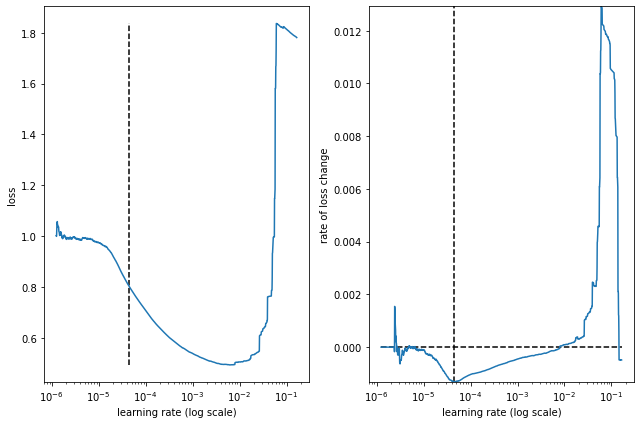

best lr: 4.4244014e-05 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_54 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_27 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dense_81 (Dense)             (None, 512)               7864832   
_________________________________________________________________
dense_82 (Dense)             (None, 256)               131328    
_________________________________________________________________
dense_83 (Dense)             (None, 48)                12336     
_________________________________________________________________
r

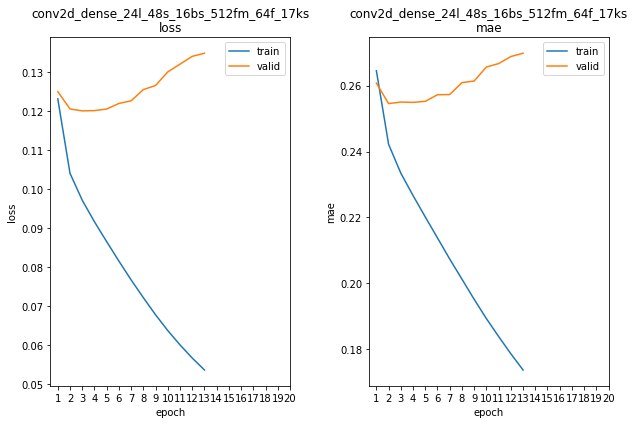

conv2d_dense_24l_48s_16bs_512fm_64f_17ks train min loss: 0.053606	mae: 0.173763	epoch: 13
conv2d_dense_24l_48s_16bs_512fm_64f_17ks valid min loss: 0.120127	mae: 0.255007	epoch: 3

2 of 4
Pandas(Index=3, feat_maps=1024, lags=24)
Epoch 1/5
11759/11759 [==============================] - 10s 809us/step - loss: 1.5818 - mae: 0.5807


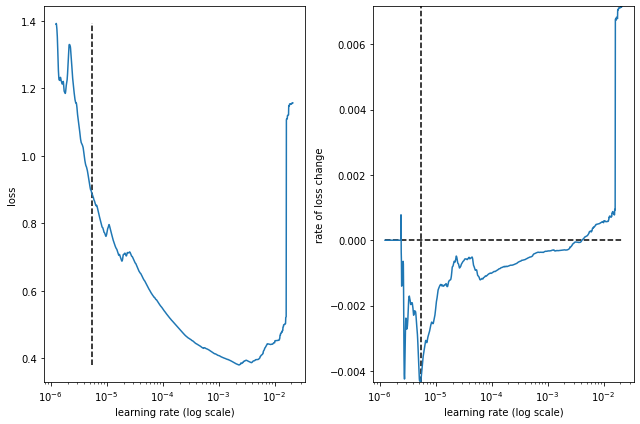

best lr: 5.3887843e-06 

Model: "conv2d_dense_24l_48s_16bs_1024fm_64f_17ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_56 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_28 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dense_84 (Dense)             (None, 1024)              15729664  
_________________________________________________________________
dense_85 (Dense)             (None, 512)               524800    
_________________________________________________________________
dense_86 (Dense)             (None, 48)                24624     
_________________________________________________________________


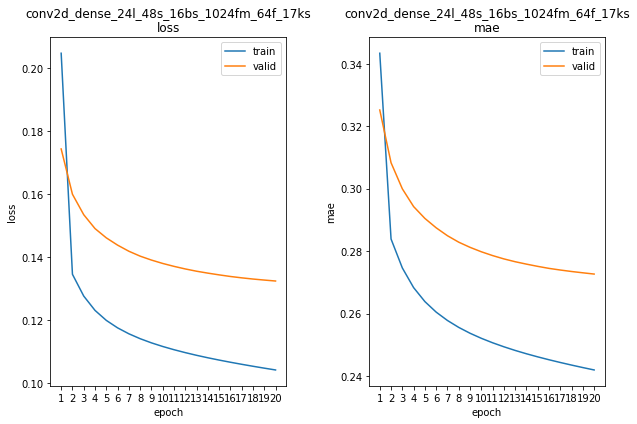

conv2d_dense_24l_48s_16bs_1024fm_64f_17ks train min loss: 0.104173	mae: 0.241968	epoch: 20
conv2d_dense_24l_48s_16bs_1024fm_64f_17ks valid min loss: 0.132386	mae: 0.272668	epoch: 20

3 of 4
Pandas(Index=0, feat_maps=512, lags=12)
Epoch 1/5
11760/11760 [==============================] - 7s 533us/step - loss: 1.7884 - mae: 0.6316


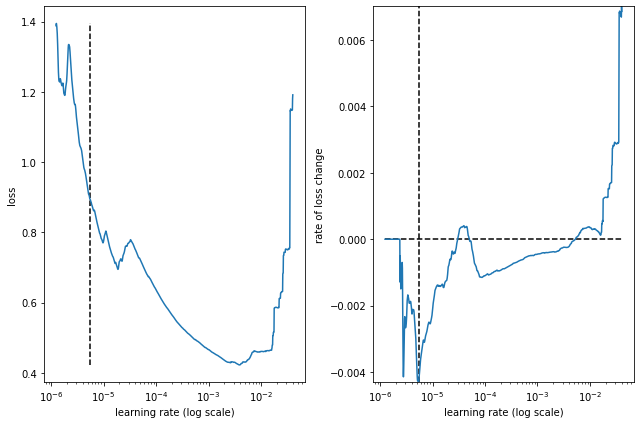

best lr: 5.435483e-06 

Model: "conv2d_dense_12l_48s_16bs_512fm_64f_17ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_58 (Reshape)         (None, 12, 10, 1)         0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 12, 10, 64)        1152      
_________________________________________________________________
flatten_29 (Flatten)         (None, 7680)              0         
_________________________________________________________________
dense_87 (Dense)             (None, 512)               3932672   
_________________________________________________________________
dense_88 (Dense)             (None, 256)               131328    
_________________________________________________________________
dense_89 (Dense)             (None, 48)                12336     
_________________________________________________________________
re

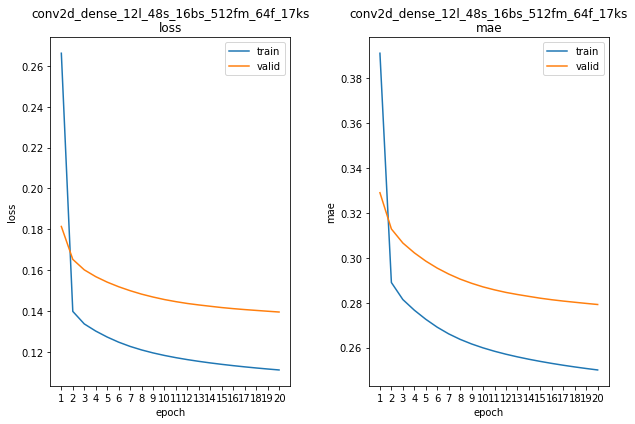

conv2d_dense_12l_48s_16bs_512fm_64f_17ks train min loss: 0.111132	mae: 0.250040	epoch: 20
conv2d_dense_12l_48s_16bs_512fm_64f_17ks valid min loss: 0.139500	mae: 0.279223	epoch: 20

4 of 4
Pandas(Index=2, feat_maps=1024, lags=12)
Epoch 1/5
11760/11760 [==============================] - 8s 670us/step - loss: 1.6839 - mae: 0.5930


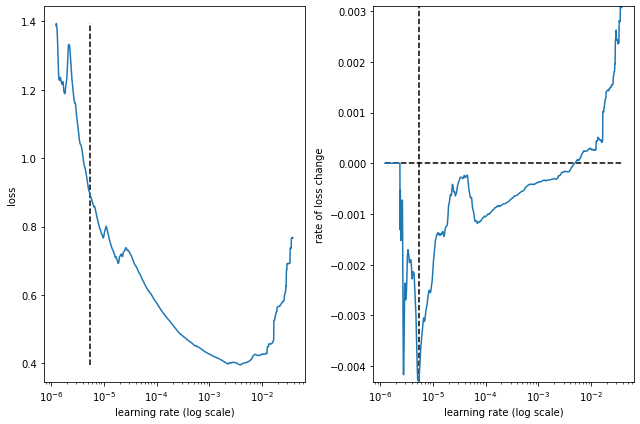

best lr: 5.435483e-06 

Model: "conv2d_dense_12l_48s_16bs_1024fm_64f_17ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_60 (Reshape)         (None, 12, 10, 1)         0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 12, 10, 64)        1152      
_________________________________________________________________
flatten_30 (Flatten)         (None, 7680)              0         
_________________________________________________________________
dense_90 (Dense)             (None, 1024)              7865344   
_________________________________________________________________
dense_91 (Dense)             (None, 512)               524800    
_________________________________________________________________
dense_92 (Dense)             (None, 48)                24624     
_________________________________________________________________
r

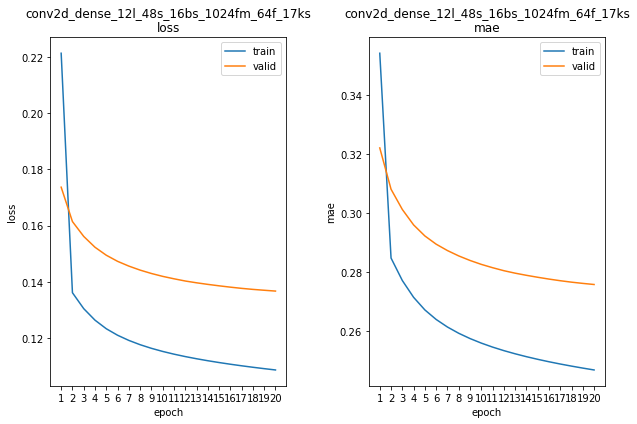

conv2d_dense_12l_48s_16bs_1024fm_64f_17ks train min loss: 0.108632	mae: 0.246811	epoch: 20
conv2d_dense_12l_48s_16bs_1024fm_64f_17ks valid min loss: 0.136683	mae: 0.275761	epoch: 20



[('conv2d_dense_24l_48s_16bs_1024fm_64f_17ks', 0.13239),
 ('conv2d_dense_12l_48s_16bs_1024fm_64f_17ks', 0.13668),
 ('conv2d_dense_12l_48s_16bs_512fm_64f_17ks', 0.1395)]

[('conv2d_dense_24l_48s_16bs_1024fm_64f_17ks', 0.27267),
 ('conv2d_dense_12l_48s_16bs_1024fm_64f_17ks', 0.27576),
 ('conv2d_dense_12l_48s_16bs_512fm_64f_17ks', 0.27922)]

In [ ]:
params = {'xcols':        def_cols,
          'ycols':             'y',
          #'lags':             144, 
          'steps_ahead':        48,
          'stride':             48, 
          'shuffle':          True,
          'bs':                 16,
          'model_type': 'conv2d_dense',
          'mix_type':         'ts',
          'mix_alpha':           4,
          'mix_factor':          0,
          'mix_diff':            1,
          #'feat_maps':         512,
          'filters':            64,
          'kern_size':         17,
          'drop_out':          0.0,
          'kern_reg':          0.0,
          'recu_reg':          0.0,
          'epochs':             20,
          'lrf_params': [0.000001, 10, 32, 5, 100, 25]}


sweep_values = {'feat_maps': [512, 1024],
                'lags':      [ 12,   24]}
models, ks_model_names = random_search_params(models, params, sweep_values, limit = 4)

get_best_models(models, ks_model_names)
get_best_models(models)

display(rank_models(models, 'val_loss', strict = True, limit = 5))
display(rank_models(models, 'val_mae',  strict = True, limit = 5))

1 of 4
Pandas(Index=0, lags=12, kern_size=6)
Epoch 1/5
11760/11760 [==============================] - 8s 611us/step - loss: 18.0667 - mae: 0.7246


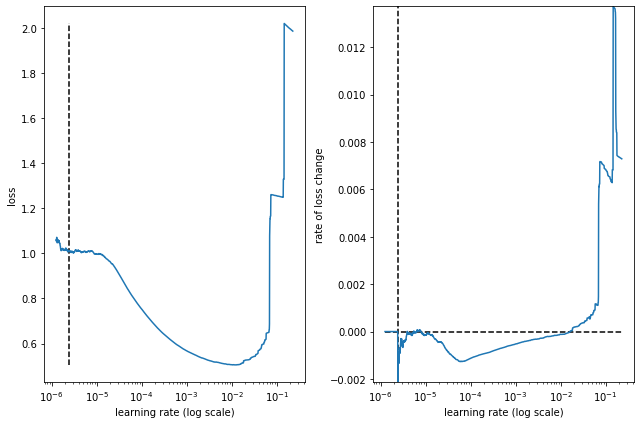

best lr: 2.404099e-06 

Model: "conv2d_dense_12l_48s_16bs_512fm_64f_6ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_62 (Reshape)         (None, 12, 10, 1)         0         
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 12, 10, 64)        448       
_________________________________________________________________
flatten_31 (Flatten)         (None, 7680)              0         
_________________________________________________________________
dense_93 (Dense)             (None, 512)               3932672   
_________________________________________________________________
dense_94 (Dense)             (None, 256)               131328    
_________________________________________________________________
dense_95 (Dense)             (None, 48)                12336     
_________________________________________________________________
res

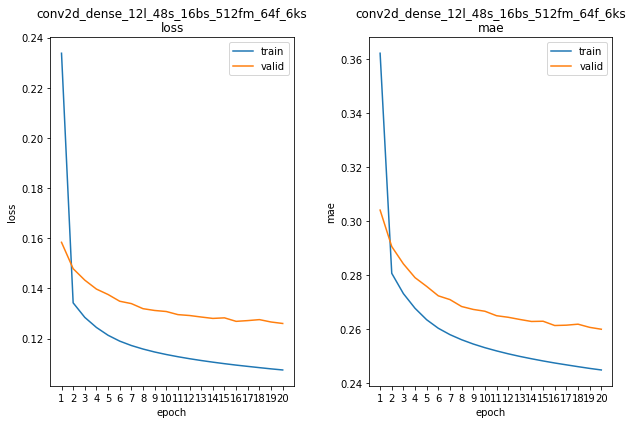

conv2d_dense_12l_48s_16bs_512fm_64f_6ks train min loss: 0.107466	mae: 0.244809	epoch: 20
conv2d_dense_12l_48s_16bs_512fm_64f_6ks valid min loss: 0.126008	mae: 0.259907	epoch: 20

2 of 4
Pandas(Index=1, lags=12, kern_size=9)
Epoch 1/5
11760/11760 [==============================] - 7s 548us/step - loss: 1.8230 - mae: 0.6160


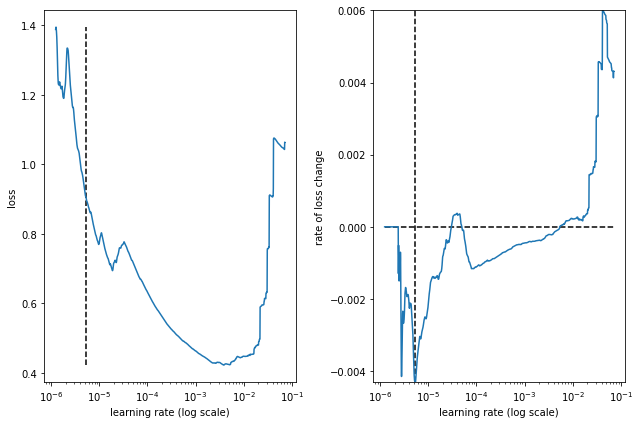

best lr: 5.435483e-06 

Model: "conv2d_dense_12l_48s_16bs_512fm_64f_9ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_64 (Reshape)         (None, 12, 10, 1)         0         
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 12, 10, 64)        640       
_________________________________________________________________
flatten_32 (Flatten)         (None, 7680)              0         
_________________________________________________________________
dense_96 (Dense)             (None, 512)               3932672   
_________________________________________________________________
dense_97 (Dense)             (None, 256)               131328    
_________________________________________________________________
dense_98 (Dense)             (None, 48)                12336     
_________________________________________________________________
res

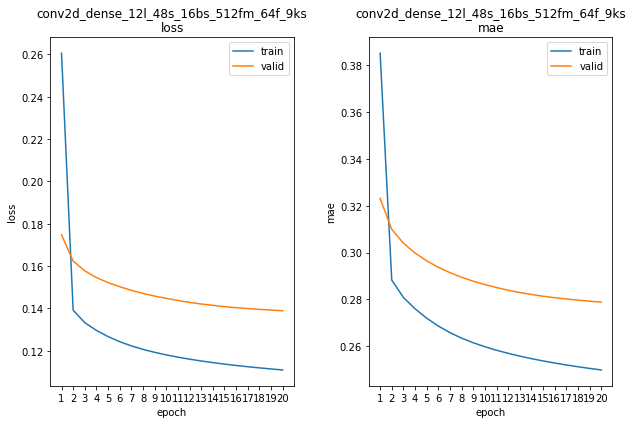

conv2d_dense_12l_48s_16bs_512fm_64f_9ks train min loss: 0.110897	mae: 0.249871	epoch: 20
conv2d_dense_12l_48s_16bs_512fm_64f_9ks valid min loss: 0.138881	mae: 0.278825	epoch: 20

3 of 4
Pandas(Index=5, lags=24, kern_size=17)
Epoch 1/5
11759/11759 [==============================] - 8s 665us/step - loss: 1.6410 - mae: 0.6465


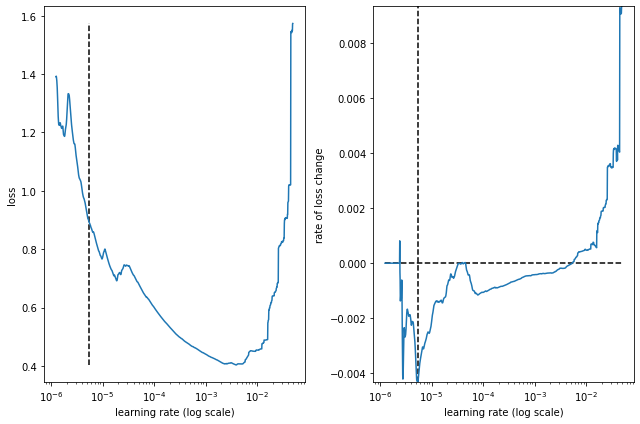

best lr: 5.3887843e-06 

Model: "conv2d_dense_24l_48s_16bs_512fm_64f_17ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_66 (Reshape)         (None, 24, 10, 1)         0         
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 24, 10, 64)        1152      
_________________________________________________________________
flatten_33 (Flatten)         (None, 15360)             0         
_________________________________________________________________
dense_99 (Dense)             (None, 512)               7864832   
_________________________________________________________________
dense_100 (Dense)            (None, 256)               131328    
_________________________________________________________________
dense_101 (Dense)            (None, 48)                12336     
_________________________________________________________________
r

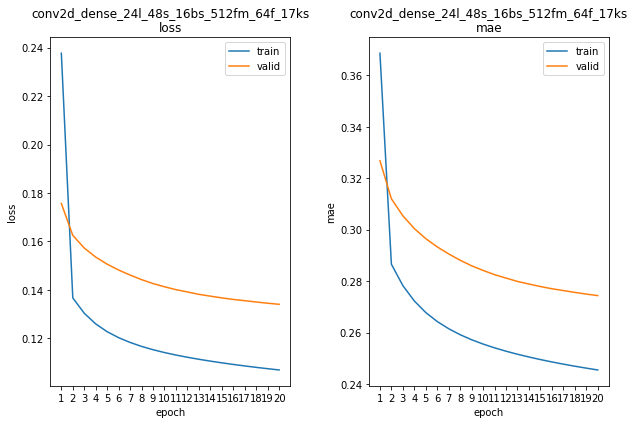

conv2d_dense_24l_48s_16bs_512fm_64f_17ks train min loss: 0.106897	mae: 0.245439	epoch: 20
conv2d_dense_24l_48s_16bs_512fm_64f_17ks valid min loss: 0.134014	mae: 0.274352	epoch: 20

4 of 4
Pandas(Index=2, lags=12, kern_size=17)
Epoch 1/5
11760/11760 [==============================] - 7s 562us/step - loss: 1.8927 - mae: 0.6234


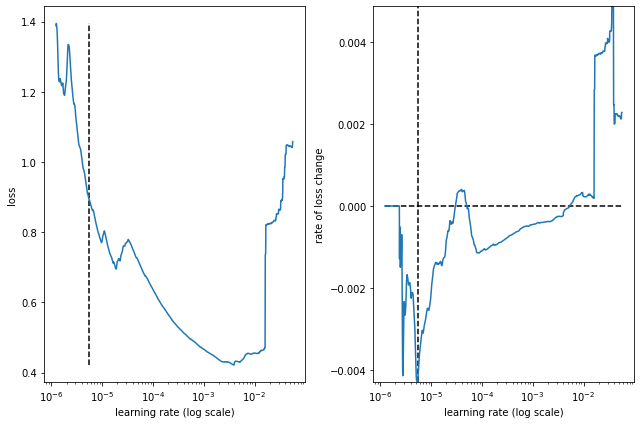

best lr: 5.435483e-06 

Model: "conv2d_dense_12l_48s_16bs_512fm_64f_17ks"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_68 (Reshape)         (None, 12, 10, 1)         0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 12, 10, 64)        1152      
_________________________________________________________________
flatten_34 (Flatten)         (None, 7680)              0         
_________________________________________________________________
dense_102 (Dense)            (None, 512)               3932672   
_________________________________________________________________
dense_103 (Dense)            (None, 256)               131328    
_________________________________________________________________
dense_104 (Dense)            (None, 48)                12336     
_________________________________________________________________
re

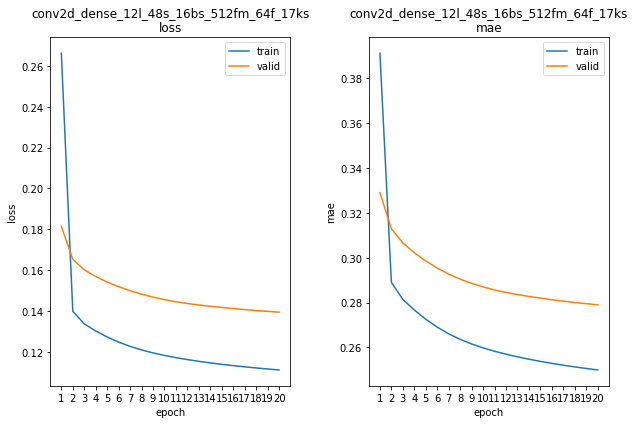

conv2d_dense_12l_48s_16bs_512fm_64f_17ks train min loss: 0.111067	mae: 0.249936	epoch: 20
conv2d_dense_12l_48s_16bs_512fm_64f_17ks valid min loss: 0.139376	mae: 0.279018	epoch: 20



[('conv2d_dense_24l_48s_16bs_1024fm_64f_17ks', 0.13239),
 ('conv2d_dense_24l_48s_16bs_512fm_64f_17ks', 0.13401),
 ('conv2d_dense_12l_48s_16bs_1024fm_64f_17ks', 0.13668),
 ('conv2d_dense_12l_48s_16bs_512fm_64f_9ks', 0.13888),
 ('conv2d_dense_12l_48s_16bs_512fm_64f_17ks', 0.13938)]

[('conv2d_dense_24l_48s_16bs_1024fm_64f_17ks', 0.27267),
 ('conv2d_dense_24l_48s_16bs_512fm_64f_17ks', 0.27435),
 ('conv2d_dense_12l_48s_16bs_1024fm_64f_17ks', 0.27576),
 ('conv2d_dense_12l_48s_16bs_512fm_64f_9ks', 0.27883),
 ('conv2d_dense_12l_48s_16bs_512fm_64f_17ks', 0.27902)]

In [ ]:
params = {'xcols':        def_cols,
          'ycols':             'y',
          #'lags':             144, 
          'steps_ahead':        48,
          'stride':             48, 
          'shuffle':          True,
          'bs':                 16,
          'model_type': 'conv2d_dense',
          'mix_type':         'ts',
          'mix_alpha':           4,
          'mix_factor':          0,
          'mix_diff':            1,
          'feat_maps':         512,
          'filters':            64,
          #'kern_size':         17,
          'drop_out':          0.0,
          'kern_reg':          0.0,
          'recu_reg':          0.0,
          'epochs':             20,
          'lrf_params': [0.000001, 10, 32, 5, 100, 25]}


sweep_values = {'lags':      [12, 24],
                'kern_size': [6, 9, 17]}
models, ks_model_names = random_search_params(models, params, sweep_values, limit = 4)

get_best_models(models, ks_model_names)
get_best_models(models)

display(rank_models(models, 'val_loss', strict = True, limit = 5))
display(rank_models(models, 'val_mae',  strict = True, limit = 5))

...

---

### Comparison with baselines

**TODO** Replace LSTM with CNN results

|     |        || LSTM   |       || VAR    |       |
|-----|--------||--------|-------||--------|-------|
|**h**|**hour**||**rmse**|**mae**||**rmse**|**mae**|
|   1 |    0.5 ||  0.53  |  0.26 ||  0.39  |  0.39 |
|   4 |    2   ||  0.8   |  0.39 ||  0.75  |  0.66 |
|  12 |    6   ||  1.31  |  0.66 ||  1.45  |  1.24 |
|  24 |   12   ||  1.69  |  0.91 ||  1.99  |  1.66 |
|  48 |   24   ||  2.09  |  1.2  ||  2.45  |	1.89 |
|  96 |   48   ||  2.61  |  1.56 ||  ...   |  ...  |

h is the prediction horizon or steps ahead.

...

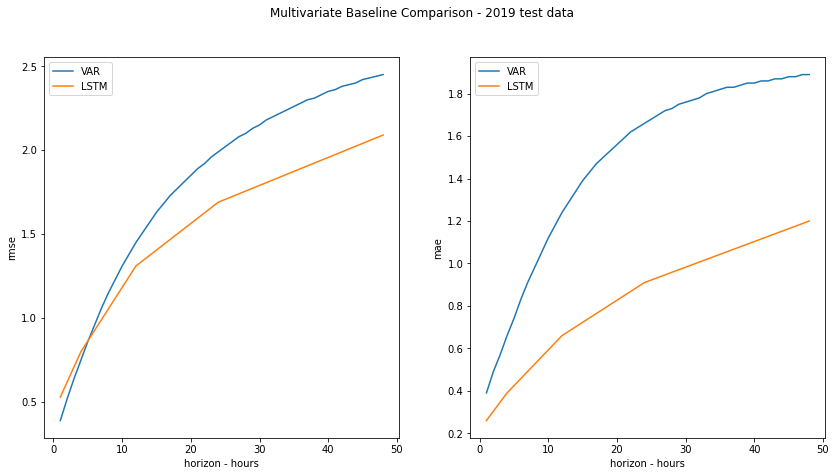

In [ ]:
def plot_metrics(metrics, main_title):
  fig, axs = plt.subplots(1, 2, figsize = (14, 7))
  fig.suptitle(main_title)
  axs = axs.ravel()  # APL ftw!

  methods = metrics.method.unique()

  for method in methods:
    df = metrics.query('metric == "rmse" & method == "%s"' % method)
    axs[0].plot(df.horizon, df.value)
  axs[0].set_xlabel("horizon - hours")
  axs[0].set_ylabel("rmse")
  axs[0].legend(methods)

  for method in methods:
    df = metrics.query('metric == "mae" & method == "%s"' % method)
    axs[1].plot(df.horizon, df.value)
  axs[1].set_xlabel("horizon - hours")
  axs[1].set_ylabel("mae")
  axs[1].legend(methods);


var_rmse = np.array([0.39, 0.52, 0.64, 0.75, 0.86, 0.96, 1.06, 1.15, 1.23, 1.31, 1.38,
       1.45, 1.51, 1.57, 1.63, 1.68, 1.73, 1.77, 1.81, 1.85, 1.89, 1.92,
       1.96, 1.99, 2.02, 2.05, 2.08, 2.1 , 2.13, 2.15, 2.18, 2.2 , 2.22,
       2.24, 2.26, 2.28, 2.3 , 2.31, 2.33, 2.35, 2.36, 2.38, 2.39, 2.4 ,
       2.42, 2.43, 2.44, 2.45])
var_mae = np.array([0.39, 0.49, 0.57, 0.66, 0.74, 0.83, 0.91, 0.98, 1.05, 1.12, 1.18,
       1.24, 1.29, 1.34, 1.39, 1.43, 1.47, 1.5 , 1.53, 1.56, 1.59, 1.62,
       1.64, 1.66, 1.68, 1.7 , 1.72, 1.73, 1.75, 1.76, 1.77, 1.78, 1.8 ,
       1.81, 1.82, 1.83, 1.83, 1.84, 1.85, 1.85, 1.86, 1.86, 1.87, 1.87,
       1.88, 1.88, 1.89, 1.89])
var_raw = {'type':    np.repeat('multivariate', 96),
       'method':  np.repeat('VAR', 96),
       'metric':  np.concatenate((np.repeat('rmse', 48), np.repeat('mae', 48))),
       'horizon': np.tile(range(1, 49), 2),
       'value':   np.concatenate((var_rmse, var_mae))}
var_metrics = pd.DataFrame(data = var_raw)

lstm_raw = {'type':    np.repeat('multivariate', 10),
       'method':  np.repeat('LSTM', 10),
       'metric':  np.concatenate((np.repeat('rmse', 5), np.repeat('mae', 5))),
       'horizon': np.array([1, 4, 12, 24, 48, 1, 4, 12, 24, 48]),
       'value':   np.array([0.53, 0.8, 1.31, 1.69, 2.09, 0.26, 0.39, 0.66, 0.91, 1.2])}
lstm_metrics = pd.DataFrame(lstm_raw)

metrics = pd.concat([var_metrics, lstm_metrics])

plot_metrics(metrics, "Multivariate Baseline Comparison - 2019 test data")

...

---


## Conclusion

Fortunately, ...

On an unrelated matter, ...

Future work:
 * ...
 * Further optimise model and data parameters
   * Lags
     * {1-24, 1-48} plus zero or more of {48, 96, 144, 192, 240, 288, 336}
   * Seasonal components
     * One-hot encoded month variables
     * The [Short Time Fourier Transform (STFT)](https://en.wikipedia.org/wiki/Short-time_Fourier_transform) may be a good option for modeling the daily seasonality
       * It is available in [scipy](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.stft.html)
  * Add seasonal components as exogenous variables
       * [for example](https://www.angioi.com/time-series-encoder-decoder-tensorflow/)
   * Batch mixup
     * Probably only time series mixup
   * ...
 * ...
 * Additional architectures to examine
   * [ConvLSTM1D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/ConvLSTM2D) Keras 1D Convolutional LSTM  (input transformations and recurrent transformations are both convolutional) which includes support for [dilated convolution](https://towardsdatascience.com/understanding-2d-dilated-convolution-operation-with-examples-in-numpy-and-tensorflow-with-d376b3972b25)
     * as of 12/07/21 only available in tf-nightly :-(
   * [ConvLSTM2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/ConvLSTM2D) Keras 2D Convolutional LSTM layer - thought to perform well for weather forecasting where inputs are timeseries of 2D grids of sensor values
     * not directly relevant for the data used in this notebook
     * requires additional data from [ISD](https://www.ncdc.noaa.gov/isd) and/or other [NOAA sources](https://www.ncdc.noaa.gov/data-access/land-based-station-data/land-based-datasets)
     * [Keras conv LSTM tutorial](https://keras.io/examples/vision/conv_lstm/)
 * ...

---

## Metadata

Python and Jupyter versions plus modules imported and their version strings. 
This is the poor man's python equivalent of R's sessionInfo().

Code for imported modules and versions adapted from this stackoverflow answer. 
There are simpler alternatives, such as watermark, but they all require installation.

In [13]:
import sys
import IPython

print("Python version:")
print(sys.executable)
print(sys.version)
print("\nIPython version:")
print(IPython.__version__)

Python version:
/usr/bin/python3
3.7.13 (default, Apr 24 2022, 01:04:09) 
[GCC 7.5.0]

IPython version:
5.5.0


In [14]:
import pkg_resources
import types

def get_imports():
    for name, val in globals().items():
        if isinstance(val, types.ModuleType):
            # Split ensures you get root package, 
            # not just imported function
            name = val.__name__.split(".")[0]

        elif isinstance(val, type):
            name = val.__module__.split(".")[0]

        # Some packages are weird and have different
        # imported names vs. system/pip names.  Unfortunately,
        # there is no systematic way to get pip names from
        # a package's imported name.  You'll have to add
        # exceptions to this list manually!
        poorly_named_packages = {
            "PIL":       "Pillow",
            "sklearn":   "scikit-learn",
        }
        if name in poorly_named_packages.keys():
            name = poorly_named_packages[name]

        yield name

imports = list(set(get_imports()))

# The only way I found to get the version of the root package
# from only the name of the package is to cross-check the names 
# of installed packages vs. imported packages
requirements = []
for m in pkg_resources.working_set:
    if m.project_name in imports and m.project_name != "pip":
        requirements.append((m.project_name, m.version))

reqs = pd.DataFrame(requirements, columns = ['name', 'version'])
print("Imported modules:")
reqs.style.hide_index()

Imported modules:


name,version
tensorflow,2.8.2+zzzcolab20220527125636
seaborn,0.11.2
scikit-learn,1.0.2
pandas,1.3.5
numpy,1.21.6
matplotlib,3.2.2
keras,2.8.0


In [15]:
!lscpu

Architecture:        x86_64
CPU op-mode(s):      32-bit, 64-bit
Byte Order:          Little Endian
CPU(s):              2
On-line CPU(s) list: 0,1
Thread(s) per core:  2
Core(s) per socket:  1
Socket(s):           1
NUMA node(s):        1
Vendor ID:           GenuineIntel
CPU family:          6
Model:               85
Model name:          Intel(R) Xeon(R) CPU @ 2.00GHz
Stepping:            3
CPU MHz:             2000.178
BogoMIPS:            4000.35
Hypervisor vendor:   KVM
Virtualization type: full
L1d cache:           32K
L1i cache:           32K
L2 cache:            1024K
L3 cache:            39424K
NUMA node0 CPU(s):   0,1
Flags:               fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_si

In [16]:
!date

Sat Jun 18 14:10:54 UTC 2022


---


## Archival

Archive code, markdown, history and formatted notebooks.

Assumes all pdf, html, latex etc dependencies are installed.

**WARNING** Will overwrite existing files.

Notebook name is hardcoded below because the alternative is ghastly globs of unreliable javascript or external ipython libraries I'd prefer to avoid installing :-(

In [ ]:
from time import sleep

notebook = "cammet_baselines_2021.ipynb"
# !jupyter nbconvert --to script {notebook}
# !jupyter nbconvert --execute --to html {notebook}
# !jupyter nbconvert --execute --to pdf {notebook}
# !jupyter nbconvert --to pdf {notebook}

%rm history.txt
%history -f history.txt

!jupyter nbconvert --to python {notebook}
sleep(5)
!jupyter nbconvert --to markdown {notebook}
sleep(5)
!jupyter nbconvert --to html {notebook}